In [1]:
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

In [2]:
from flowability_data_upload.local.generate_datasets.loaddata import load_data
import flowability_data_upload.local.preprocess as preprocess
from flowability_data_upload.local.generate_datasets import VirtualPowderMixing as powderMixer
from flowability_data_upload.local.generate_datasets import TrainAndTestSetGenerator as testSetGenerator

In [3]:
import colordict as cd
import seaborn as sns

In [4]:
# this is my workspace

from flowability_data_upload.local.generate_datasets.loaddata import load_data
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [5]:

data = load_data()

Sync Info:	
Last Sync Time (Server Time): 2021-07-06 15:45:15.736347	
Upload Time of Last Added File: 2020-12-07 20:44:26.554000
Data Sync Status:  True
__________________________________________________________________
Loading Local Data...


In [6]:
type(data)
data

,sample_id,name,Id,Img Id,Da,Dp,FWidth,FLength,ELength,EWidth,...,Filter4,Filter5,Filter6,L/W Ratio,W/L Aspect Ratio,CHull Surface Area,Ellipticity,Fiber Length,Fiber Width,flowability
0,125833a9-89a2-41bd-ab49-cff7c1600ce1,HC Starck C103H (10-45) Particles,69745,500,130.420,137.901,127.571,144.732,135.160,126.204,...,Reject,Reject,Reject,1.135,0.881,54531.951,1.071,0.0,0.0,0.00
1,125833a9-89a2-41bd-ab49-cff7c1600ce1,HC Starck C103H (10-45) Particles,26035,185,121.500,122.698,120.017,123.997,122.892,120.132,...,Reject,Reject,Reject,1.033,0.968,46577.919,1.023,0.0,0.0,0.00
2,125833a9-89a2-41bd-ab49-cff7c1600ce1,HC Starck C103H (10-45) Particles,17960,127,106.932,107.965,106.426,108.136,107.196,106.665,...,Reject,Reject,Reject,1.016,0.984,36065.966,1.005,0.0,0.0,0.00
3,125833a9-89a2-41bd-ab49-cff7c1600ce1,HC Starck C103H (10-45) Particles,84140,604,94.485,107.182,90.805,115.103,101.993,89.698,...,Reject,Reject,Reject,1.268,0.789,29928.731,1.137,0.0,0.0,0.00
4,125833a9-89a2-41bd-ab49-cff7c1600ce1,HC Starck C103H (10-45) Particles,10501,73,84.929,86.578,84.724,86.326,84.960,84.894,...,Reject,Reject,Reject,1.019,0.981,22849.100,1.001,0.0,0.0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1947269,3714e4ba-0cc3-4d32-8514-3d654ae60319,S14B3_4420_Excel,25435,367,3.591,3.794,3.095,4.204,3.996,3.041,...,Reject,Reject,Reject,1.358,0.736,40.506,1.314,0.0,0.0,35.51
1947270,3714e4ba-0cc3-4d32-8514-3d654ae60319,S14B3_4420_Excel,23193,334,3.708,3.989,3.051,4.512,4.140,3.094,...,Reject,Reject,Reject,1.479,0.676,43.402,1.338,0.0,0.0,35.51
1947271,3714e4ba-0cc3-4d32-8514-3d654ae60319,S14B3_4420_Excel,2635,38,3.472,3.709,3.048,4.077,3.692,3.026,...,Reject,Reject,Reject,1.337,0.748,37.866,1.220,0.0,0.0,35.51
1947272,3714e4ba-0cc3-4d32-8514-3d654ae60319,S14B3_4420_Excel,25695,371,3.395,3.712,3.048,4.615,4.007,2.803,...,Reject,Reject,Reject,1.514,0.661,36.221,1.430,0.0,0.0,35.51


In [16]:
print(data.axes)

[RangeIndex(start=0, stop=1947274, step=1), Index(['sample_id', 'name', 'Id', 'Img Id', 'Da', 'Dp', 'FWidth', 'FLength',
       'ELength', 'EWidth', 'Volume', 'Area', 'Perimeter', 'CHull  Area',
       'CHull Perimeter', 'Sphericity', 'Compactness', 'Roundness',
       'Ellipse Ratio', 'Circularity', 'Solidity', 'Concavity', 'Convexity',
       'Extent', 'hash', 'Transparency', 'Curvature', 'Surface Area',
       'Filter0', 'Filter1', 'Filter2', 'Filter3', 'Filter4', 'Filter5',
       'Filter6', 'L/W Ratio', 'W/L Aspect Ratio', 'CHull Surface Area',
       'Ellipticity', 'Fiber Length', 'Fiber Width', 'flowability'],
      dtype='object')]


In [7]:
sample_ids = data['sample_id'].unique()
for sample_id in sample_ids:
    flowability = data[data.sample_id == sample_id].iloc[0].flowability
    name = data[data.sample_id == sample_id].iloc[0][data.columns[1]]
    number_of_particles = len(data[data.sample_id == sample_id])
    print("NAME: ", name, "FLOW:", flowability, "ID:", sample_id)

NAME:  HC Starck C103H (10-45) Particles FLOW: 0.0 ID: 125833a9-89a2-41bd-ab49-cff7c1600ce1
NAME:  HC Starck C103N 1st (10-45) Particles FLOW: 0.0 ID: faa13c82-0847-4652-aefd-d08862f38250
NAME:  HC Starck C103N 2nd (10-45) Particles FLOW: 0.0 ID: b92d4987-436a-469e-9e78-67e4e2d00648
NAME:  HC Starck TaH (170-230) Particles.xls FLOW: 4.1666 ID: 72b9824a-3d86-4557-9bb7-a22c34f74b5f
NAME:  I-718 (63-150) Particles FLOW: 16.29 ID: c1adc55e-0821-4408-b379-2d51b8e5c9ef
NAME:  Inconel 718 (0-63) Particles FLOW: 14.12 ID: 2fe1c429-aae7-406a-9178-4cae6716cc96
NAME:  SS-17-4 (10-45) Particles FLOW: 14.3 ID: f28c1c6a-43d5-41cd-bd8b-10df1e639381
NAME:  SS-17-4 (64-150) Particles FLOW: 16.1 ID: 7a1edf53-720b-4c9c-8516-d8ebdd038571
NAME:  Ti-5Al-5V-5Mo-3Cr (0-75) Particles FLOW: 3.78 ID: a19b8ce3-991e-4961-b7ea-5c4b9c1a6253
NAME:  Ti-64 (150-350) Particles FLOW: 56.12 ID: acb2f55f-3cf4-4c85-ad51-6637a21dcad4
NAME:  Ti-Nb (0-63) Particles FLOW: 2.54 ID: 4d9d565d-98b4-4d5c-bb60-82a8d0c45abf
NAME:  Ti-

In [8]:
#Clean and preprocess data
data = preprocess.clean(data)
data = preprocess.remove_duplicate_powders(data)

In [49]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
# create TensorFlow variables
const = tf.Variable(2.0, name="const")
b = tf.Variable(2.0, name='b')
c = tf.Variable(1.0, name='c')

In [11]:
def preprocess(x, y):
  x = tf.cast(x, tf.float32) / 255.0
  y = tf.cast(y, tf.int64)

  return x, y

def create_dataset(xs, ys, n_classes=10):
  ys = tf.one_hot(ys, depth=n_classes)
  return tf.data.Dataset.from_tensor_slices((xs, ys)) \
    .map(preprocess) \
    .shuffle(len(ys)) \
    .batch(128)

In [18]:
datan = data.drop(columns=["name", "sample_id"])
datan


,Da,Dp,FWidth,FLength,ELength,EWidth,Volume,Area,Perimeter,CHull Area,...,Transparency,Curvature,Surface Area,L/W Ratio,W/L Aspect Ratio,CHull Surface Area,Ellipticity,Fiber Length,Fiber Width,flowability
0,130.420,137.901,127.571,144.732,135.160,126.204,1161540.824,13359.199,433.228,13632.988,...,0.156,0.0,53436.797,1.135,0.881,54531.951,1.071,0.0,0.0,0.00
1,121.500,122.698,120.017,123.997,122.892,120.132,939140.686,11594.301,385.467,11644.480,...,0.148,0.0,46377.204,1.033,0.968,46577.919,1.023,0.0,0.0,0.00
2,106.932,107.965,106.426,108.136,107.196,106.665,640206.991,8980.581,339.182,9016.491,...,0.157,0.0,35922.322,1.016,0.984,36065.966,1.005,0.0,0.0,0.00
3,94.485,107.182,90.805,115.103,101.993,89.698,441665.721,7011.645,336.721,7482.183,...,0.218,0.0,28046.582,1.268,0.789,29928.731,1.137,0.0,0.0,0.00
4,84.929,86.578,84.724,86.326,84.960,84.894,320754.683,5665.081,271.994,5712.275,...,0.171,0.0,22660.324,1.019,0.981,22849.100,1.001,0.0,0.0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495744,3.591,3.794,3.095,4.204,3.996,3.041,24.241,10.127,11.919,10.127,...,0.395,0.0,40.506,1.358,0.736,40.506,1.314,0.0,0.0,35.51
1495745,3.708,3.989,3.051,4.512,4.140,3.094,26.697,10.799,12.533,10.851,...,0.412,0.0,43.197,1.479,0.676,43.402,1.338,0.0,0.0,35.51
1495746,3.472,3.709,3.048,4.077,3.692,3.026,21.910,9.466,11.654,9.466,...,0.439,0.0,37.866,1.337,0.748,37.866,1.220,0.0,0.0,35.51
1495747,3.395,3.712,3.048,4.615,4.007,2.803,20.498,9.055,11.663,9.055,...,0.418,0.0,36.221,1.514,0.661,36.221,1.430,0.0,0.0,35.51


In [19]:

train_dataset = create_dataset(datan.drop(columns = "flowability"), datan["flowability"])
val_dataset = create_dataset(datan.drop(columns = "flowability"), datan["flowability"])

In [56]:
model = keras.Sequential([
    keras.layers.Reshape(target_shape=((len(datan.columns))-1,), input_shape=(len(datan.columns)-1, 1)),
    keras.layers.Dense(units=256, activation='relu'),
    keras.layers.Dense(units=192, activation='relu'),
    keras.layers.Dense(units=128, activation='relu'),
    keras.layers.Dense(units=10, activation='softmax')
])

In [ ]:
inputs = keras.Input(shape=(784,))

In [57]:
model.compile(optimizer='adam', 
              loss=tf.losses.CategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

history = model.fit(
    train_dataset.repeat(), 
    epochs=10, 
    steps_per_epoch=500,
    validation_data=val_dataset.repeat(), 
    validation_steps=2
)

Epoch 1/10
500/500 [==============================] - 121s 242ms/step - loss: 0.7945 - accuracy: 0.8982 - val_loss: 0.7709 - val_accuracy: 0.9141
Epoch 2/10
500/500 [==============================] - 107s 215ms/step - loss: 0.7883 - accuracy: 0.9012 - val_loss: 0.8150 - val_accuracy: 0.8984
Epoch 3/10
500/500 [==============================] - 105s 209ms/step - loss: 0.7879 - accuracy: 0.9005 - val_loss: 0.7621 - val_accuracy: 0.8828
Epoch 4/10
500/500 [==============================] - 125s 250ms/step - loss: 0.7852 - accuracy: 0.8989 - val_loss: 0.8508 - val_accuracy: 0.9141
Epoch 5/10
500/500 [==============================] - 116s 233ms/step - loss: 0.7895 - accuracy: 0.8988 - val_loss: 0.8054 - val_accuracy: 0.9023
Epoch 6/10
500/500 [==============================] - 124s 248ms/step - loss: 0.7952 - accuracy: 0.8984 - val_loss: 0.7159 - val_accuracy: 0.9062
Epoch 7/10
500/500 [==============================] - 102s 204ms/step - loss: 0.7954 - accuracy: 0.8979 - val_loss: 0.7985 -

In [31]:

predictions = model.predict(val_dataset)

In [43]:
predictions

array([[1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       ...,
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [47]:
something = np.argmax(predictions)

In [48]:
something

0

4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


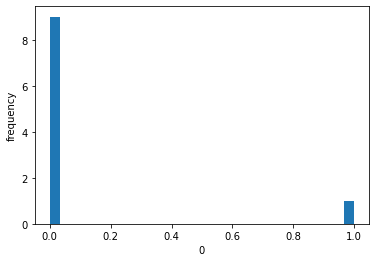

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


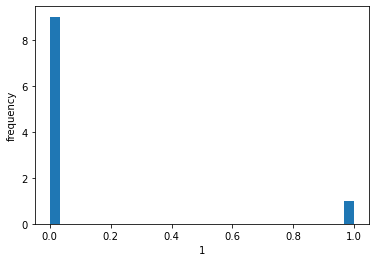

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


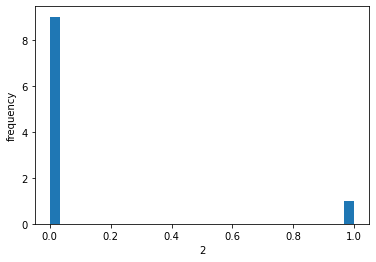

6
4
[1.0000000e+00 8.6104075e-18 1.7023530e-18 2.3438293e-18 7.3097885e-18
 9.6237584e-18 7.0251167e-18 3.6429981e-18 9.9332654e-18 6.6277938e-18]
5


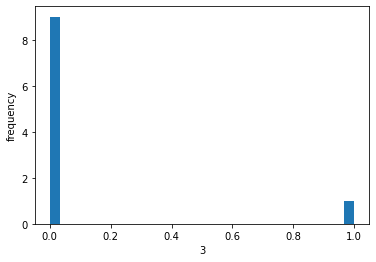

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


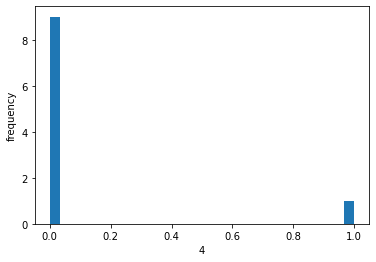

6
4
[1.0000000e+00 1.5168482e-13 4.6997474e-14 5.8980429e-14 1.3893758e-13
 1.6938843e-13 1.3269002e-13 8.1324324e-14 1.7287929e-13 1.2857692e-13]
5


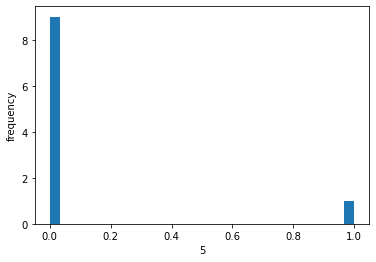

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


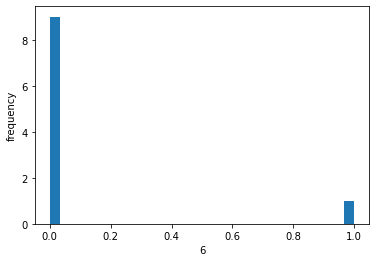

6
4
[1.0000000e+00 4.7828017e-09 2.3361100e-09 2.6742233e-09 4.6744590e-09
 5.2657803e-09 4.4723012e-09 3.2816616e-09 5.3206106e-09 4.4470632e-09]
5


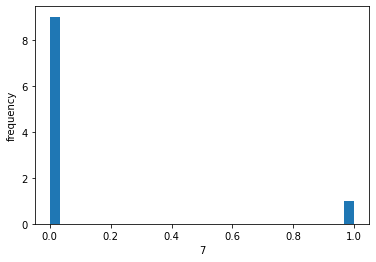

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


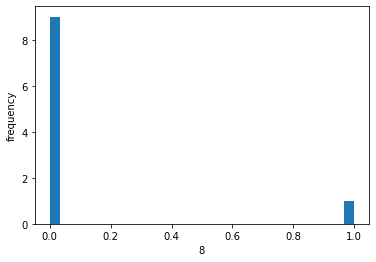

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


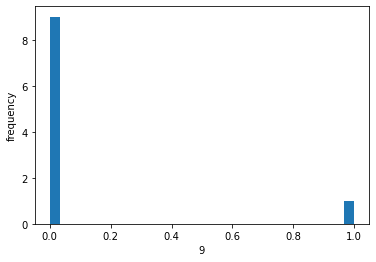

6
4
[1.00000000e+00 2.46963722e-31 1.09155105e-32 2.03366150e-32
 1.54309142e-31 2.63064069e-31 1.58639992e-31 4.79371416e-32
 2.89793588e-31 1.33766743e-31]
5


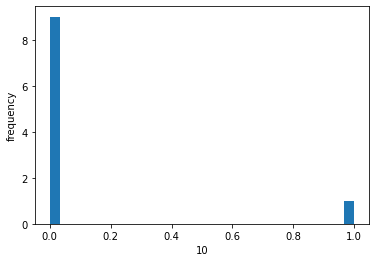

6
4
[1.0000000e+00 2.1188566e-09 1.0001365e-09 1.1528443e-09 2.0636122e-09
 2.3379865e-09 1.9728832e-09 1.4264183e-09 2.3638185e-09 1.9573099e-09]
5


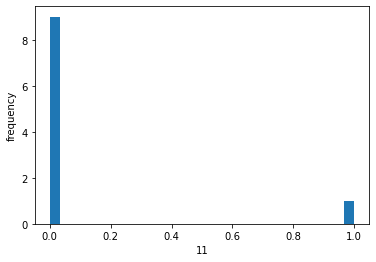

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


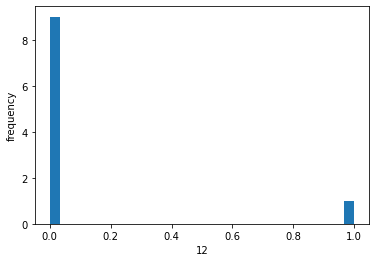

6
4
[1.0000000e+00 7.6549217e-19 1.3496027e-19 1.9035353e-19 6.3576378e-19
 8.5391282e-19 6.1353418e-19 3.0509867e-19 8.8461559e-19 5.7401428e-19]
5


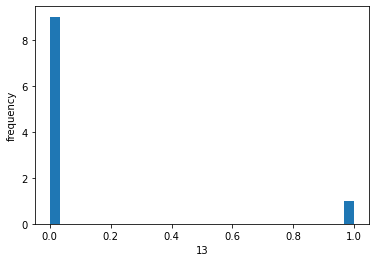

6
4
[1.0000000e+00 9.8229081e-12 3.6686557e-12 4.4337680e-12 9.2631597e-12
 1.0932463e-11 8.8400311e-12 5.8206239e-12 1.1110408e-11 8.6535536e-12]
5


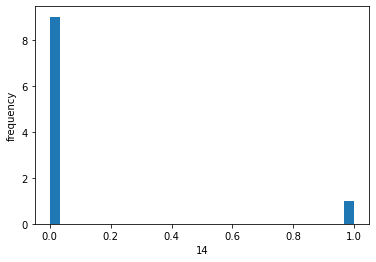

6
4
[1.0000000e+00 2.0553310e-21 2.7447278e-22 4.0967059e-22 1.6216452e-21
 2.2824328e-21 1.5779100e-21 7.0918520e-22 2.3877570e-21 1.4478943e-21]
5


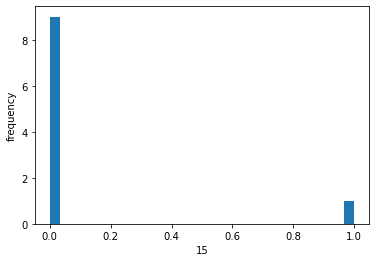

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


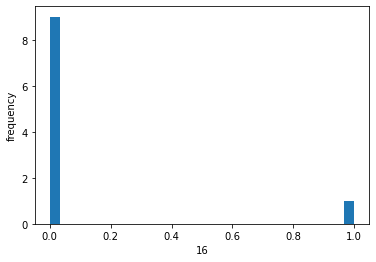

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


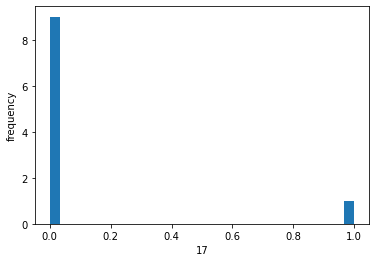

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


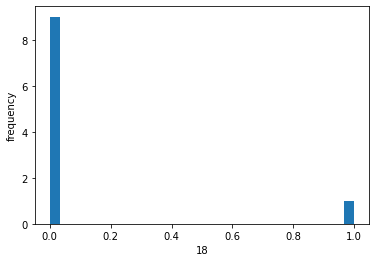

6
4
[1.0000000e+00 2.5647512e-20 3.8528490e-21 5.6144440e-21 2.0667873e-20
 2.8520984e-20 2.0038715e-20 9.4082004e-21 2.9718738e-20 1.8545441e-20]
5


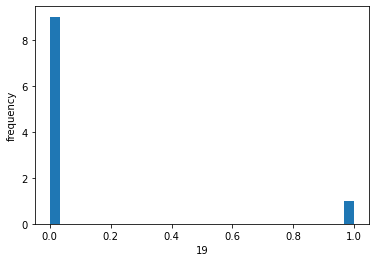

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


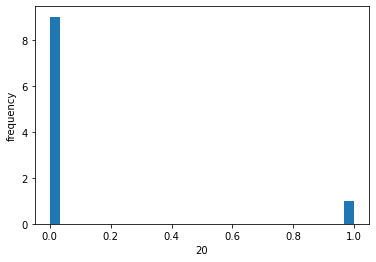

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


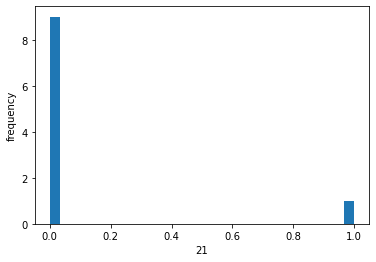

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


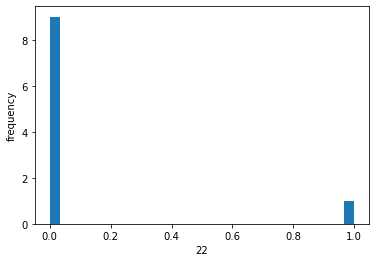

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


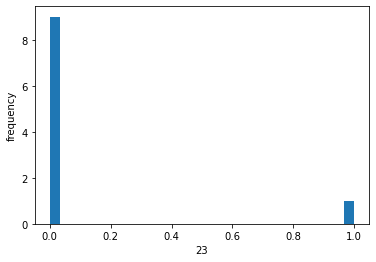

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


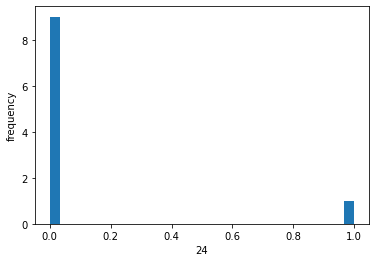

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


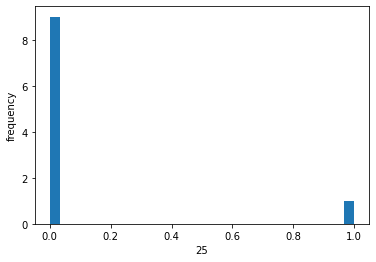

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


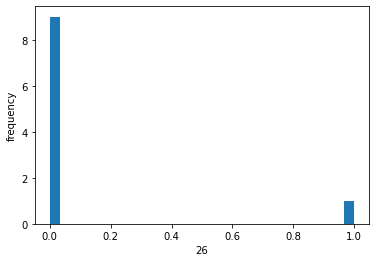

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


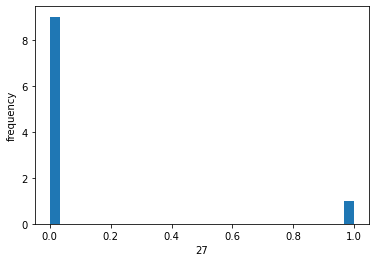

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


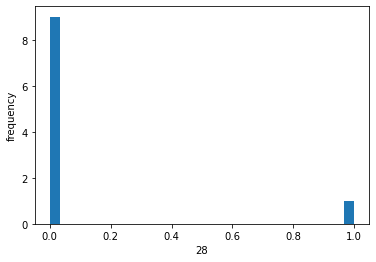

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


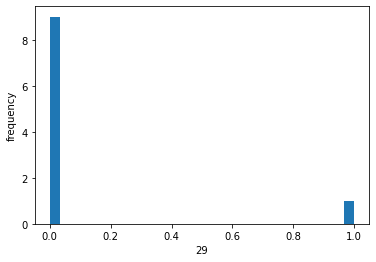

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


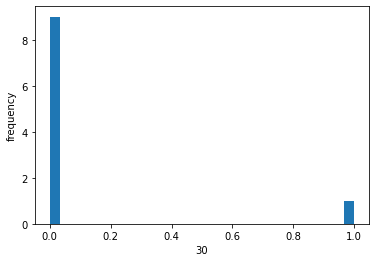

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


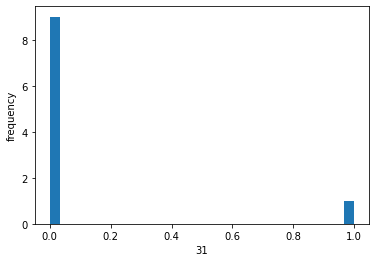

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


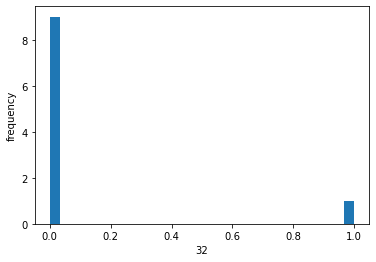

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


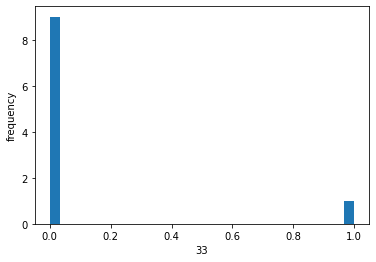

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


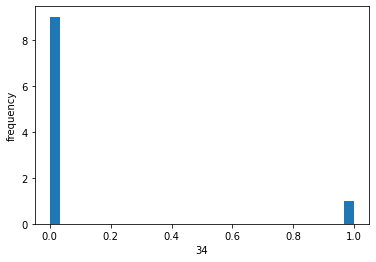

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


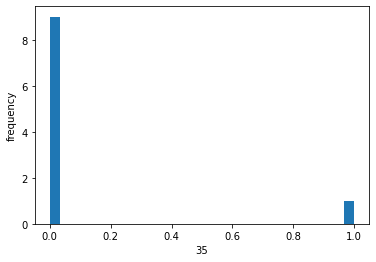

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


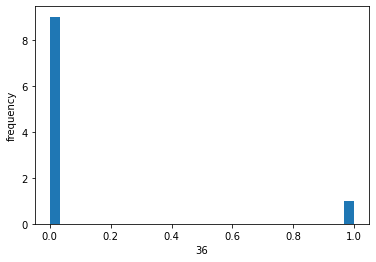

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


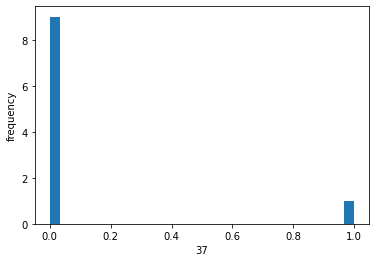

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


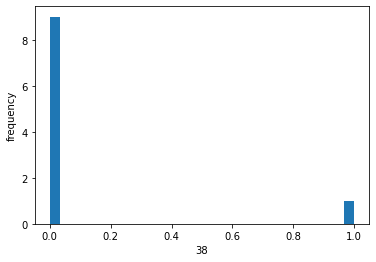

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


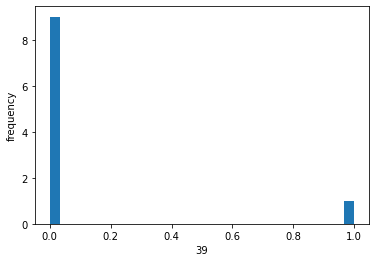

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


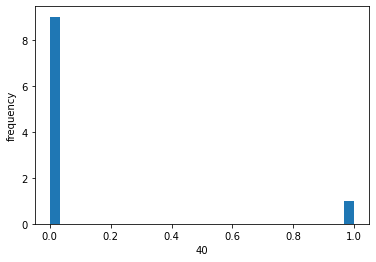

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


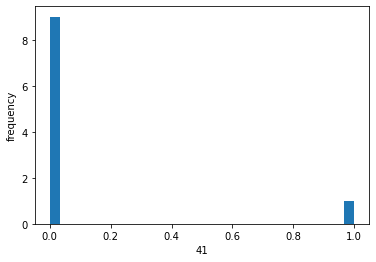

6
4
[1.0000000e+00 2.1188566e-09 1.0001365e-09 1.1528443e-09 2.0636122e-09
 2.3379865e-09 1.9728832e-09 1.4264183e-09 2.3638185e-09 1.9573099e-09]
5


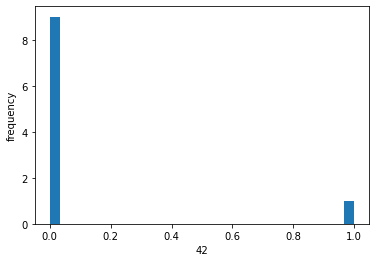

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


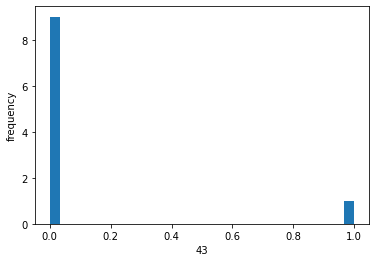

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


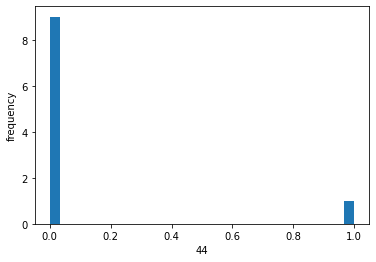

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


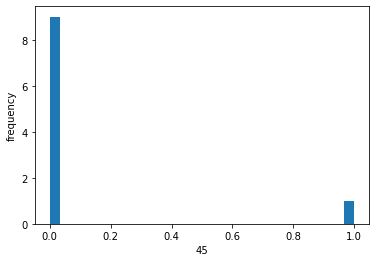

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


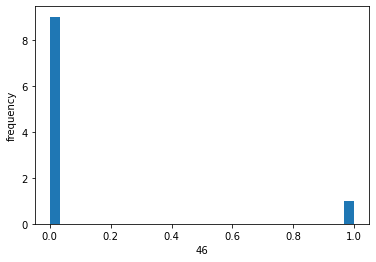

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


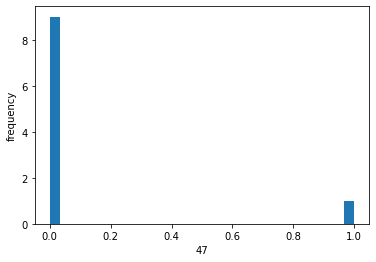

6
4
[1.0000000e+00 7.3430519e-09 3.6491417e-09 4.1641370e-09 7.1865762e-09
 8.0733527e-09 6.8794748e-09 5.0874216e-09 8.1526430e-09 6.8492829e-09]
5


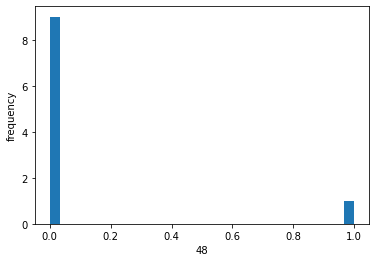

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


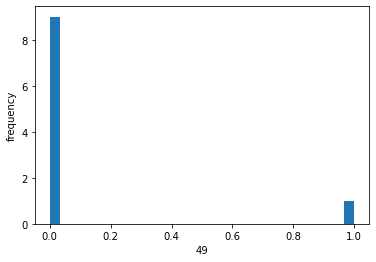

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


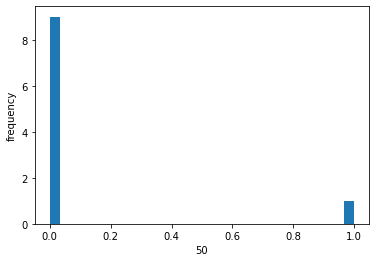

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


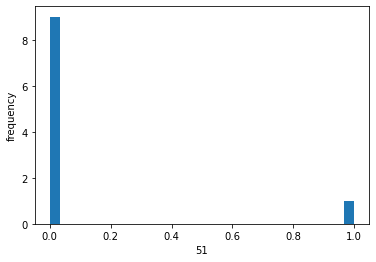

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


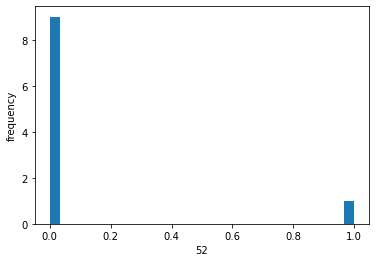

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


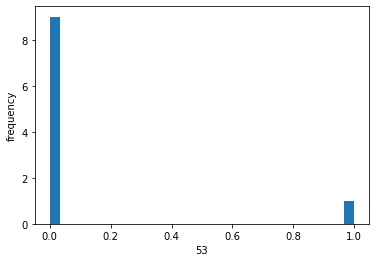

6
4
[1.0000000e+00 1.8824664e-09 8.7887131e-10 1.0183735e-09 1.8144259e-09
 2.0465574e-09 1.7415149e-09 1.2493233e-09 2.0713451e-09 1.7263942e-09]
5


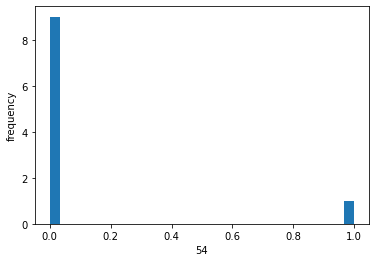

6
4
[1.0000000e+00 1.0087444e-20 1.4552423e-21 2.1403716e-21 8.0925438e-21
 1.1241344e-20 7.8591965e-21 3.6193478e-21 1.1714324e-20 7.2382981e-21]
5


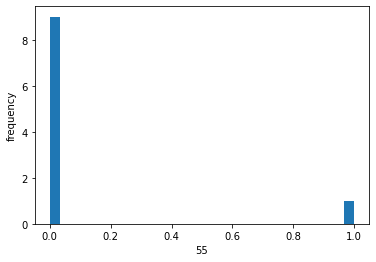

6
4
[1.0000000e+00 2.9639993e-09 1.4235644e-09 1.6335199e-09 2.9000859e-09
 3.2729979e-09 2.7711424e-09 2.0139601e-09 3.3090533e-09 2.7505527e-09]
5


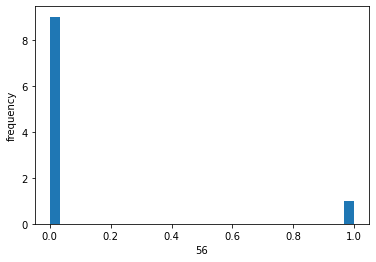

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


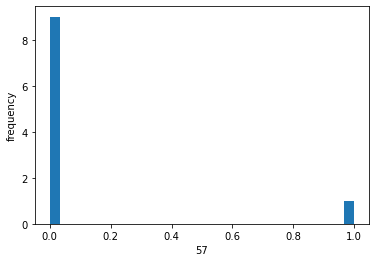

6
4
[1.0000000e+00 2.1188566e-09 1.0001365e-09 1.1528443e-09 2.0636122e-09
 2.3379865e-09 1.9728832e-09 1.4264183e-09 2.3638185e-09 1.9573099e-09]
5


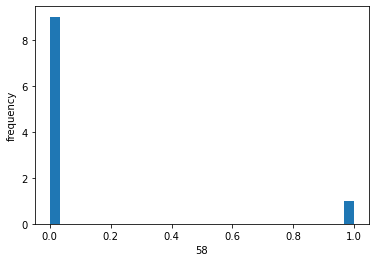

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


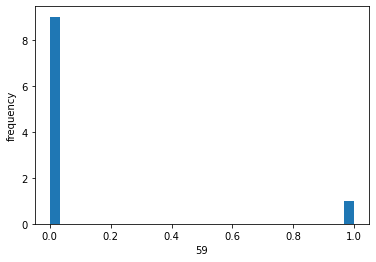

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


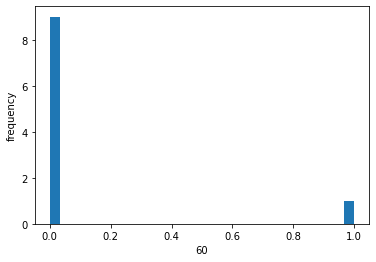

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


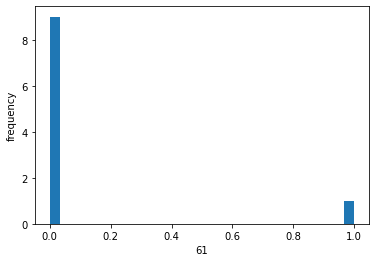

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


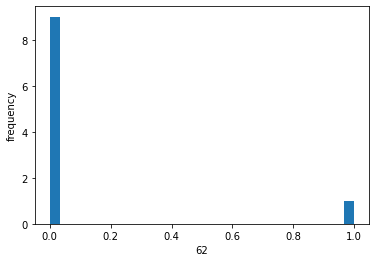

6
4
[1.00000000e+00 2.38738303e-14 6.80117355e-15 8.68381396e-15
 2.15672613e-14 2.66832150e-14 2.06176967e-14 1.22410965e-14
 2.72796464e-14 1.98847286e-14]
5


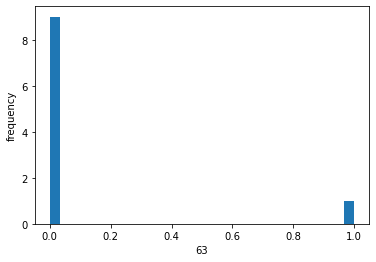

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


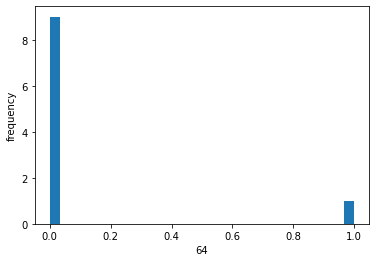

6
4
[1.0000000e+00 9.3029917e-36 2.5015832e-37 5.1400085e-37 5.2115026e-36
 9.6614845e-36 5.5076362e-36 1.3924104e-36 1.0943303e-35 4.4702011e-36]
5


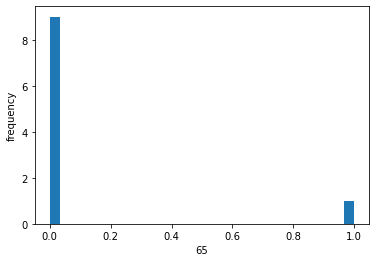

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


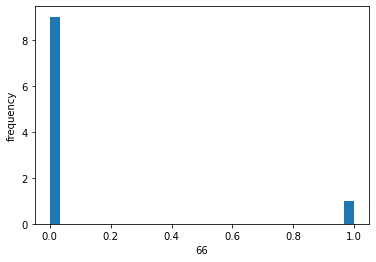

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


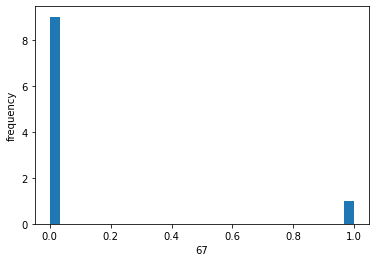

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


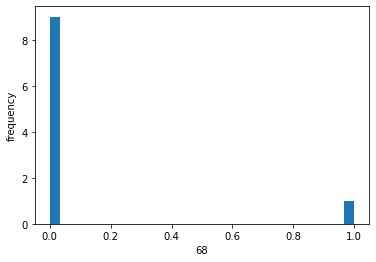

6
4
[1.0000000e+00 1.8725351e-14 5.2763309e-15 6.7523408e-15 1.6886447e-14
 2.0932952e-14 1.6146110e-14 9.5450567e-15 2.1407629e-14 1.5560561e-14]
5


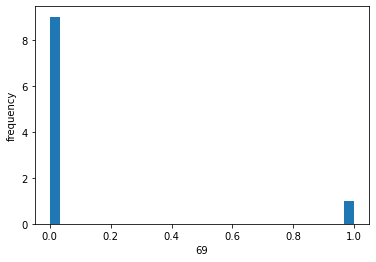

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


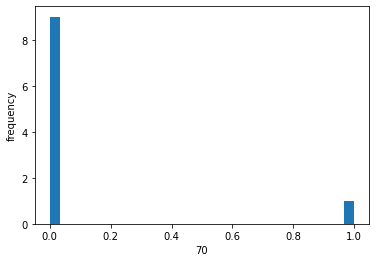

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


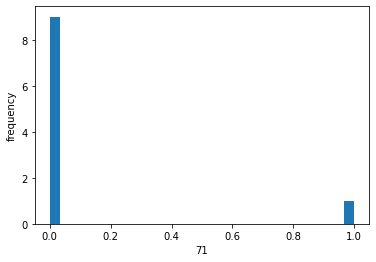

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


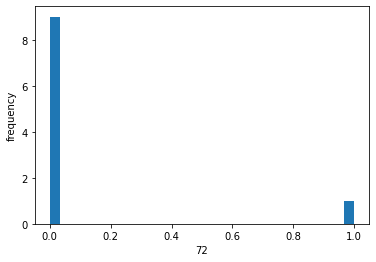

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


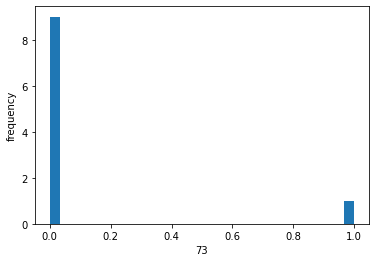

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


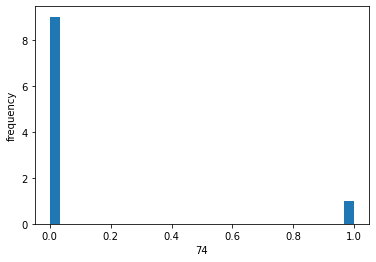

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


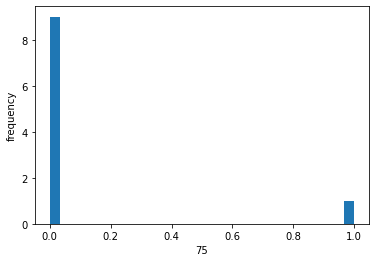

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


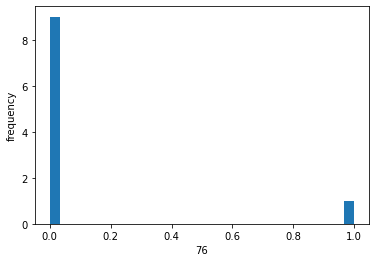

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


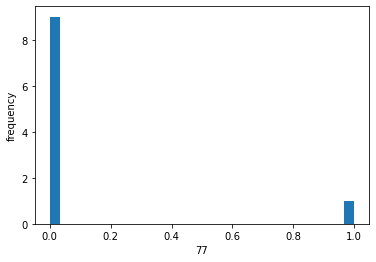

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


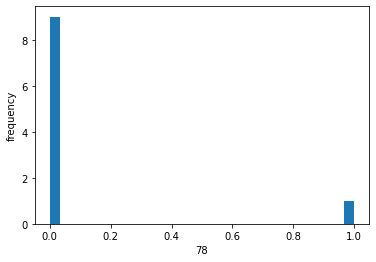

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


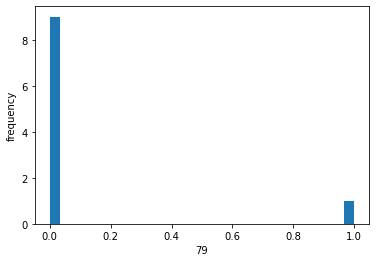

6
4
[1.0000000e+00 6.5227446e-12 2.3924226e-12 2.9019463e-12 6.1352468e-12
 7.2629342e-12 5.8544944e-12 3.8274579e-12 7.3846155e-12 5.7251070e-12]
5


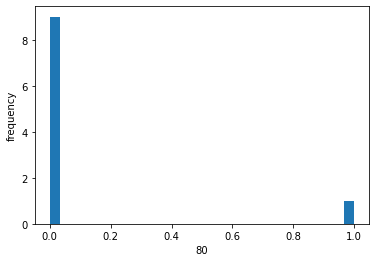

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


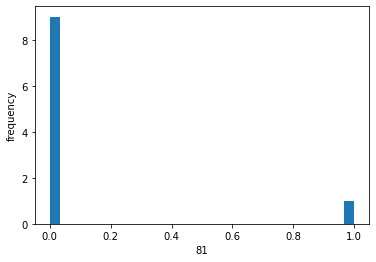

6
4
[1.0000000e+00 3.0524619e-36 7.8006760e-38 1.6175975e-37 1.6948987e-36
 3.1686869e-36 1.7944909e-36 4.4498679e-37 3.5955268e-36 1.4510405e-36]
5


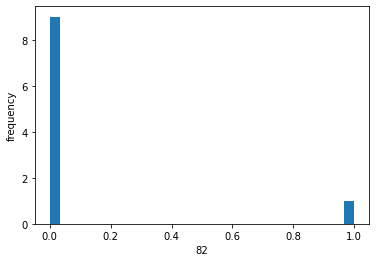

6
4
[1.0000000e+00 1.3647432e-08 6.9634760e-09 7.9035001e-09 1.3402932e-08
 1.4984797e-08 1.2834326e-08 9.5948263e-09 1.5128762e-08 1.2798660e-08]
5


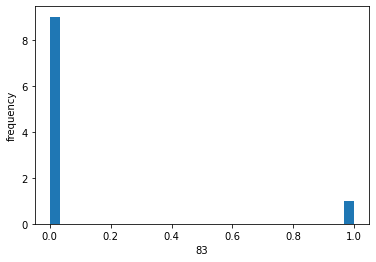

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


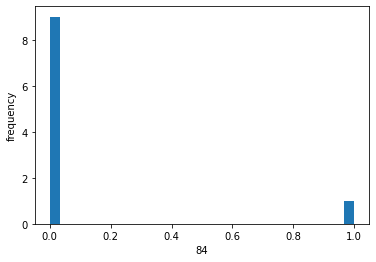

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


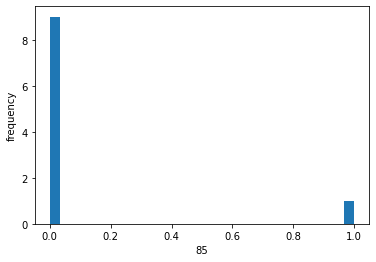

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


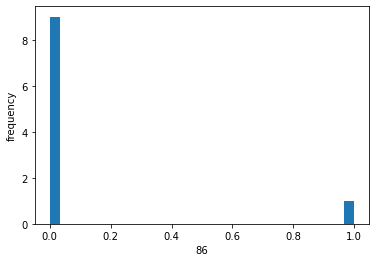

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


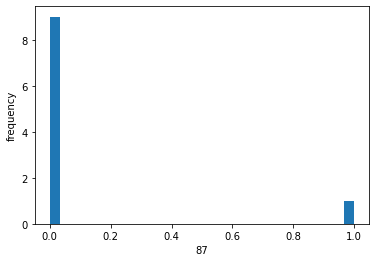

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


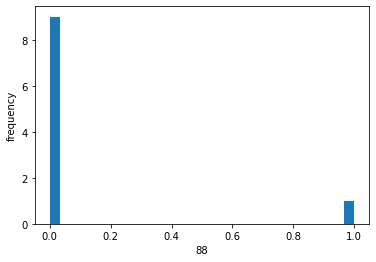

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


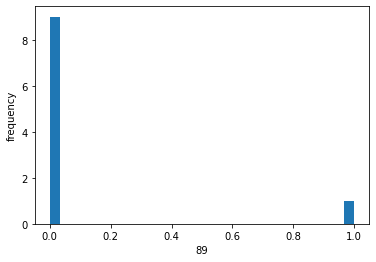

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


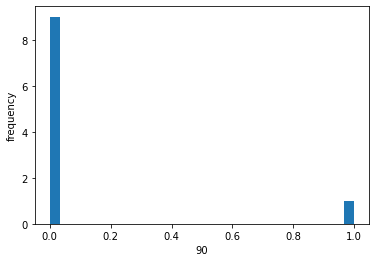

6
4
[1.0000000e+00 1.7043101e-09 7.9598650e-10 9.2043456e-10 1.6547689e-09
 1.8747519e-09 1.5828391e-09 1.1388330e-09 1.8964494e-09 1.5695960e-09]
5


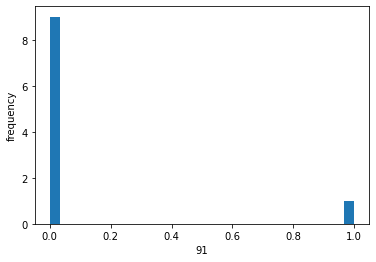

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


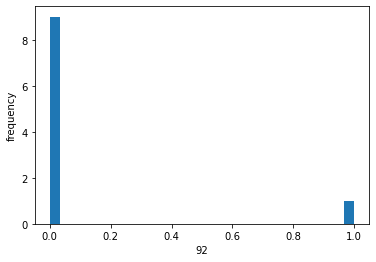

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


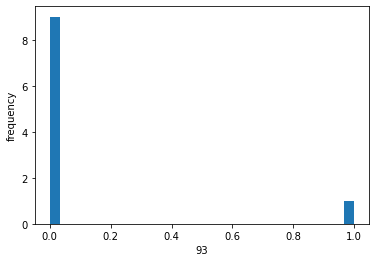

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


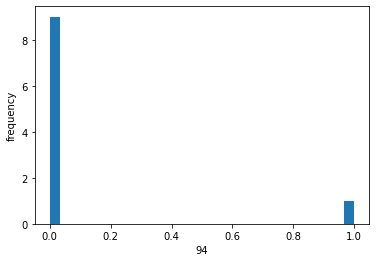

6
4
[1.0000000e+00 1.0589509e-13 3.2288293e-14 4.0678198e-14 9.6783028e-14
 1.1834537e-13 9.2482682e-14 5.6275117e-14 1.2079929e-13 8.9467848e-14]
5


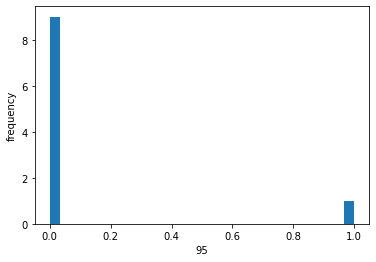

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


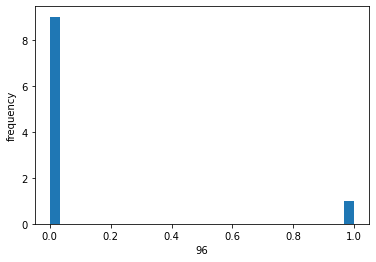

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


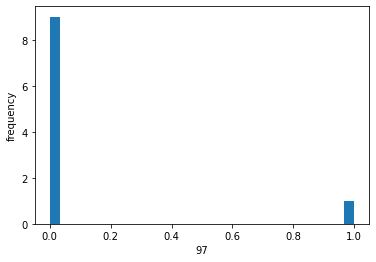

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


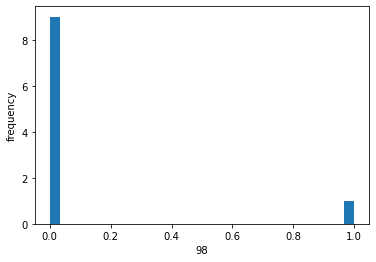

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


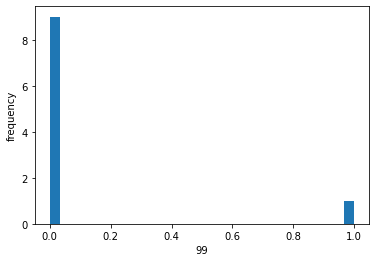

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


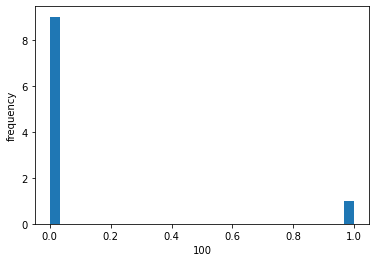

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


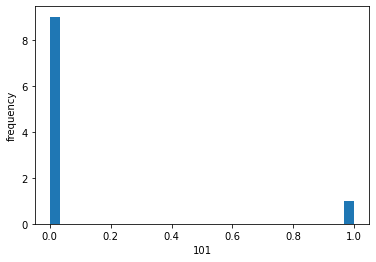

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


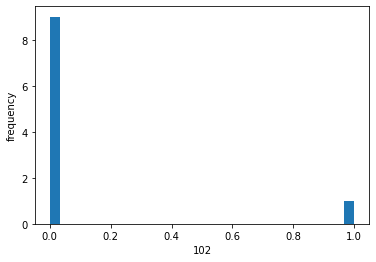

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


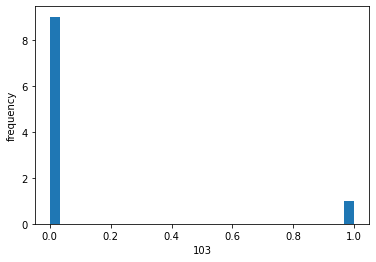

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


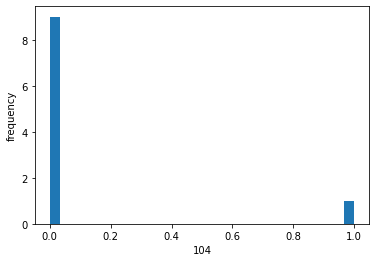

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


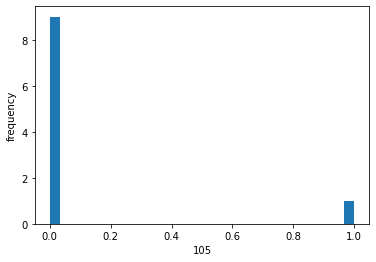

6
4
[1.0000000e+00 1.3647432e-08 6.9634760e-09 7.9035001e-09 1.3402932e-08
 1.4984797e-08 1.2834326e-08 9.5948263e-09 1.5128762e-08 1.2798660e-08]
5


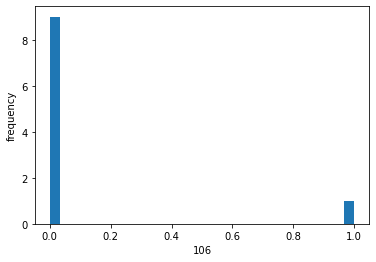

6
4
[1.0000000e+00 2.2621800e-32 8.9073782e-34 1.6968097e-33 1.3785346e-32
 2.3966411e-32 1.4261187e-32 4.1321697e-33 2.6565056e-32 1.1916304e-32]
5


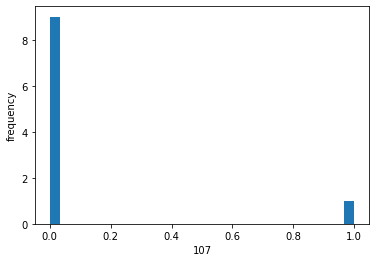

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


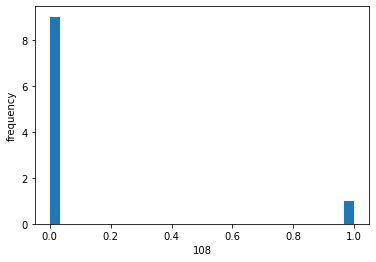

6
4
[1.0000000e+00 5.3342421e-11 2.1494934e-11 2.5586309e-11 5.0938736e-11
 5.9304041e-11 4.8611178e-11 3.2923039e-11 6.0152064e-11 4.7751674e-11]
5


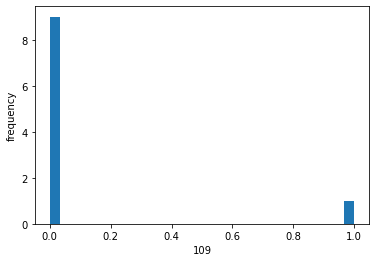

6
4
[1.0000000e+00 1.7763710e-17 3.6292247e-18 4.9658059e-18 1.5159948e-17
 1.9854834e-17 1.4569005e-17 7.6458488e-18 2.0466817e-17 1.3769894e-17]
5


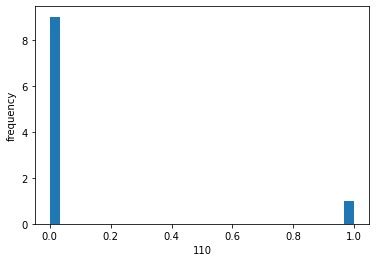

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


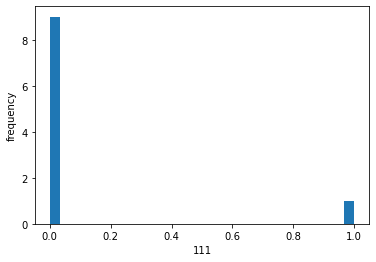

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


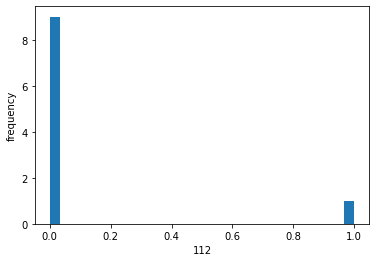

6
4
[1.0000000e+00 3.2550083e-15 8.4671965e-16 1.1014865e-15 2.8962132e-15
 3.6402253e-15 2.7720750e-15 1.5906182e-15 3.7287551e-15 2.6598749e-15]
5


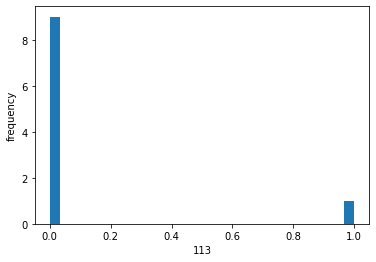

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


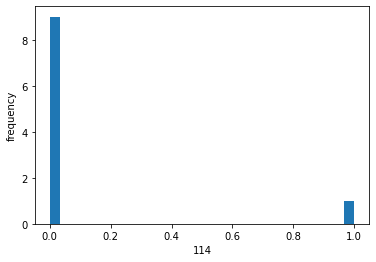

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


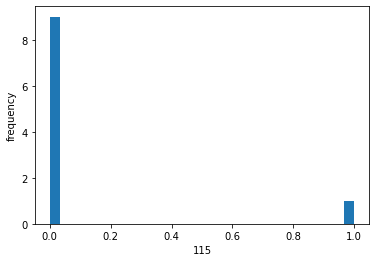

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


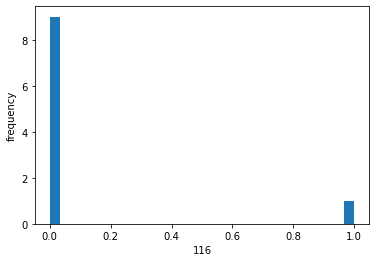

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


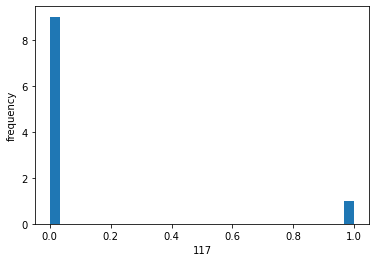

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


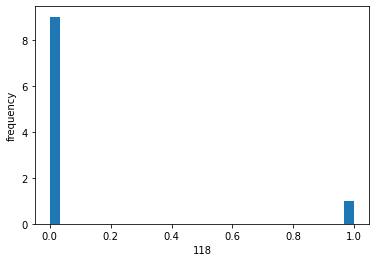

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


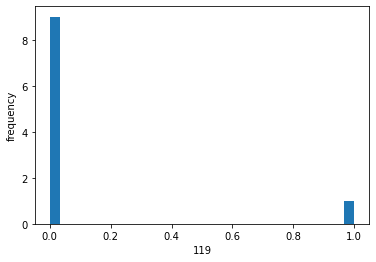

6
4
[1.0000000e+00 1.7986261e-33 6.2843811e-35 1.2243448e-34 1.0703441e-33
 1.8982212e-33 1.1134999e-33 3.0856203e-34 2.1157616e-33 9.2173745e-34]
5


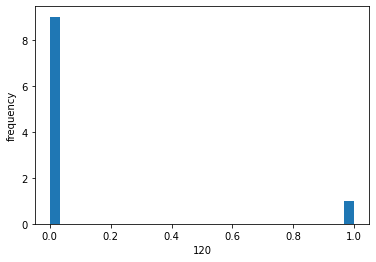

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


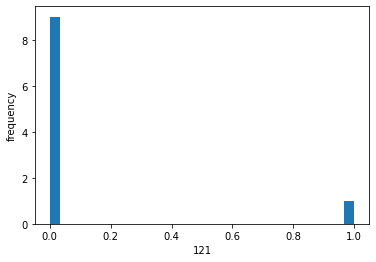

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


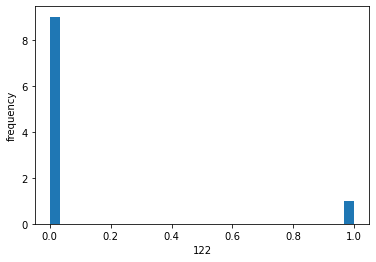

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


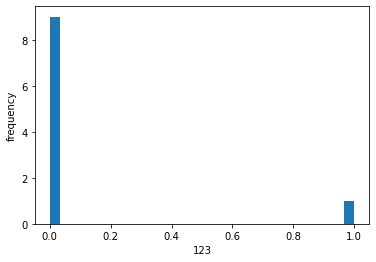

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


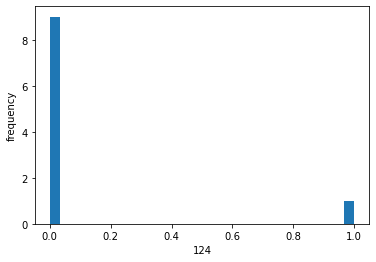

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


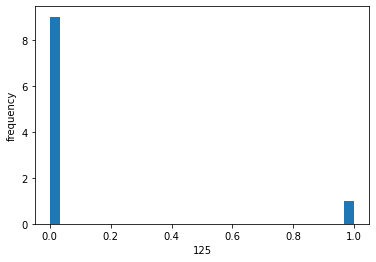

6
4
[1.0000000e+00 5.2602034e-11 2.1153978e-11 2.5189391e-11 5.0140777e-11
 5.8422045e-11 4.7862735e-11 3.2441806e-11 5.9272719e-11 4.7044181e-11]
5


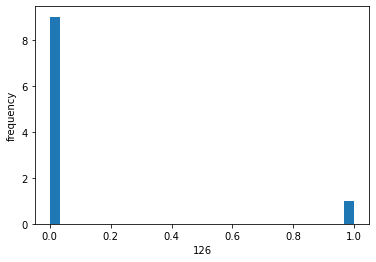

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


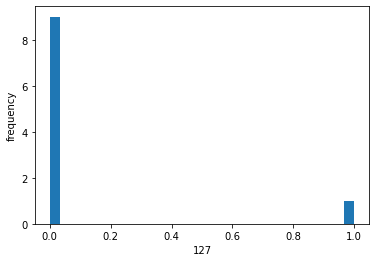

6
4
[1.0000000e+00 1.3647432e-08 6.9634760e-09 7.9035001e-09 1.3402932e-08
 1.4984797e-08 1.2834326e-08 9.5948263e-09 1.5128762e-08 1.2798660e-08]
5


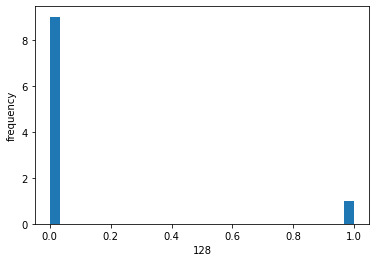

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


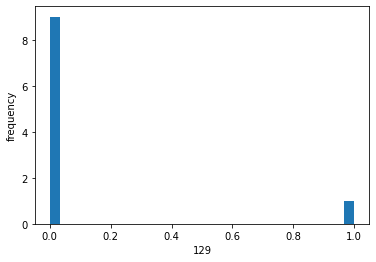

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


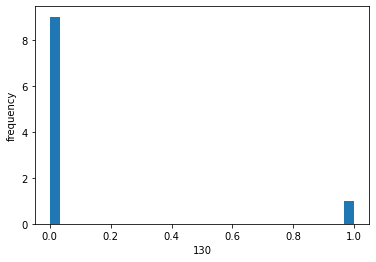

6
4
[1.0000000e+00 5.8418839e-14 1.7333120e-14 2.1951276e-14 5.3133970e-14
 6.5277909e-14 5.0777823e-14 3.0604713e-14 6.6670865e-14 4.9072888e-14]
5


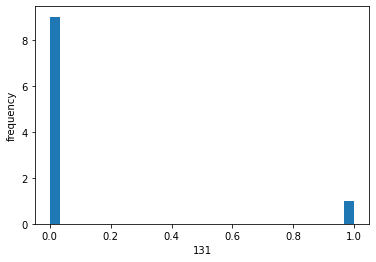

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


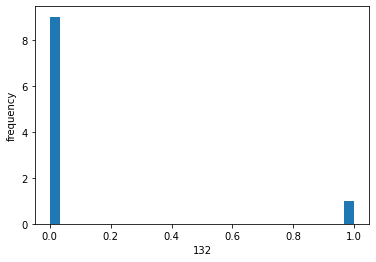

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


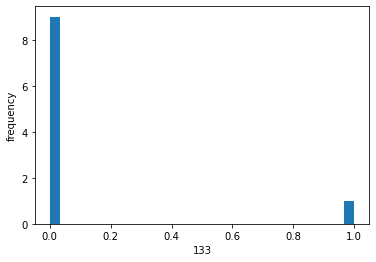

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


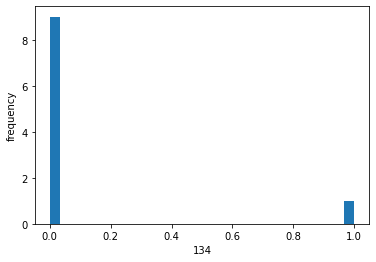

6
4
[1.0000000e+00 3.2791932e-11 1.2875154e-11 1.5453692e-11 3.1041801e-11
 3.6148196e-11 2.9657322e-11 1.9887075e-11 3.6735802e-11 2.9139004e-11]
5


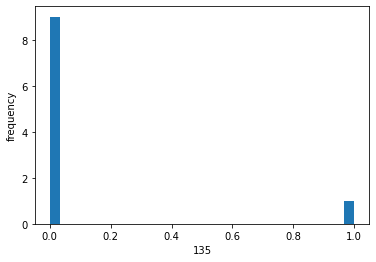

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


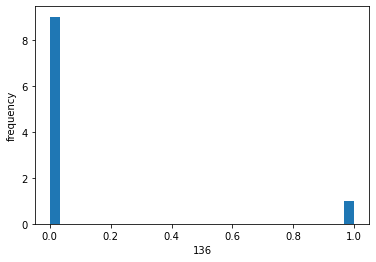

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


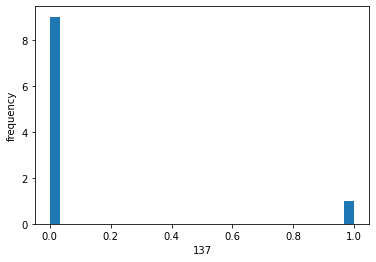

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


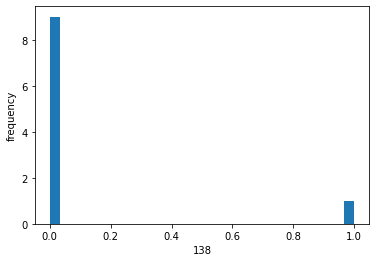

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


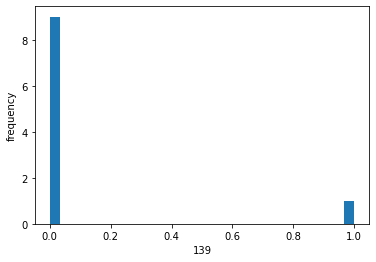

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


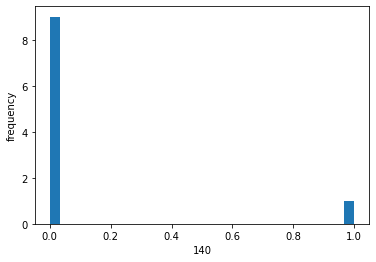

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


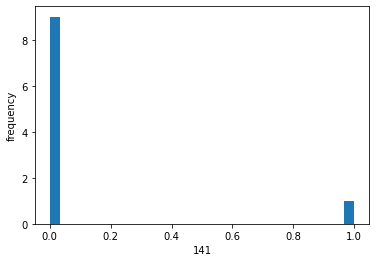

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


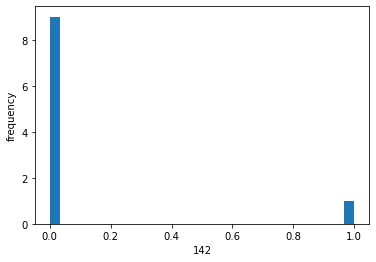

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


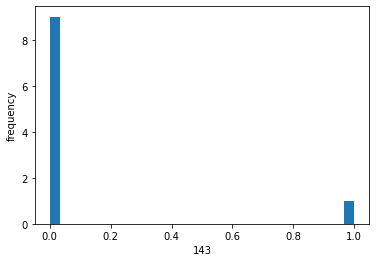

6
4
[1.0000000e+00 1.3983380e-09 6.4799455e-10 7.4978668e-10 1.3576935e-09
 1.5436002e-09 1.2978574e-09 9.3198804e-10 1.5613579e-09 1.2865666e-09]
5


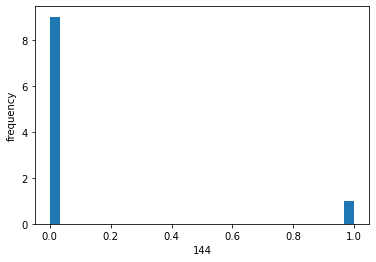

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


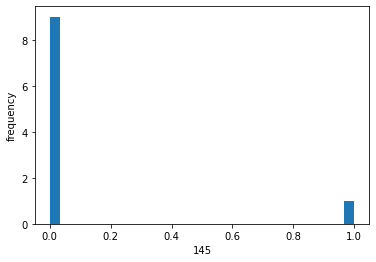

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


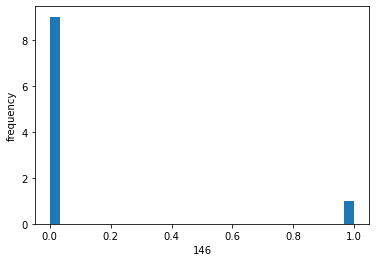

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


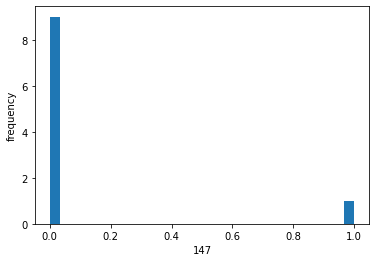

6
4
[1.0000000e+00 7.0133410e-09 3.4809795e-09 3.9679415e-09 6.8506418e-09
 7.6525808e-09 6.5644410e-09 4.8242410e-09 7.7230968e-09 6.5214860e-09]
5


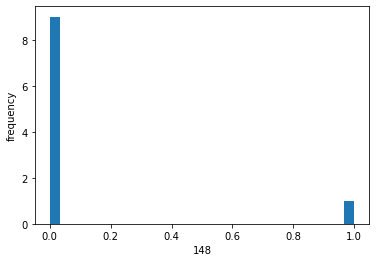

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


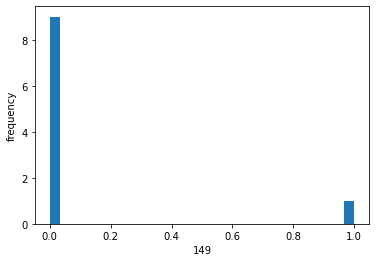

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


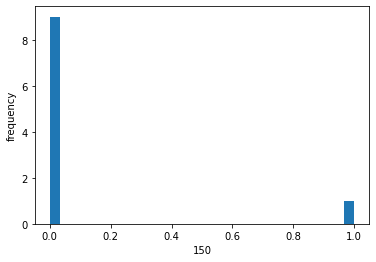

6
4
[1.0000000e+00 2.1188566e-09 1.0001365e-09 1.1528443e-09 2.0636122e-09
 2.3379865e-09 1.9728832e-09 1.4264183e-09 2.3638185e-09 1.9573099e-09]
5


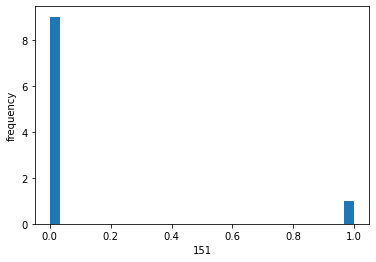

6
4
[1.0000000e+00 1.0580378e-14 2.9044004e-15 3.7367002e-15 9.4991069e-15
 1.1828686e-14 9.0853313e-15 5.3195799e-15 1.2102546e-14 8.7442133e-15]
5


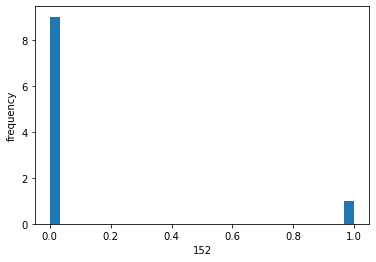

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


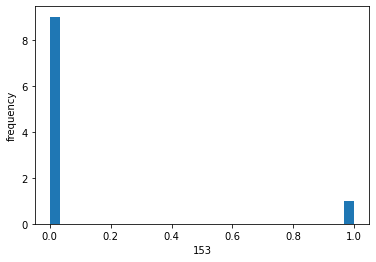

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


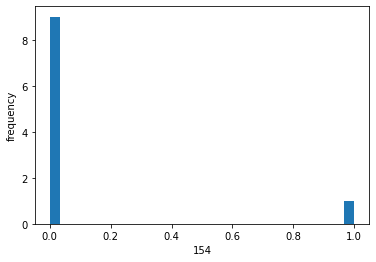

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


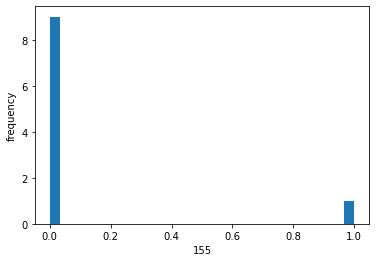

6
4
[1.0000000e+00 1.4082277e-28 8.5051406e-30 1.4873557e-29 9.4360895e-29
 1.5235753e-28 9.5253468e-29 3.2175299e-29 1.6512406e-28 8.2356430e-29]
5


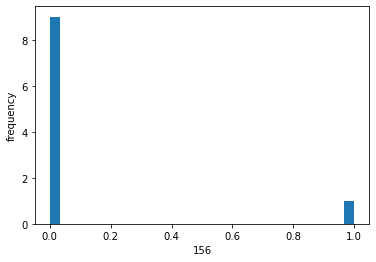

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


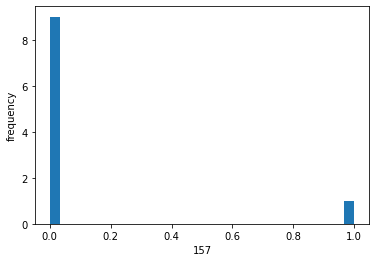

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


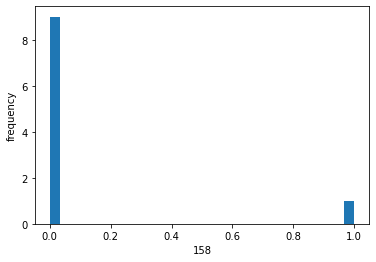

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


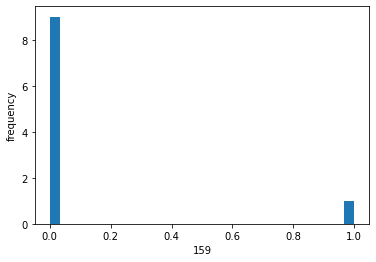

6
4
[1.0000000e+00 1.6693356e-20 2.4572079e-21 3.5959658e-21 1.3399834e-20
 1.8556551e-20 1.3002436e-20 6.0593710e-21 1.9348239e-20 1.2015200e-20]
5


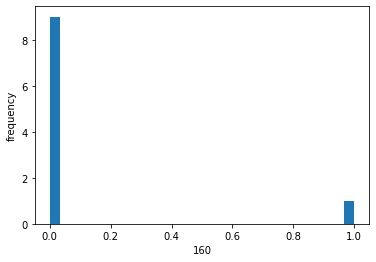

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


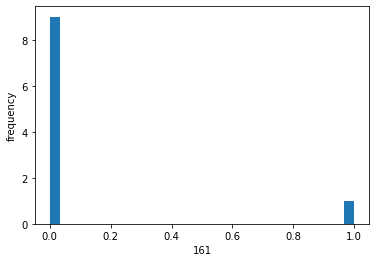

6
4
[1.0000000e+00 9.0758569e-34 3.0629729e-35 6.0101557e-35 5.3542601e-34
 9.5533060e-34 5.5843108e-34 1.5285887e-34 1.0671559e-33 4.6095376e-34]
5


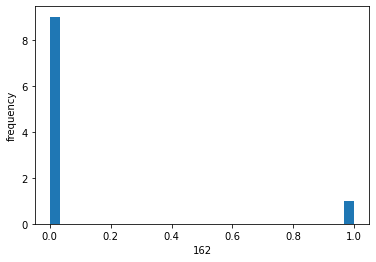

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


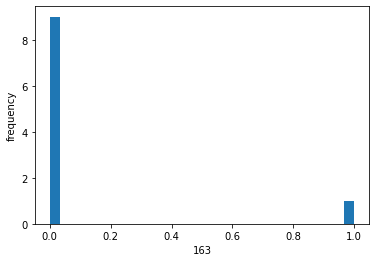

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


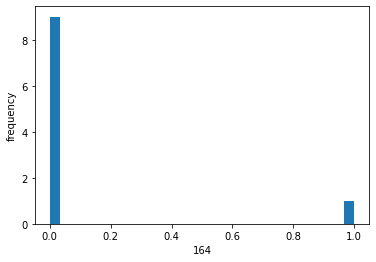

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


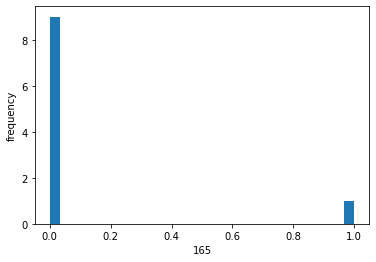

6
4
[1.0000000e+00 5.3120947e-31 2.4422144e-32 4.5120128e-32 3.3526227e-31
 5.6748786e-31 3.4360579e-31 1.0526180e-31 6.2365825e-31 2.9073476e-31]
5


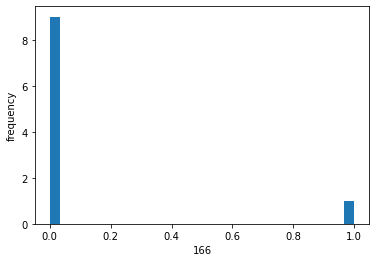

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


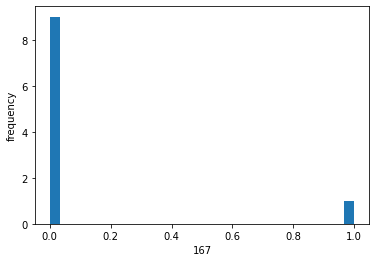

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


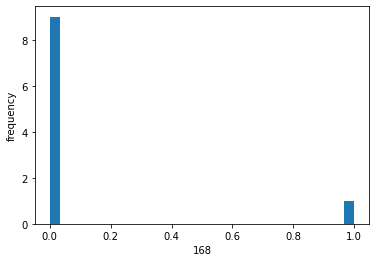

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


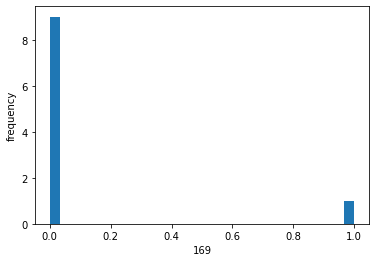

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


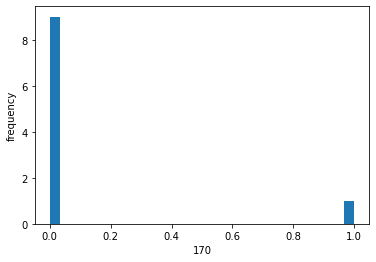

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


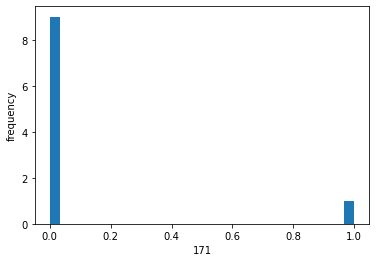

6
4
[1.0000000e+00 1.6783981e-18 3.0809981e-19 4.3062426e-19 1.4080093e-18
 1.8771013e-18 1.3552009e-18 6.8283517e-19 1.9413764e-18 1.2716616e-18]
5


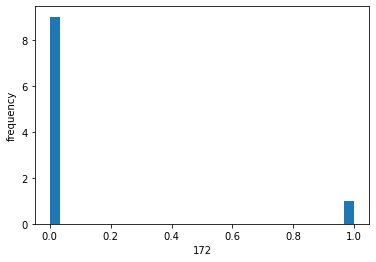

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


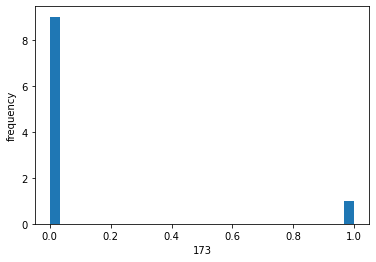

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


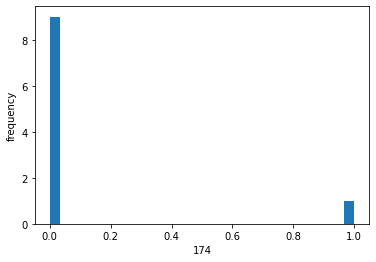

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


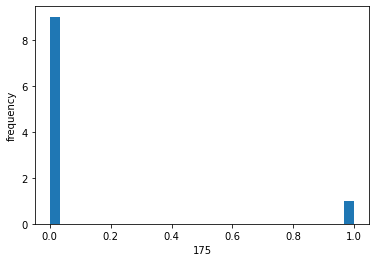

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


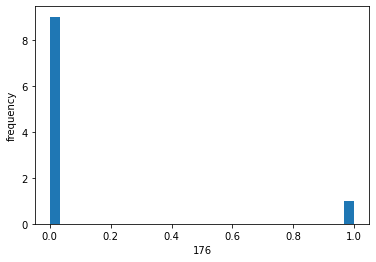

6
4
[1.0000000e+00 2.0665030e-13 6.4929473e-14 8.1267878e-14 1.8972016e-13
 2.3076514e-13 1.8120221e-13 1.1161224e-13 2.3542298e-13 1.7567545e-13]
5


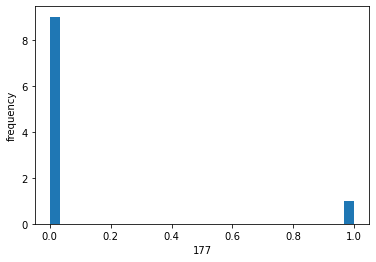

6
4
[1.0000000e+00 1.8042621e-17 3.7079690e-18 5.0628015e-18 1.5465439e-17
 2.0225363e-17 1.4849043e-17 7.7815560e-18 2.0836759e-17 1.4025848e-17]
5


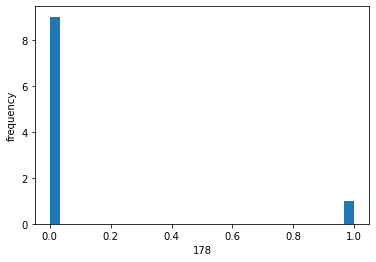

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


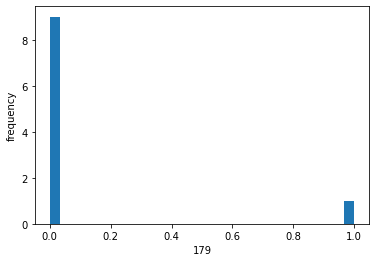

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


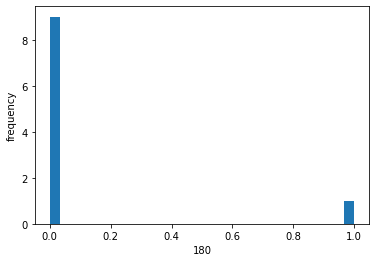

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


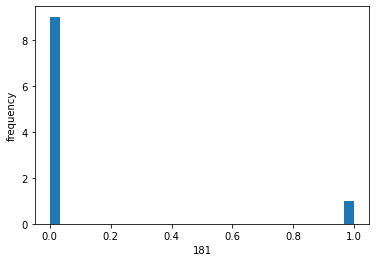

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


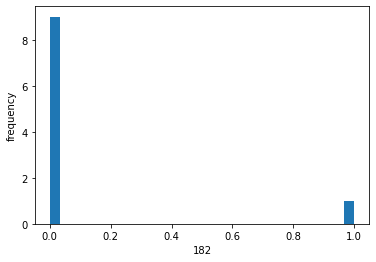

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


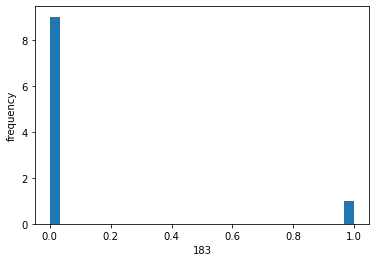

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


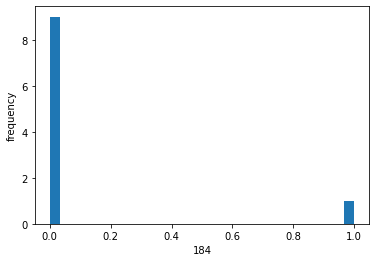

6
4
[1.0000000e+00 1.5393646e-15 3.8705954e-16 5.0707119e-16 1.3622469e-15
 1.7222253e-15 1.3045245e-15 7.3880659e-16 1.7650923e-15 1.2490479e-15]
5


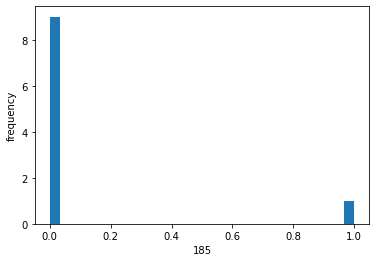

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


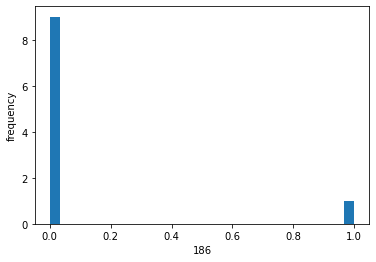

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


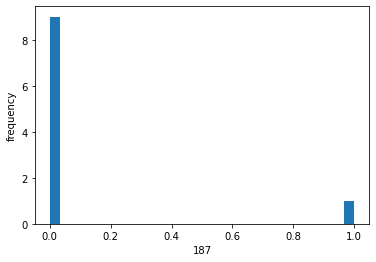

6
4
[1.0000000e+00 2.2633283e-13 7.1808716e-14 8.9522302e-14 2.0887258e-13
 2.5338504e-13 1.9917461e-13 1.2275871e-13 2.5859610e-13 1.9306137e-13]
5


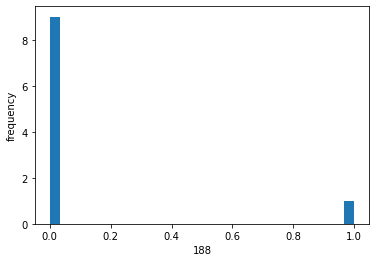

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


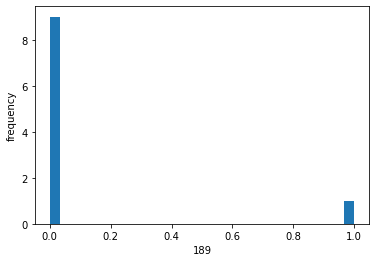

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


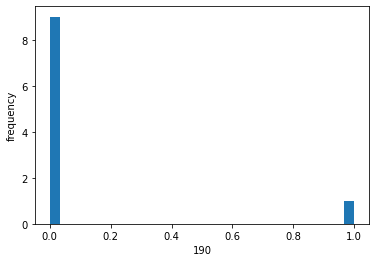

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


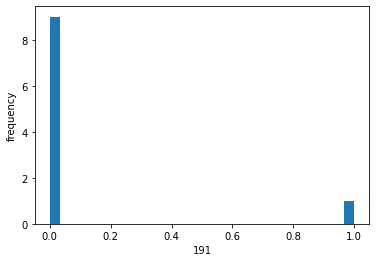

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


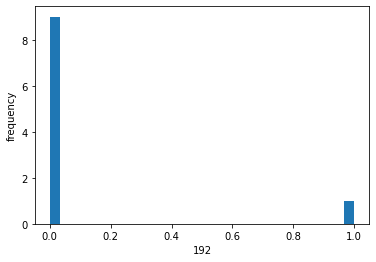

6
4
[1.0000000e+00 1.5508254e-19 2.5372894e-20 3.6329191e-20 1.2704149e-19
 1.7279074e-19 1.2282696e-19 5.9459164e-20 1.7949446e-19 1.1435419e-19]
5


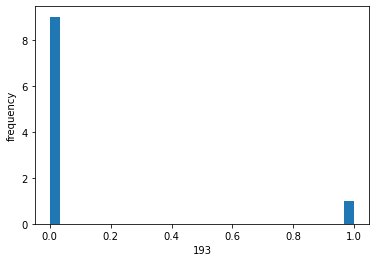

6
4
[1.0000000e+00 5.0365772e-36 1.3122110e-37 2.7139721e-37 2.7986188e-36
 5.2176294e-36 2.9646484e-36 7.4161670e-37 5.9225519e-36 2.4005890e-36]
5


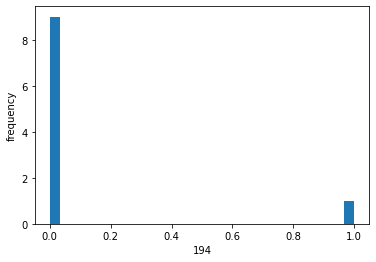

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


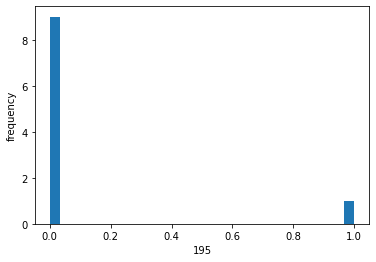

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


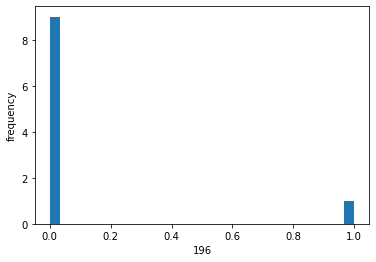

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


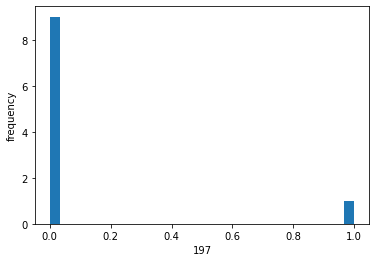

6
4
[1.0000000e+00 8.1054192e-38 0.0000000e+00 0.0000000e+00 4.3365656e-38
 8.3477962e-38 4.6366517e-38 0.0000000e+00 9.5562031e-38 3.6978459e-38]
5


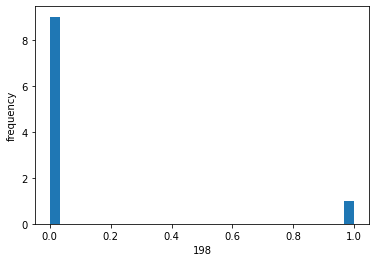

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


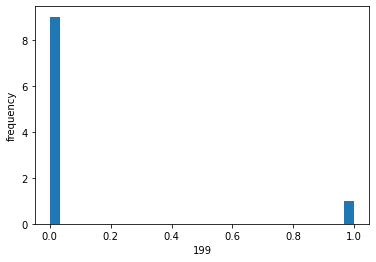

6
4
[1.0000000e+00 2.1512359e-34 6.7485092e-36 1.3444892e-35 1.2467509e-34
 2.2526363e-34 1.3067034e-34 3.4881644e-35 2.5285368e-34 1.0725957e-34]
5


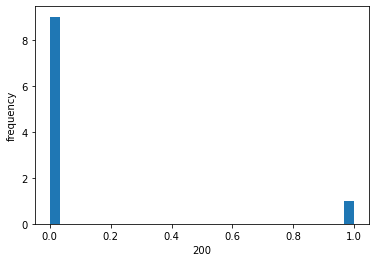

6
4
[1.0000000e+00 6.9125573e-12 2.5425222e-12 3.0813028e-12 6.5043578e-12
 7.6961458e-12 6.2059689e-12 4.0622878e-12 7.8267713e-12 6.0707355e-12]
5


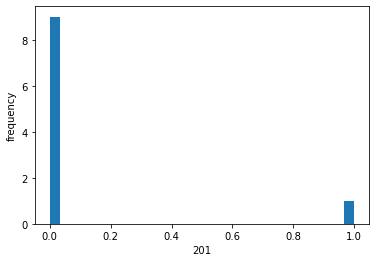

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


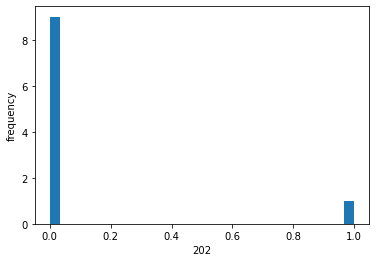

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


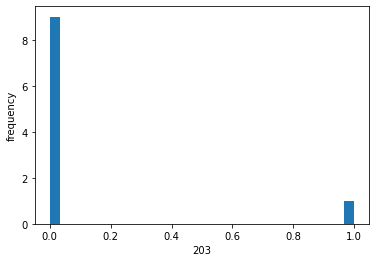

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


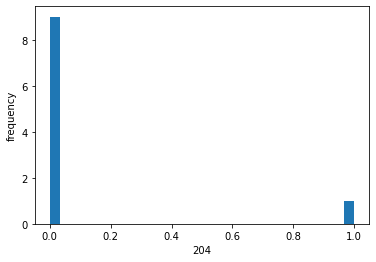

6
4
[1.0000000e+00 3.7279324e-10 1.6332199e-10 1.9117272e-10 3.5979414e-10
 4.1286177e-10 3.4360423e-10 2.4085736e-10 4.1806722e-10 3.3929035e-10]
5


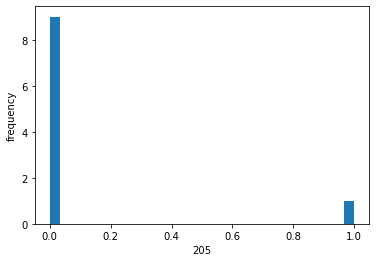

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


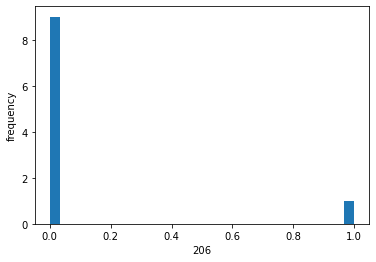

6
4
[1.0000000e+00 3.8227472e-22 4.7125620e-23 7.1488336e-23 2.9698197e-22
 4.2367253e-22 2.8978052e-22 1.2660733e-22 4.4440834e-22 2.6444874e-22]
5


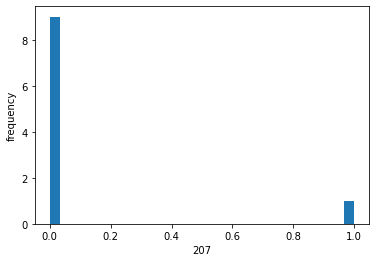

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


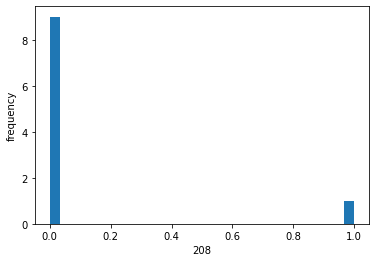

6
4
[1.0000000e+00 2.7288293e-21 3.7201176e-22 5.5225494e-22 2.1730992e-21
 3.0451699e-21 2.1078474e-21 9.5073022e-22 3.1794387e-21 1.9366913e-21]
5


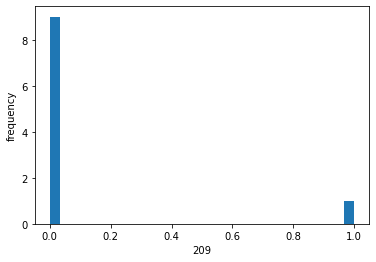

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


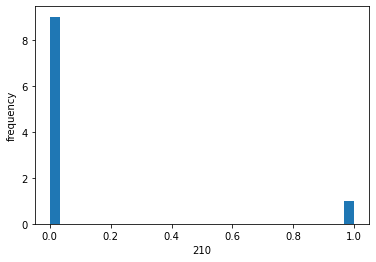

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


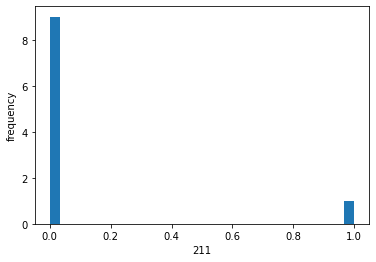

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


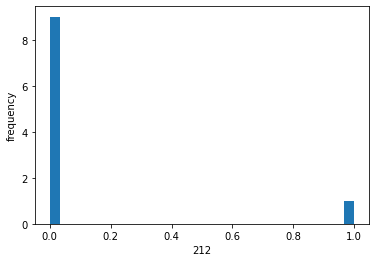

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


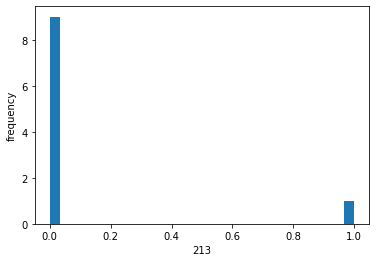

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


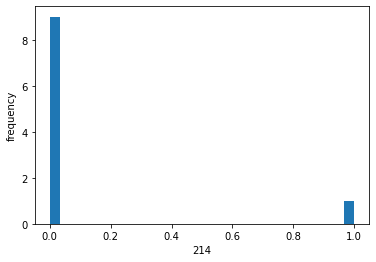

6
4
[1.0000000e+00 1.3108672e-34 4.0115897e-36 8.0332132e-36 7.5525856e-35
 1.3705213e-34 7.9288827e-35 2.0981895e-35 1.5407774e-34 6.4959999e-35]
5


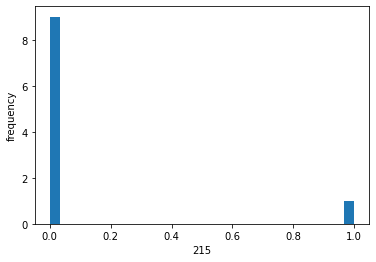

6
4
[1.0000000e+00 5.4566333e-35 1.6207546e-36 3.2549363e-36 3.1516548e-35
 5.7387824e-35 3.2995309e-35 8.5997915e-36 6.4406793e-35 2.6981811e-35]
5


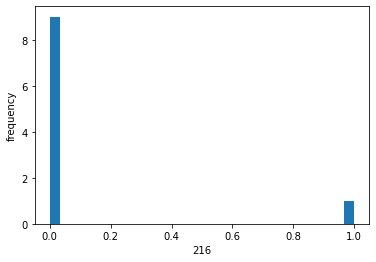

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


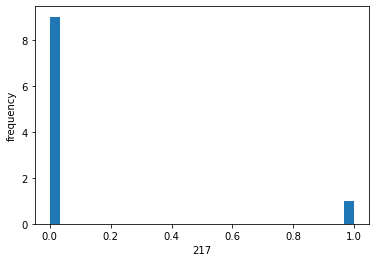

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


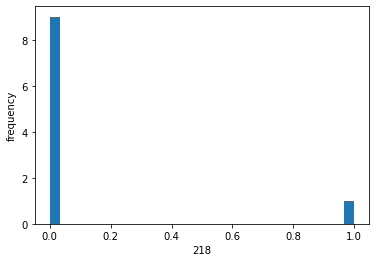

6
4
[1.0000000e+00 1.3282977e-21 1.7519179e-22 2.6207067e-22 1.0523946e-21
 1.4826091e-21 1.0225052e-21 4.5461405e-22 1.5492628e-21 9.3607623e-22]
5


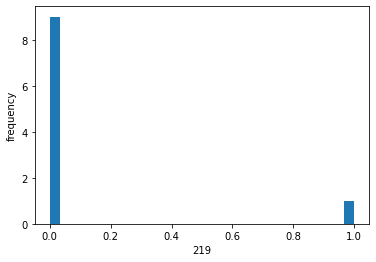

6
4
[1.0000000e+00 3.3405154e-19 5.6714042e-20 8.0581389e-20 2.7573463e-19
 3.7264580e-19 2.6621942e-19 1.3054228e-19 3.8653512e-19 2.4847911e-19]
5


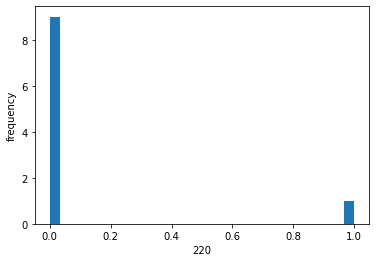

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


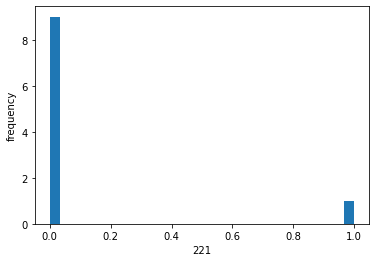

6
4
[1.0000000e+00 1.3647432e-08 6.9634760e-09 7.9035001e-09 1.3402932e-08
 1.4984797e-08 1.2834326e-08 9.5948263e-09 1.5128762e-08 1.2798660e-08]
5


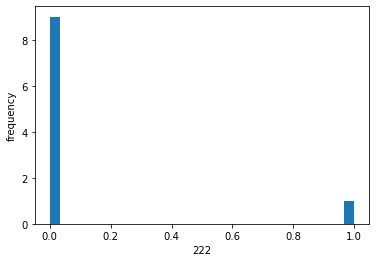

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


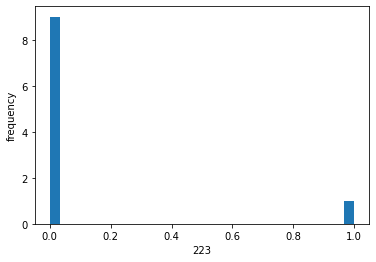

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


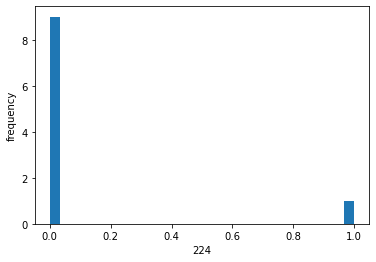

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


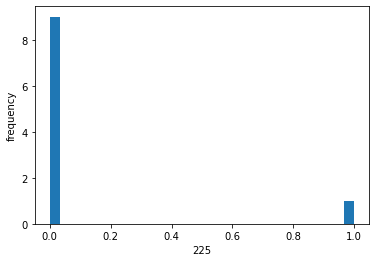

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


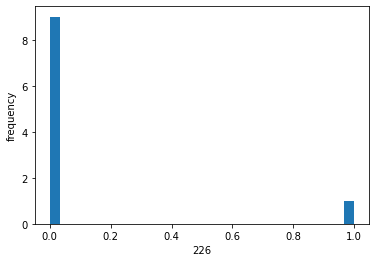

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


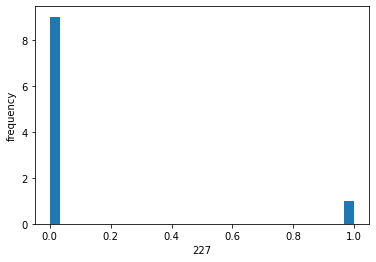

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


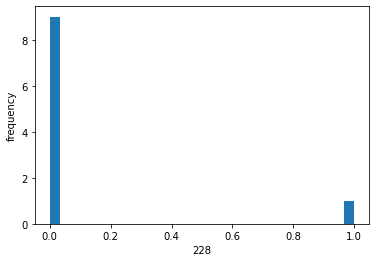

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


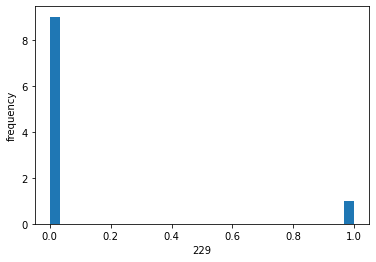

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


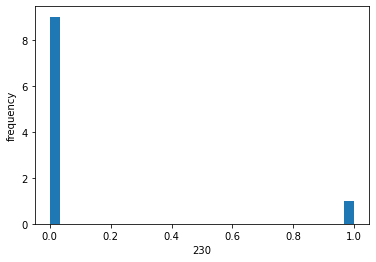

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


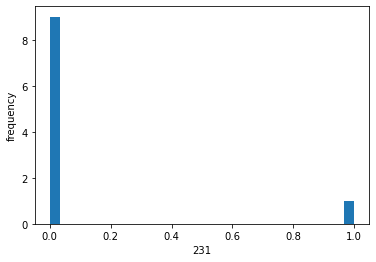

6
4
[1.00000000e+00 6.39596179e-23 7.24312125e-24 1.11785085e-23
 4.88904876e-23 7.07563425e-23 4.78483866e-23 2.02768271e-23
 7.44436550e-23 4.33979268e-23]
5


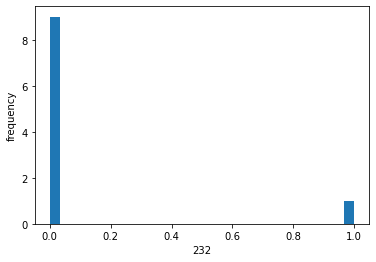

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


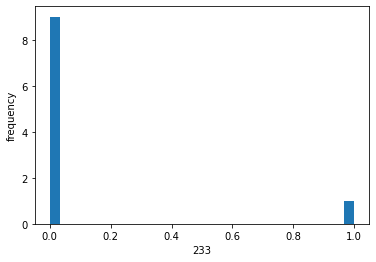

6
4
[1.0000000e+00 4.3451598e-23 4.8196238e-24 7.4713316e-24 3.3020187e-23
 4.7981452e-23 3.2374602e-23 1.3627662e-23 5.0548380e-23 2.9315261e-23]
5


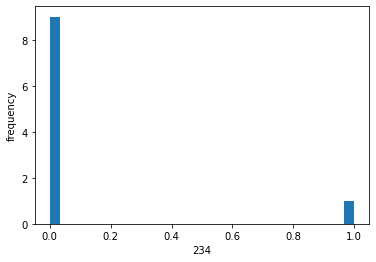

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


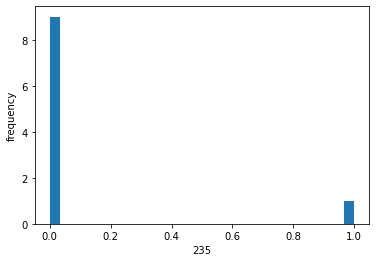

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


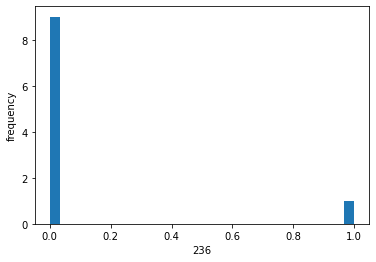

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


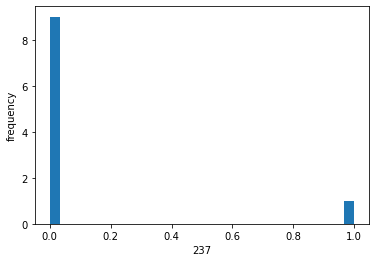

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


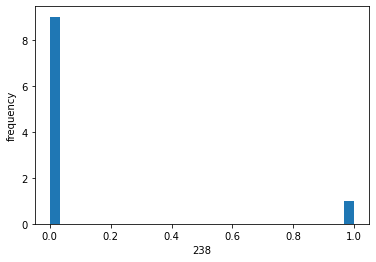

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


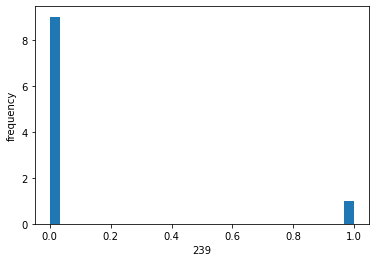

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


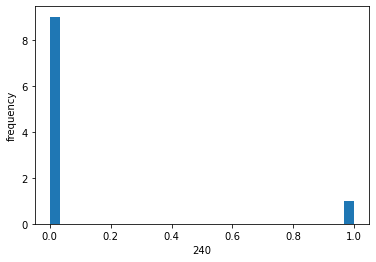

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


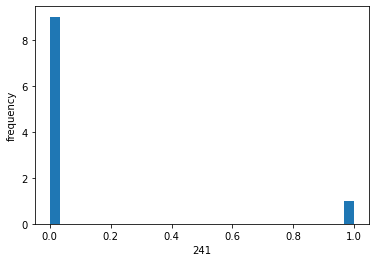

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


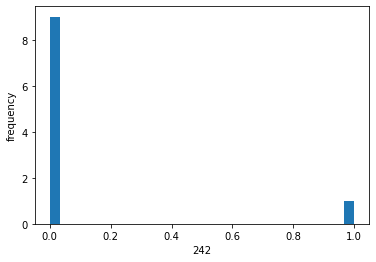

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


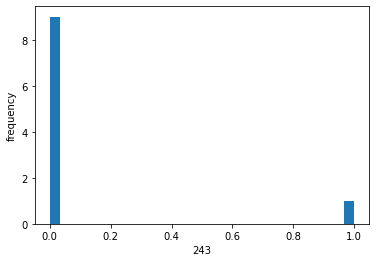

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


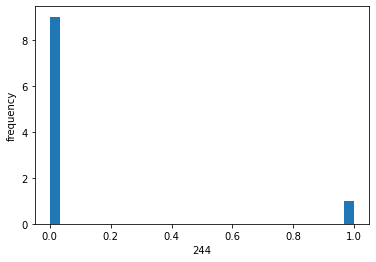

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


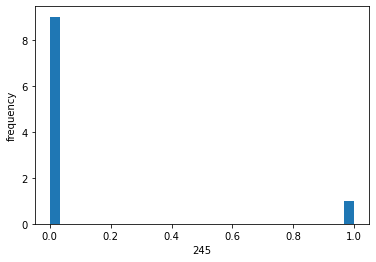

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


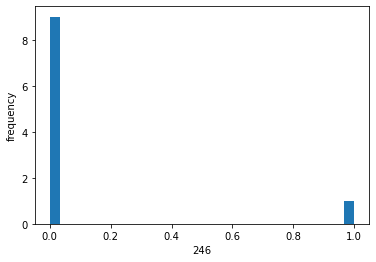

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


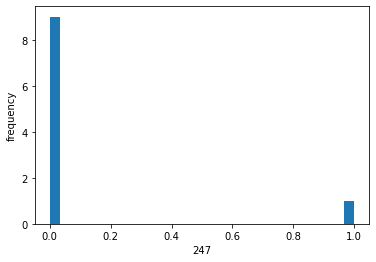

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


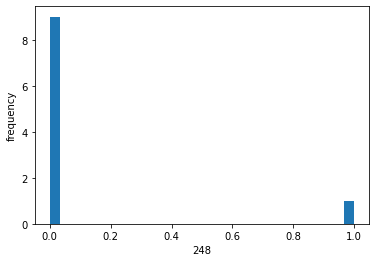

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


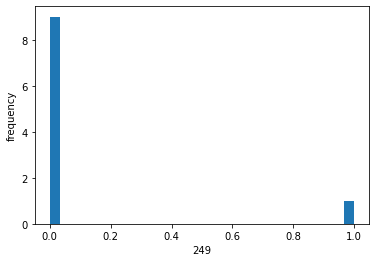

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


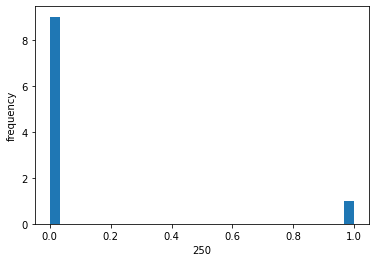

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


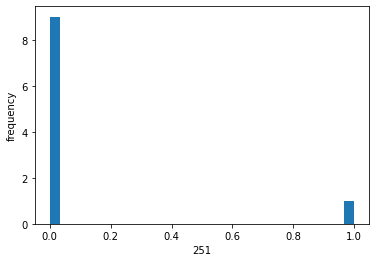

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


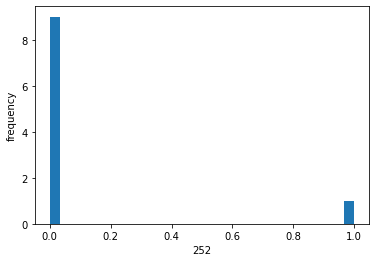

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


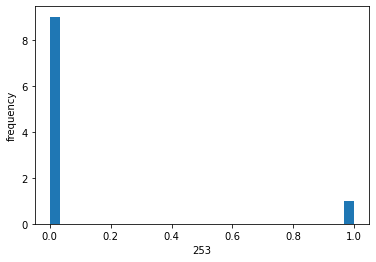

6
4
[1.0000000e+00 2.3343882e-11 9.1101597e-12 1.0889509e-11 2.2239398e-11
 2.6018448e-11 2.1191698e-11 1.4151491e-11 2.6437658e-11 2.0778563e-11]
5


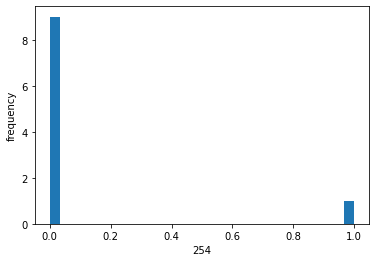

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


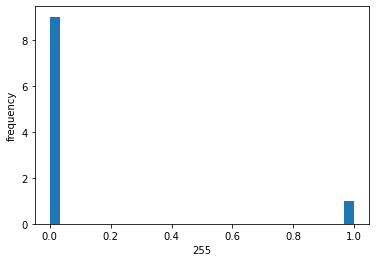

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


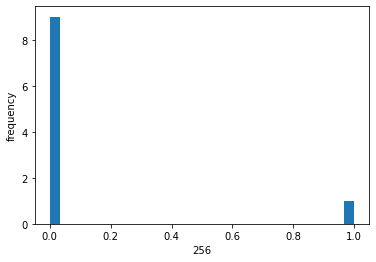

6
4
[1.0000000e+00 1.4060151e-22 1.6498092e-23 2.5284931e-23 1.0806478e-22
 1.5548332e-22 1.0567952e-22 4.5413719e-23 1.6342757e-22 9.6108937e-23]
5


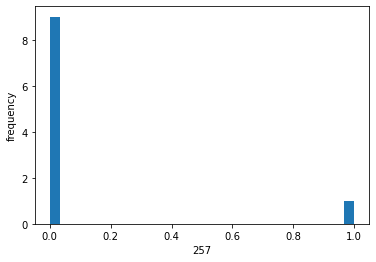

6
4
[1.00000000e+00 1.46958870e-31 6.33348348e-33 1.18604324e-32
 9.13226632e-32 1.56366492e-31 9.40298150e-32 2.81492047e-32
 1.72455836e-31 7.91158244e-32]
5


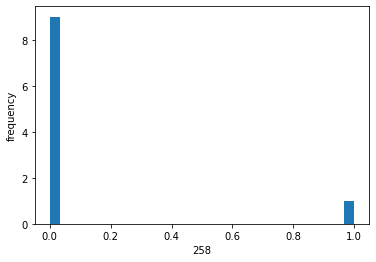

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


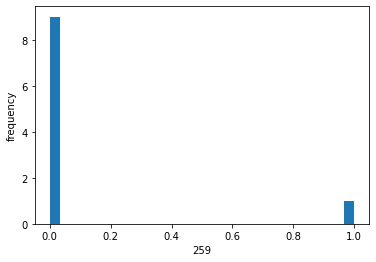

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


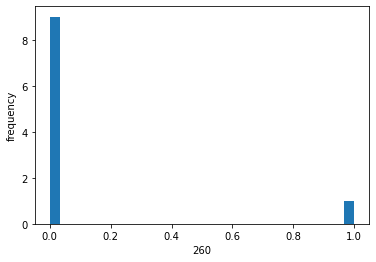

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


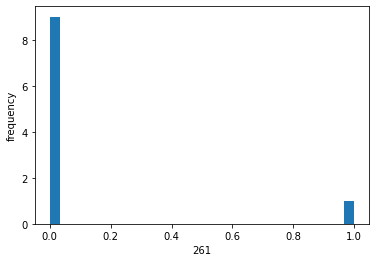

6
4
[1.0000000e+00 4.5793957e-25 4.1003874e-26 6.6275391e-26 3.3418054e-25
 5.0351069e-25 3.3017887e-25 1.2843324e-25 5.3536312e-25 2.9435132e-25]
5


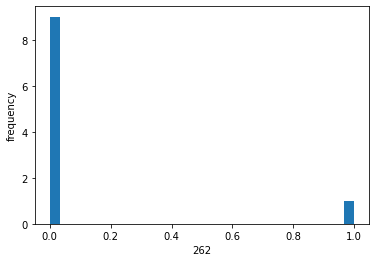

6
4
[1.0000000e+00 2.6459788e-31 1.1750908e-32 2.1862825e-32 1.6566073e-31
 2.8210816e-31 1.7014393e-31 5.1491860e-32 3.1065652e-31 1.4356881e-31]
5


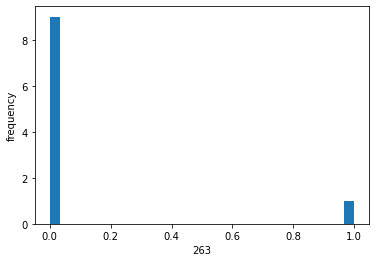

6
4
[1.0000000e+00 3.4138717e-17 7.1892443e-18 9.7734839e-18 2.9283160e-17
 3.8157054e-17 2.8125269e-17 1.4930210e-17 3.9302117e-17 2.6639441e-17]
5


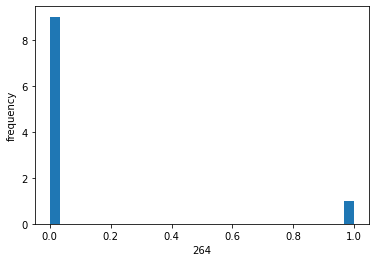

6
4
[1.0000000e+00 1.6226550e-12 5.5947120e-13 6.8701772e-13 1.5119039e-12
 1.8092982e-12 1.4429330e-12 9.2098985e-13 1.8424162e-12 1.4062932e-12]
5


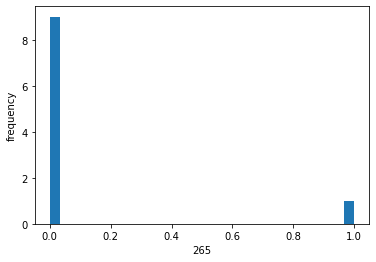

6
4
[1.0000000e+00 3.1968145e-08 1.6904094e-08 1.9046645e-08 3.1517100e-08
 3.5020317e-08 3.0202418e-08 2.2929463e-08 3.5326302e-08 3.0192339e-08]
5


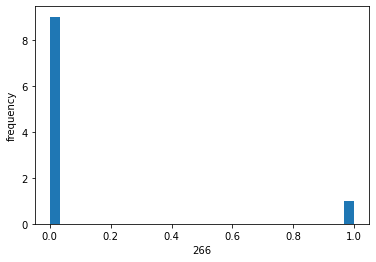

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


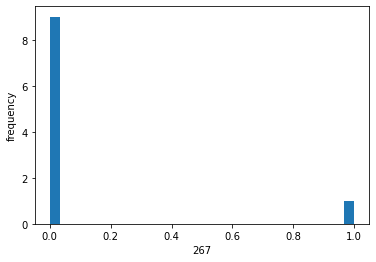

6
4
[1.0000000e+00 2.9361788e-10 1.2671053e-10 1.4897210e-10 2.8054217e-10
 3.1989950e-10 2.6864147e-10 1.8640720e-10 3.2415784e-10 2.6506441e-10]
5


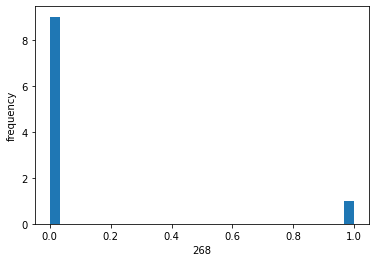

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


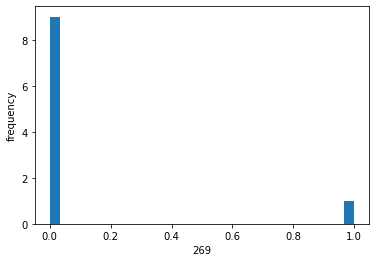

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


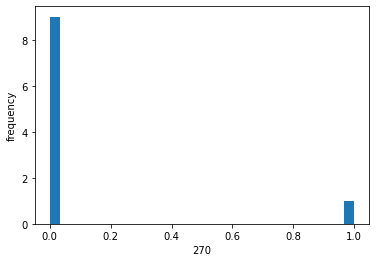

6
4
[1.0000000e+00 5.9205210e-09 2.9158769e-09 3.3329970e-09 5.7912866e-09
 6.5122379e-09 5.5398881e-09 4.0816954e-09 6.5797336e-09 5.5136713e-09]
5


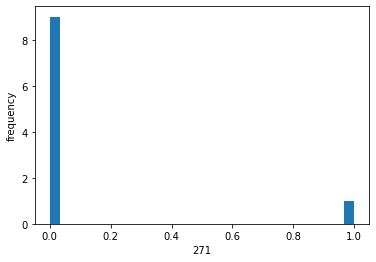

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


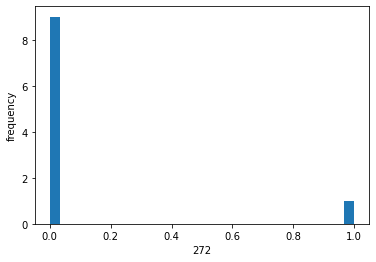

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


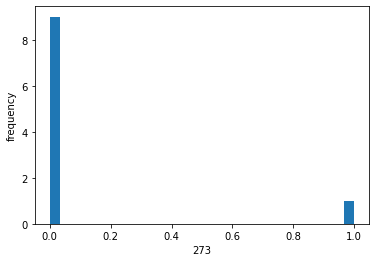

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


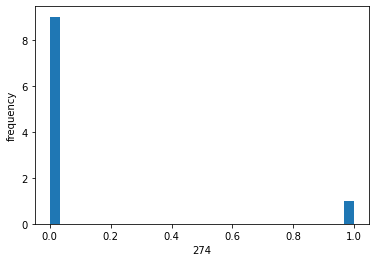

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


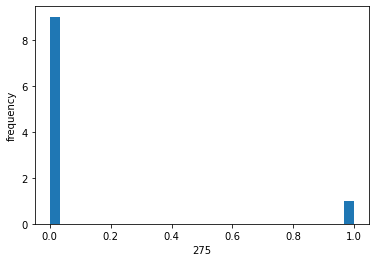

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


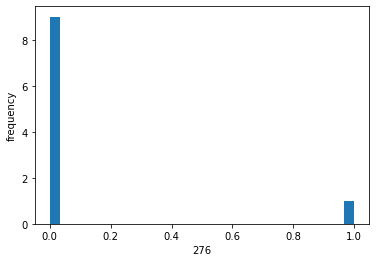

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


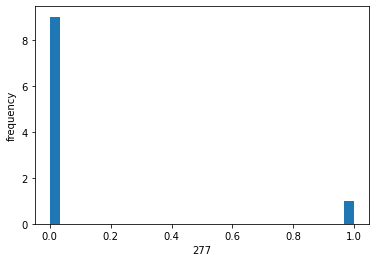

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


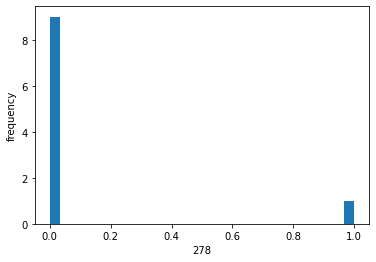

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


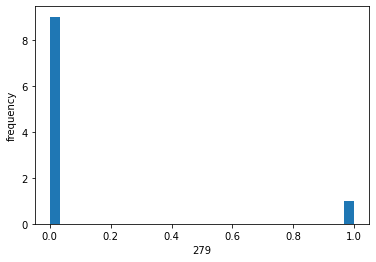

6
4
[1.0000000e+00 2.1188566e-09 1.0001365e-09 1.1528443e-09 2.0636122e-09
 2.3379865e-09 1.9728832e-09 1.4264183e-09 2.3638185e-09 1.9573099e-09]
5


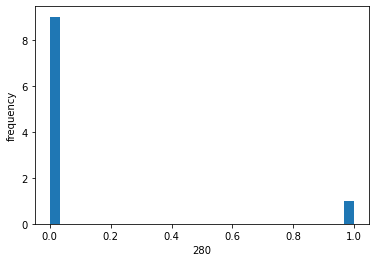

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


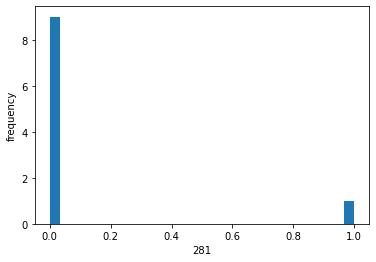

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


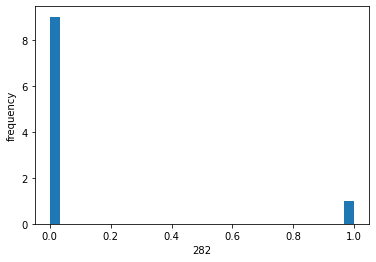

6
4
[1.0000000e+00 1.3062221e-12 4.4589790e-13 5.4886250e-13 1.2151363e-12
 1.4568542e-12 1.1600442e-12 7.3741675e-13 1.4834616e-12 1.1296650e-12]
5


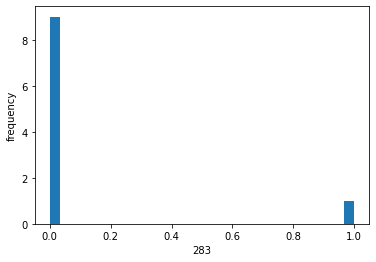

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


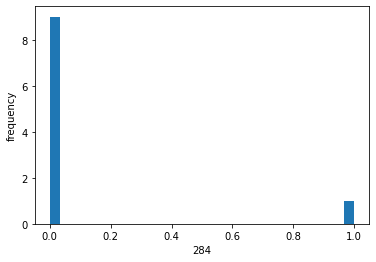

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


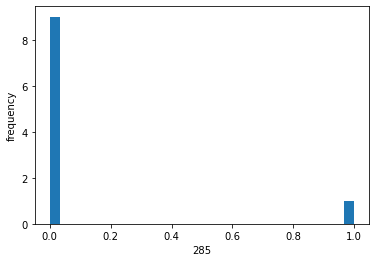

6
4
[1.00000000e+00 1.60549865e-30 7.82752754e-32 1.42775791e-31
 1.02987167e-30 1.72446056e-30 1.05004785e-30 3.28121192e-31
 1.88737166e-30 8.93144745e-31]
5


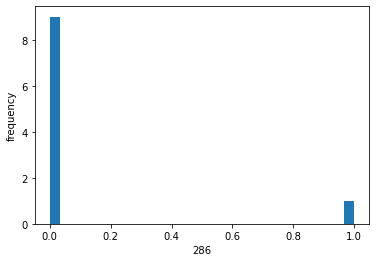

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


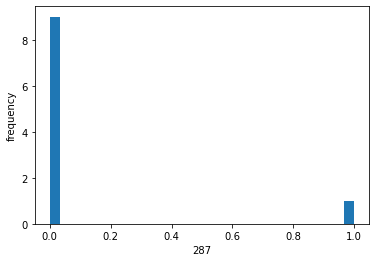

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


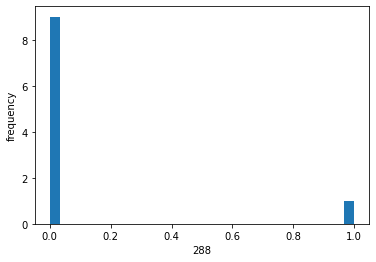

6
4
[1.0000000e+00 2.9197370e-18 5.4808357e-19 7.6296751e-19 2.4530628e-18
 3.2592155e-18 2.3623654e-18 1.2025391e-18 3.3697752e-18 2.2204903e-18]
5


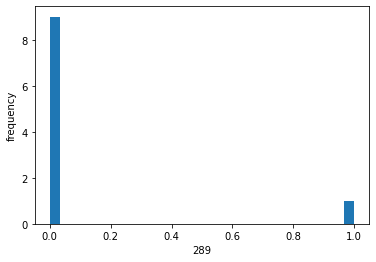

6
4
[1.0000000e+00 2.0172244e-20 3.0284649e-21 4.4052142e-21 1.6381598e-20
 2.2575213e-20 1.5821602e-20 7.3851727e-21 2.3494396e-20 1.4641300e-20]
5


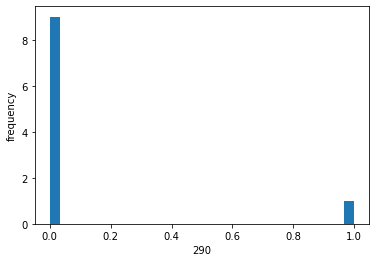

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


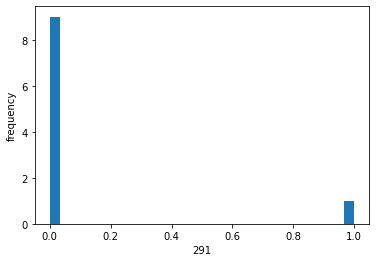

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


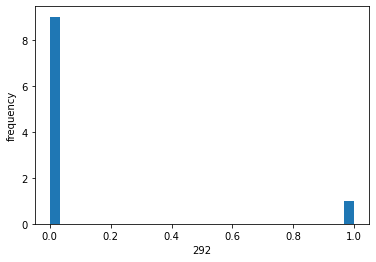

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


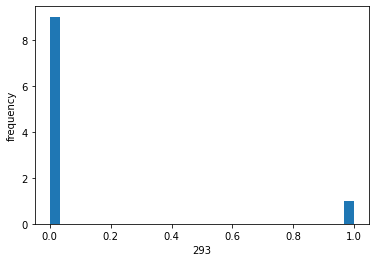

6
4
[1.0000000e+00 5.6303166e-13 1.8506285e-13 2.2951720e-13 5.2059702e-13
 6.2828692e-13 4.9706994e-13 3.1150785e-13 6.4032449e-13 4.8314044e-13]
5


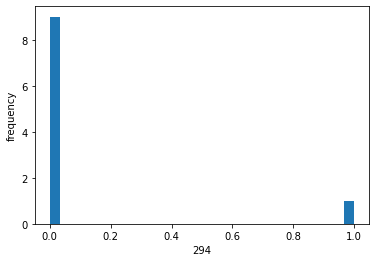

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


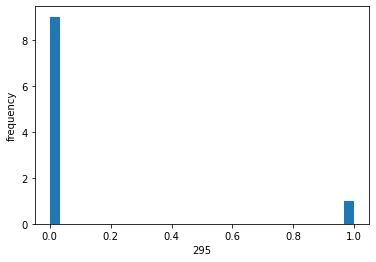

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


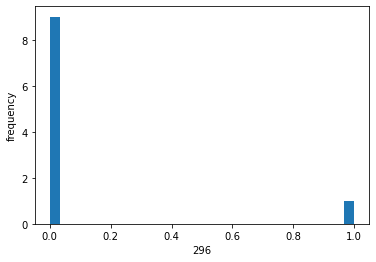

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


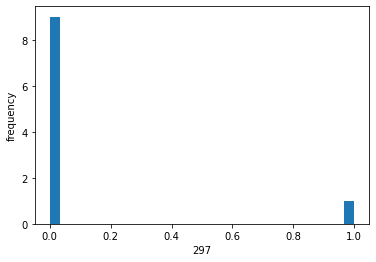

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


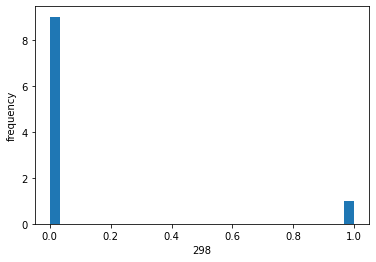

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


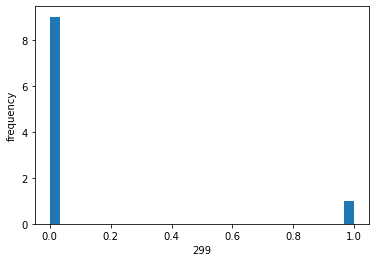

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


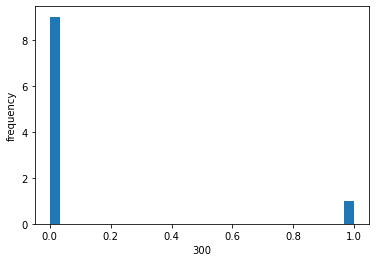

6
4
[1.0000000e+00 2.7774392e-09 1.3249303e-09 1.5243399e-09 2.7056946e-09
 3.0611738e-09 2.5881421e-09 1.8809949e-09 3.0945002e-09 2.5699072e-09]
5


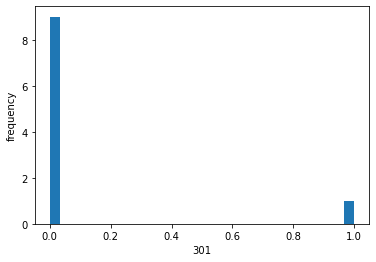

6
4
[1.0000000e+00 1.0131534e-18 1.8113911e-19 2.5466094e-19 8.4414154e-19
 1.1307933e-18 8.1383080e-19 4.0675301e-19 1.1709734e-18 7.6233327e-19]
5


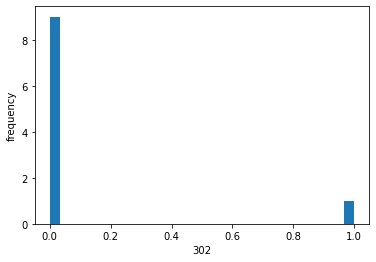

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


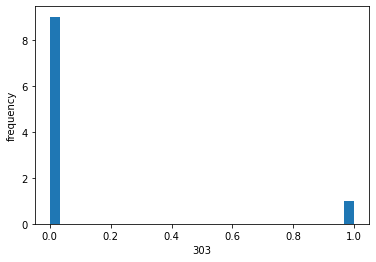

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


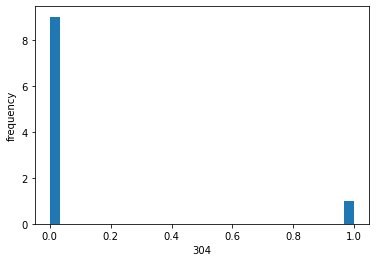

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


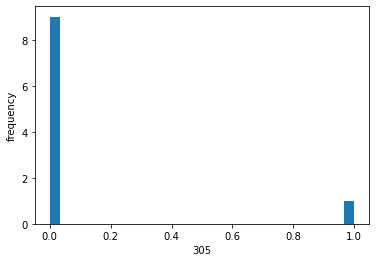

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


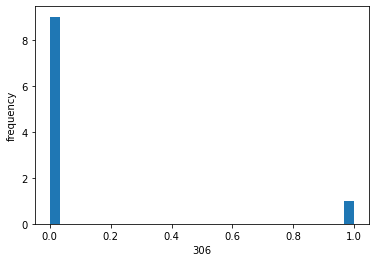

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


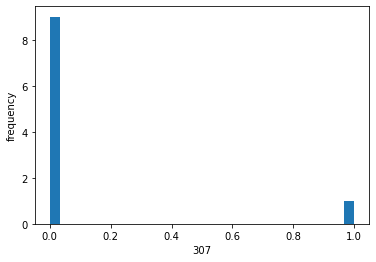

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


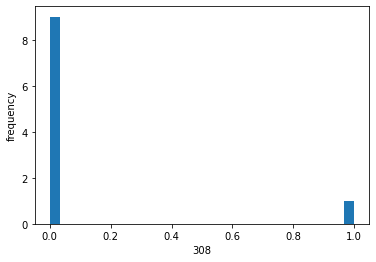

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


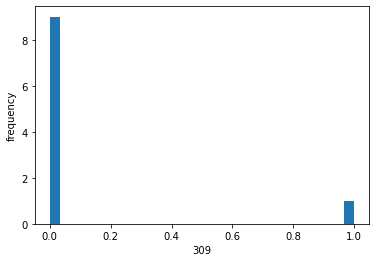

6
4
[1.0000000e+00 3.1968145e-08 1.6904094e-08 1.9046645e-08 3.1517100e-08
 3.5020317e-08 3.0202418e-08 2.2929463e-08 3.5326302e-08 3.0192339e-08]
5


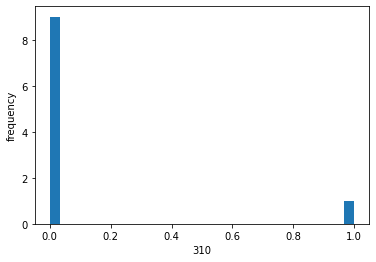

6
4
[1.0000000e+00 8.6489939e-17 1.9023467e-17 2.5625450e-17 7.4754357e-17
 9.6700213e-17 7.1745636e-17 3.8694861e-17 9.9479460e-17 6.8143073e-17]
5


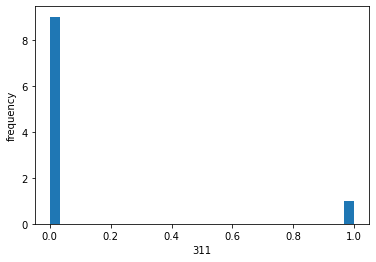

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


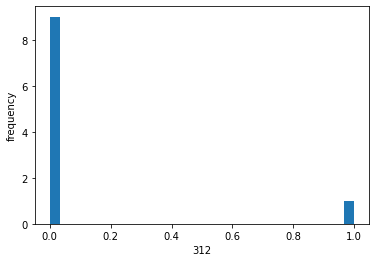

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


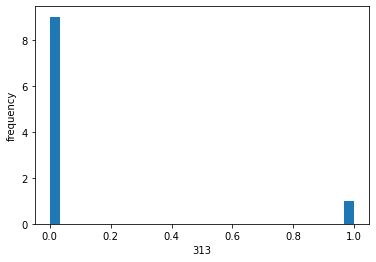

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


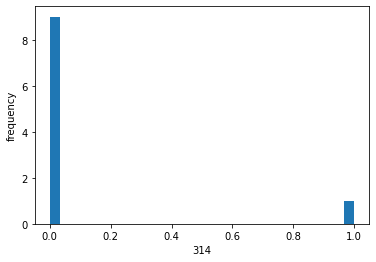

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


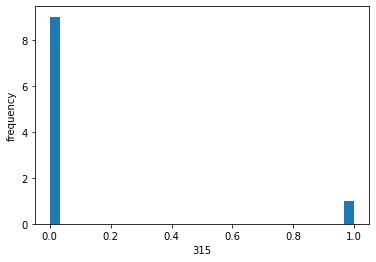

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


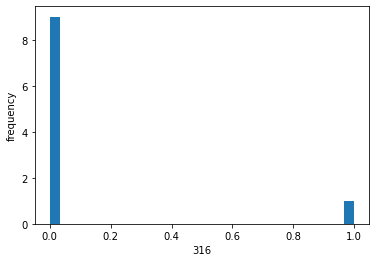

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


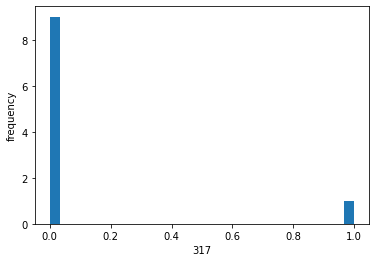

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


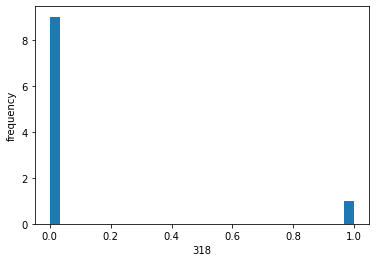

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


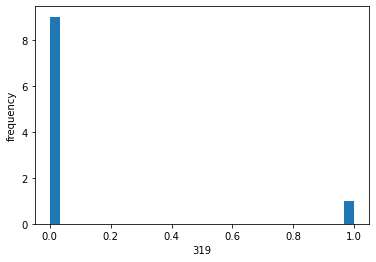

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


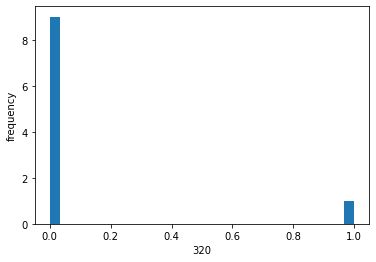

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


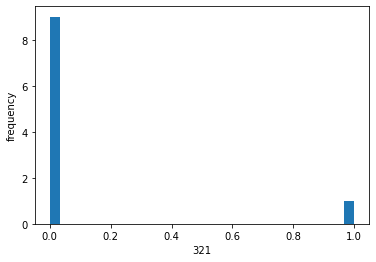

6
4
[1.0000000e+00 1.4037299e-10 5.8979842e-11 6.9573486e-11 1.3470064e-10
 1.5571132e-10 1.2856535e-10 8.8648727e-11 1.5786504e-10 1.2668637e-10]
5


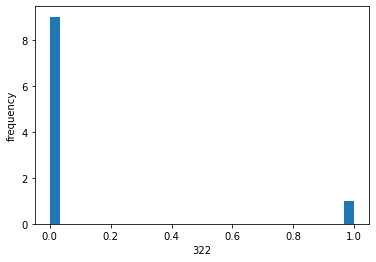

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


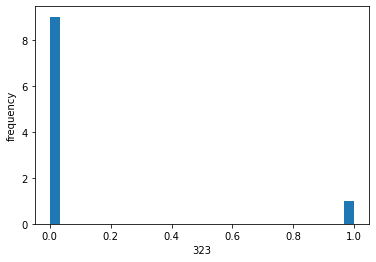

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


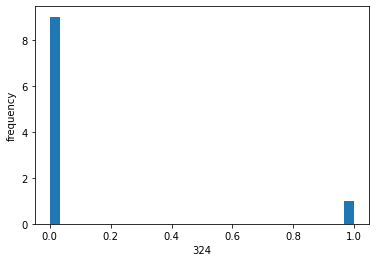

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


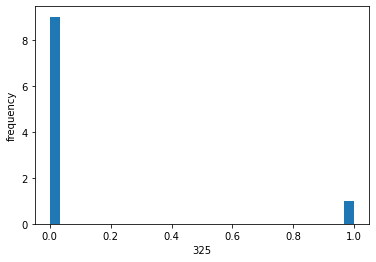

6
4
[1.0000000e+00 4.0509575e-21 5.5841315e-22 8.2804046e-22 3.2147090e-21
 4.5005722e-21 3.1247418e-21 1.4211413e-21 4.7025460e-21 2.8741263e-21]
5


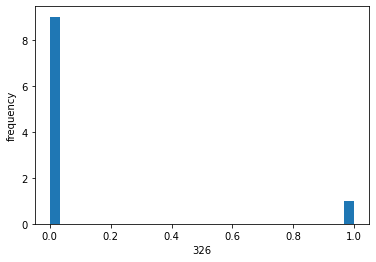

6
4
[1.0000000e+00 5.9205210e-09 2.9158769e-09 3.3329970e-09 5.7912866e-09
 6.5122379e-09 5.5398881e-09 4.0816954e-09 6.5797336e-09 5.5136713e-09]
5


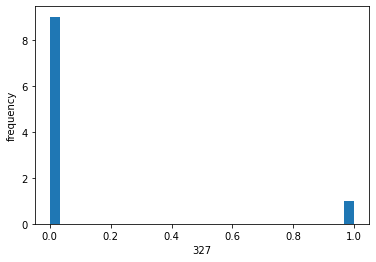

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


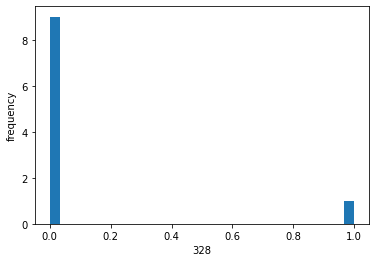

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


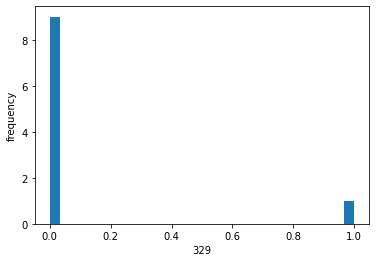

6
4
[1.0000000e+00 2.1188566e-09 1.0001365e-09 1.1528443e-09 2.0636122e-09
 2.3379865e-09 1.9728832e-09 1.4264183e-09 2.3638185e-09 1.9573099e-09]
5


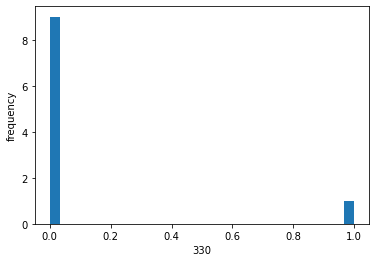

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


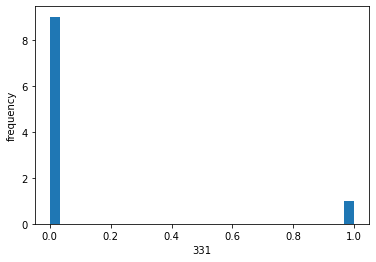

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


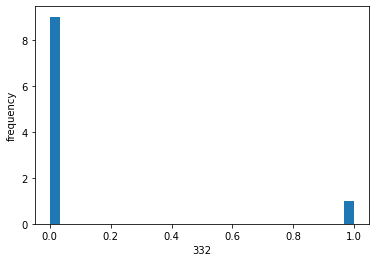

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


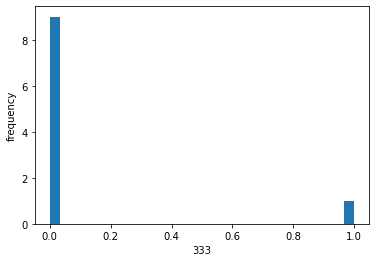

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


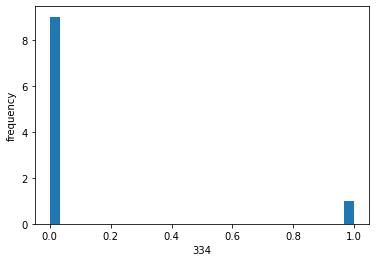

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


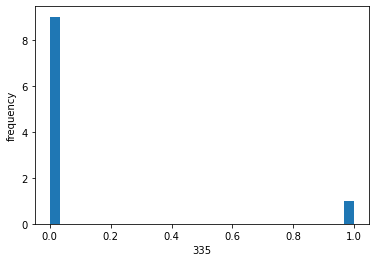

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


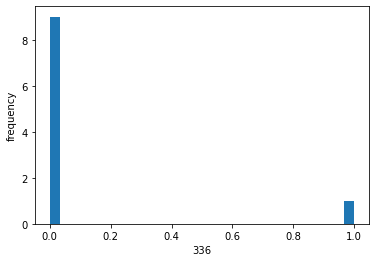

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


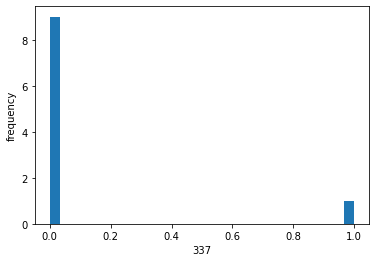

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


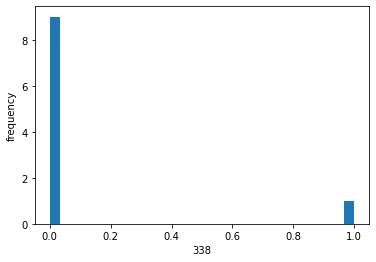

6
4
[1.0000000e+00 9.4942141e-38 0.0000000e+00 0.0000000e+00 5.0459951e-38
 9.7257423e-38 5.4094336e-38 1.2623111e-38 1.1166709e-37 4.3151464e-38]
5


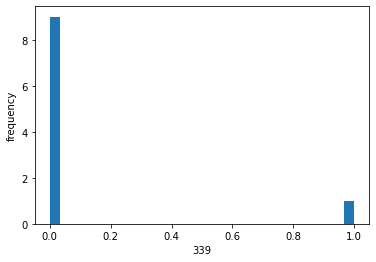

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


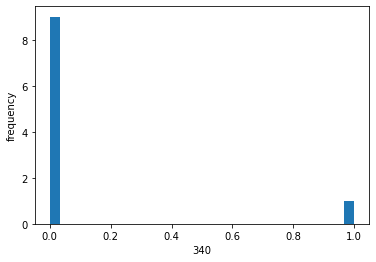

6
4
[1.0000000e+00 2.7637468e-28 1.7229556e-29 2.9944949e-29 1.8630739e-28
 2.9922013e-28 1.8783094e-28 6.4196529e-29 3.2389962e-28 1.6278870e-28]
5


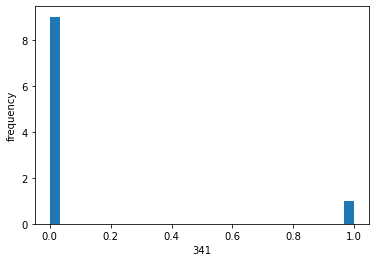

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


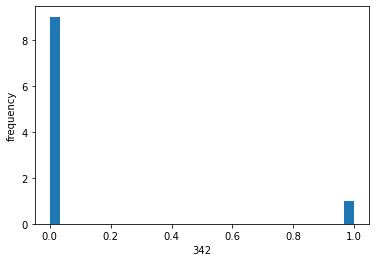

6
4
[1.0000000e+00 5.9205210e-09 2.9158769e-09 3.3329970e-09 5.7912866e-09
 6.5122379e-09 5.5398881e-09 4.0816954e-09 6.5797336e-09 5.5136713e-09]
5


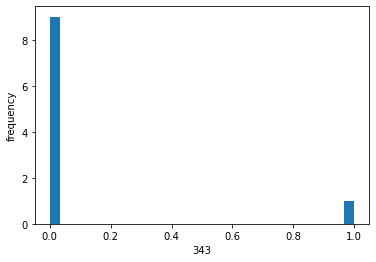

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


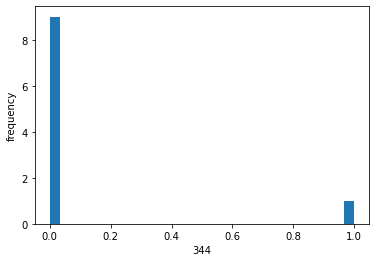

6
4
[1.0000000e+00 3.1968145e-08 1.6904094e-08 1.9046645e-08 3.1517100e-08
 3.5020317e-08 3.0202418e-08 2.2929463e-08 3.5326302e-08 3.0192339e-08]
5


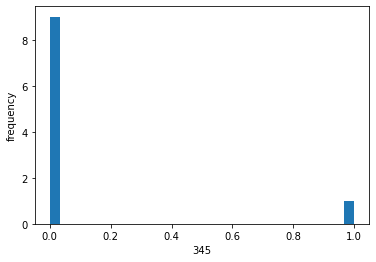

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


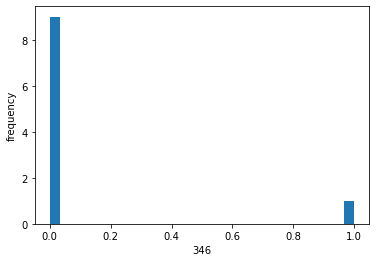

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


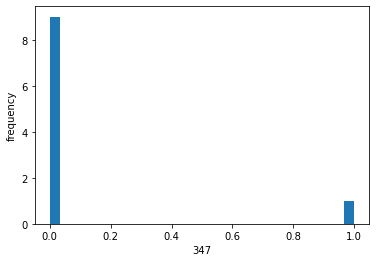

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


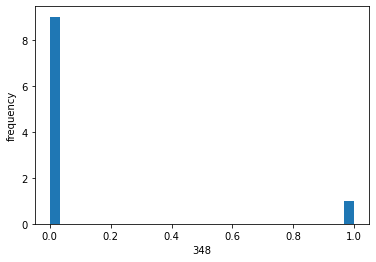

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


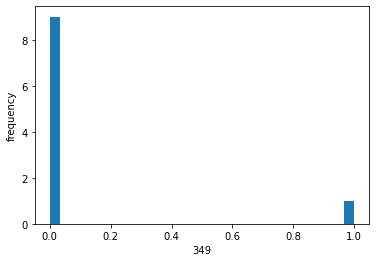

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


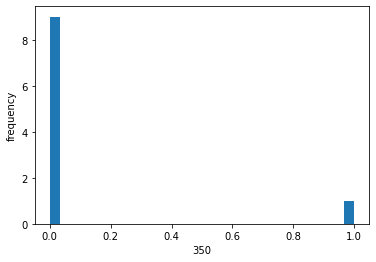

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


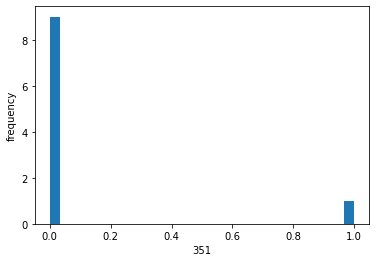

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


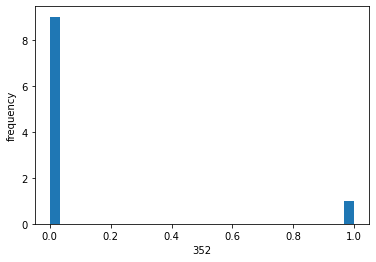

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


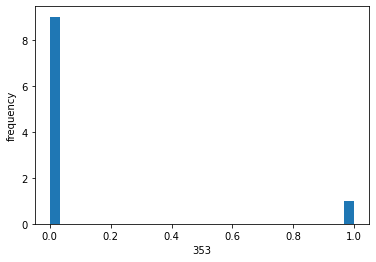

6
4
[1.0000000e+00 8.8042692e-13 2.9546572e-13 3.6505196e-13 8.1741910e-13
 9.8284878e-13 7.8045258e-13 4.9239242e-13 1.0011504e-12 7.5886259e-13]
5


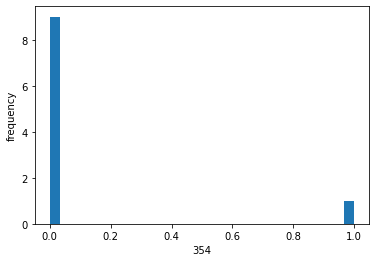

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


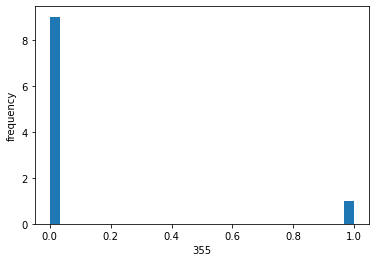

6
4
[1.0000000e+00 6.4390091e-20 1.0120631e-20 1.4610223e-20 5.2405317e-20
 7.1754558e-20 5.0715723e-20 2.4171489e-20 7.4615775e-20 4.7072328e-20]
5


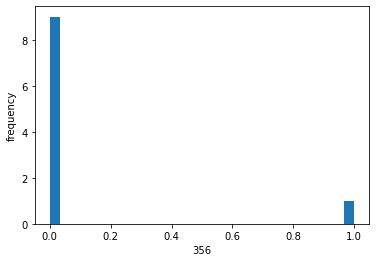

6
4
[1.0000000e+00 1.6568446e-08 8.5540552e-09 9.6721635e-09 1.6335768e-08
 1.8211948e-08 1.5635162e-08 1.1721123e-08 1.8386146e-08 1.5592576e-08]
5


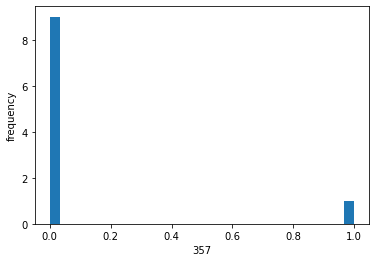

6
4
[1.0000000e+00 2.4400499e-09 1.1590109e-09 1.3339676e-09 2.3782767e-09
 2.6917246e-09 2.2740947e-09 1.6481729e-09 2.7222229e-09 2.2566384e-09]
5


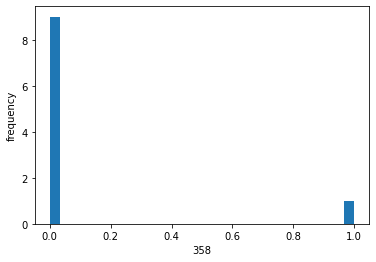

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


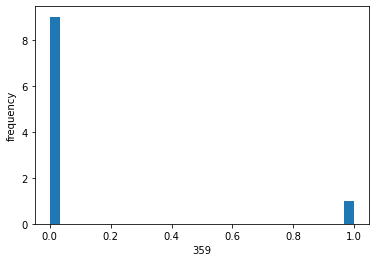

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


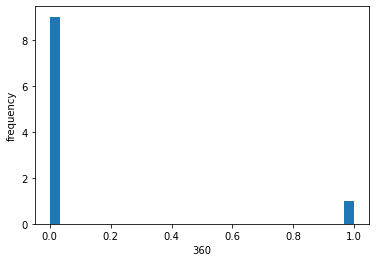

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


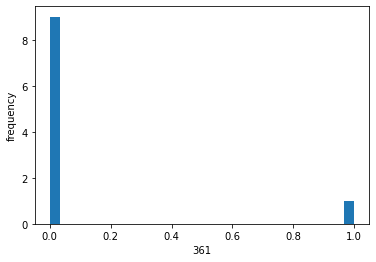

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


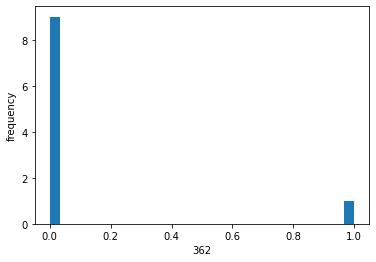

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


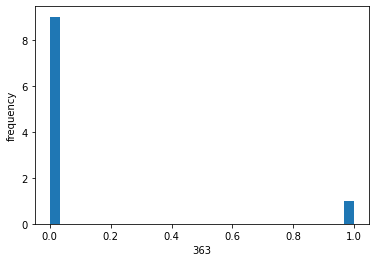

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


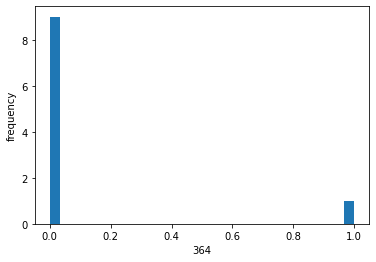

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


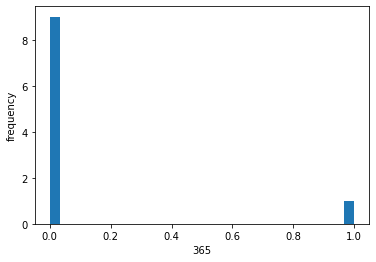

6
4
[1.00000000e+00 1.53725249e-22 1.81080007e-23 2.77381954e-23
 1.18211046e-22 1.70002630e-22 1.15633592e-22 4.97506553e-23
 1.78642374e-22 1.05160346e-22]
5


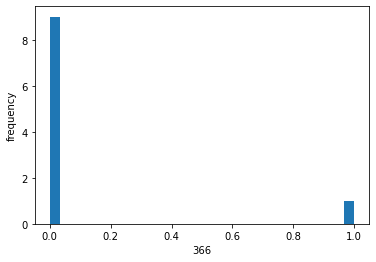

6
4
[1.0000000e+00 7.6778336e-23 8.7488114e-24 1.3490749e-23 5.8651688e-23
 8.4836550e-23 5.7447748e-23 2.4421417e-23 8.9271242e-23 5.2119743e-23]
5


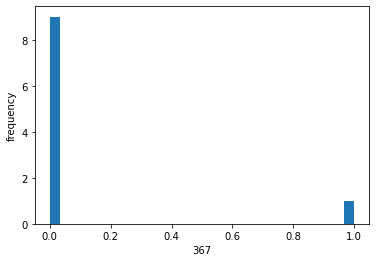

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


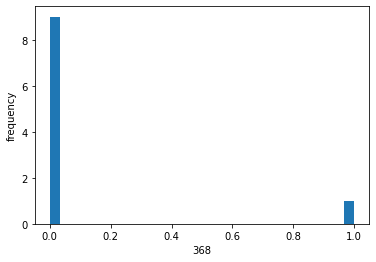

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


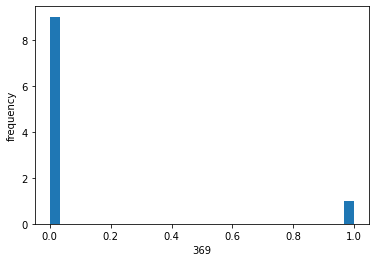

6
4
[1.0000000e+00 6.4944876e-09 3.1811020e-09 3.6846008e-09 6.2058718e-09
 6.9543842e-09 6.0155911e-09 4.3985411e-09 7.0508559e-09 5.9714305e-09]
5


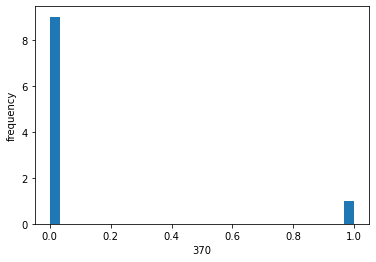

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


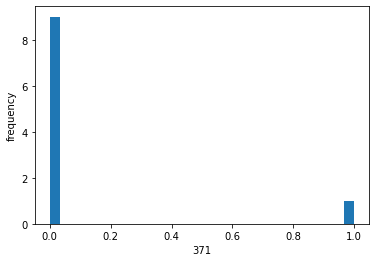

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


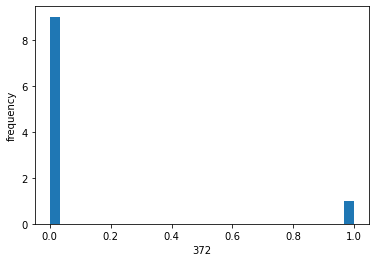

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


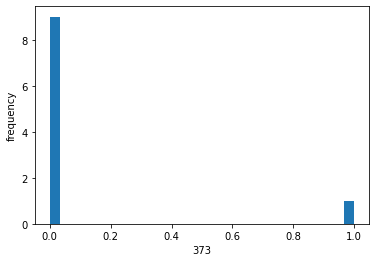

6
4
[1.0000000e+00 3.0066767e-27 2.1113568e-28 3.5831091e-28 2.0845877e-27
 3.2780657e-27 2.0867597e-27 7.4304448e-28 3.5237404e-27 1.8247689e-27]
5


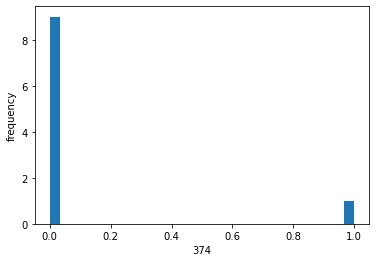

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


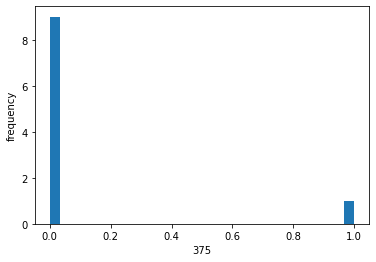

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


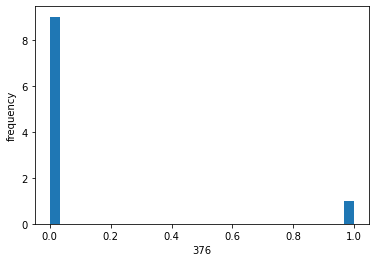

6
4
[1.0000000e+00 6.1847083e-09 3.0515959e-09 3.4871595e-09 6.0481153e-09
 6.8028032e-09 5.7887686e-09 4.2678900e-09 6.8708461e-09 5.7608029e-09]
5


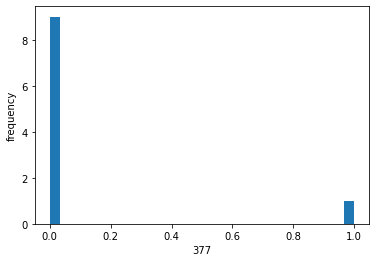

6
4
[1.0000000e+00 5.9205210e-09 2.9158769e-09 3.3329970e-09 5.7912866e-09
 6.5122379e-09 5.5398881e-09 4.0816954e-09 6.5797336e-09 5.5136713e-09]
5


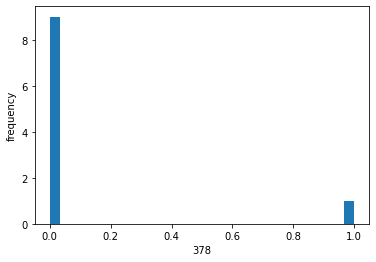

6
4
[1.0000000e+00 2.7767836e-12 9.8107319e-13 1.1988648e-12 2.5978369e-12
 3.0957413e-12 2.4792846e-12 1.5966208e-12 3.1505495e-12 2.4188743e-12]
5


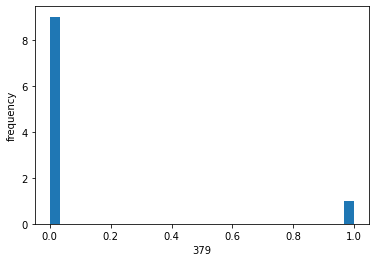

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


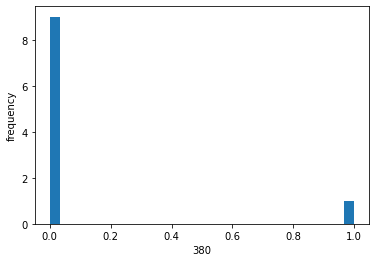

6
4
[1.0000000e+00 3.0152812e-26 2.4915769e-27 4.0679639e-27 2.2446509e-26
 3.3848481e-26 2.1807918e-26 8.0550063e-27 3.5802434e-26 1.9385046e-26]
5


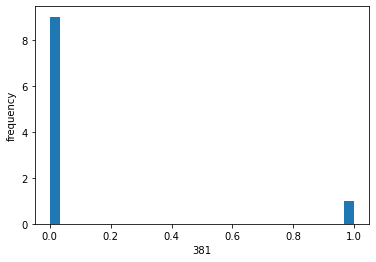

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


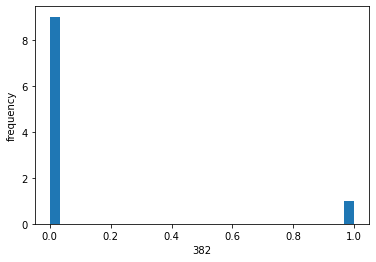

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


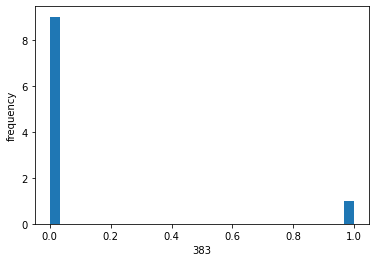

6
4
[1.0000000e+00 1.5838167e-25 1.3421433e-26 2.1944192e-26 1.1392322e-25
 1.7345260e-25 1.1307031e-25 4.3170826e-26 1.8504125e-25 1.0034034e-25]
5


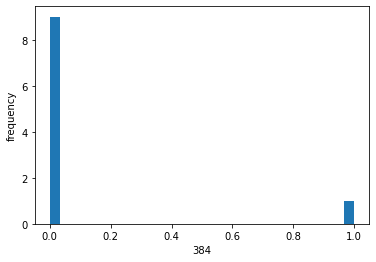

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


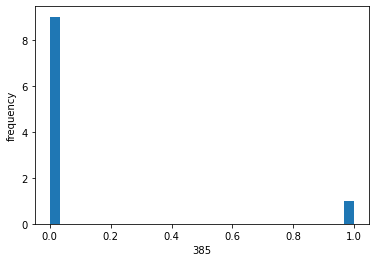

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


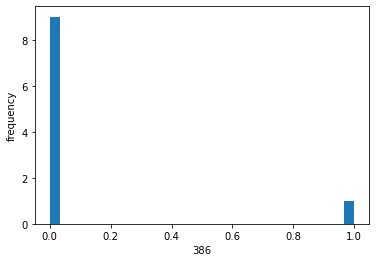

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


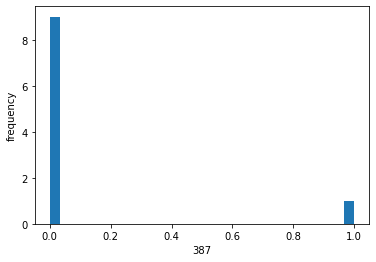

6
4
[1.0000000e+00 9.0234942e-10 4.1064002e-10 4.7687709e-10 8.7500418e-10
 9.9746378e-10 8.3595941e-10 5.9534366e-10 1.0091831e-09 8.2751977e-10]
5


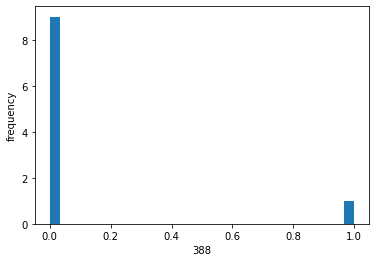

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


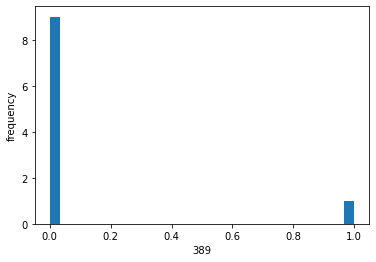

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


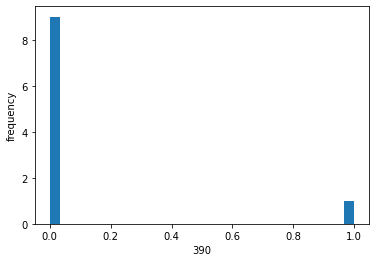

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


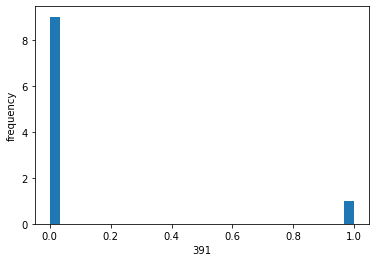

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


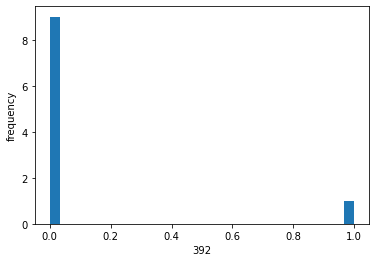

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


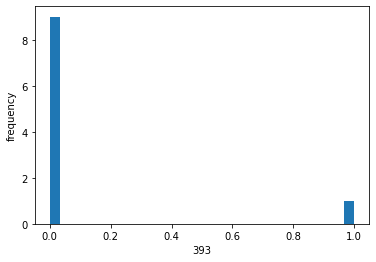

6
4
[1.0000000e+00 5.2814374e-18 1.0204922e-18 1.4119248e-18 4.4646528e-18
 5.9016541e-18 4.2944500e-18 2.2077448e-18 6.0957793e-18 4.0442163e-18]
5


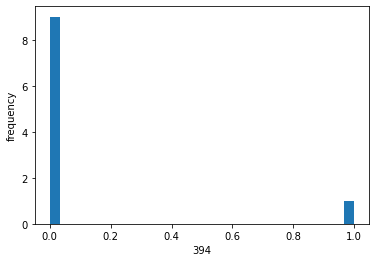

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


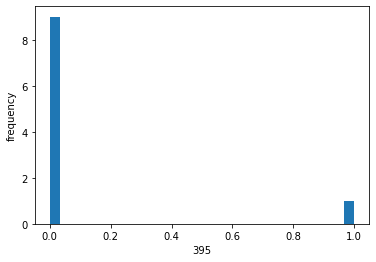

6
4
[1.0000000e+00 5.9205210e-09 2.9158769e-09 3.3329970e-09 5.7912866e-09
 6.5122379e-09 5.5398881e-09 4.0816954e-09 6.5797336e-09 5.5136713e-09]
5


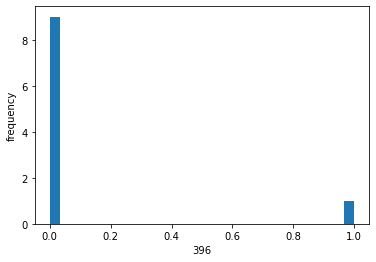

6
4
[1.0000000e+00 3.7279324e-10 1.6332199e-10 1.9117272e-10 3.5979414e-10
 4.1286177e-10 3.4360423e-10 2.4085736e-10 4.1806722e-10 3.3929035e-10]
5


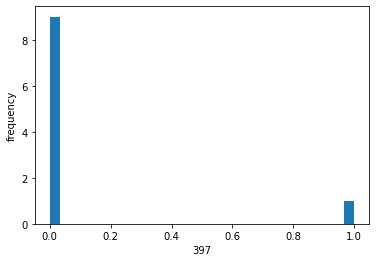

6
4
[1.0000000e+00 1.0953814e-30 5.2090886e-32 9.5622851e-32 6.9566677e-31
 1.1709931e-30 7.1209882e-31 2.2089603e-31 1.2851721e-30 6.0403238e-31]
5


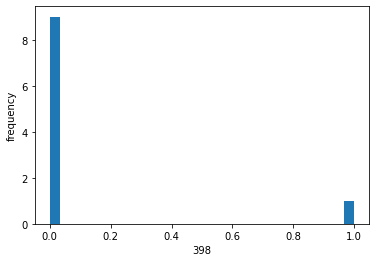

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


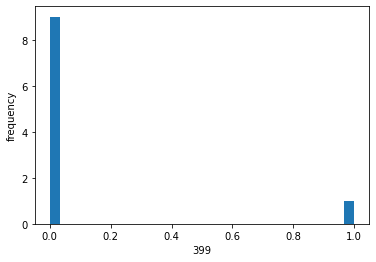

6
4
[1.0000000e+00 1.7314537e-08 8.9187804e-09 1.0107574e-08 1.7012191e-08
 1.8999078e-08 1.6303490e-08 1.2237539e-08 1.9172722e-08 1.6263641e-08]
5


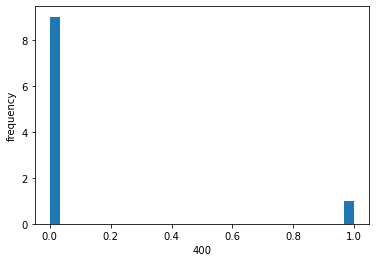

6
4
[1.00000000e+00 1.90925321e-32 7.46485565e-34 1.42391635e-33
 1.16267720e-32 2.02364761e-32 1.20300312e-32 3.47403874e-33
 2.24341128e-32 1.00448747e-32]
5


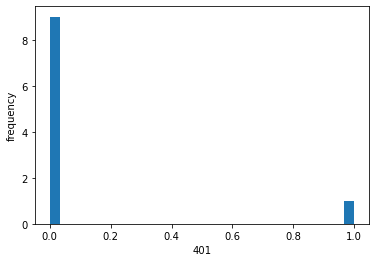

6
4
[1.00000000e+00 2.88889242e-11 1.13335825e-11 1.35507135e-11
 2.74683297e-11 3.21219995e-11 2.61933218e-11 1.75779183e-11
 3.26193239e-11 2.57183164e-11]
5


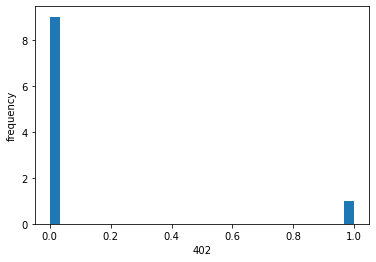

6
4
[1.0000000e+00 5.9205210e-09 2.9158769e-09 3.3329970e-09 5.7912866e-09
 6.5122379e-09 5.5398881e-09 4.0816954e-09 6.5797336e-09 5.5136713e-09]
5


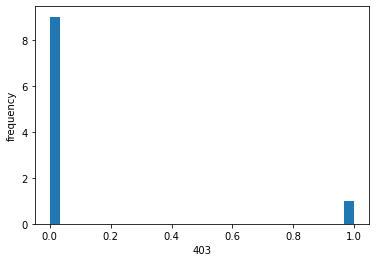

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


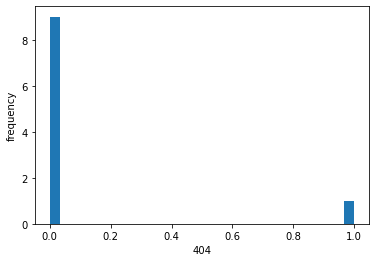

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


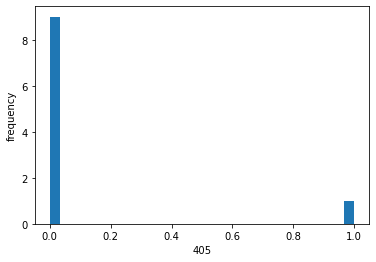

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


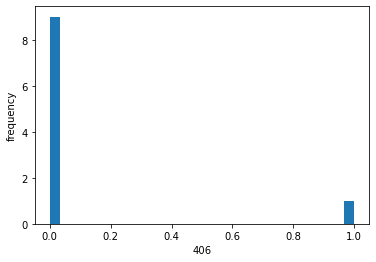

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


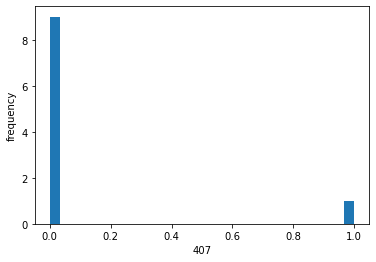

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


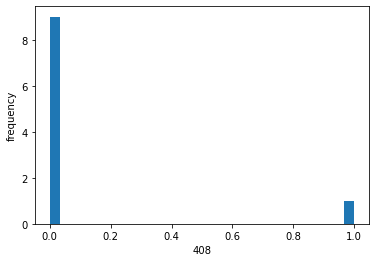

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


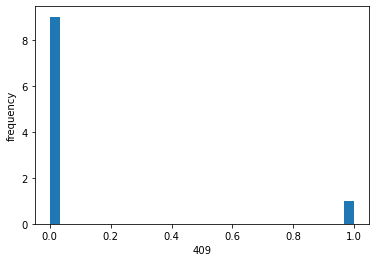

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


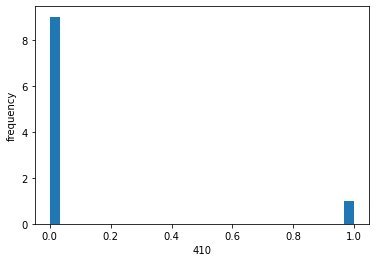

6
4
[1.0000000e+00 3.2092827e-35 9.2084681e-37 1.8656195e-36 1.8286080e-35
 3.3527182e-35 1.9234543e-35 4.9683757e-36 3.7787190e-35 1.5687044e-35]
5


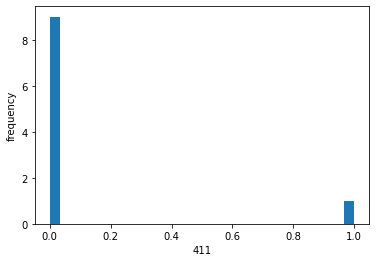

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


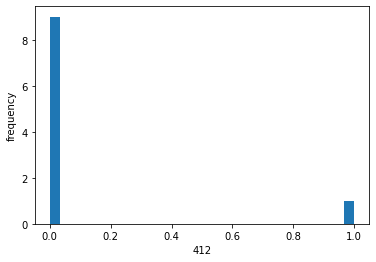

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


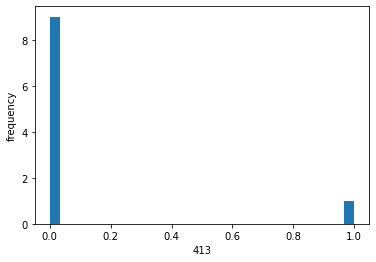

6
4
[1.0000000e+00 5.6122255e-33 2.1005372e-34 4.0343678e-34 3.4273621e-33
 5.9963756e-33 3.5362393e-33 9.9846995e-34 6.6296397e-33 2.9428949e-33]
5


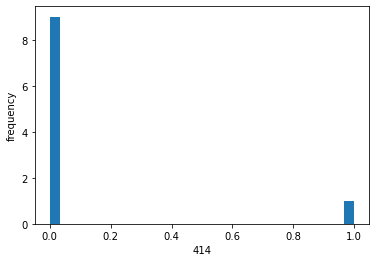

6
4
[1.0000000e+00 5.3655806e-29 3.1349596e-30 5.5129504e-30 3.6083868e-29
 5.8463204e-29 3.6316972e-29 1.2044698e-29 6.3228744e-29 3.1315070e-29]
5


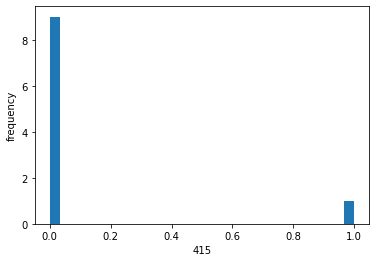

6
4
[1.0000000e+00 1.5725464e-18 2.8681929e-19 4.0166929e-19 1.3144280e-18
 1.7550922e-18 1.2669551e-18 6.3796491e-19 1.8161592e-18 1.1883206e-18]
5


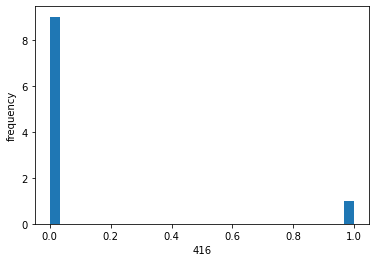

6
4
[1.0000000e+00 3.0972821e-35 8.9507251e-37 1.8060833e-36 1.7779682e-35
 3.2528156e-35 1.8634653e-35 4.8143392e-36 3.6567087e-35 1.5214731e-35]
5


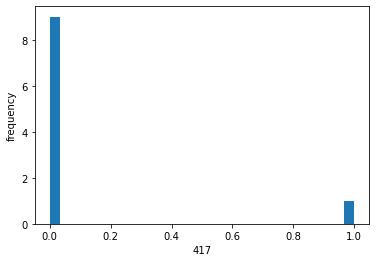

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


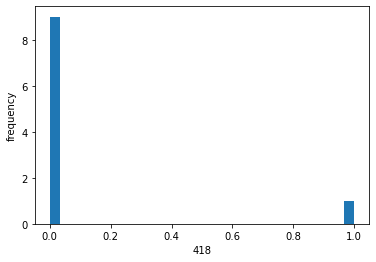

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


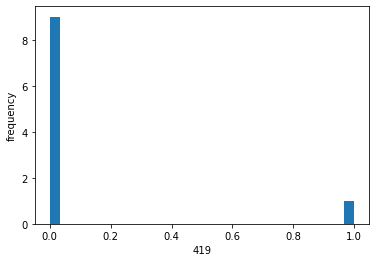

6
4
[1.0000000e+00 1.2027594e-33 4.1034198e-35 8.0399314e-35 7.0983310e-34
 1.2646326e-33 7.4061985e-34 2.0372467e-34 1.4129216e-33 6.1177437e-34]
5


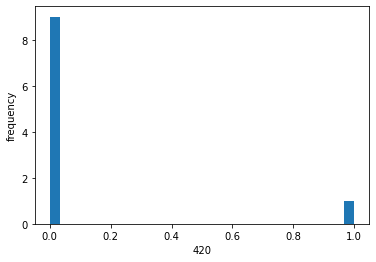

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


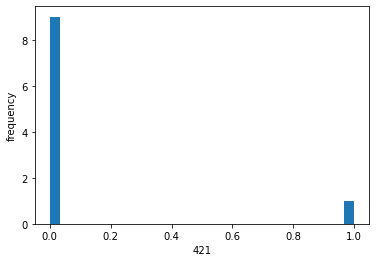

6
4
[1.0000000e+00 8.5159193e-15 2.3162436e-15 2.9849132e-15 7.6373776e-15
 9.5240342e-15 7.3037788e-15 4.2601916e-15 9.7479567e-15 7.0254492e-15]
5


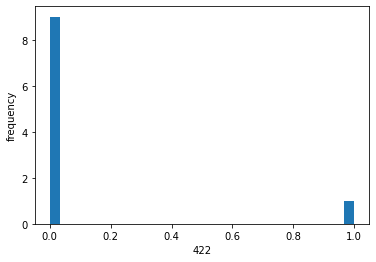

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


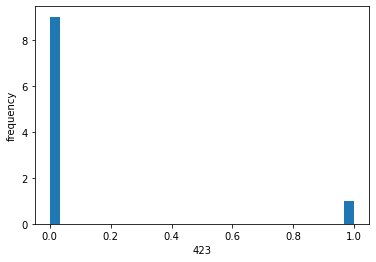

6
4
[1.00000000e+00 1.00806662e-14 2.76186803e-15 3.55474698e-15
 9.04963563e-15 1.12722094e-14 8.65530622e-15 5.06263546e-15
 1.15338452e-14 8.32823715e-15]
5


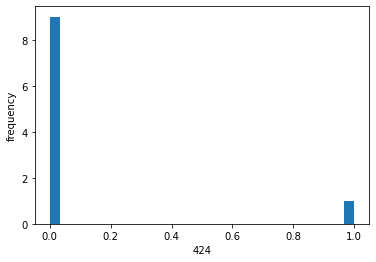

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


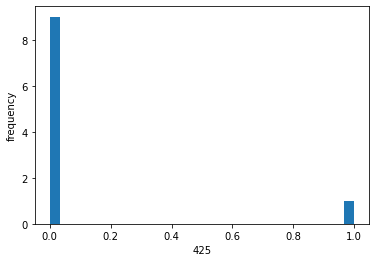

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


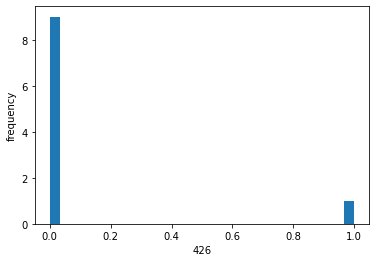

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


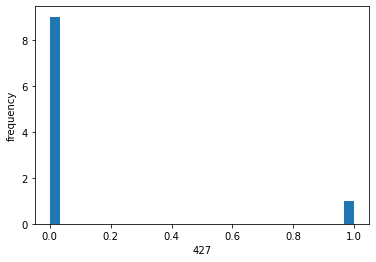

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


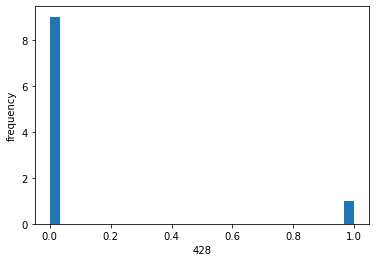

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


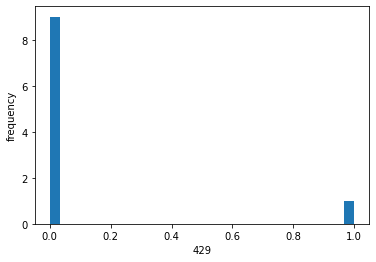

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


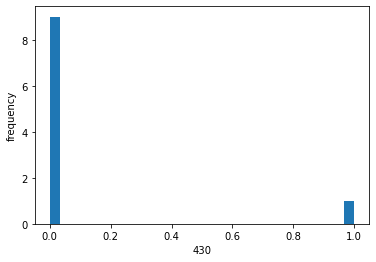

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


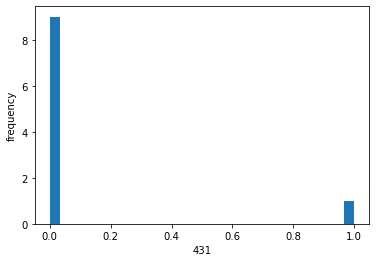

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


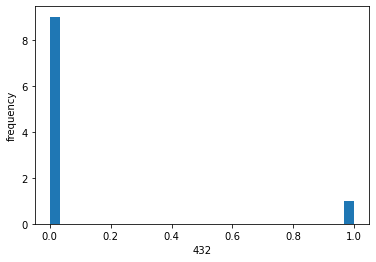

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


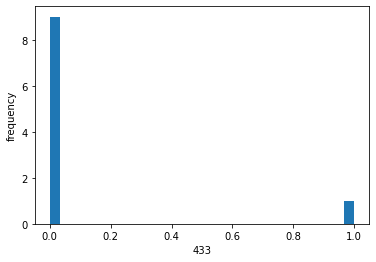

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


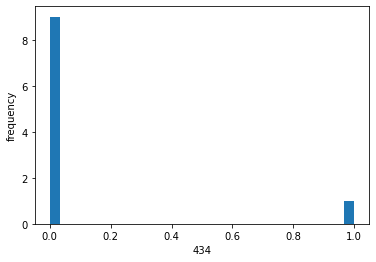

6
4
[1.00000000e+00 5.84469665e-20 9.18219998e-21 1.32536266e-20
 4.77137617e-20 6.52958927e-20 4.61277172e-20 2.19130565e-20
 6.78861054e-20 4.27817619e-20]
5


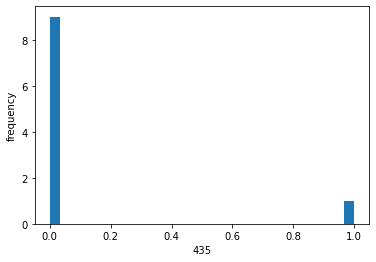

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


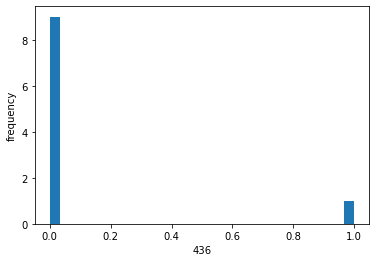

6
4
[1.0000000e+00 4.9508558e-10 2.1976916e-10 2.5646762e-10 4.7875726e-10
 5.4828475e-10 4.5735996e-10 3.2215464e-10 5.5499855e-10 4.5187035e-10]
5


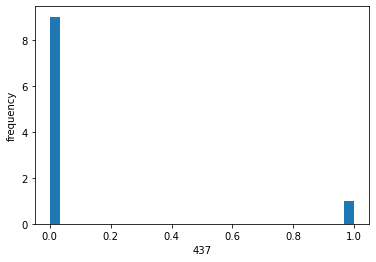

6
4
[1.0000000e+00 3.9974837e-09 1.9331343e-09 2.2202715e-09 3.8914174e-09
 4.3757971e-09 3.7253542e-09 2.7194829e-09 4.4245834e-09 3.7033847e-09]
5


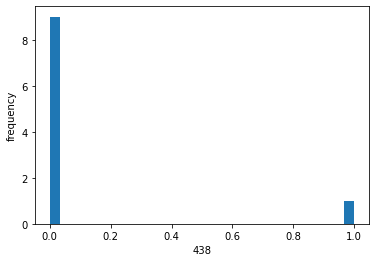

6
4
[1.0000000e+00 7.8583895e-13 2.6221587e-13 3.2420247e-13 7.2838366e-13
 8.7672355e-13 6.9537334e-13 4.3829217e-13 8.9326197e-13 6.7644517e-13]
5


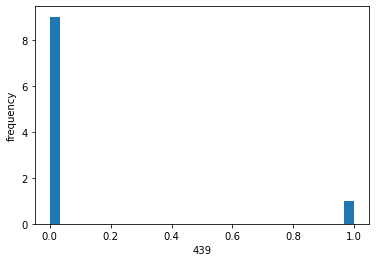

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


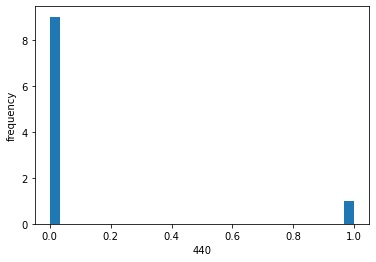

6
4
[1.00000000e+00 4.67455427e-29 2.71683057e-30 4.78221232e-30
 3.14381130e-29 5.09676175e-29 3.16308234e-29 1.04663715e-29
 5.50965224e-29 2.72664344e-29]
5


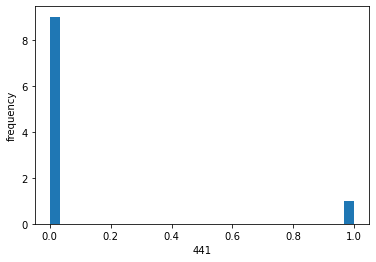

6
4
[1.0000000e+00 8.4378522e-09 4.2149830e-09 4.8061111e-09 8.2449372e-09
 9.2169286e-09 7.9022193e-09 5.8372875e-09 9.3079819e-09 7.8628730e-09]
5


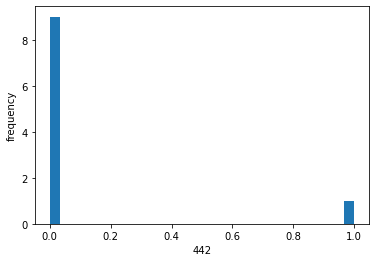

6
4
[1.0000000e+00 4.5075364e-26 3.6348885e-27 5.9939242e-27 3.2365046e-26
 4.9588955e-26 3.2042451e-26 1.1970649e-26 5.2883916e-26 2.8351458e-26]
5


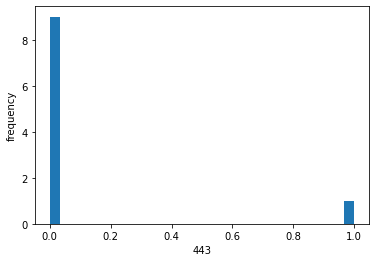

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


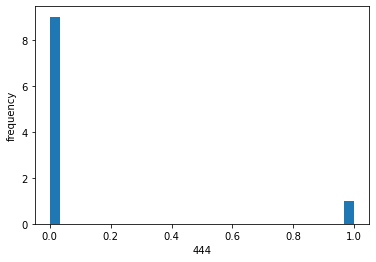

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


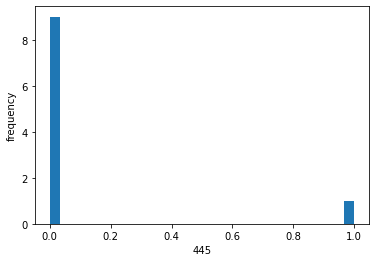

6
4
[1.0000000e+00 1.5248022e-09 7.1080508e-10 8.2082158e-10 1.4810664e-09
 1.6700392e-09 1.4162846e-09 1.0132315e-09 1.6895124e-09 1.4025263e-09]
5


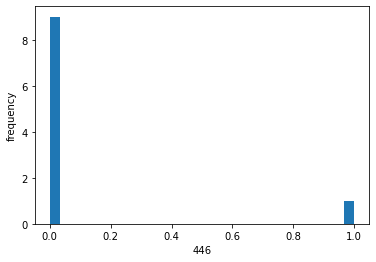

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


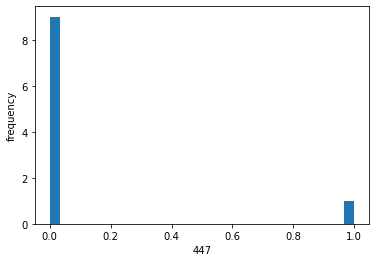

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


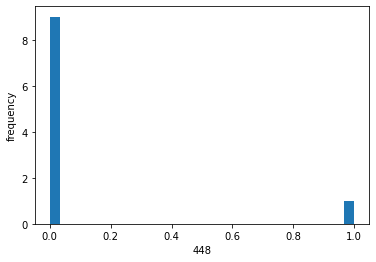

6
4
[1.0000000e+00 1.7128409e-25 1.4569828e-26 2.3801665e-26 1.2329790e-25
 1.8759277e-25 1.2233932e-25 4.6781116e-26 2.0010630e-25 1.0860931e-25]
5


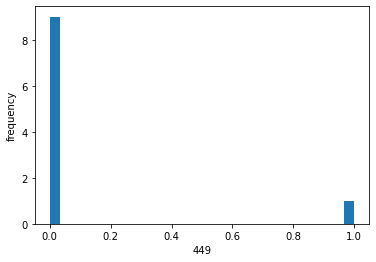

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


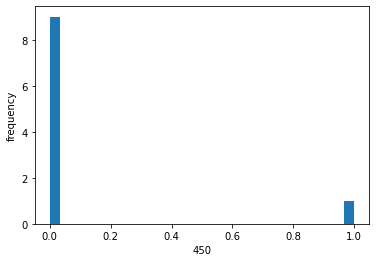

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


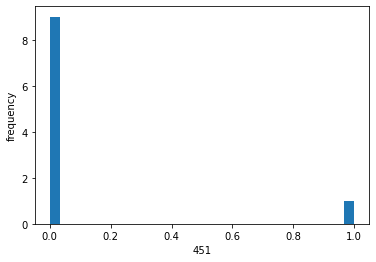

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


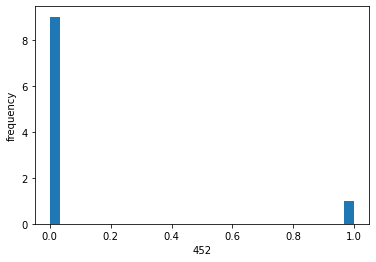

6
4
[1.0000000e+00 1.9812390e-17 4.0743807e-18 5.5637736e-18 1.6940360e-17
 2.2158205e-17 1.6271076e-17 8.5551411e-18 2.2841532e-17 1.5385647e-17]
5


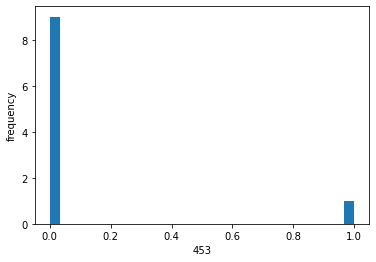

6
4
[1.0000000e+00 3.8881561e-26 3.0851252e-27 5.1092645e-27 2.7626957e-26
 4.2530394e-26 2.7485781e-26 1.0240210e-26 4.5495664e-26 2.4272315e-26]
5


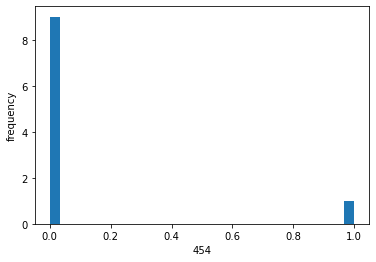

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


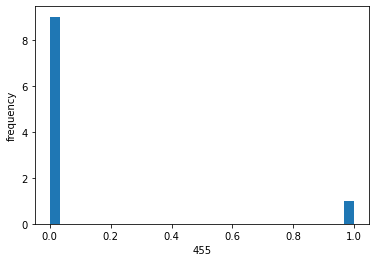

6
4
[1.0000000e+00 1.3678627e-19 2.2283625e-20 3.1959903e-20 1.1213339e-19
 1.5262056e-19 1.0847755e-19 5.2287699e-20 1.5843775e-19 1.0082256e-19]
5


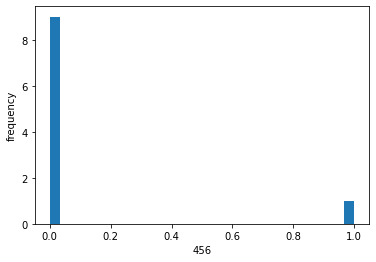

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


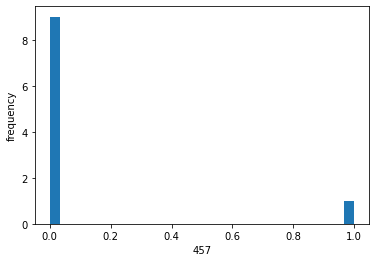

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


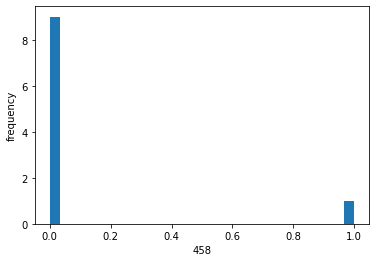

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


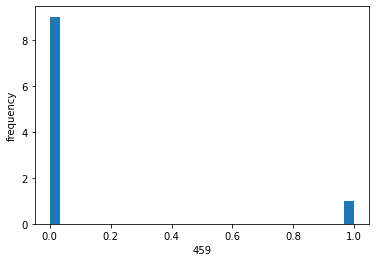

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


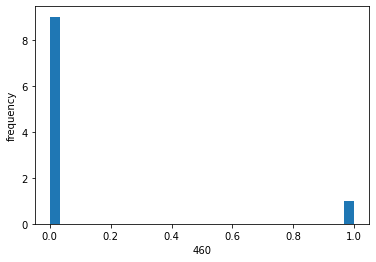

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


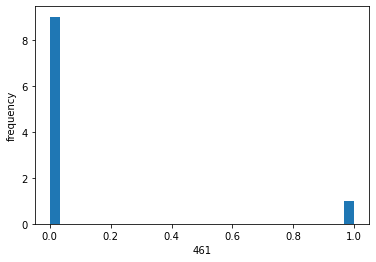

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


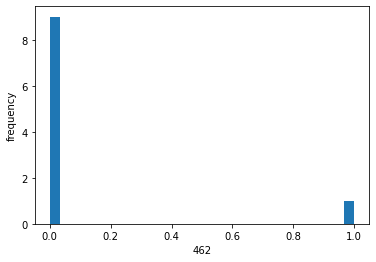

6
4
[1.0000000e+00 1.8296668e-37 0.0000000e+00 0.0000000e+00 9.8199118e-38
 1.8809322e-37 1.0493834e-37 2.4776019e-38 2.1535563e-37 8.3948669e-38]
5


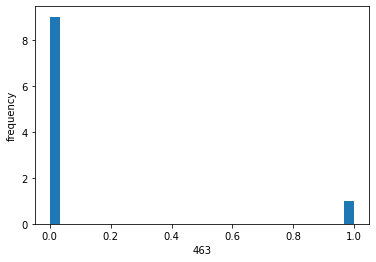

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


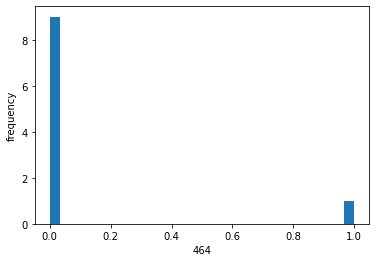

6
4
[1.0000000e+00 4.1636637e-15 1.0965729e-15 1.4224961e-15 3.7153372e-15
 4.6589573e-15 3.5545433e-15 2.0475507e-15 4.7708788e-15 3.4122998e-15]
5


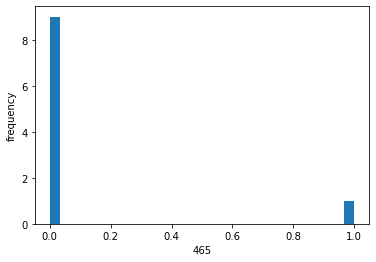

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


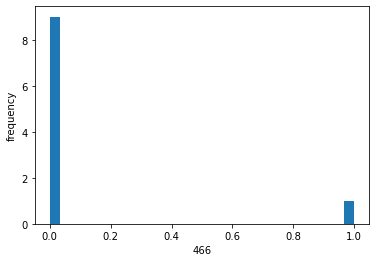

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


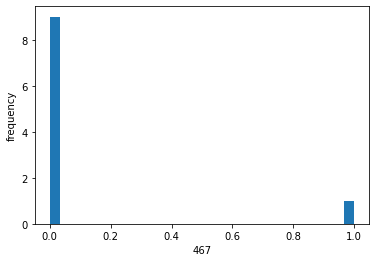

6
4
[1.0000000e+00 1.4220994e-16 3.2077452e-17 4.2960088e-17 1.2360694e-16
 1.5918497e-16 1.1853971e-16 6.4444000e-17 1.6361521e-16 1.1273360e-16]
5


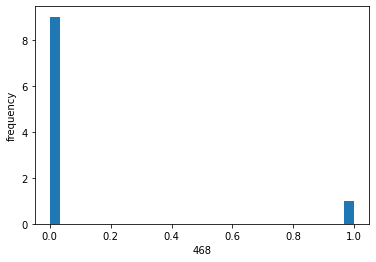

6
4
[1.0000000e+00 1.7914864e-23 1.9065681e-24 2.9788595e-24 1.3510164e-23
 1.9766810e-23 1.3261091e-23 5.4986011e-24 2.0864375e-23 1.1974915e-23]
5


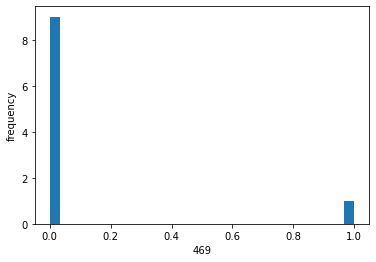

6
4
[1.0000000e+00 1.4099617e-31 6.0814252e-33 1.1379990e-32 8.7811415e-32
 1.5027870e-31 9.0309693e-32 2.7022332e-32 1.6562029e-31 7.6017639e-32]
5


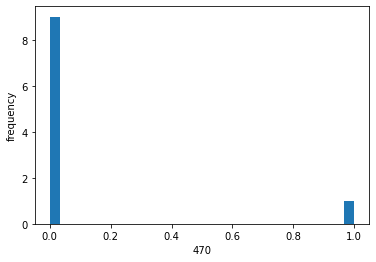

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


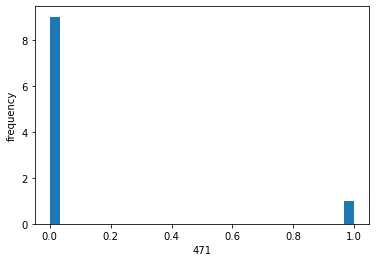

6
4
[1.0000000e+00 7.4400393e-26 6.0835786e-27 1.0017201e-26 5.3148037e-26
 8.1418494e-26 5.2831488e-26 1.9905478e-26 8.6988844e-26 4.6752569e-26]
5


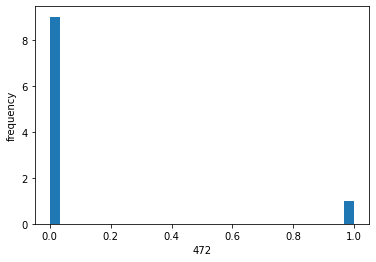

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


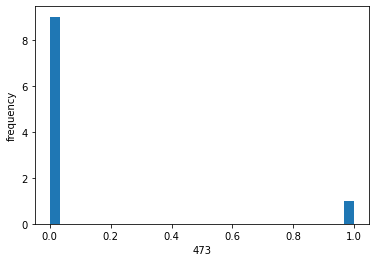

6
4
[1.0000000e+00 2.5013446e-22 3.0155275e-23 4.5973236e-23 1.9320488e-22
 2.7675005e-22 1.8881931e-22 8.1927705e-23 2.9057753e-22 1.7202363e-22]
5


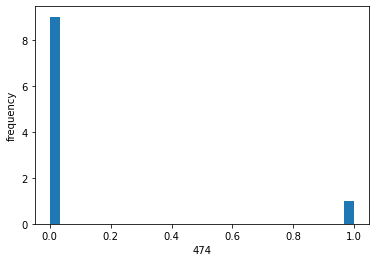

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


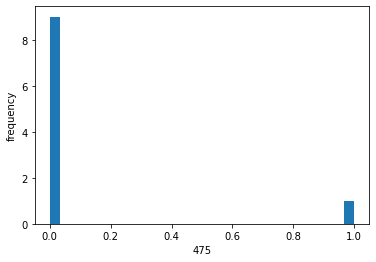

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


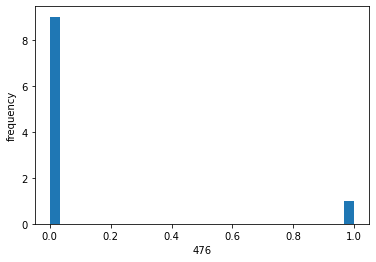

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


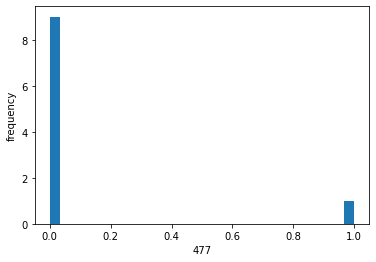

6
4
[1.0000000e+00 3.1968145e-08 1.6904094e-08 1.9046645e-08 3.1517100e-08
 3.5020317e-08 3.0202418e-08 2.2929463e-08 3.5326302e-08 3.0192339e-08]
5


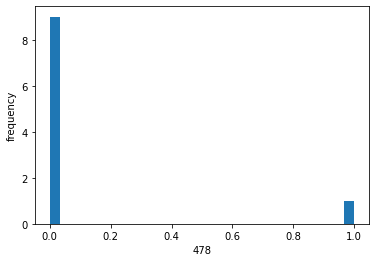

6
4
[1.0000000e+00 4.5353378e-12 1.6385476e-12 1.9925981e-12 4.2587114e-12
 5.0541914e-12 4.0629236e-12 2.6393206e-12 5.1413682e-12 3.9694342e-12]
5


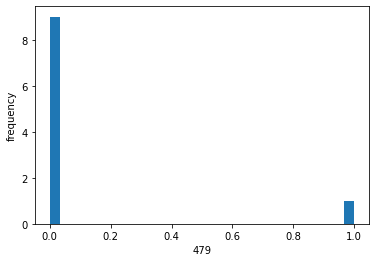

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


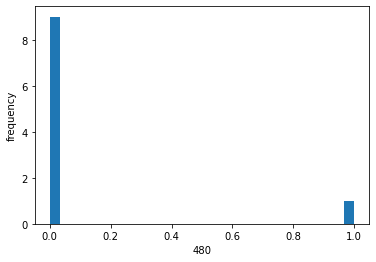

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


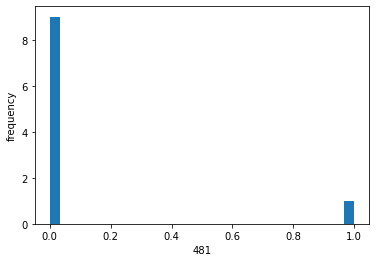

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


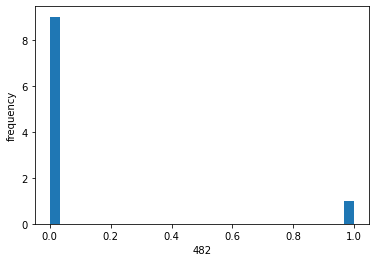

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


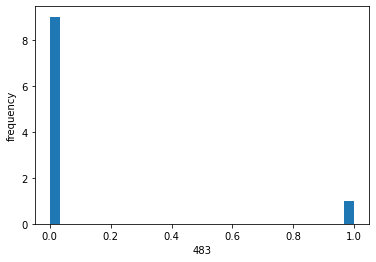

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


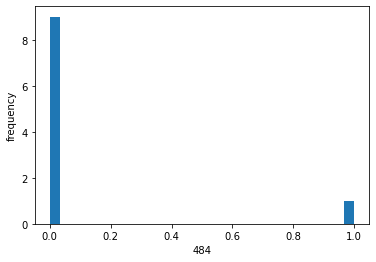

6
4
[1.0000000e+00 8.7976687e-10 3.9994724e-10 4.6462081e-10 8.5297258e-10
 9.7273278e-10 8.1510837e-10 5.8007027e-10 9.8427788e-10 8.0664991e-10]
5


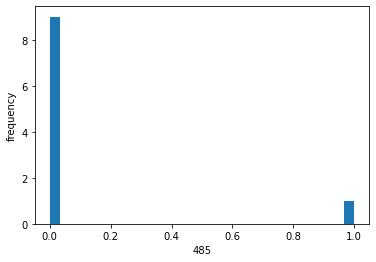

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


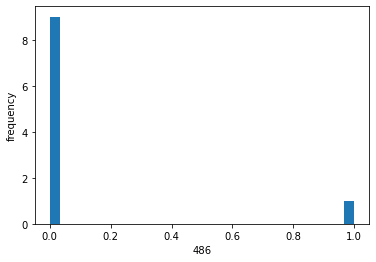

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


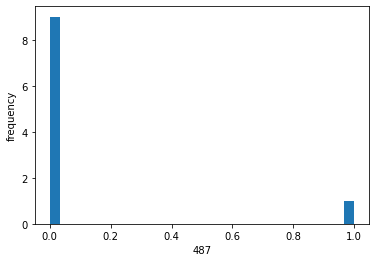

6
4
[1.0000000e+00 3.5844425e-09 1.7294791e-09 1.9846549e-09 3.4947236e-09
 3.9324171e-09 3.3438219e-09 2.4356279e-09 3.9743417e-09 3.3212000e-09]
5


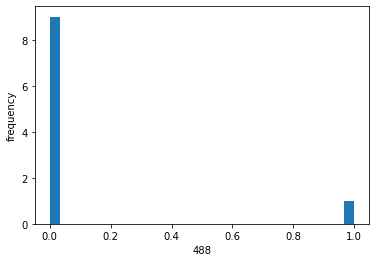

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


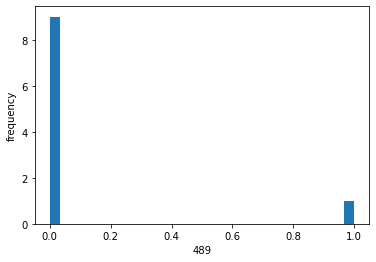

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


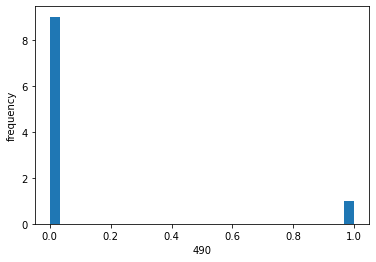

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


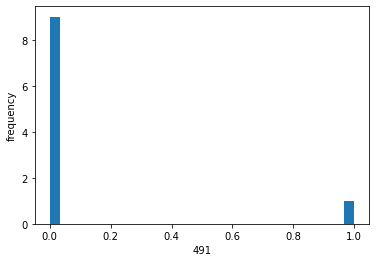

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


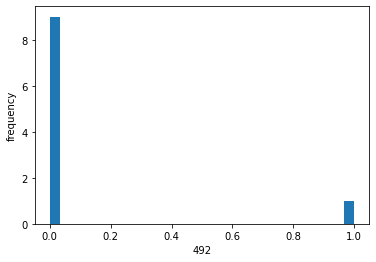

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


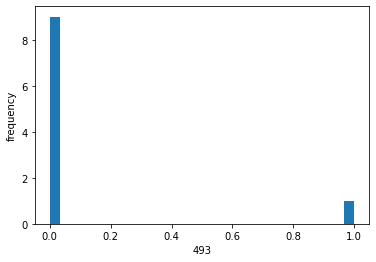

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


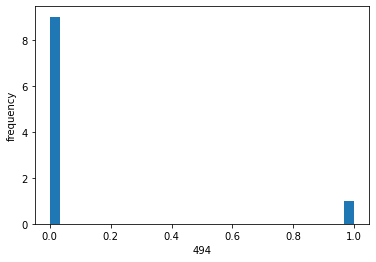

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


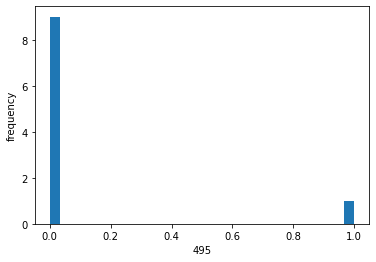

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


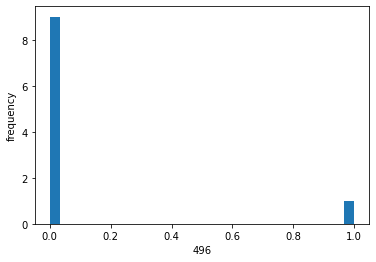

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


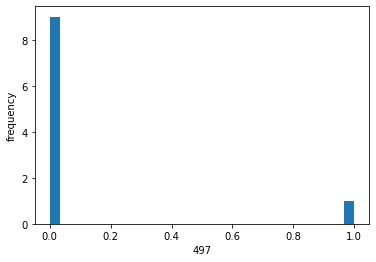

6
4
[1.0000000e+00 1.1748918e-20 1.7010456e-21 2.4976367e-21 9.4012049e-21
 1.3056015e-20 9.1270236e-21 4.2283478e-21 1.3622642e-20 8.4247748e-21]
5


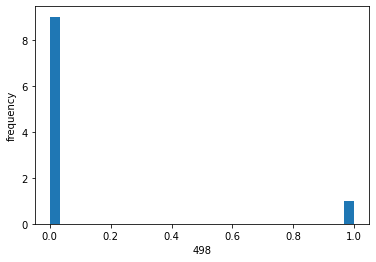

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


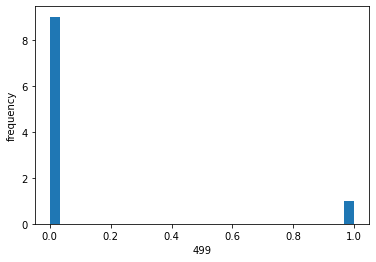

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


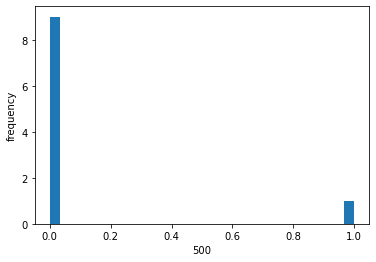

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


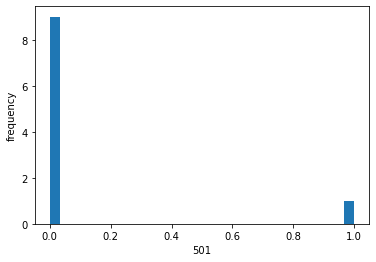

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


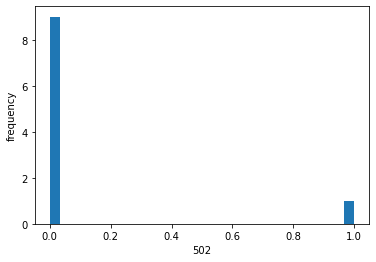

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


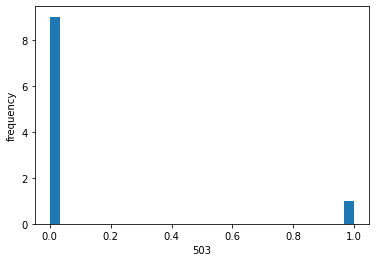

6
4
[1.0000000e+00 6.0792587e-36 1.5975814e-37 3.2989485e-37 3.3831526e-36
 6.2980812e-36 3.5824930e-36 8.9917237e-37 7.1466326e-36 2.9029182e-36]
5


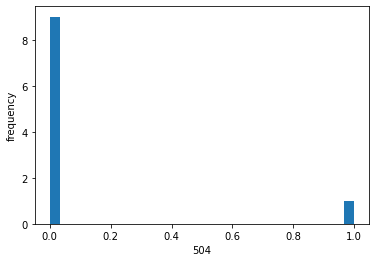

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


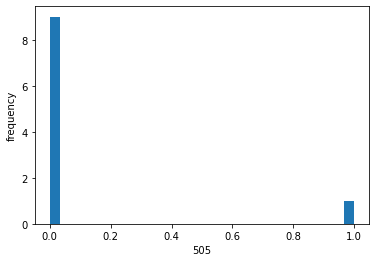

6
4
[1.0000000e+00 5.2955906e-10 2.3220000e-10 2.7451530e-10 5.0136784e-10
 5.7117189e-10 4.8317345e-10 3.3834555e-10 5.8101368e-10 4.7750420e-10]
5


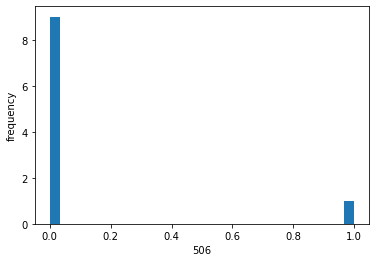

6
4
[1.0000000e+00 4.9996243e-09 2.4475544e-09 2.8001734e-09 4.8895683e-09
 5.5050022e-09 4.6775095e-09 3.4345173e-09 5.5618994e-09 4.6516551e-09]
5


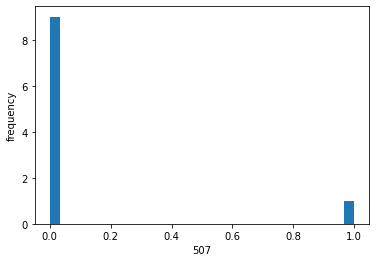

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


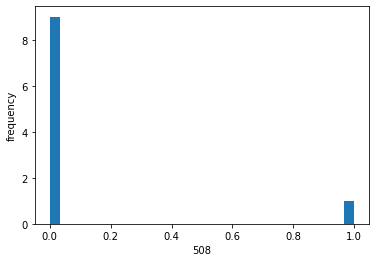

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


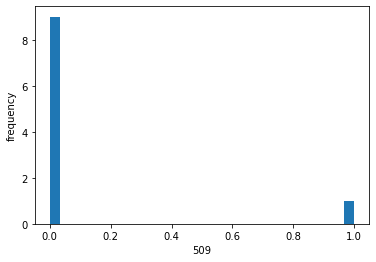

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


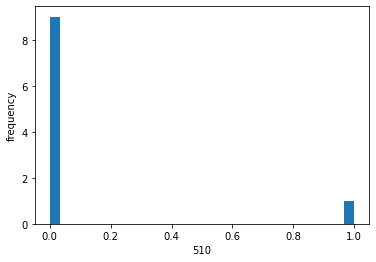

6
4
[1.0000000e+00 1.3647432e-08 6.9634760e-09 7.9035001e-09 1.3402932e-08
 1.4984797e-08 1.2834326e-08 9.5948263e-09 1.5128762e-08 1.2798660e-08]
5


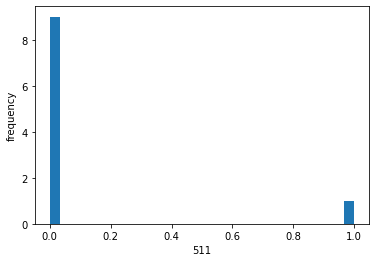

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


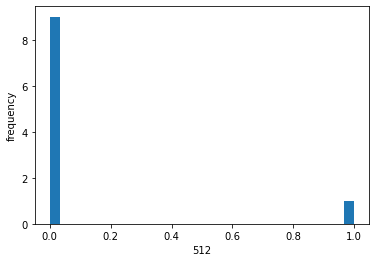

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


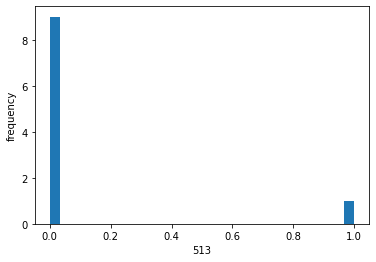

6
4
[1.0000000e+00 6.7298363e-31 3.1308214e-32 5.7721851e-32 4.2594743e-31
 7.1963581e-31 4.3637463e-31 1.3416842e-31 7.9007590e-31 3.6945174e-31]
5


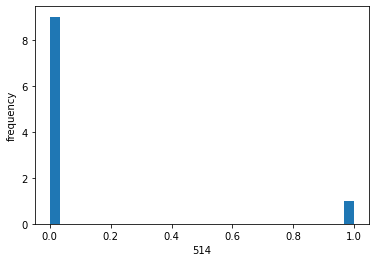

6
4
[1.0000000e+00 2.2187674e-14 6.3030758e-15 8.0513378e-15 2.0041528e-14
 2.4805734e-14 1.9157383e-14 1.1358409e-14 2.5364505e-14 1.8471293e-14]
5


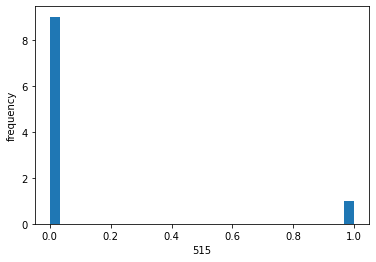

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


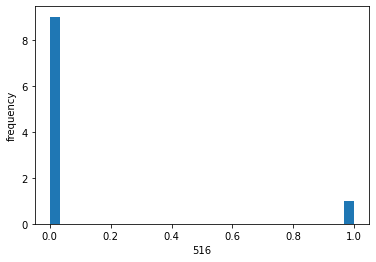

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


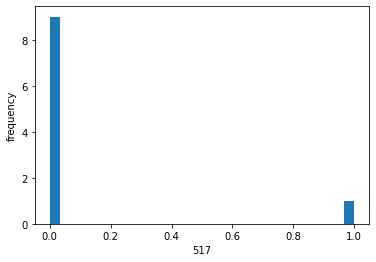

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


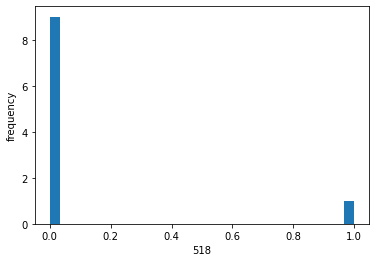

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


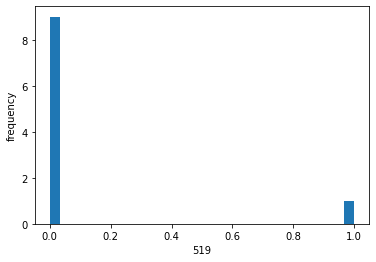

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


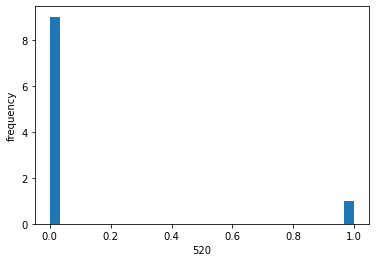

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


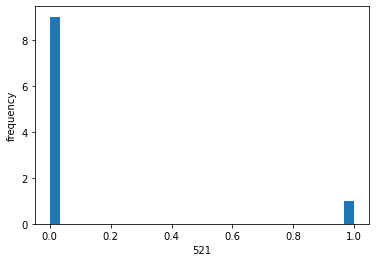

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


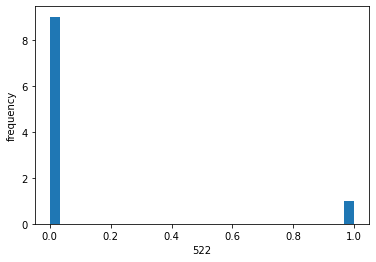

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


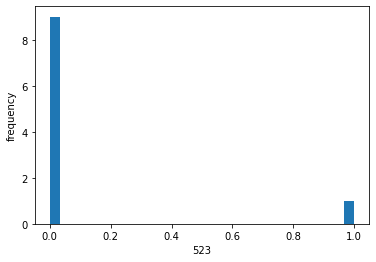

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


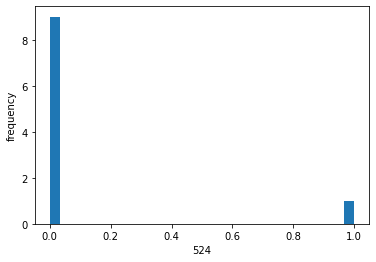

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


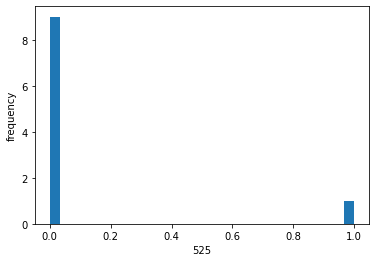

6
4
[1.00000000e+00 9.62429489e-21 1.38126369e-21 2.03192030e-21
 7.69250020e-21 1.06988994e-20 7.47048864e-21 3.44740607e-21
 1.11630996e-20 6.88943869e-21]
5


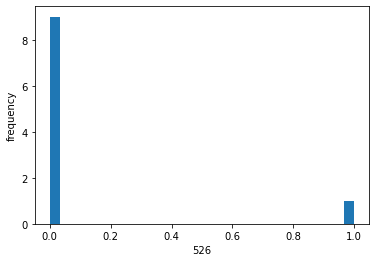

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


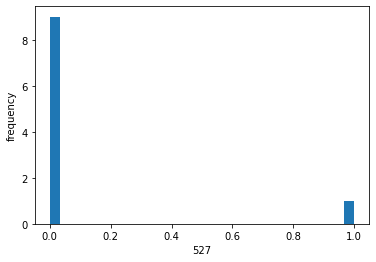

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


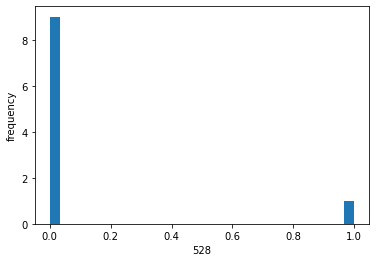

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


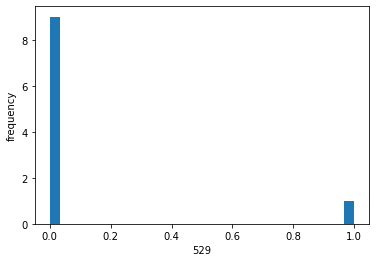

6
4
[1.0000000e+00 6.9774703e-18 1.3654861e-18 1.8844767e-18 5.9110045e-18
 7.7974528e-18 5.6832999e-18 2.9366597e-18 8.0502508e-18 5.3578180e-18]
5


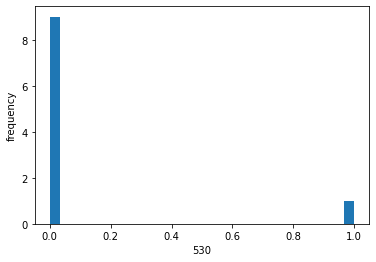

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


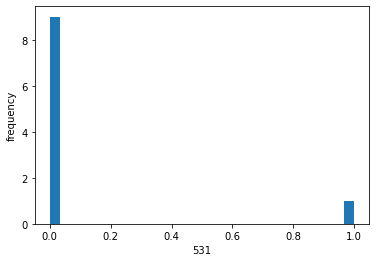

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


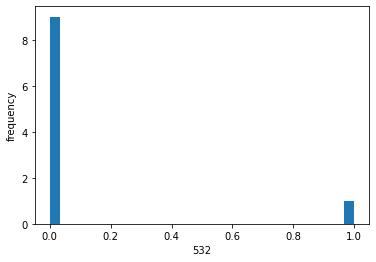

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


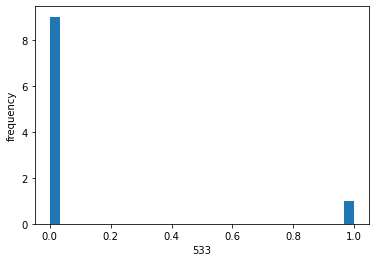

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


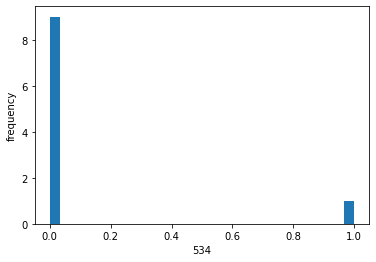

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


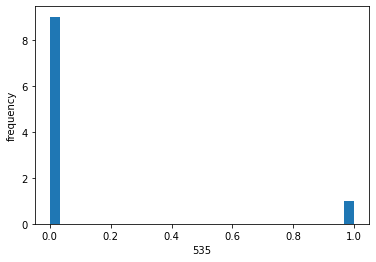

6
4
[1.0000000e+00 6.0438110e-10 2.7009597e-10 3.1480901e-10 5.8358596e-10
 6.6472283e-10 5.5762578e-10 3.9358519e-10 6.7281625e-10 5.5141419e-10]
5


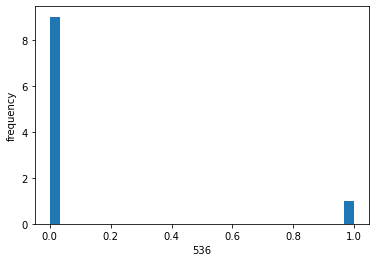

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


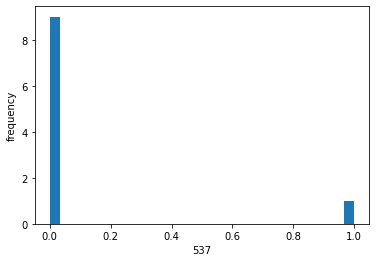

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


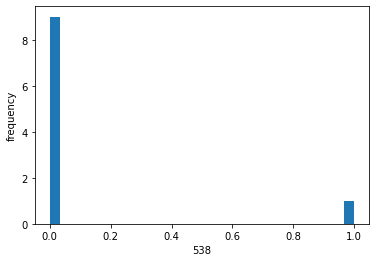

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


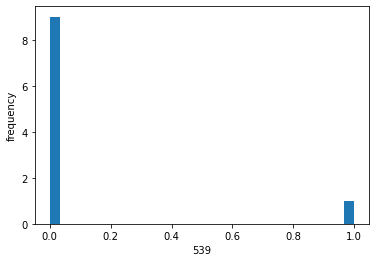

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


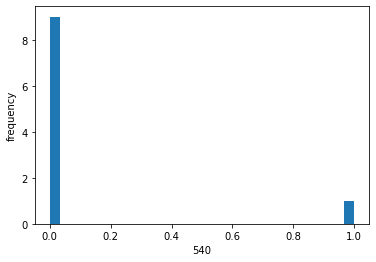

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


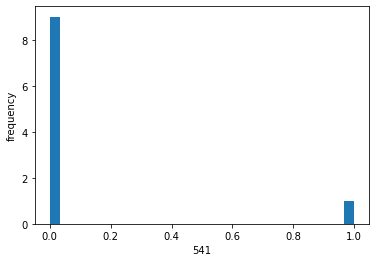

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


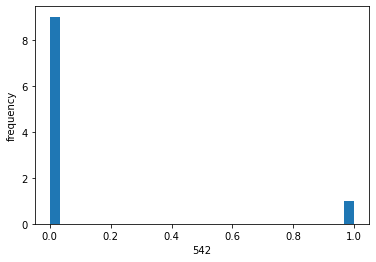

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


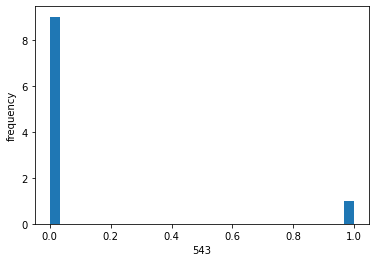

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


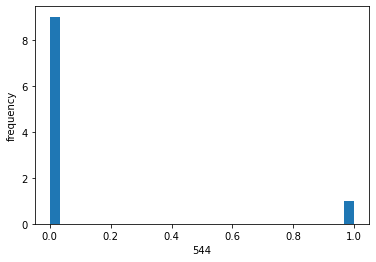

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


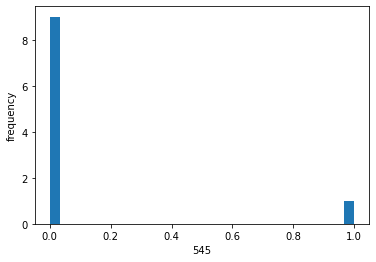

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


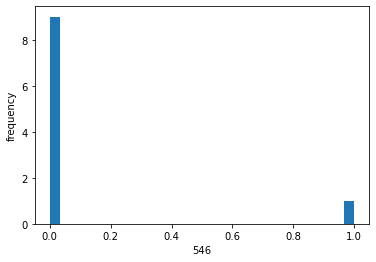

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


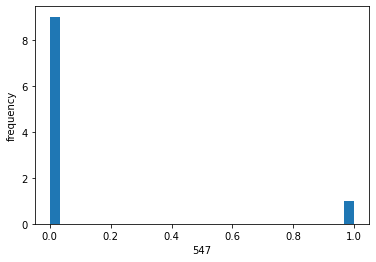

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


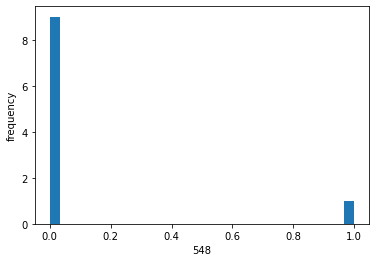

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


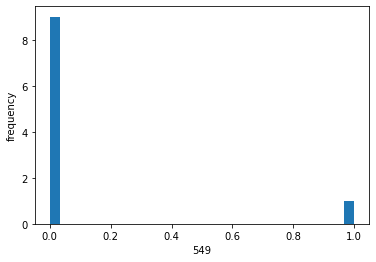

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


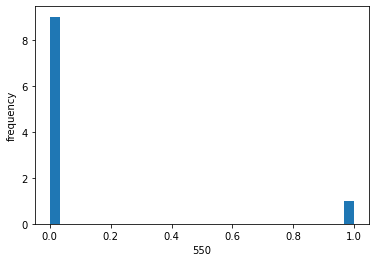

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


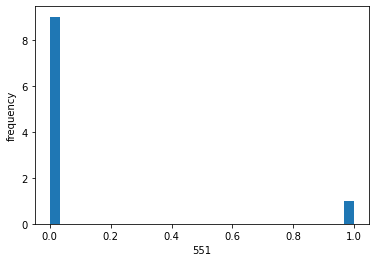

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


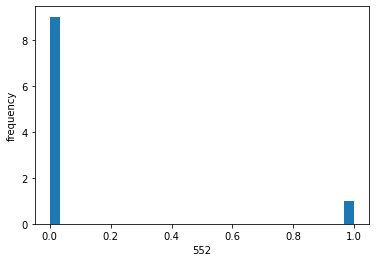

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


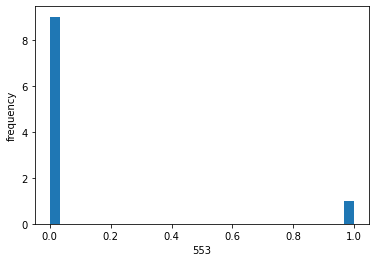

6
4
[1.0000000e+00 7.0943444e-21 1.0028200e-21 1.4798855e-21 5.6507995e-21
 7.8800909e-21 5.4916081e-21 2.5217047e-21 8.2272927e-21 5.0595310e-21]
5


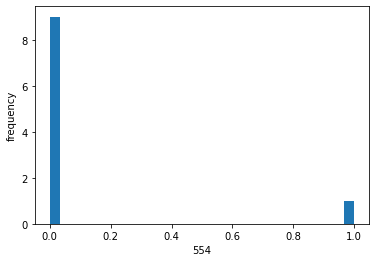

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


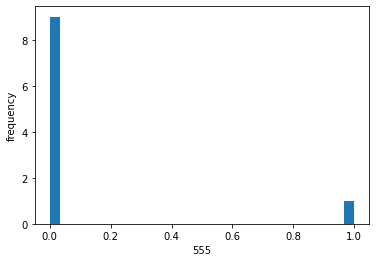

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


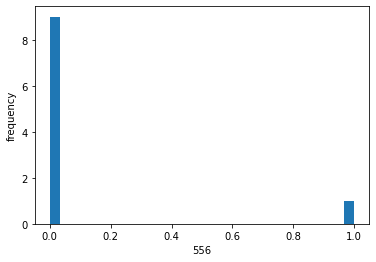

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


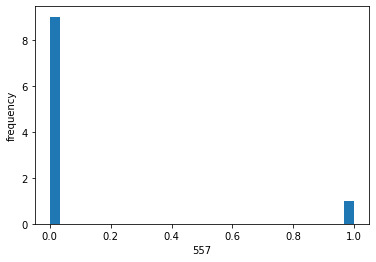

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


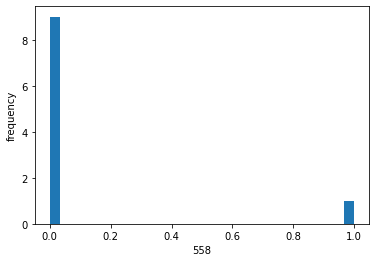

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


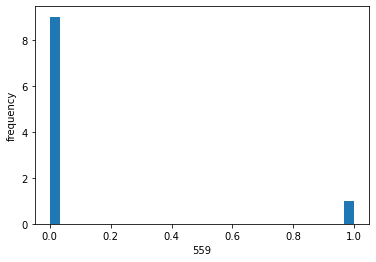

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


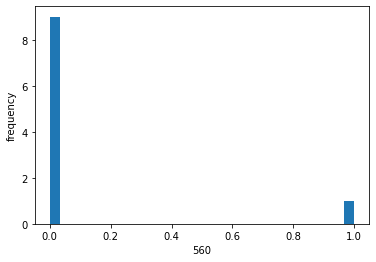

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


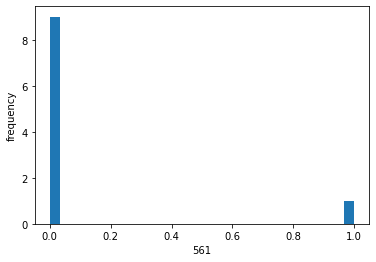

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


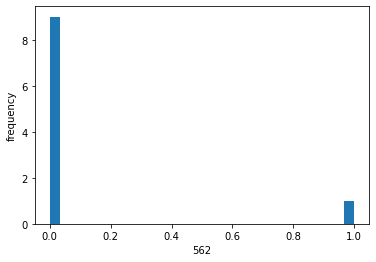

6
4
[1.00000000e+00 3.08095799e-22 3.75560553e-23 5.71038486e-23
 2.38666295e-22 3.41118147e-22 2.32996240e-22 1.01474876e-22
 3.58033269e-22 2.12509990e-22]
5


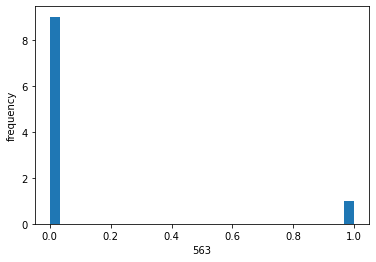

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


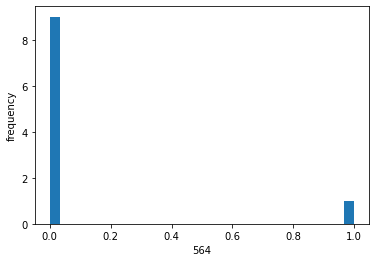

6
4
[1.0000000e+00 1.9570502e-26 1.5131214e-27 2.5171319e-27 1.3907401e-26
 2.1479484e-26 1.3814341e-26 5.0843002e-27 2.2959361e-26 1.2178377e-26]
5


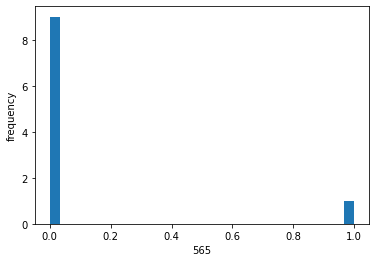

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


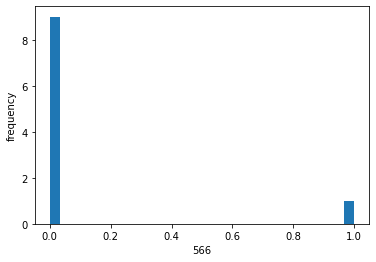

6
4
[1.0000000e+00 4.2152942e-10 1.8596577e-10 2.1719676e-10 4.0752368e-10
 4.6708298e-10 3.8916750e-10 2.7330740e-10 4.7305143e-10 3.8430503e-10]
5


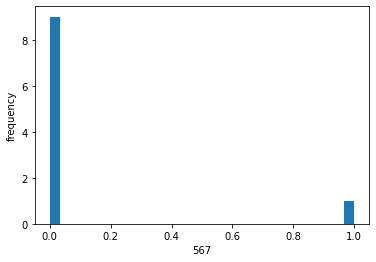

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


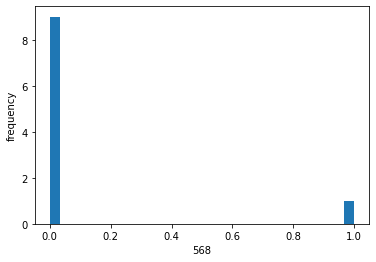

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


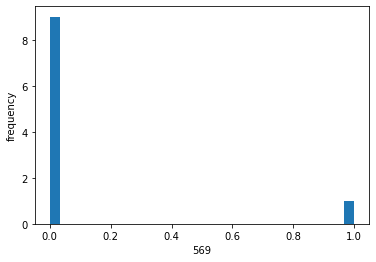

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


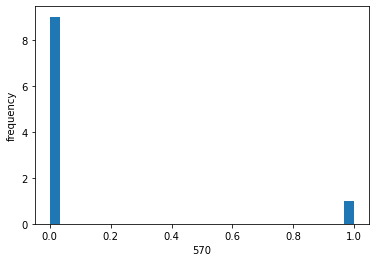

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


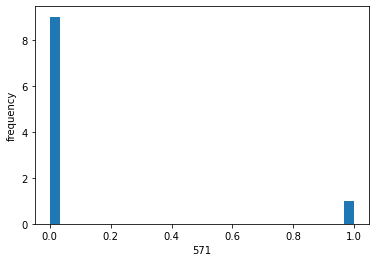

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


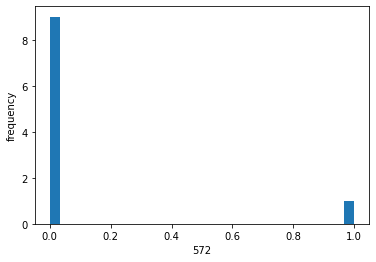

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


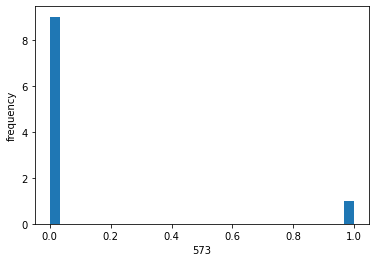

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


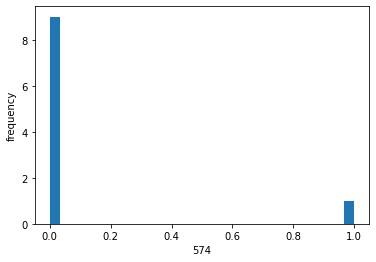

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


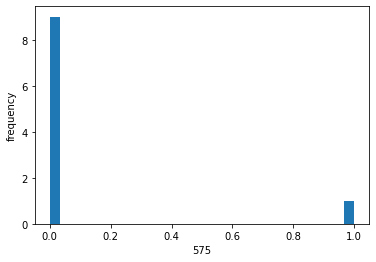

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


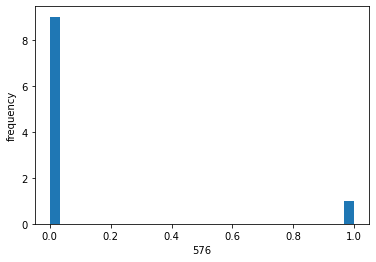

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


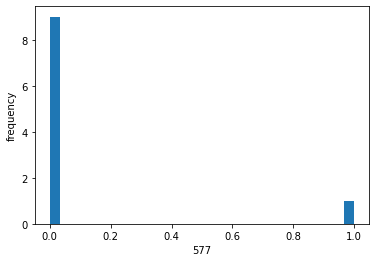

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


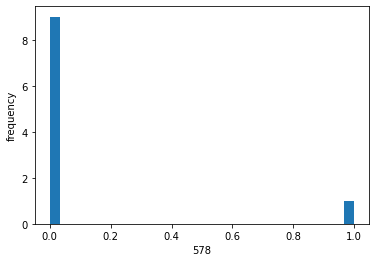

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


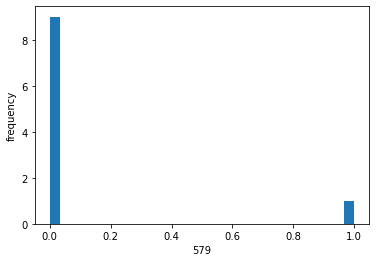

6
4
[1.00000000e+00 9.77750866e-11 4.03975915e-11 4.78375464e-11
 9.35367617e-11 1.08480121e-10 8.93012470e-11 6.11958886e-11
 1.10003014e-10 8.79212883e-11]
5


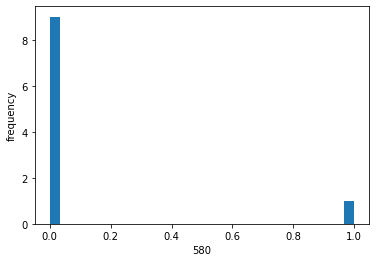

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


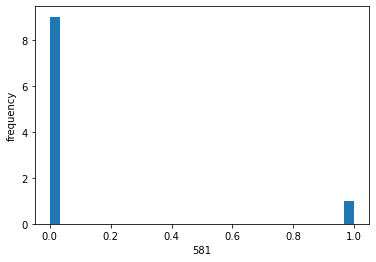

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


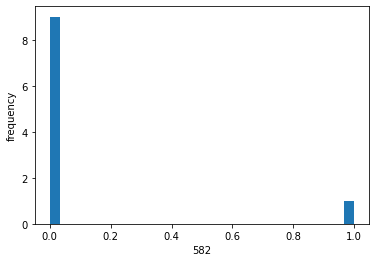

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


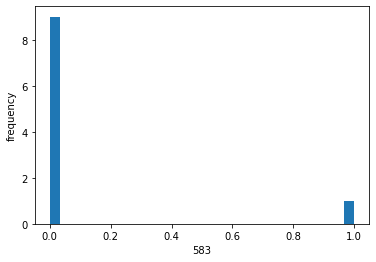

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


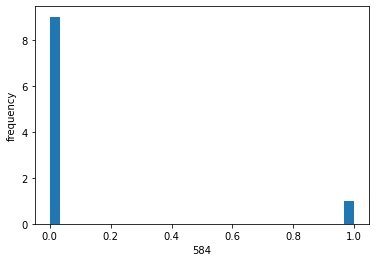

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


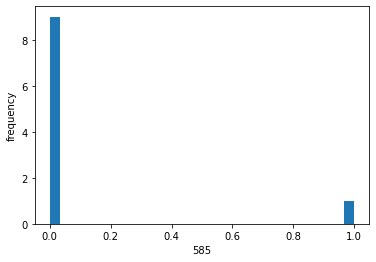

6
4
[1.0000000e+00 1.3647432e-08 6.9634760e-09 7.9035001e-09 1.3402932e-08
 1.4984797e-08 1.2834326e-08 9.5948263e-09 1.5128762e-08 1.2798660e-08]
5


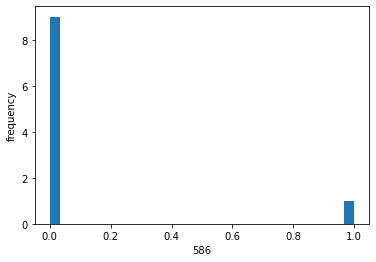

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


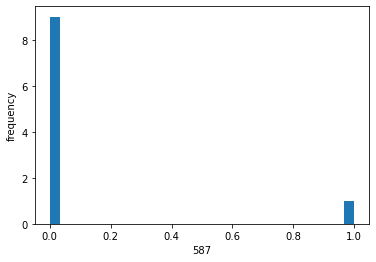

6
4
[1.0000000e+00 7.5001336e-27 5.4906669e-28 9.2400745e-28 5.2351383e-27
 8.1757082e-27 5.2327024e-27 1.8945954e-27 8.7787523e-27 4.5922313e-27]
5


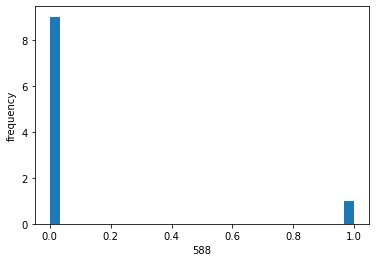

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


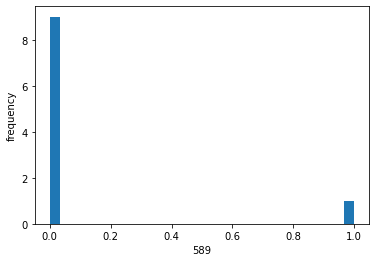

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


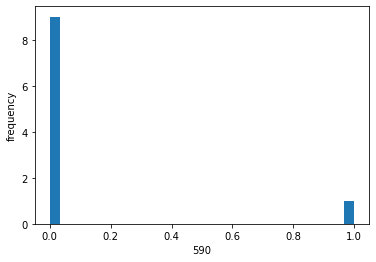

6
4
[1.0000000e+00 6.4691981e-11 2.6273329e-11 3.1230418e-11 6.1803625e-11
 7.1884061e-11 5.9005835e-11 4.0103251e-11 7.2899596e-11 5.7990848e-11]
5


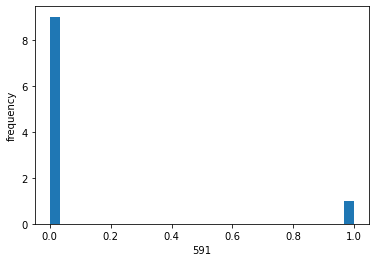

6
4
[1.0000000e+00 3.8573687e-26 3.0599258e-27 5.0681501e-27 2.7412380e-26
 4.2201673e-26 2.7273550e-26 1.0159125e-26 4.5126807e-26 2.4082507e-26]
5


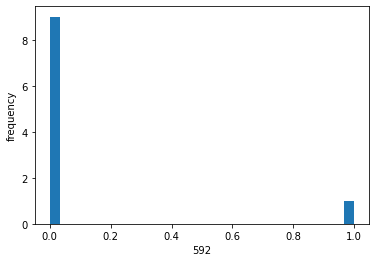

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


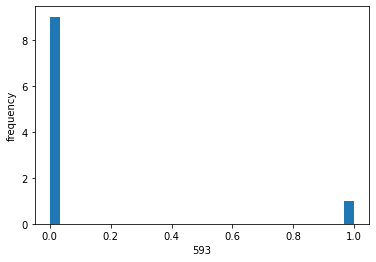

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


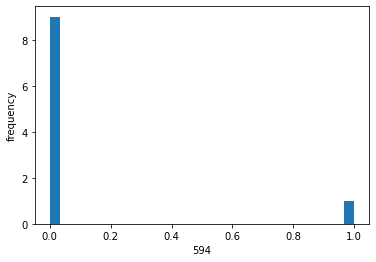

6
4
[1.0000000e+00 8.2580334e-16 2.0168822e-16 2.6580884e-16 7.2688926e-16
 9.2361478e-16 6.9639693e-16 3.9035577e-16 9.4742043e-16 6.6576001e-16]
5


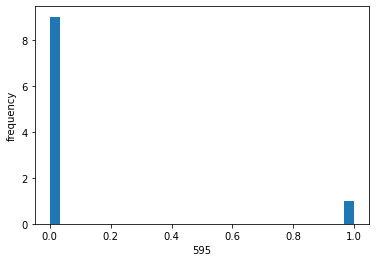

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


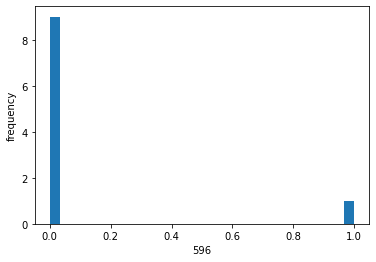

6
4
[1.0000000e+00 2.2365572e-18 4.1466634e-19 5.7868186e-19 1.8749186e-18
 2.4962214e-18 1.8060792e-18 9.1522396e-19 2.5820902e-18 1.6962208e-18]
5


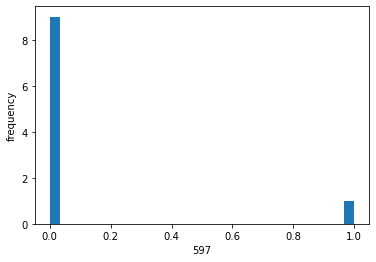

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


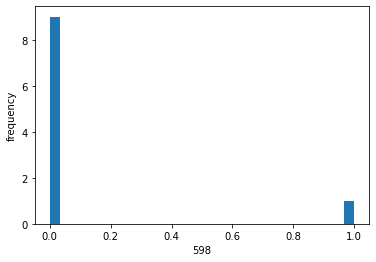

6
4
[1.0000000e+00 3.2115604e-20 4.8914413e-21 7.1026574e-21 2.6007017e-20
 3.5786431e-20 2.5169392e-20 1.1860369e-20 3.7261291e-20 2.3322146e-20]
5


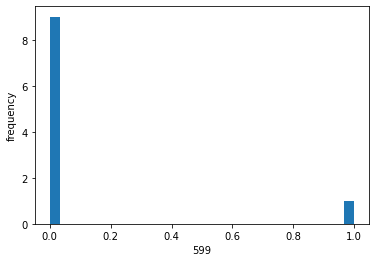

6
4
[1.0000000e+00 7.5654379e-11 3.0934939e-11 3.6713035e-11 7.2325666e-11
 8.4029436e-11 6.9054977e-11 4.7068772e-11 8.5236880e-11 6.7900532e-11]
5


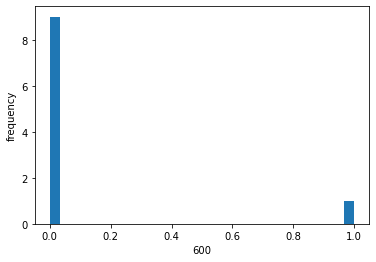

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


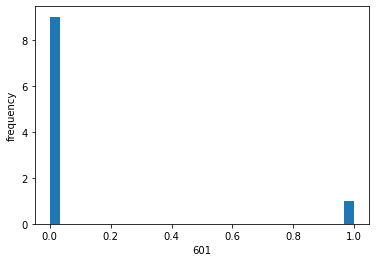

6
4
[1.0000000e+00 1.2135922e-22 1.4132845e-23 2.1697504e-23 9.3102954e-23
 1.3415625e-22 9.1108039e-23 3.9044671e-23 1.4104201e-22 8.2796424e-23]
5


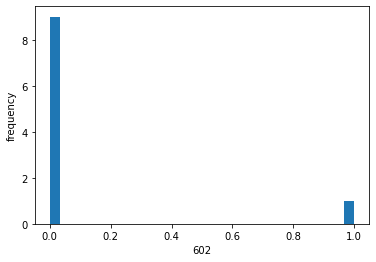

6
4
[1.00000000e+00 2.88889242e-11 1.13335825e-11 1.35507135e-11
 2.74683297e-11 3.21219995e-11 2.61933218e-11 1.75779183e-11
 3.26193239e-11 2.57183164e-11]
5


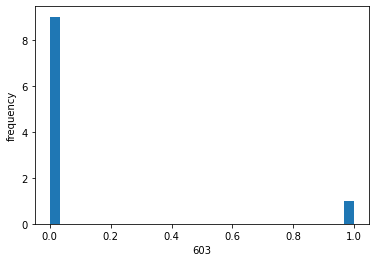

6
4
[1.0000000e+00 1.3647432e-08 6.9634760e-09 7.9035001e-09 1.3402932e-08
 1.4984797e-08 1.2834326e-08 9.5948263e-09 1.5128762e-08 1.2798660e-08]
5


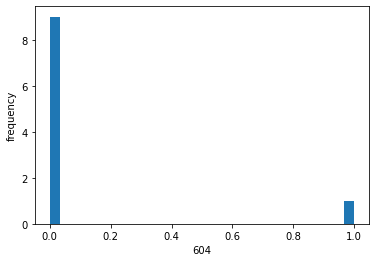

6
4
[1.0000000e+00 3.1968145e-08 1.6904094e-08 1.9046645e-08 3.1517100e-08
 3.5020317e-08 3.0202418e-08 2.2929463e-08 3.5326302e-08 3.0192339e-08]
5


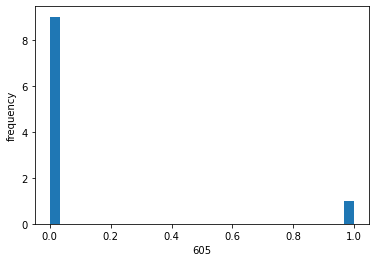

6
4
[1.0000000e+00 2.3732846e-19 3.9664438e-20 5.6534544e-20 1.9537602e-19
 2.6472266e-19 1.8869144e-19 9.1980507e-20 2.7476234e-19 1.7591800e-19]
5


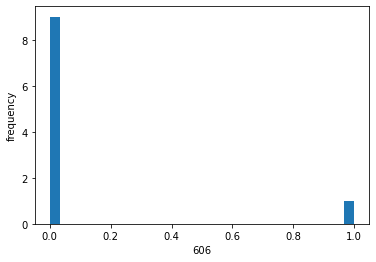

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


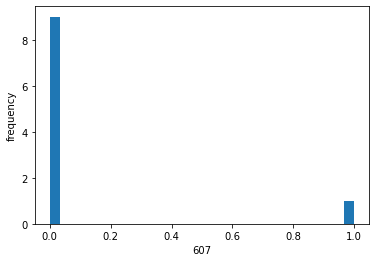

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


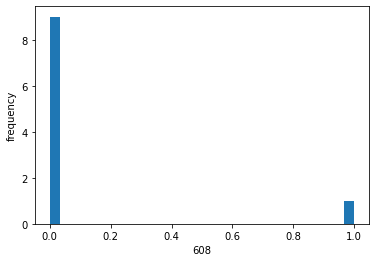

6
4
[1.0000000e+00 2.2476573e-27 1.5504398e-28 2.6406888e-28 1.5477400e-27
 2.4428262e-27 1.5525416e-27 5.5043612e-28 2.6314489e-27 1.3561515e-27]
5


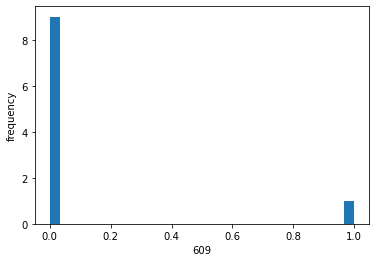

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


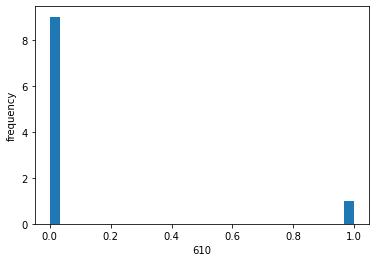

6
4
[1.0000000e+00 1.0966357e-30 5.2443393e-32 9.6041062e-32 7.0010201e-31
 1.1763209e-30 7.1478229e-31 2.2185535e-31 1.2891001e-30 6.0702138e-31]
5


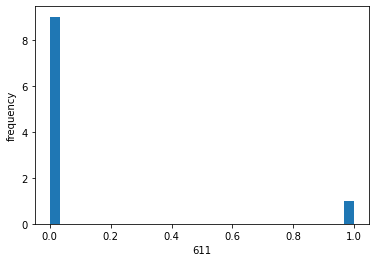

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


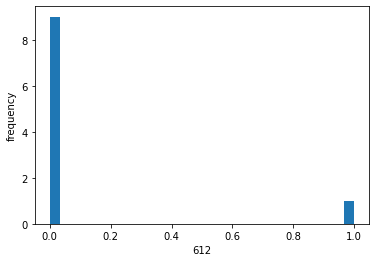

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


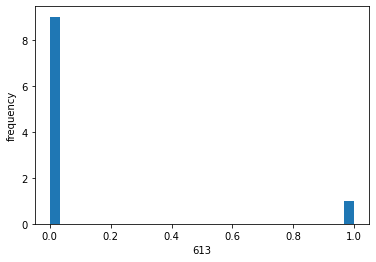

6
4
[1.0000000e+00 1.8905817e-34 5.9500430e-36 1.1814130e-35 1.1034230e-34
 1.9906005e-34 1.1523876e-34 3.0716787e-35 2.2285676e-34 9.4669959e-35]
5


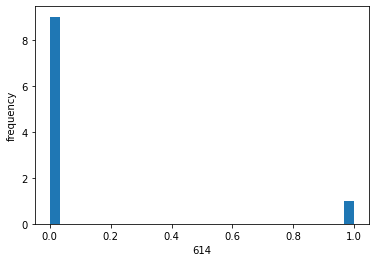

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


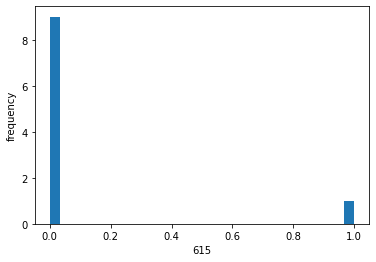

6
4
[1.0000000e+00 3.5401047e-15 9.2440792e-16 1.2019402e-15 3.1521677e-15
 3.9597719e-15 3.0175996e-15 1.7332451e-15 4.0551287e-15 2.8951637e-15]
5


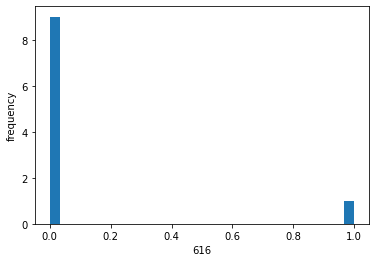

6
4
[1.0000000e+00 1.6994414e-16 3.8572980e-17 5.1618320e-17 1.4769735e-16
 1.9003314e-16 1.4167280e-16 7.7297262e-17 1.9528615e-16 1.3483183e-16]
5


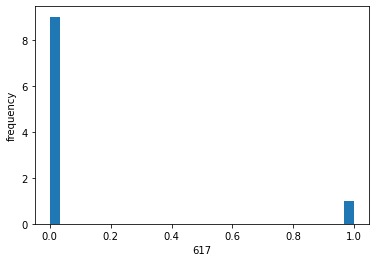

6
4
[1.0000000e+00 1.1123859e-21 1.4399235e-22 2.1634206e-22 8.7113216e-22
 1.2329251e-21 8.4913008e-22 3.7789459e-22 1.2913159e-21 7.7757239e-22]
5


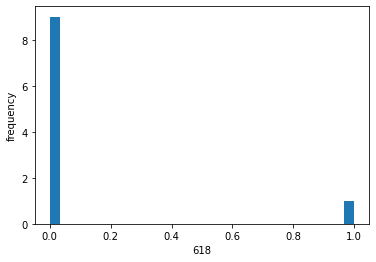

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


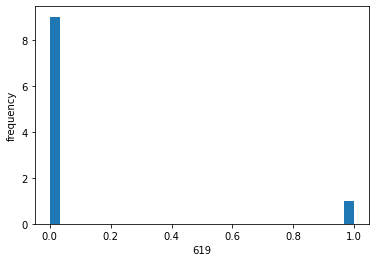

6
4
[1.0000000e+00 7.1458034e-24 7.2788206e-25 1.1473754e-24 5.3419243e-24
 7.8765024e-24 5.2544932e-24 2.1435796e-24 8.3290254e-24 4.7282974e-24]
5


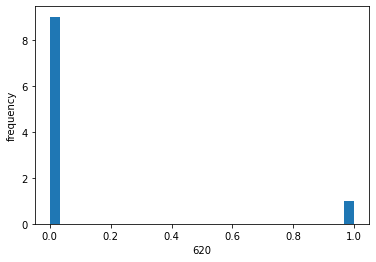

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


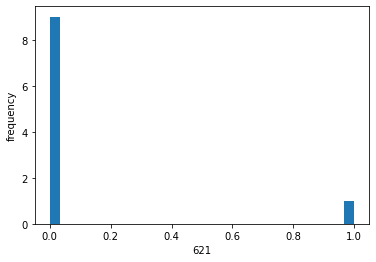

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


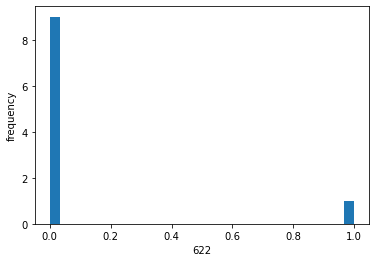

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


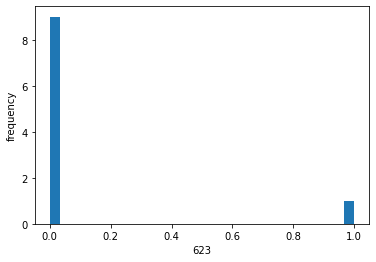

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


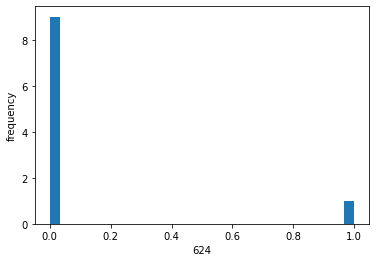

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


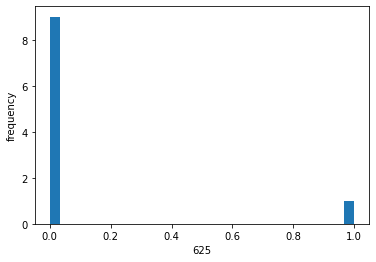

6
4
[1.0000000e+00 3.9763769e-30 2.0173362e-31 3.6555166e-31 2.5646403e-30
 4.2689926e-30 2.6152233e-30 8.2931380e-31 4.6667303e-30 2.2290993e-30]
5


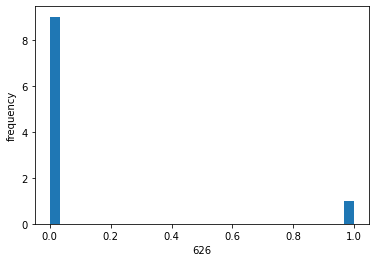

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


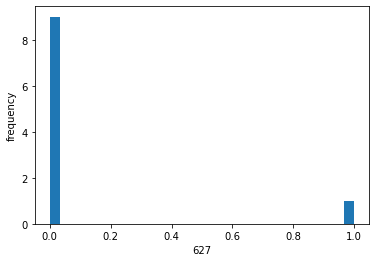

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


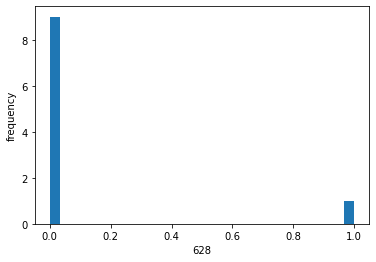

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


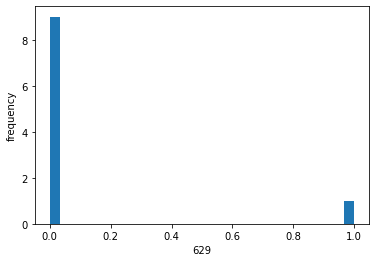

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


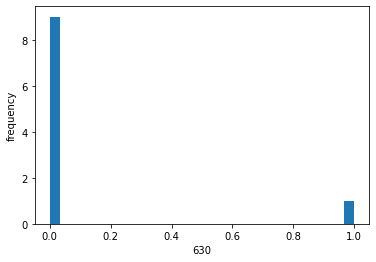

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


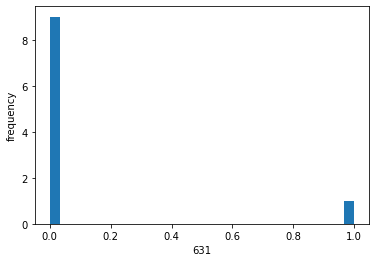

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


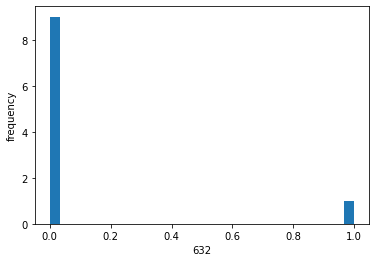

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


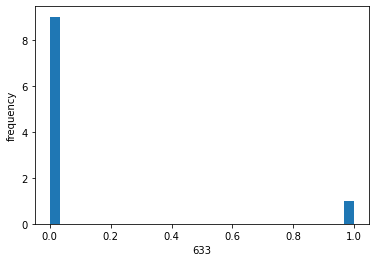

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


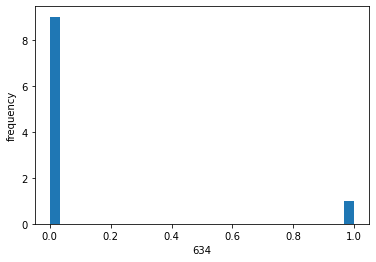

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


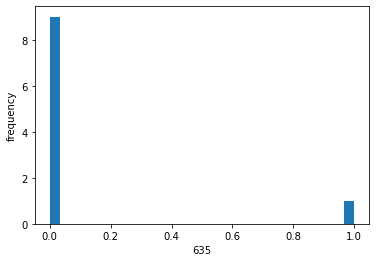

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


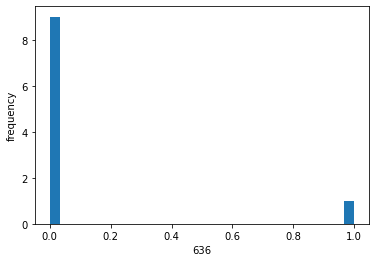

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


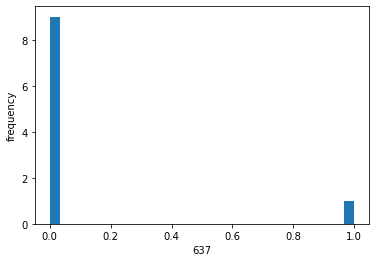

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


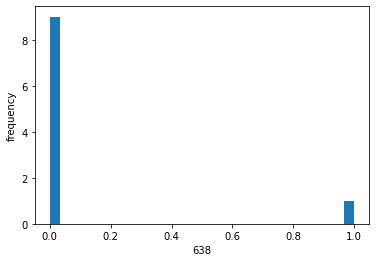

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


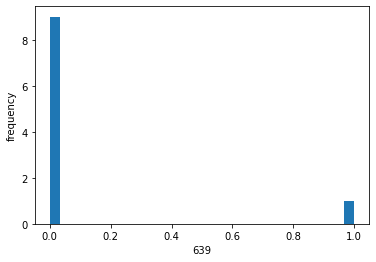

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


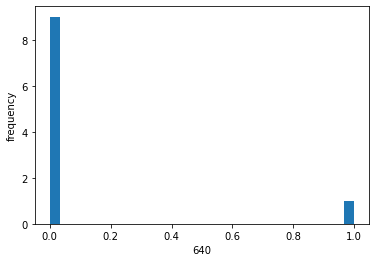

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


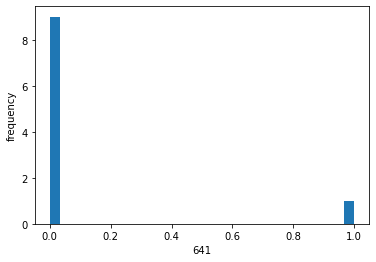

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


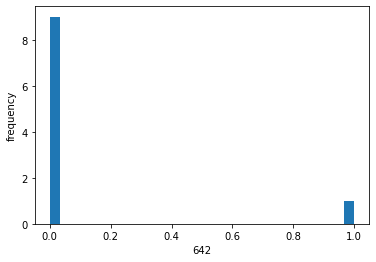

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


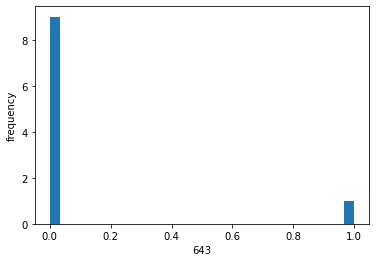

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


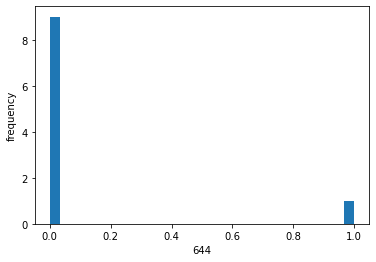

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


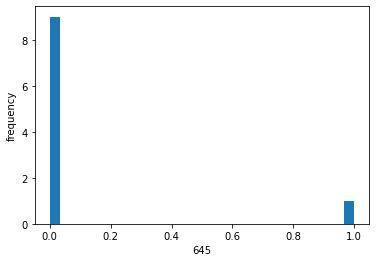

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


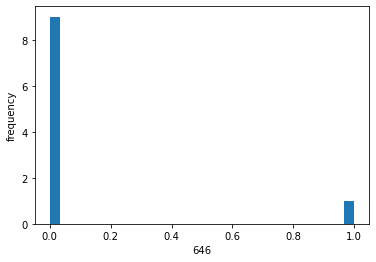

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


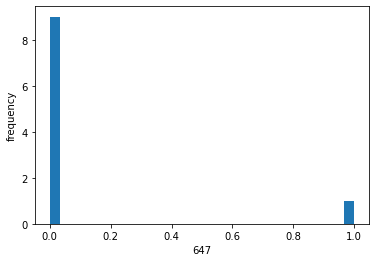

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


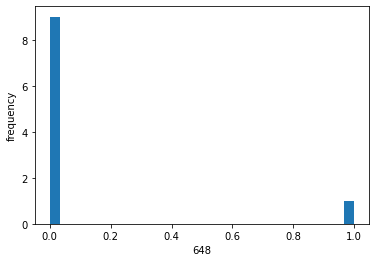

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


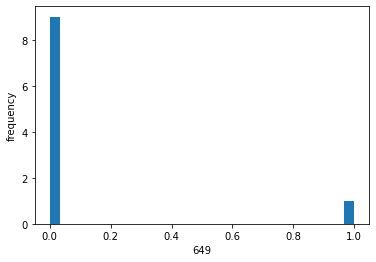

6
4
[1.0000000e+00 3.4268207e-36 8.7607717e-38 1.8190329e-37 1.8961991e-36
 3.5466496e-36 2.0110996e-36 4.9963308e-37 4.0297803e-36 1.6259812e-36]
5


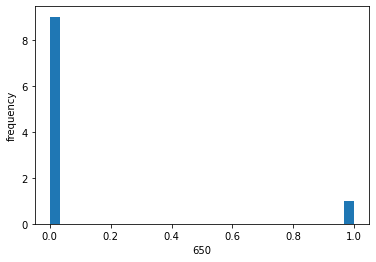

6
4
[1.0000000e+00 2.9724288e-28 1.8582889e-29 3.2287924e-29 2.0040010e-28
 3.2174456e-28 2.0208747e-28 6.9141330e-29 3.4822075e-28 1.7514916e-28]
5


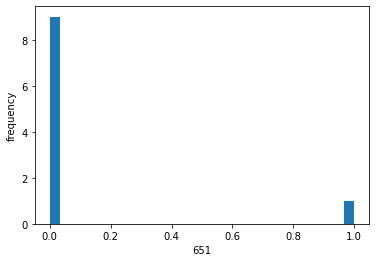

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


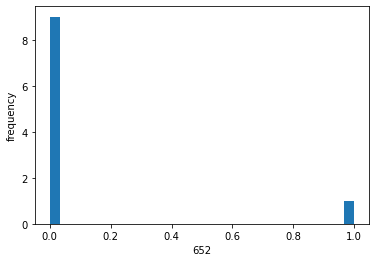

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


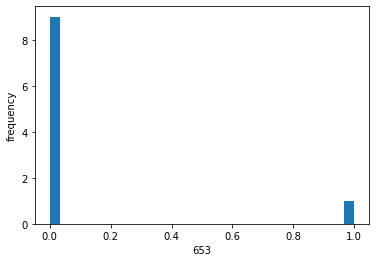

6
4
[1.0000000e+00 2.9639993e-09 1.4235644e-09 1.6335199e-09 2.9000859e-09
 3.2729979e-09 2.7711424e-09 2.0139601e-09 3.3090533e-09 2.7505527e-09]
5


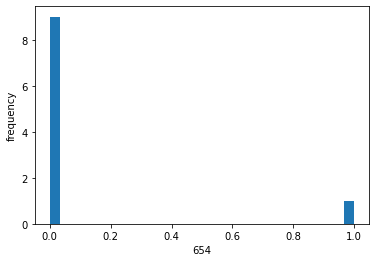

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


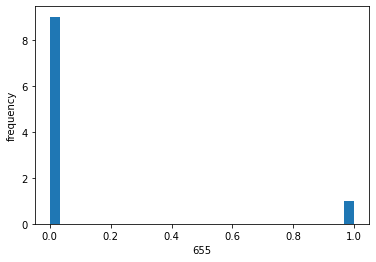

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


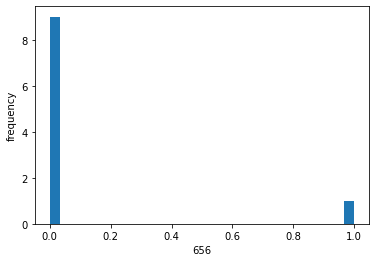

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


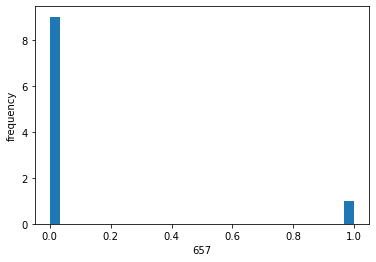

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


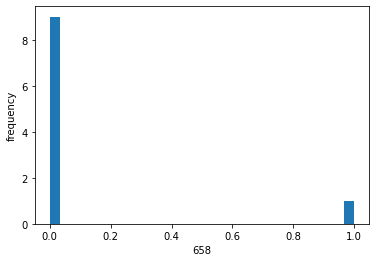

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


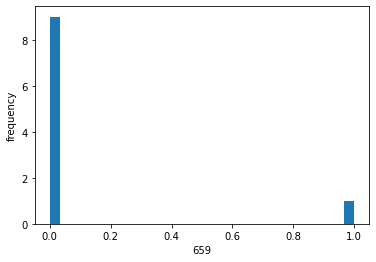

6
4
[1.0000000e+00 7.6802467e-09 3.8144403e-09 4.3609245e-09 7.4842541e-09
 8.3748075e-09 7.1803834e-09 5.2928772e-09 8.4618499e-09 7.1441684e-09]
5


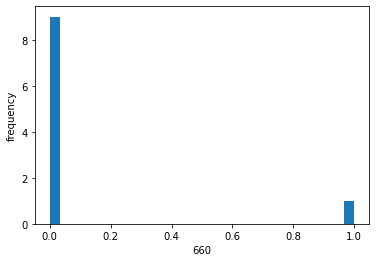

6
4
[1.0000000e+00 3.9571413e-24 3.9145149e-25 6.2065555e-25 2.9385223e-24
 4.3552640e-24 2.8951284e-24 1.1691666e-24 4.6129738e-24 2.5995955e-24]
5


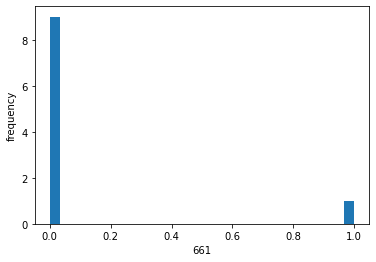

6
4
[1.0000000e+00 9.0234942e-10 4.1064002e-10 4.7687709e-10 8.7500418e-10
 9.9746378e-10 8.3595941e-10 5.9534366e-10 1.0091831e-09 8.2751977e-10]
5


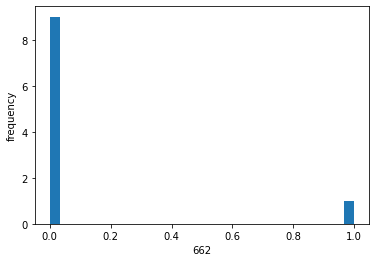

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


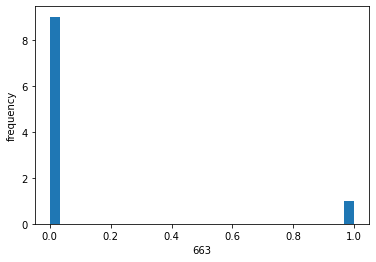

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


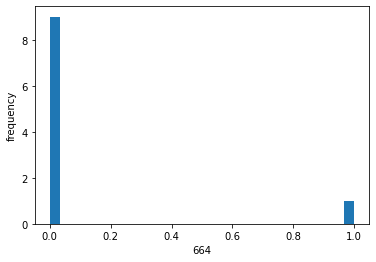

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


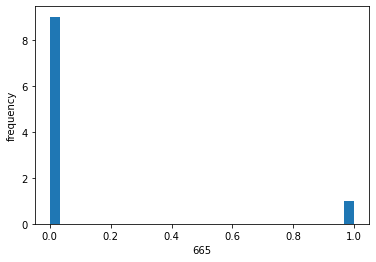

6
4
[1.00000000e+00 1.70662446e-26 1.29928203e-27 2.17036685e-27
 1.20066864e-26 1.86274172e-26 1.19830306e-26 4.39922228e-27
 1.99654039e-26 1.05440512e-26]
5


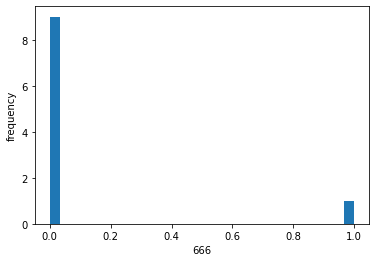

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


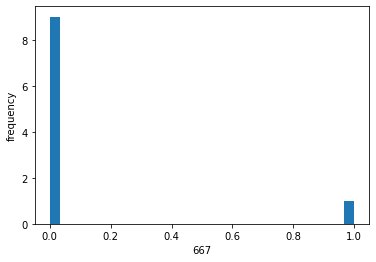

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


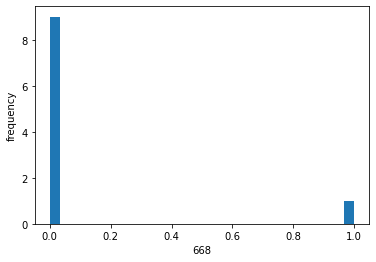

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


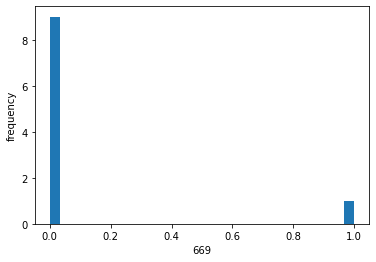

6
4
[1.0000000e+00 8.2940868e-16 2.0314915e-16 2.6732601e-16 7.3163794e-16
 9.2878740e-16 7.0038783e-16 3.9247902e-16 9.5289354e-16 6.6952428e-16]
5


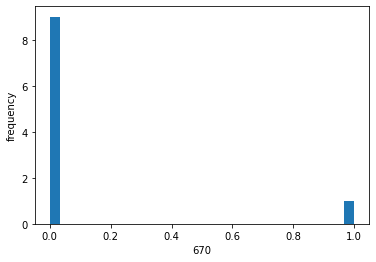

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


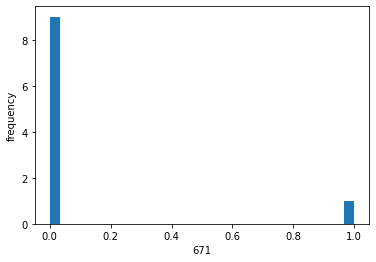

6
4
[1.0000000e+00 1.8473400e-11 7.0953378e-12 8.5251632e-12 1.7490865e-11
 2.0541461e-11 1.6689740e-11 1.1113608e-11 2.0869797e-11 1.6366682e-11]
5


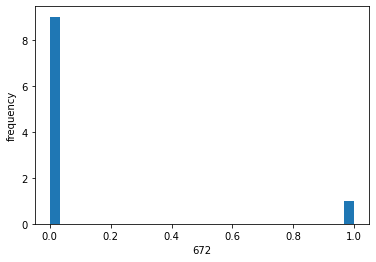

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


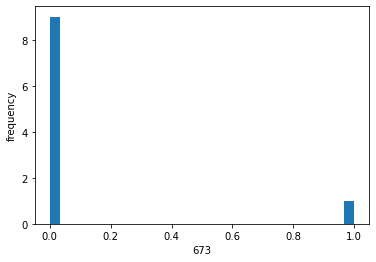

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


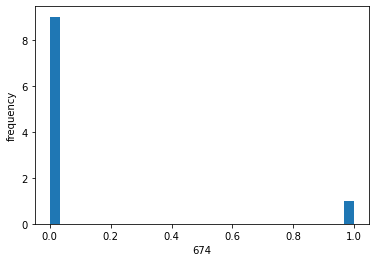

6
4
[1.0000000e+00 1.3294545e-12 4.5468726e-13 5.5925566e-13 1.2379498e-12
 1.4834956e-12 1.1815125e-12 7.5113678e-13 1.5109180e-12 1.1504899e-12]
5


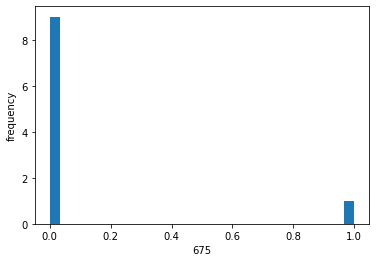

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


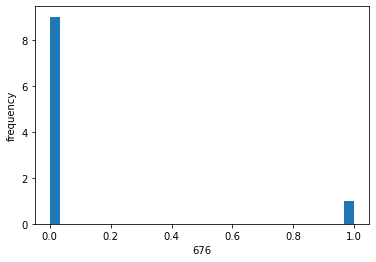

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


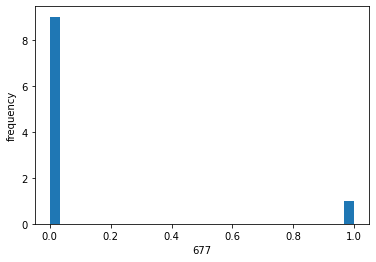

6
4
[1.0000000e+00 2.6045479e-17 5.4161789e-18 7.3825928e-18 2.2292160e-17
 2.9109194e-17 2.1415357e-17 1.1315707e-17 2.9994750e-17 2.0267301e-17]
5


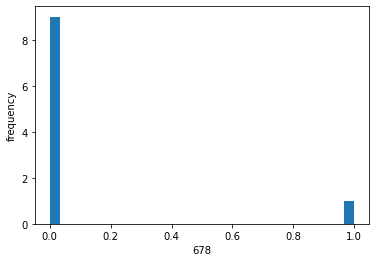

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


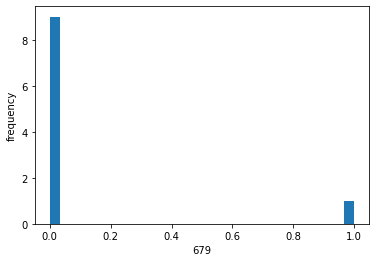

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


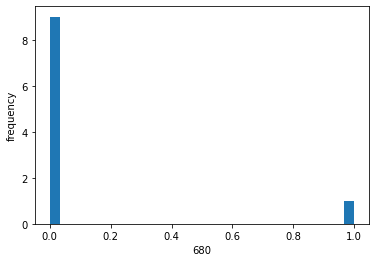

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


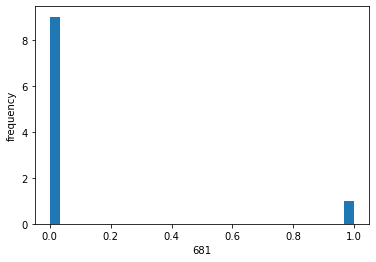

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


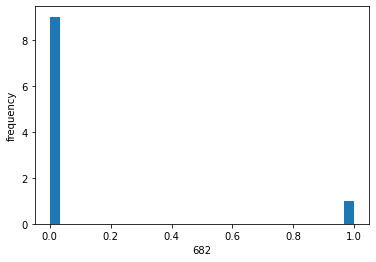

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


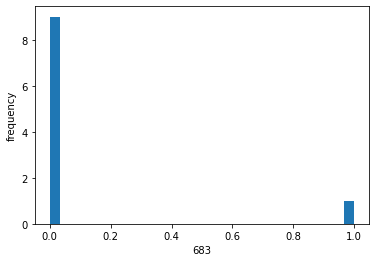

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


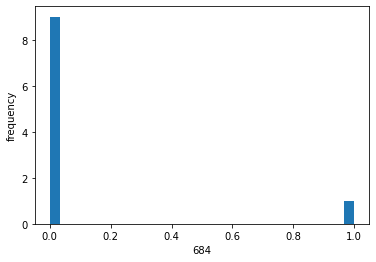

6
4
[1.0000000e+00 1.7817294e-09 8.3440943e-10 9.6365083e-10 1.7319582e-09
 1.9617350e-09 1.6561488e-09 1.1926857e-09 1.9838147e-09 1.6421920e-09]
5


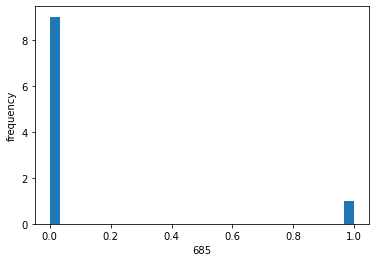

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


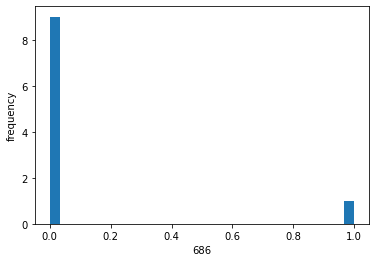

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


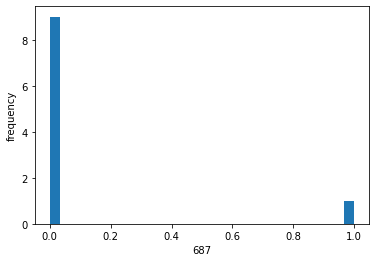

6
4
[1.0000000e+00 8.1981123e-24 8.3955626e-25 1.3223855e-24 6.1299924e-24
 9.0325221e-24 6.0322166e-24 2.4661815e-24 9.5500755e-24 5.4289668e-24]
5


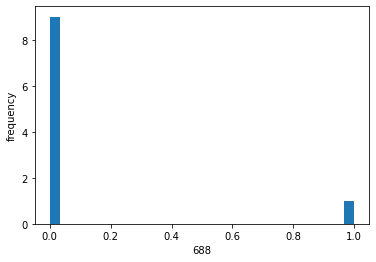

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


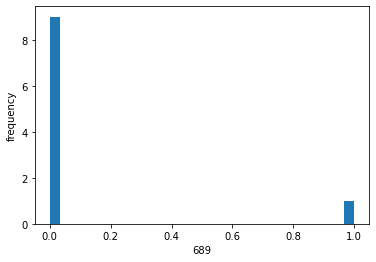

6
4
[1.0000000e+00 7.5760115e-10 3.4218370e-10 3.9792702e-10 7.3353773e-10
 8.3582391e-10 7.0081357e-10 4.9710858e-10 8.4568280e-10 6.9331235e-10]
5


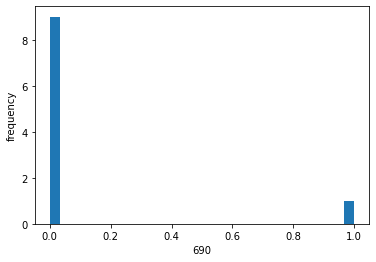

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


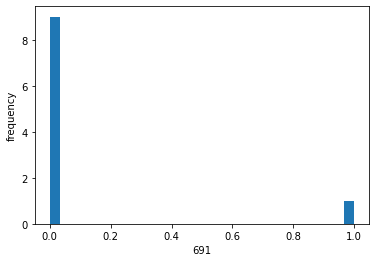

6
4
[1.0000000e+00 7.8241997e-28 5.1854442e-29 8.8863250e-29 5.3871795e-28
 8.5430641e-28 5.3879402e-28 1.8766478e-28 9.1971013e-28 4.6974019e-28]
5


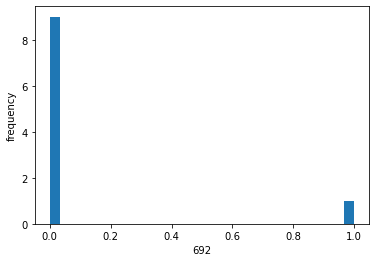

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


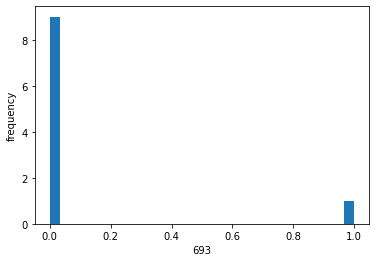

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


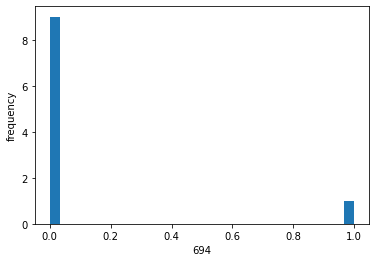

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


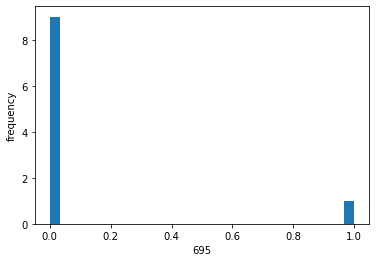

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


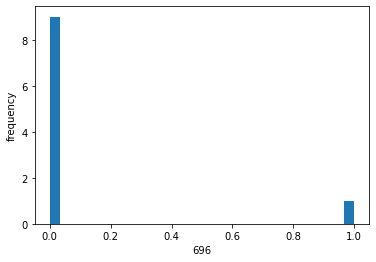

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


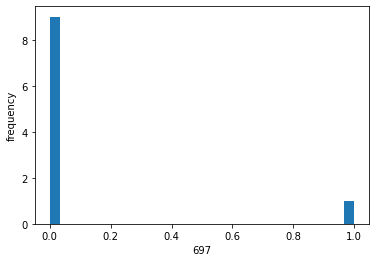

6
4
[1.0000000e+00 2.8239189e-27 1.9704347e-28 3.3483207e-28 1.9499401e-27
 3.0715270e-27 1.9547661e-27 6.9569703e-28 3.3063479e-27 1.7088451e-27]
5


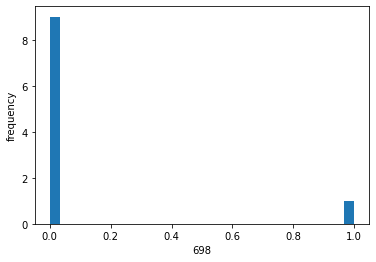

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


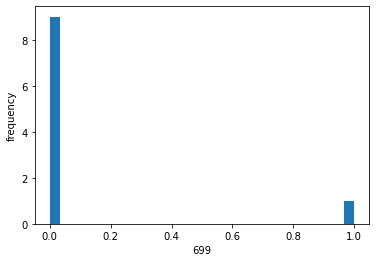

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


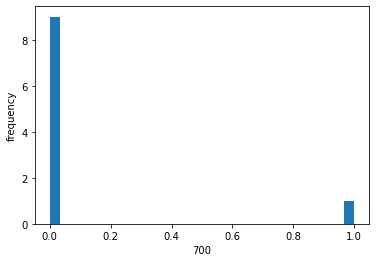

6
4
[1.0000000e+00 9.6599978e-16 2.3761143e-16 3.1269915e-16 8.5123095e-16
 1.0803467e-15 8.1547906e-16 4.5834186e-16 1.1080144e-15 7.7995434e-16]
5


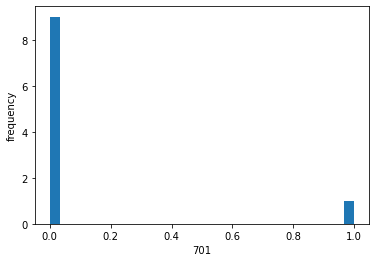

6
4
[1.0000000e+00 3.5855674e-22 4.3974022e-23 6.6807273e-23 2.7785125e-22
 3.9687403e-22 2.7140034e-22 1.1847289e-22 4.1644750e-22 2.4756005e-22]
5


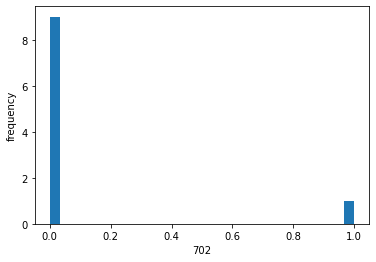

6
4
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
5


KeyboardInterrupt: 

In [42]:
predictions
for i in range(len(predictions)):
#         powder.plot(kind='hist', x=i, y=None, label=i, bins=100)
    print(4)
    print(predictions[i])
    plt.hist(predictions[i], bins=30, range=None, density=False, weights=None, cumulative=False, bottom=None, histtype='bar', align='mid', orientation='vertical', rwidth=None, log=False, color=None, label=None, stacked=False, data=None)
    print(5)
    #plt.title(i + name)
    plt.ylabel("frequency")
    plt.xlabel(i)
    plt.show()
    plt.close()
    print(6)
   # name = data[data.sample_id == sample_id].iloc[0][data.columns[1]]
    #number_of_particles = len(data[data.sample_id == sample_id])
    #print("NAME: ", name, "FLOW:", powder, "ID:", sample_id)

1
2
3
4
5


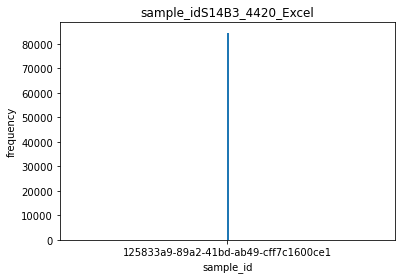

4
5


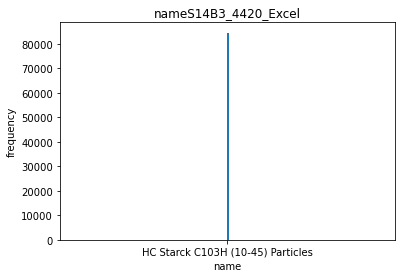

4
5


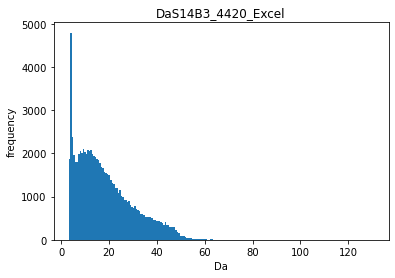

4
5


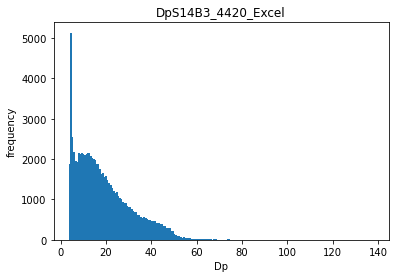

4
5


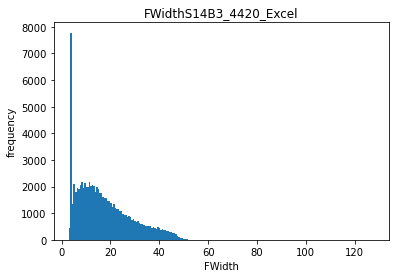

4
5


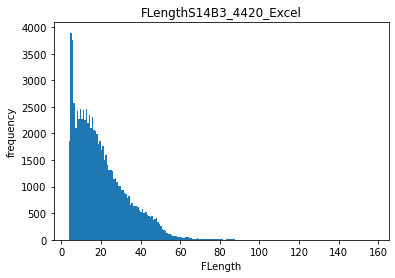

4
5


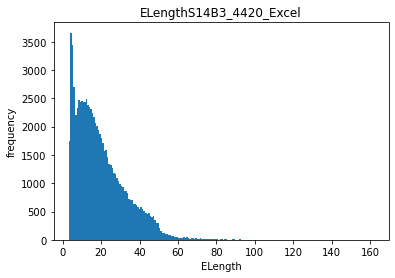

4
5


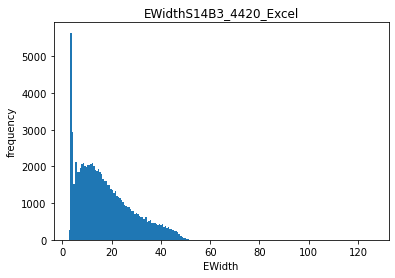

4
5


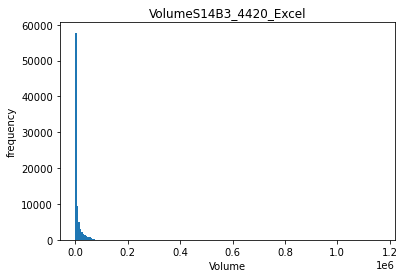

4
5


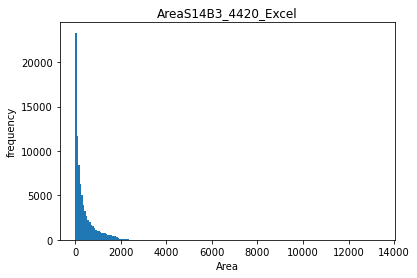

4
5


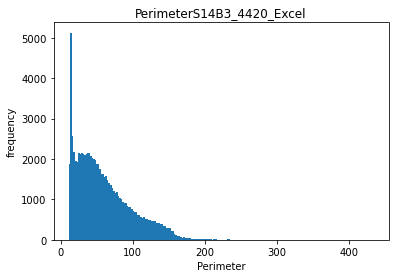

4
5


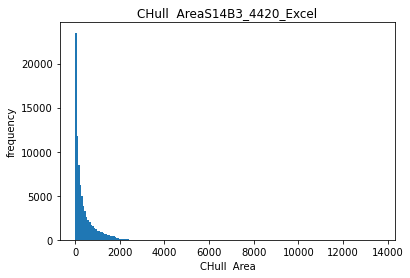

4
5


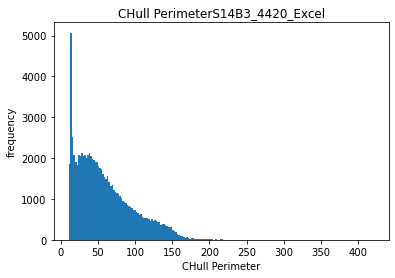

4
5


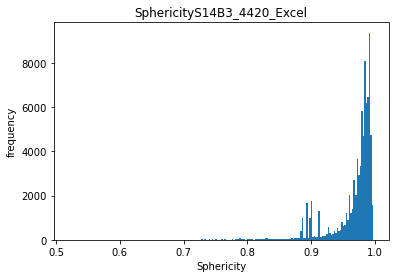

4
5


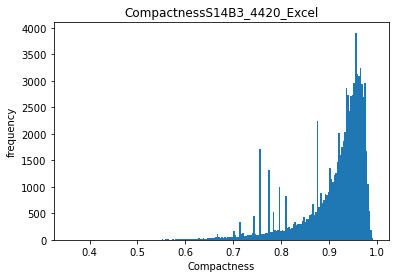

4
5


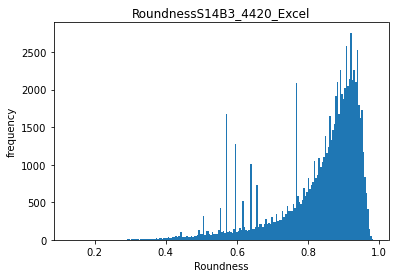

4
5


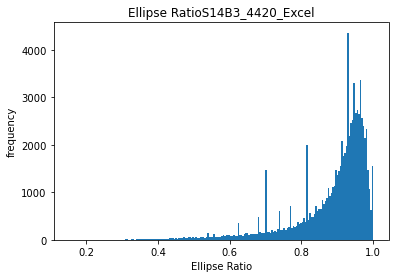

4
5


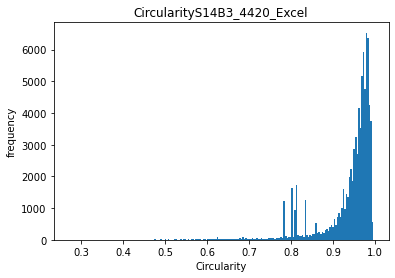

4
5


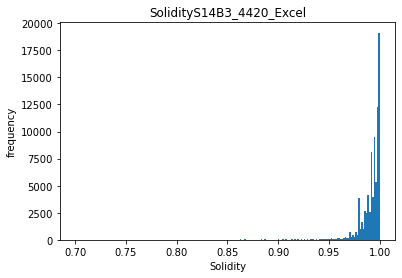

4
5


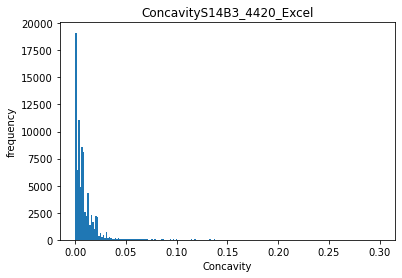

4
5


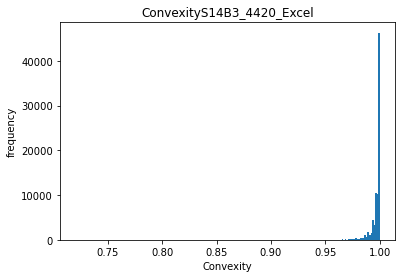

4
5


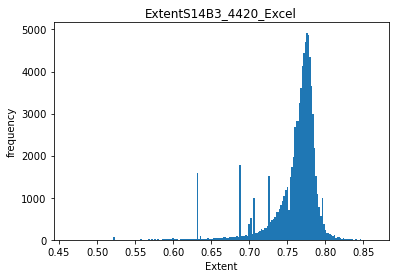

4
5


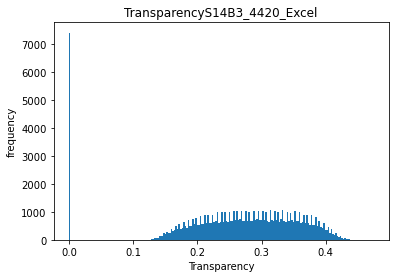

4
5


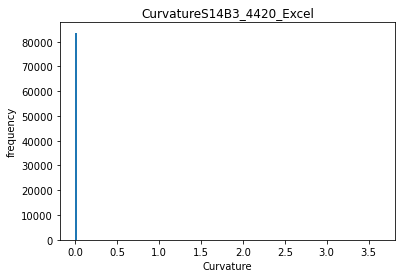

4
5


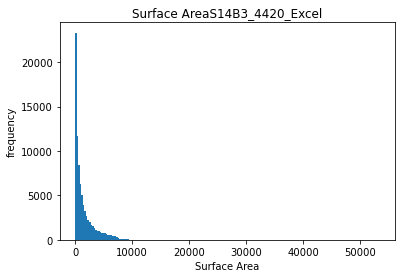

4
5


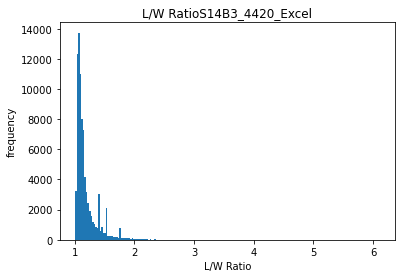

4
5


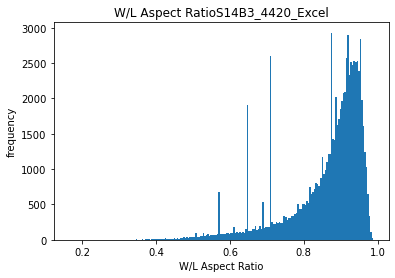

4
5


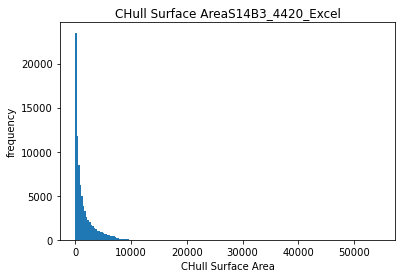

4
5


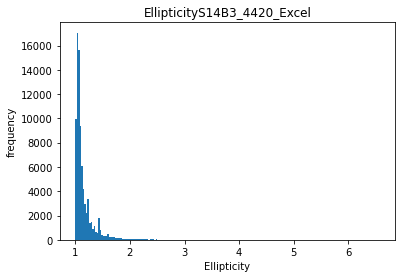

4
5


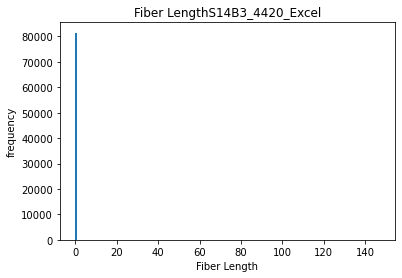

4
5


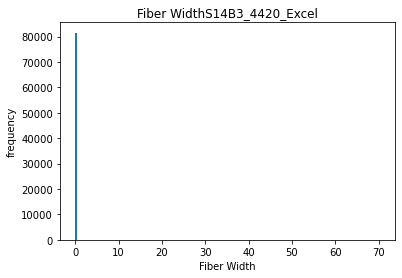

4
5


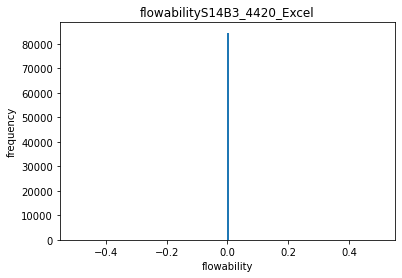

6
NAME:  HC Starck C103H (10-45) Particles FLOW:                                   sample_id  \
0      125833a9-89a2-41bd-ab49-cff7c1600ce1   
1      125833a9-89a2-41bd-ab49-cff7c1600ce1   
2      125833a9-89a2-41bd-ab49-cff7c1600ce1   
3      125833a9-89a2-41bd-ab49-cff7c1600ce1   
4      125833a9-89a2-41bd-ab49-cff7c1600ce1   
...                                     ...   
84471  125833a9-89a2-41bd-ab49-cff7c1600ce1   
84472  125833a9-89a2-41bd-ab49-cff7c1600ce1   
84473  125833a9-89a2-41bd-ab49-cff7c1600ce1   
84474  125833a9-89a2-41bd-ab49-cff7c1600ce1   
84475  125833a9-89a2-41bd-ab49-cff7c1600ce1   

                                    name       Da       Dp   FWidth  FLength  \
0      HC Starck C103H (10-45) Particles  130.420  137.901  127.571  144.732   
1      HC Starck C103H (10-45) Particles  121.500  122.698  120.017  123.997   
2      HC Starck C103H (10-45) Particles  106.932  107.965  106.426  108.136   
3      HC Starck C103H (10-45) Particles   94.485  107.182   90.80

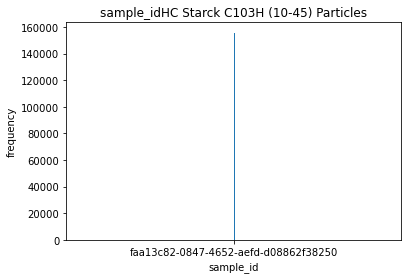

4
5


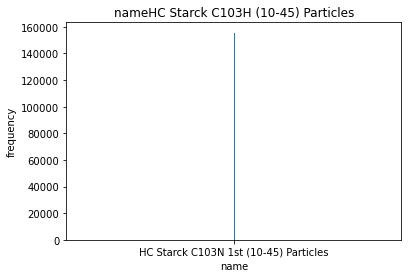

4
5


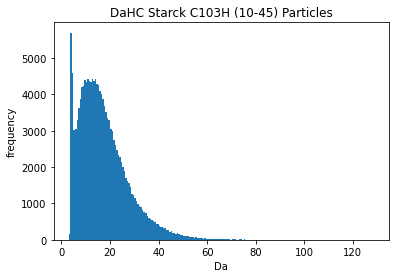

4
5


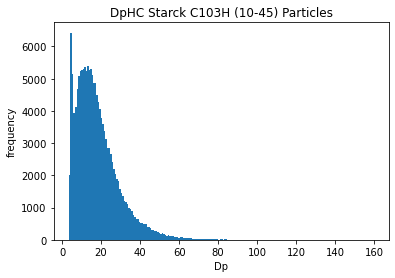

4
5


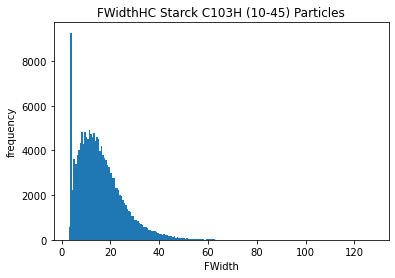

4
5


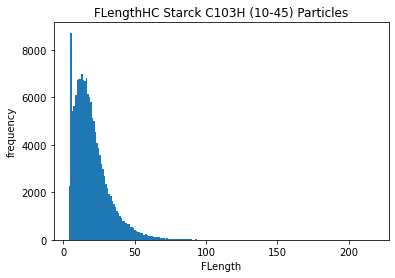

4
5


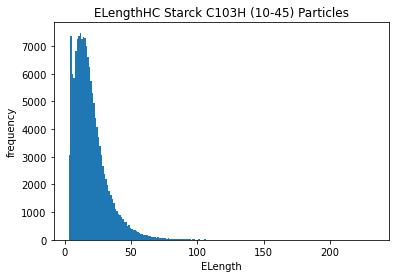

4
5


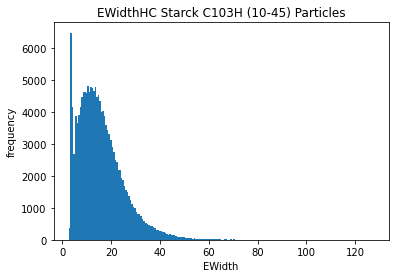

4
5


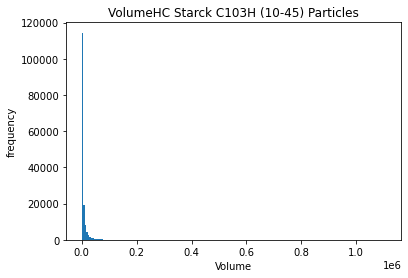

4
5


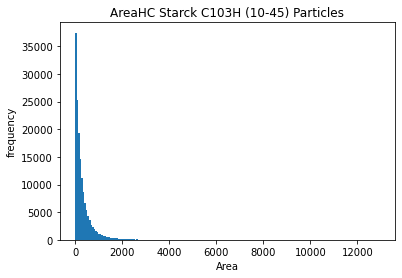

4
5


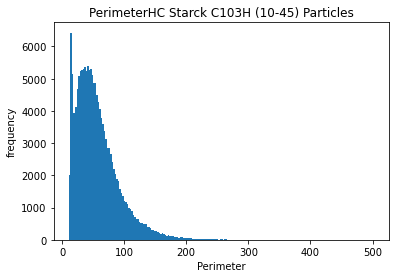

4
5


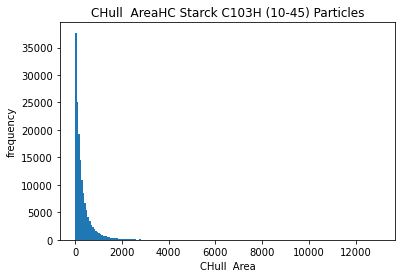

4
5


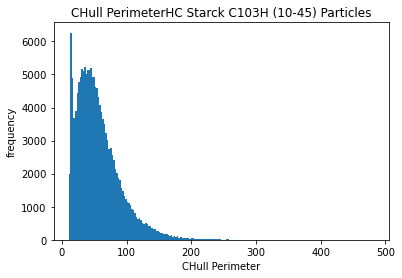

4
5


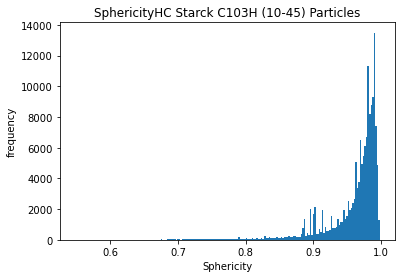

4
5


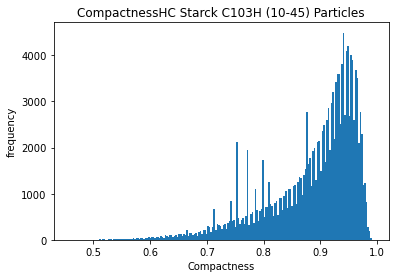

4
5


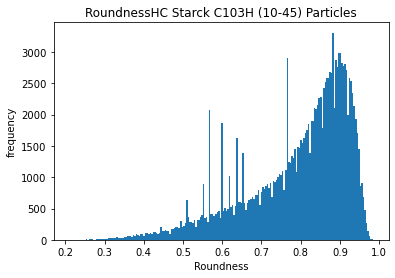

4
5


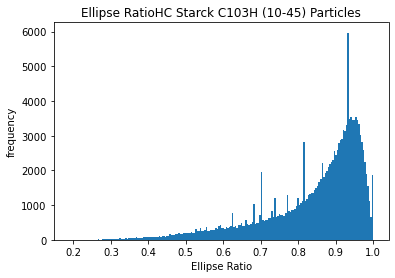

4
5


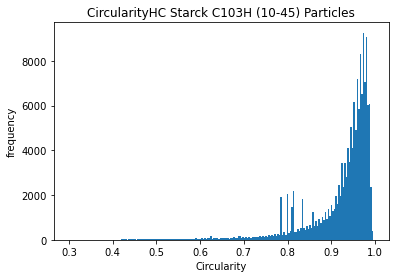

4
5


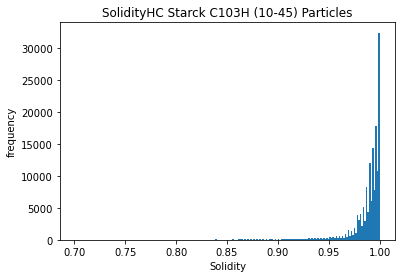

4
5


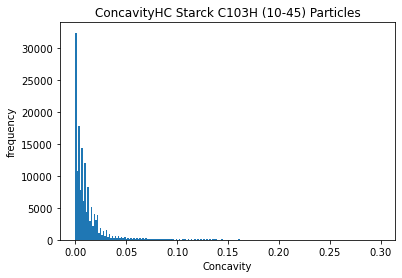

4
5


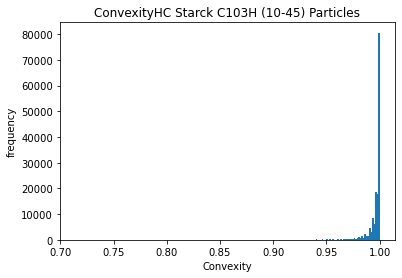

4
5


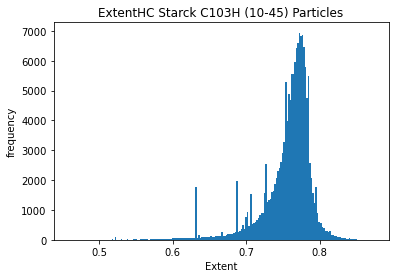

4
5


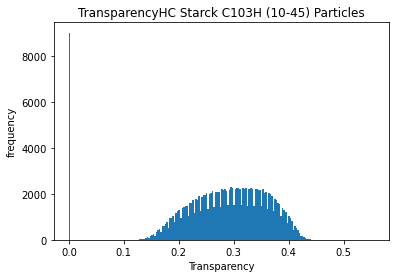

4
5


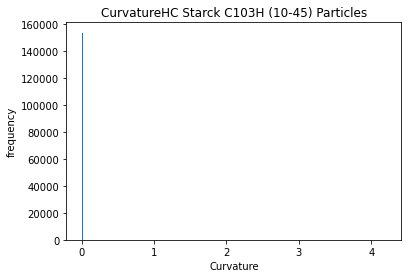

4
5


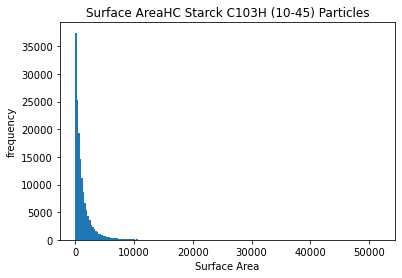

4
5


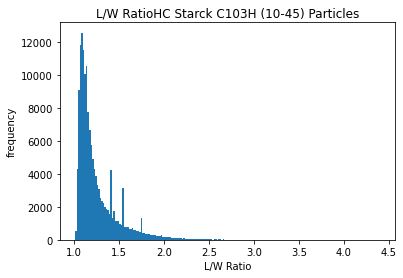

4
5


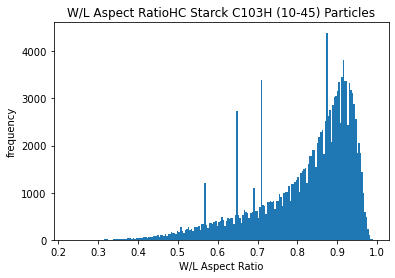

4
5


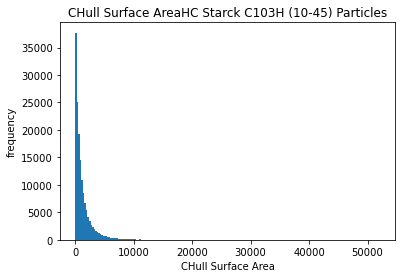

4
5


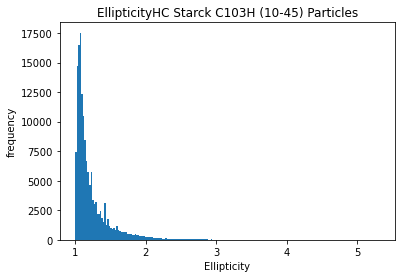

4
5


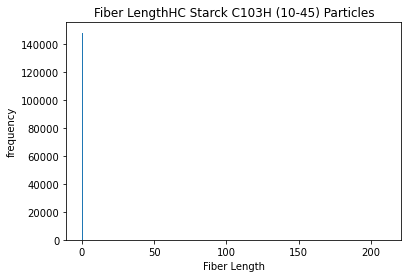

4
5


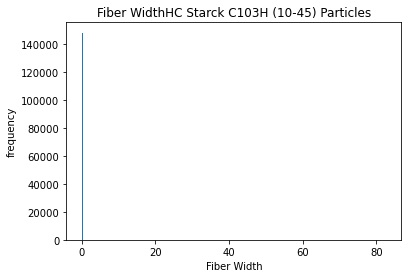

4
5


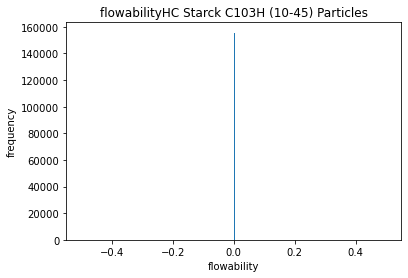

6
NAME:  HC Starck C103N 1st (10-45) Particles FLOW:                                    sample_id  \
84476   faa13c82-0847-4652-aefd-d08862f38250   
84477   faa13c82-0847-4652-aefd-d08862f38250   
84478   faa13c82-0847-4652-aefd-d08862f38250   
84479   faa13c82-0847-4652-aefd-d08862f38250   
84480   faa13c82-0847-4652-aefd-d08862f38250   
...                                      ...   
240082  faa13c82-0847-4652-aefd-d08862f38250   
240083  faa13c82-0847-4652-aefd-d08862f38250   
240084  faa13c82-0847-4652-aefd-d08862f38250   
240085  faa13c82-0847-4652-aefd-d08862f38250   
240086  faa13c82-0847-4652-aefd-d08862f38250   

                                         name       Da       Dp   FWidth  \
84476   HC Starck C103N 1st (10-45) Particles  128.392  130.293  127.701   
84477   HC Starck C103N 1st (10-45) Particles  122.435  150.288  111.881   
84478   HC Starck C103N 1st (10-45) Particles  112.177  115.172  110.179   
84479   HC Starck C103N 1st (10-45) Particles  109.367  110.863  1

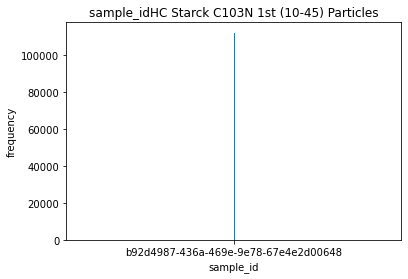

4
5


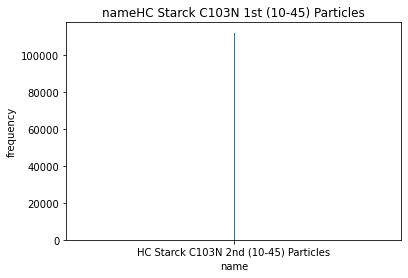

4
5


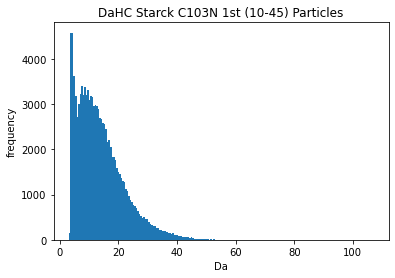

4
5


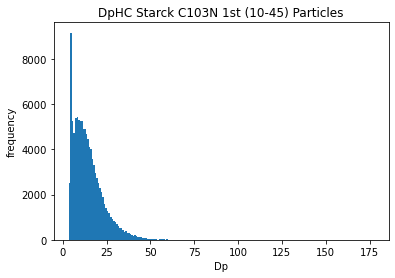

4
5


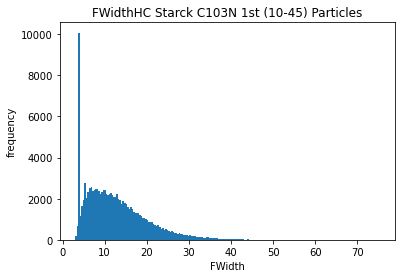

4
5


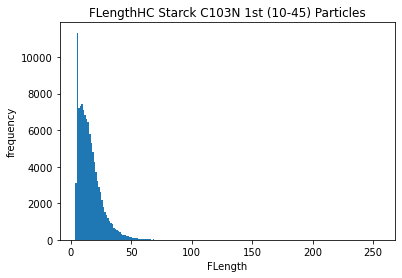

4
5


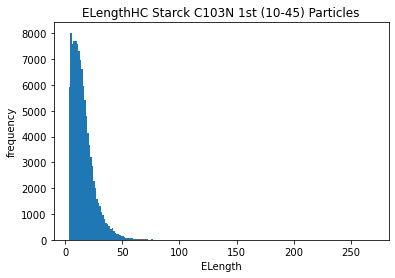

4
5


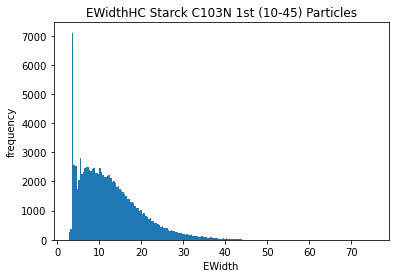

4
5


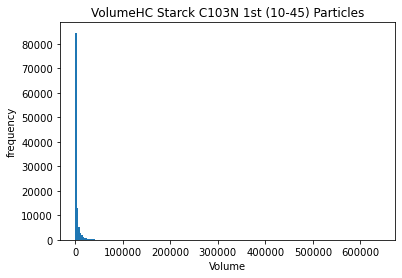

4
5


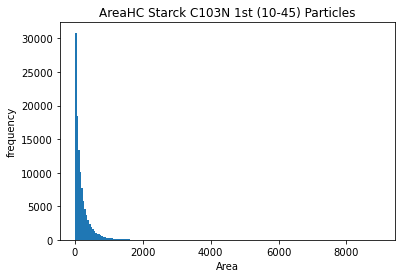

4
5


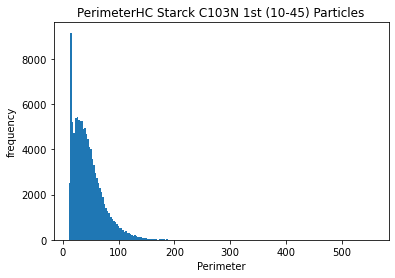

4
5


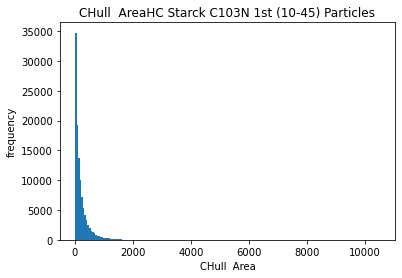

4
5


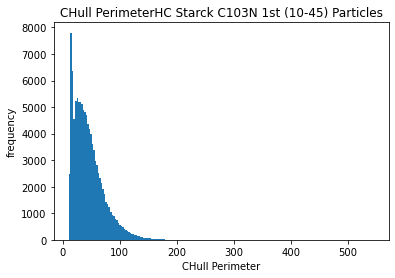

4
5


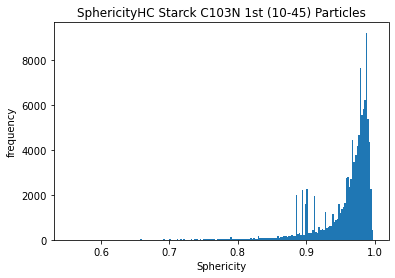

4
5


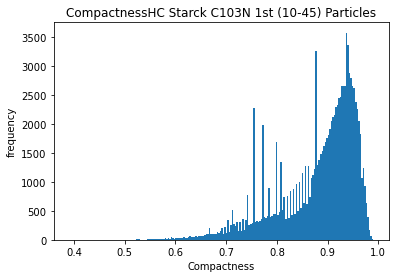

4
5


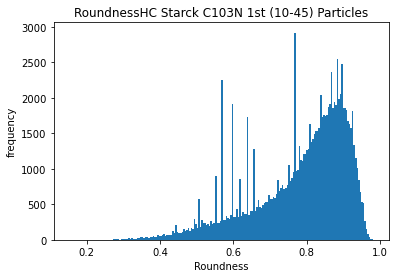

4
5


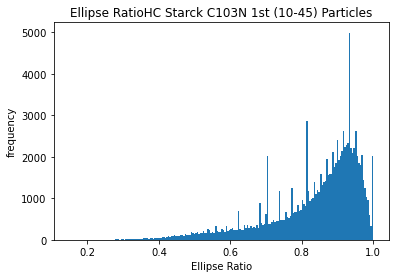

4
5


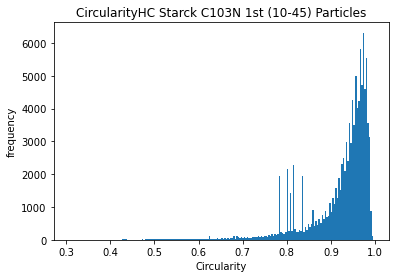

4
5


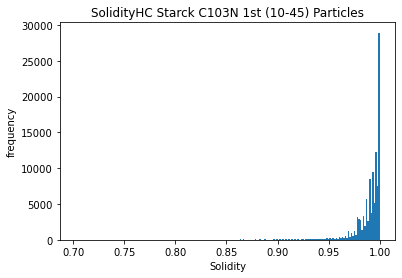

4
5


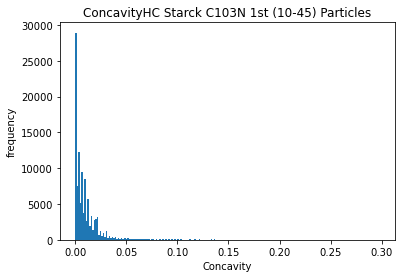

4
5


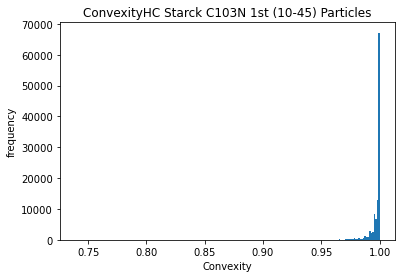

4
5


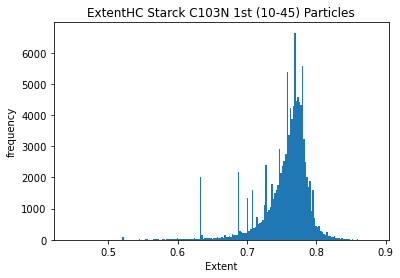

4
5


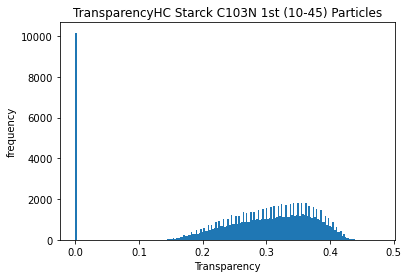

4
5


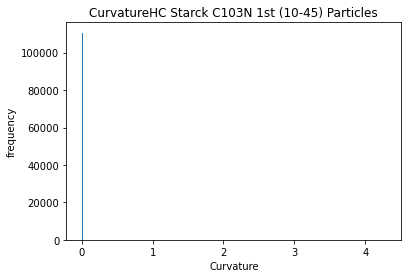

4
5


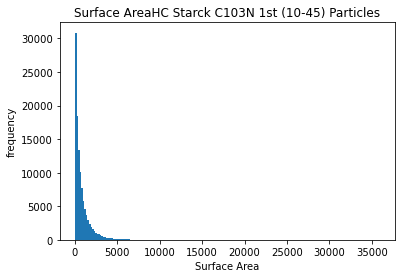

4
5


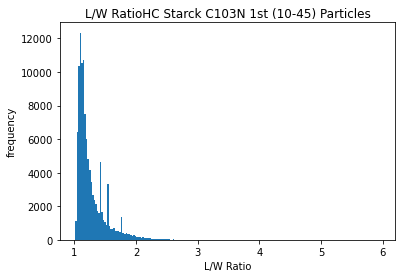

4
5


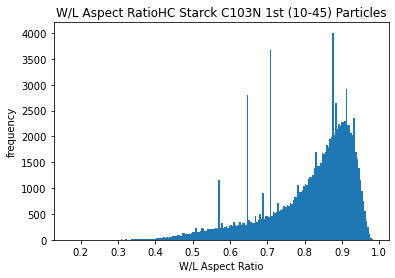

4
5


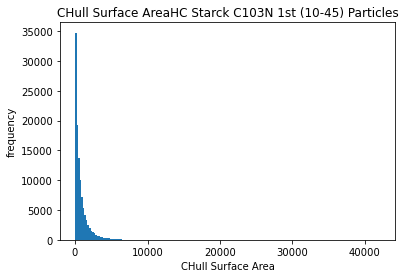

4
5


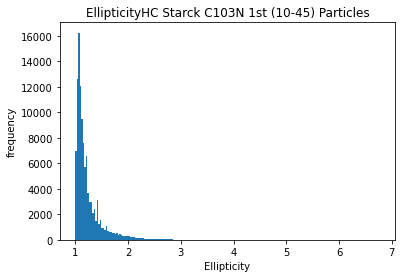

4
5


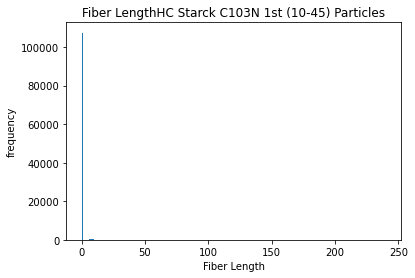

4
5


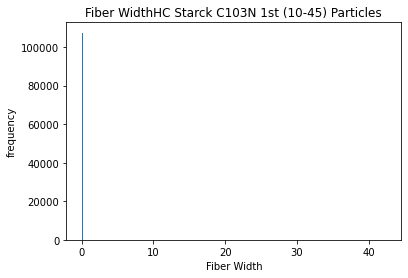

4
5


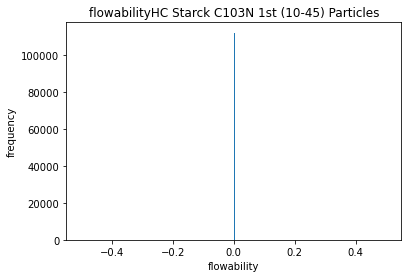

6
NAME:  HC Starck C103N 2nd (10-45) Particles FLOW:                                    sample_id  \
240087  b92d4987-436a-469e-9e78-67e4e2d00648   
240088  b92d4987-436a-469e-9e78-67e4e2d00648   
240089  b92d4987-436a-469e-9e78-67e4e2d00648   
240090  b92d4987-436a-469e-9e78-67e4e2d00648   
240091  b92d4987-436a-469e-9e78-67e4e2d00648   
...                                      ...   
351989  b92d4987-436a-469e-9e78-67e4e2d00648   
351990  b92d4987-436a-469e-9e78-67e4e2d00648   
351991  b92d4987-436a-469e-9e78-67e4e2d00648   
351992  b92d4987-436a-469e-9e78-67e4e2d00648   
351993  b92d4987-436a-469e-9e78-67e4e2d00648   

                                         name      Da       Dp  FWidth  \
240087  HC Starck C103N 2nd (10-45) Particles  76.024   78.593  75.317   
240088  HC Starck C103N 2nd (10-45) Particles  96.014  105.267  71.290   
240089  HC Starck C103N 2nd (10-45) Particles  70.646   71.665  70.222   
240090  HC Starck C103N 2nd (10-45) Particles  70.496   71.777  69.815   


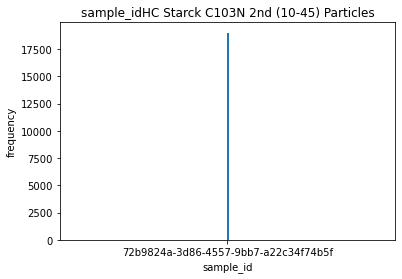

4
5


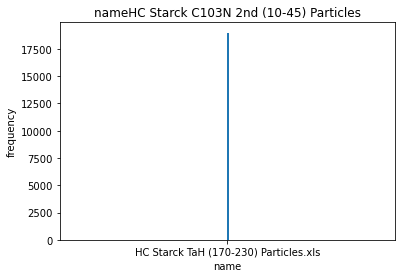

4
5


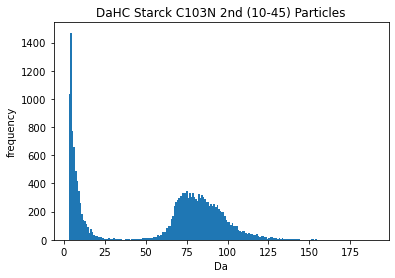

4
5


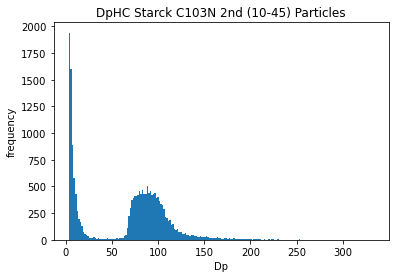

4
5


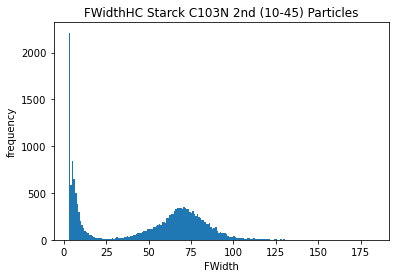

4
5


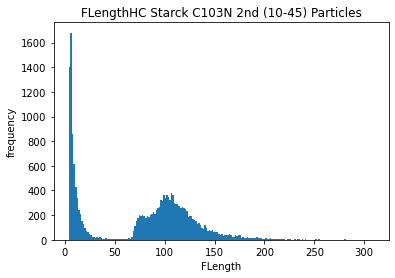

4
5


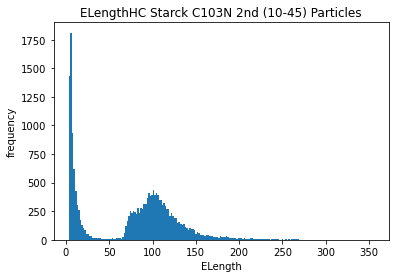

4
5


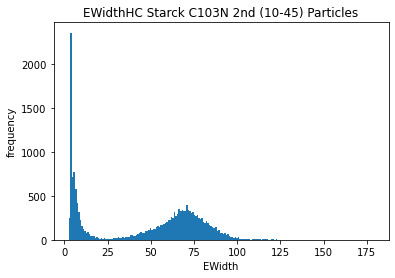

4
5


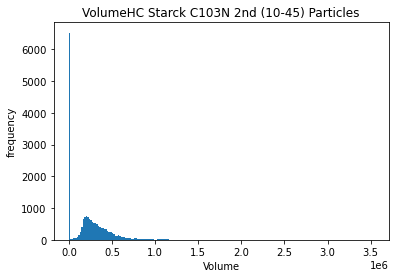

4
5


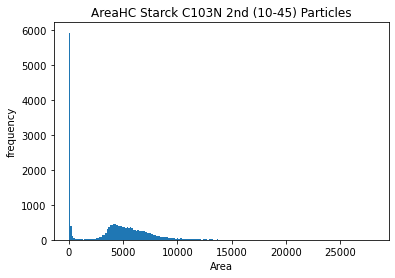

4
5


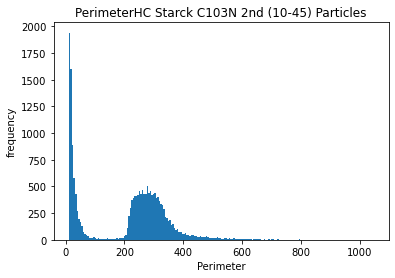

4
5


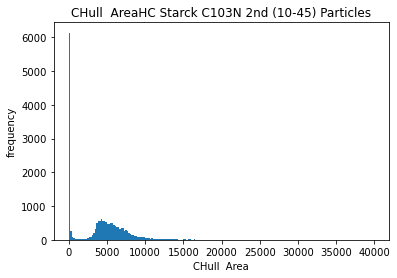

4
5


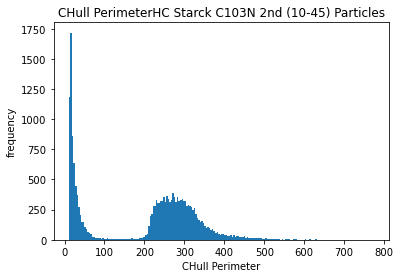

4
5


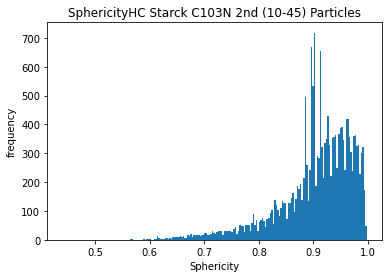

4
5


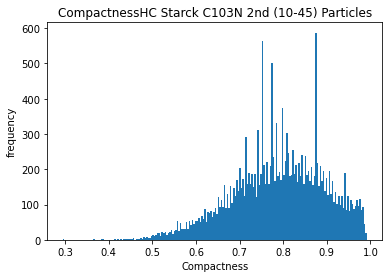

4
5


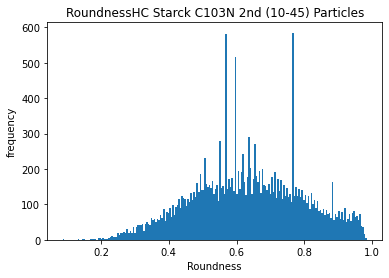

4
5


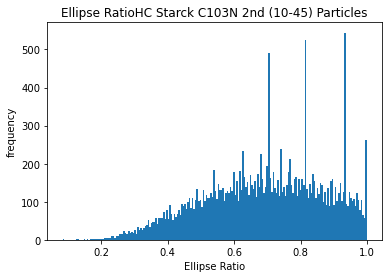

4
5


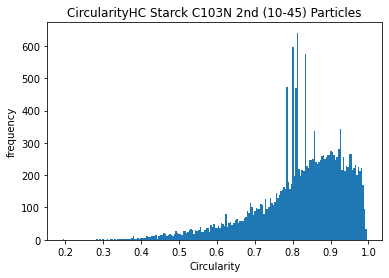

4
5


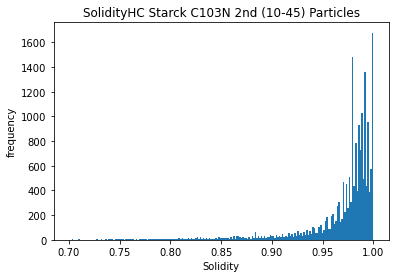

4
5


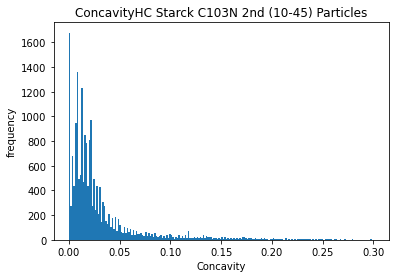

4
5


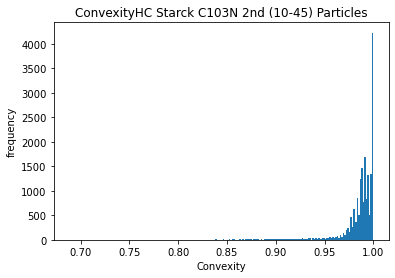

4
5


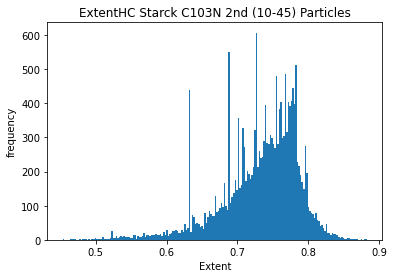

4
5


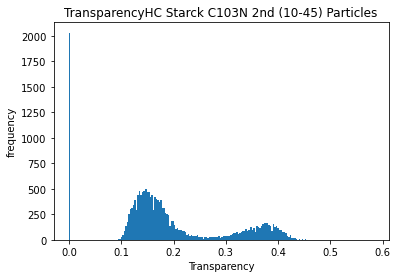

4
5


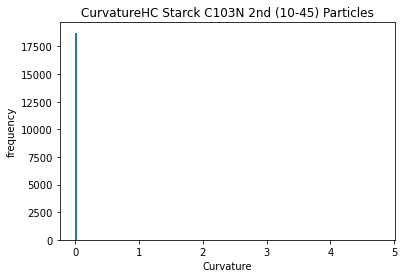

4
5


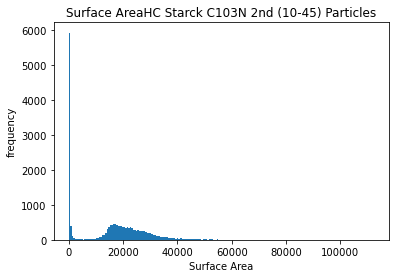

4
5


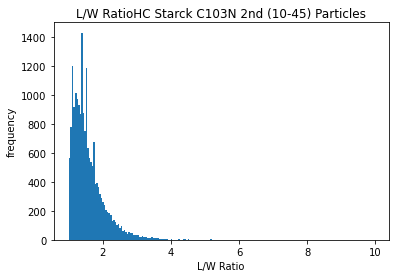

4
5


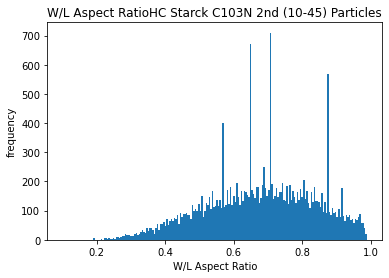

4
5


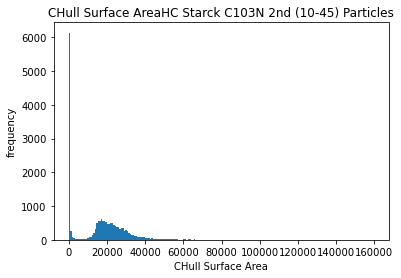

4
5


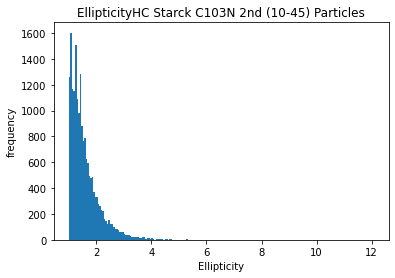

4
5


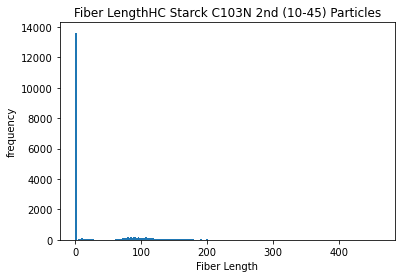

4
5


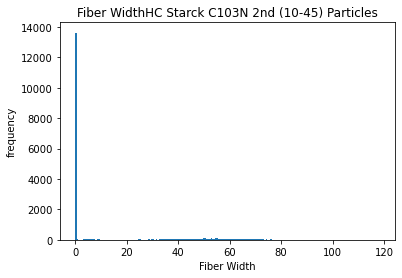

4
5


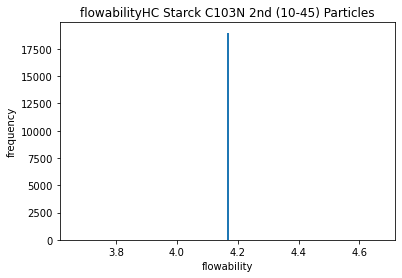

6
NAME:  HC Starck TaH (170-230) Particles.xls FLOW:                                    sample_id  \
351994  72b9824a-3d86-4557-9bb7-a22c34f74b5f   
351995  72b9824a-3d86-4557-9bb7-a22c34f74b5f   
351996  72b9824a-3d86-4557-9bb7-a22c34f74b5f   
351997  72b9824a-3d86-4557-9bb7-a22c34f74b5f   
351998  72b9824a-3d86-4557-9bb7-a22c34f74b5f   
...                                      ...   
370968  72b9824a-3d86-4557-9bb7-a22c34f74b5f   
370969  72b9824a-3d86-4557-9bb7-a22c34f74b5f   
370970  72b9824a-3d86-4557-9bb7-a22c34f74b5f   
370971  72b9824a-3d86-4557-9bb7-a22c34f74b5f   
370972  72b9824a-3d86-4557-9bb7-a22c34f74b5f   

                                         name       Da       Dp   FWidth  \
351994  HC Starck TaH (170-230) Particles.xls  188.907  333.079  182.512   
351995  HC Starck TaH (170-230) Particles.xls  159.403  197.046  161.794   
351996  HC Starck TaH (170-230) Particles.xls  149.113  248.620  160.737   
351997  HC Starck TaH (170-230) Particles.xls  152.836  230.407  1

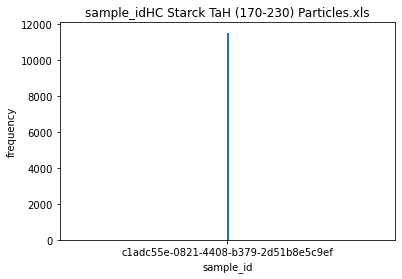

4
5


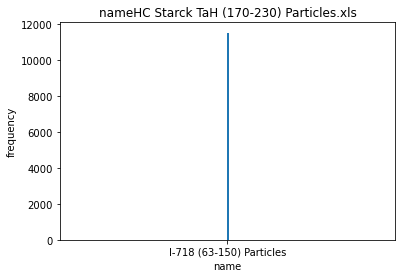

4
5


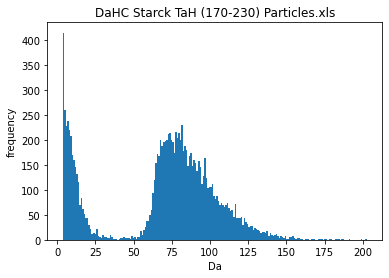

4
5


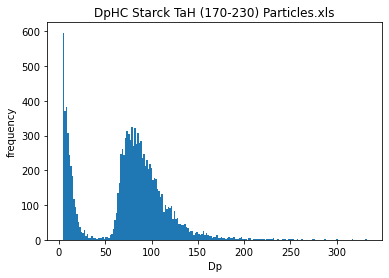

4
5


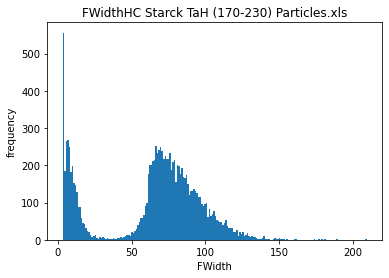

4
5


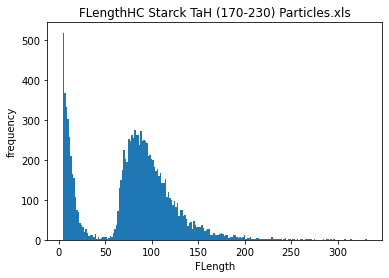

4
5


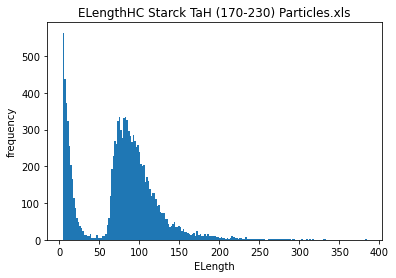

4
5


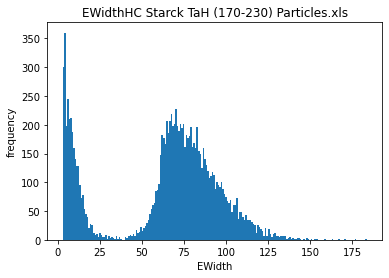

4
5


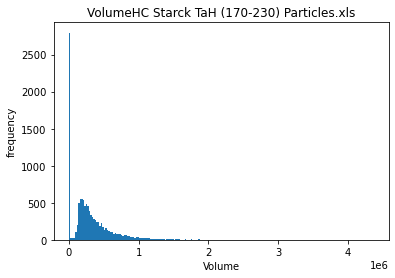

4
5


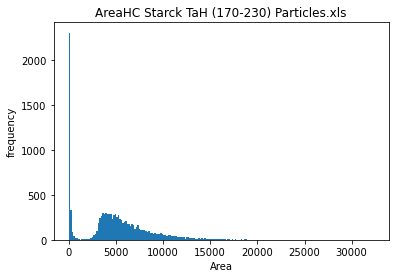

4
5


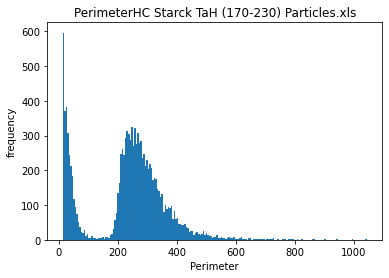

4
5


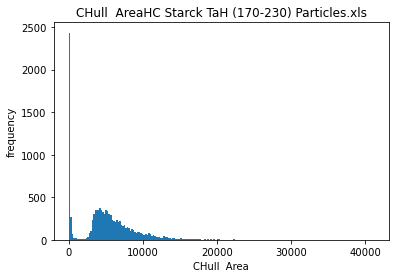

4
5


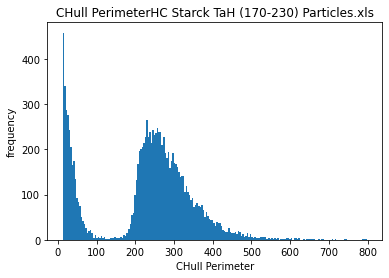

4
5


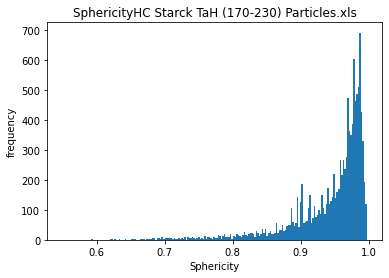

4
5


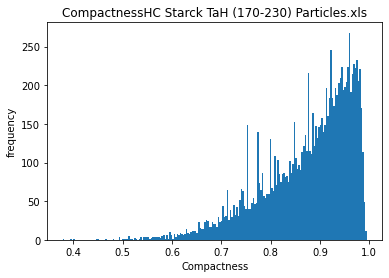

4
5


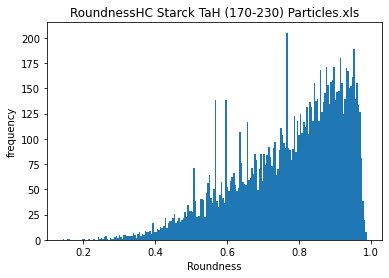

4
5


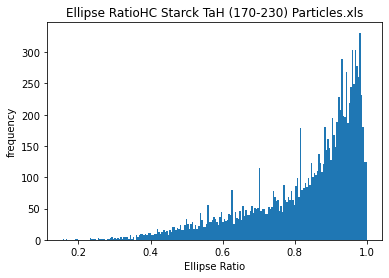

4
5


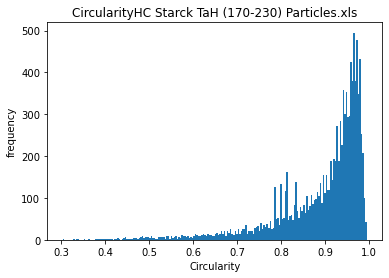

4
5


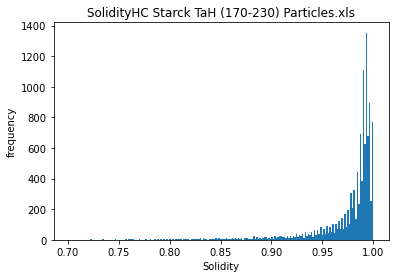

4
5


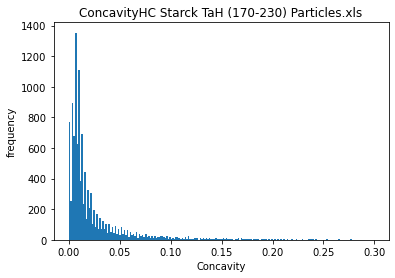

4
5


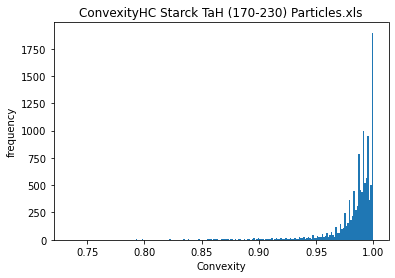

4
5


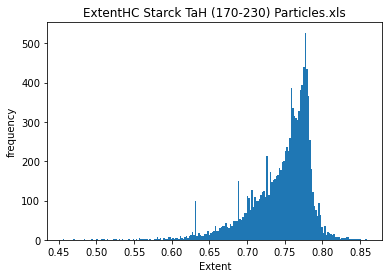

4
5


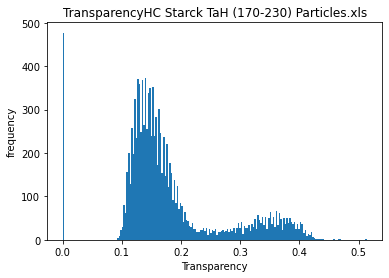

4
5


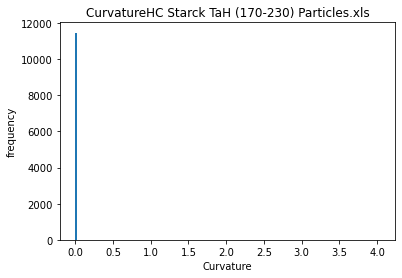

4
5


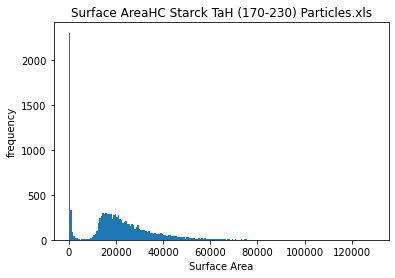

4
5


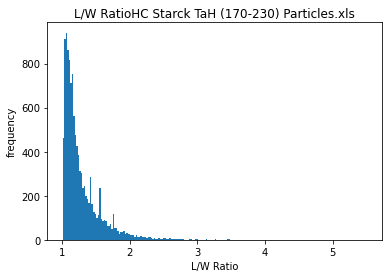

4
5


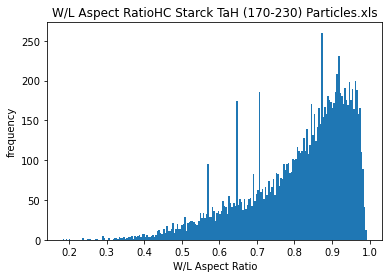

4
5


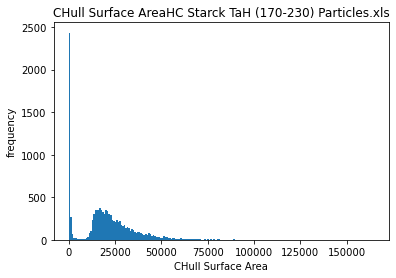

4
5


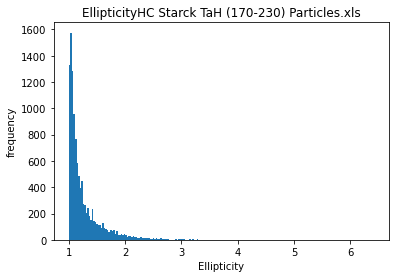

4
5


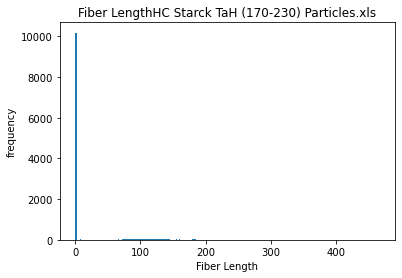

4
5


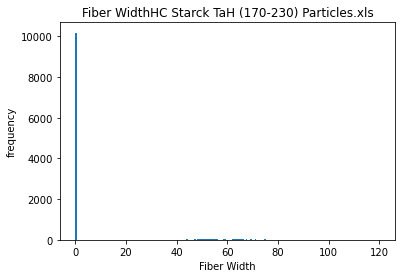

4
5


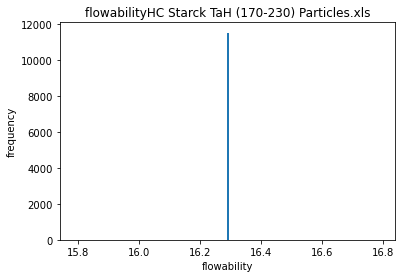

6
NAME:  I-718 (63-150) Particles FLOW:                                    sample_id                      name  \
370973  c1adc55e-0821-4408-b379-2d51b8e5c9ef  I-718 (63-150) Particles   
370974  c1adc55e-0821-4408-b379-2d51b8e5c9ef  I-718 (63-150) Particles   
370975  c1adc55e-0821-4408-b379-2d51b8e5c9ef  I-718 (63-150) Particles   
370976  c1adc55e-0821-4408-b379-2d51b8e5c9ef  I-718 (63-150) Particles   
370977  c1adc55e-0821-4408-b379-2d51b8e5c9ef  I-718 (63-150) Particles   
...                                      ...                       ...   
382500  c1adc55e-0821-4408-b379-2d51b8e5c9ef  I-718 (63-150) Particles   
382501  c1adc55e-0821-4408-b379-2d51b8e5c9ef  I-718 (63-150) Particles   
382502  c1adc55e-0821-4408-b379-2d51b8e5c9ef  I-718 (63-150) Particles   
382503  c1adc55e-0821-4408-b379-2d51b8e5c9ef  I-718 (63-150) Particles   
382504  c1adc55e-0821-4408-b379-2d51b8e5c9ef  I-718 (63-150) Particles   

             Da       Dp   FWidth  FLength  ELength   EWidth       Volu

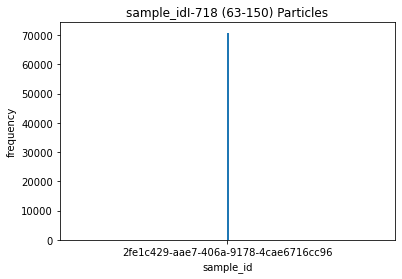

4
5


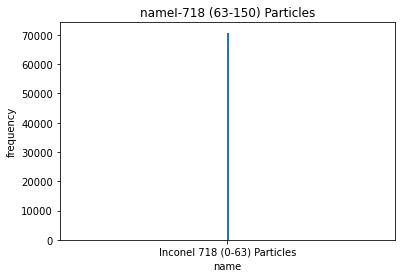

4
5


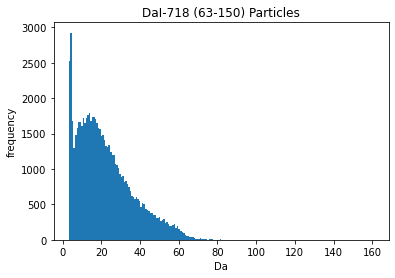

4
5


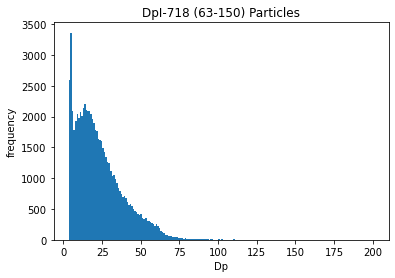

4
5


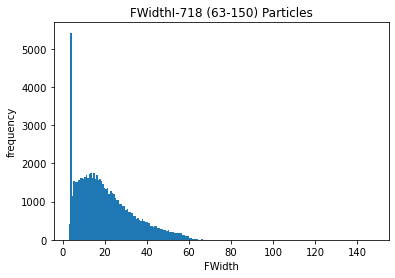

4
5


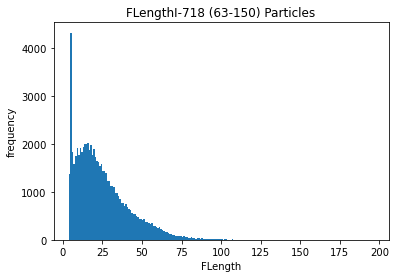

4
5


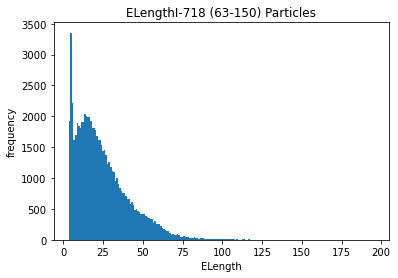

4
5


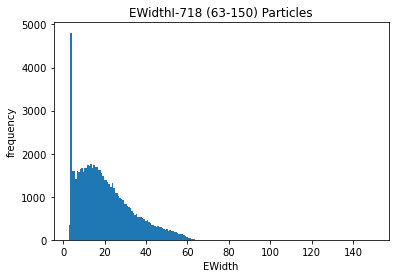

4
5


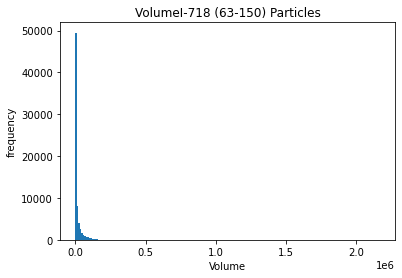

4
5


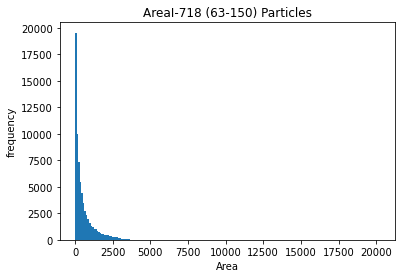

4
5


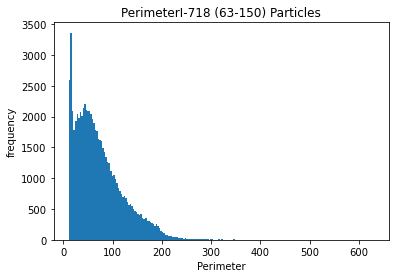

4
5


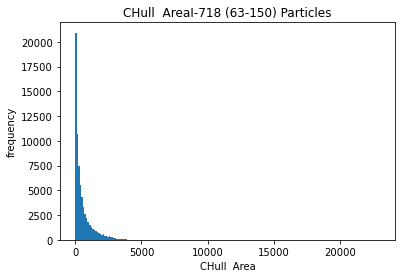

4
5


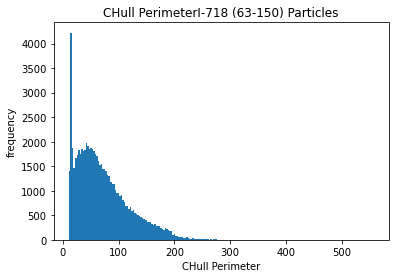

4
5


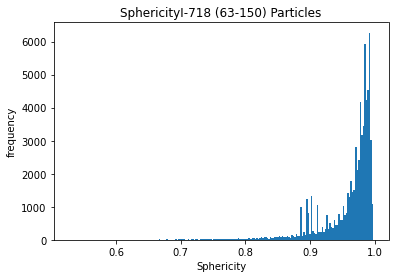

4
5


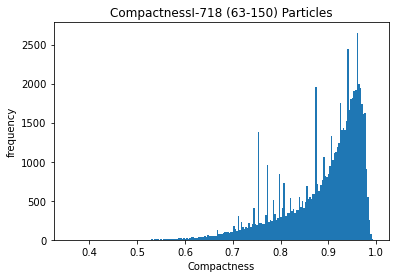

4
5


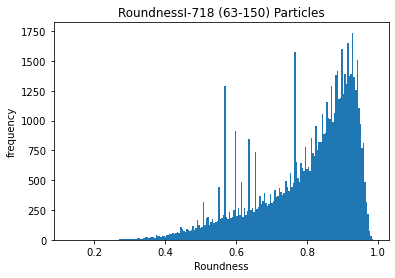

4
5


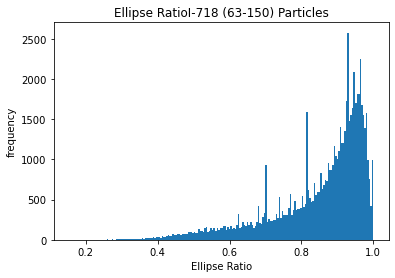

4
5


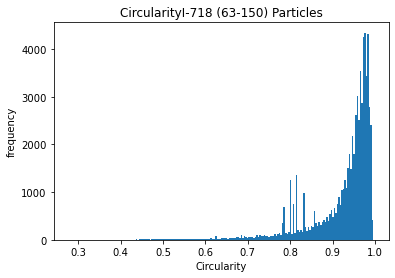

4
5


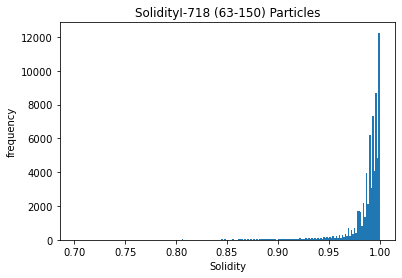

4
5


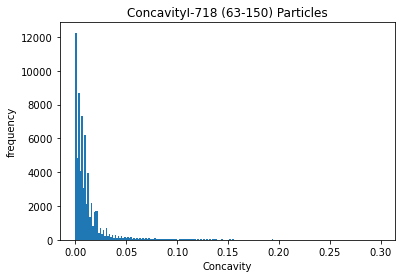

4
5


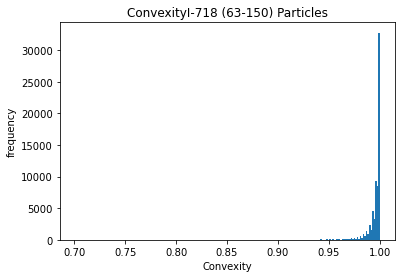

4
5


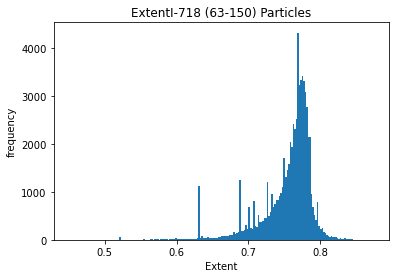

4
5


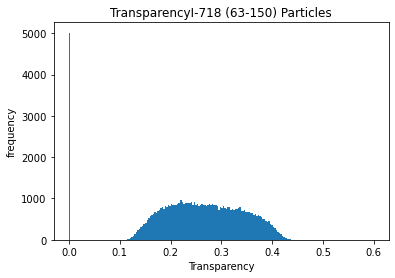

4
5


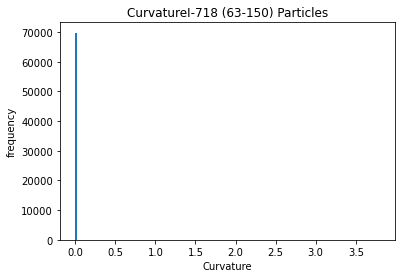

4
5


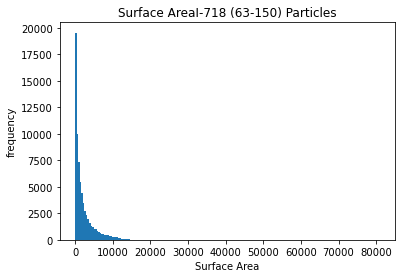

4
5


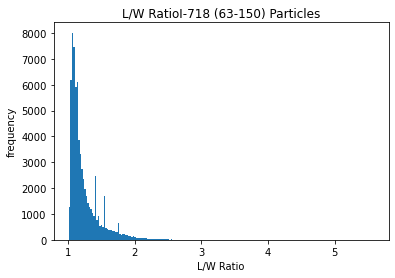

4
5


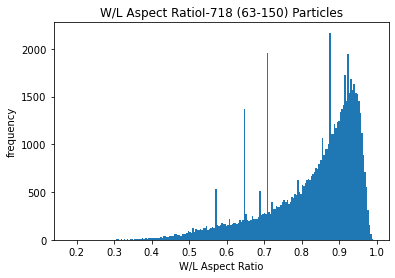

4
5


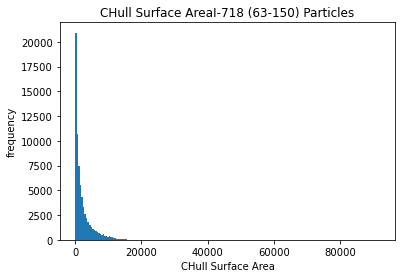

4
5


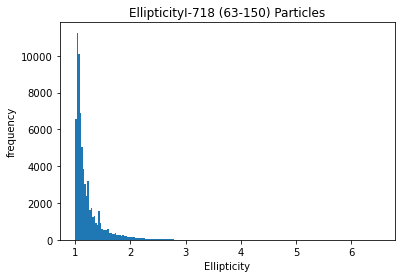

4
5


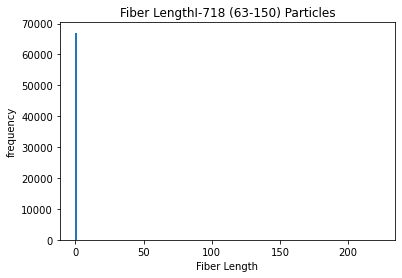

4
5


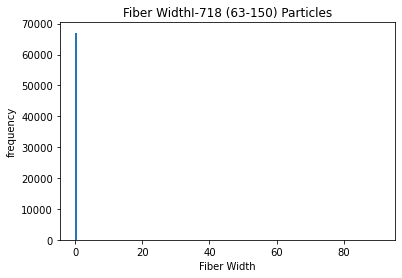

4
5


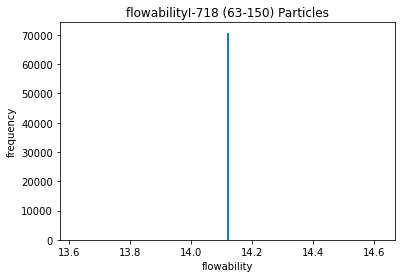

6
NAME:  Inconel 718 (0-63) Particles FLOW:                                    sample_id                          name  \
382505  2fe1c429-aae7-406a-9178-4cae6716cc96  Inconel 718 (0-63) Particles   
382506  2fe1c429-aae7-406a-9178-4cae6716cc96  Inconel 718 (0-63) Particles   
382507  2fe1c429-aae7-406a-9178-4cae6716cc96  Inconel 718 (0-63) Particles   
382508  2fe1c429-aae7-406a-9178-4cae6716cc96  Inconel 718 (0-63) Particles   
382509  2fe1c429-aae7-406a-9178-4cae6716cc96  Inconel 718 (0-63) Particles   
...                                      ...                           ...   
453265  2fe1c429-aae7-406a-9178-4cae6716cc96  Inconel 718 (0-63) Particles   
453266  2fe1c429-aae7-406a-9178-4cae6716cc96  Inconel 718 (0-63) Particles   
453267  2fe1c429-aae7-406a-9178-4cae6716cc96  Inconel 718 (0-63) Particles   
453268  2fe1c429-aae7-406a-9178-4cae6716cc96  Inconel 718 (0-63) Particles   
453269  2fe1c429-aae7-406a-9178-4cae6716cc96  Inconel 718 (0-63) Particles   

            Da     

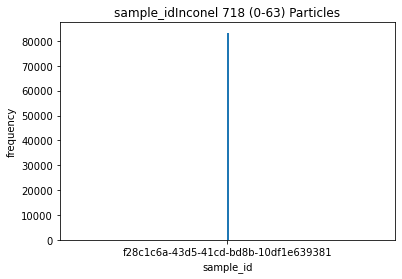

4
5


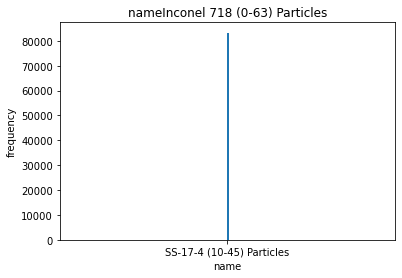

4
5


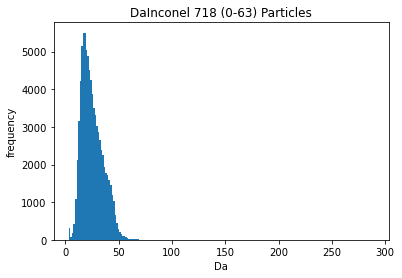

4
5


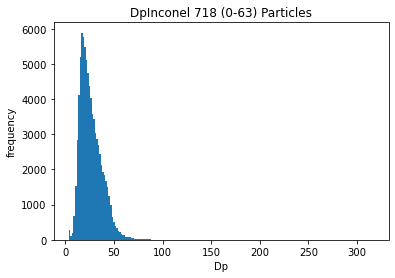

4
5


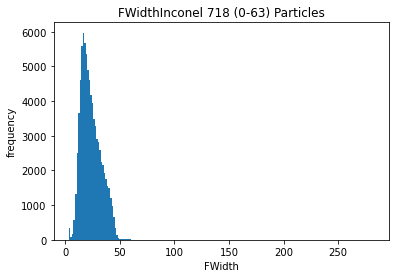

4
5


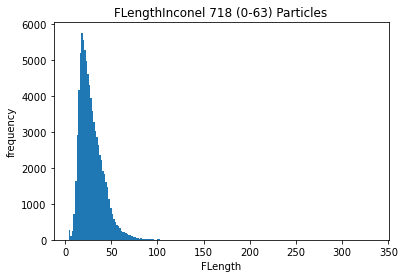

4
5


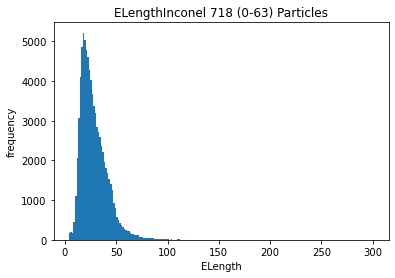

4
5


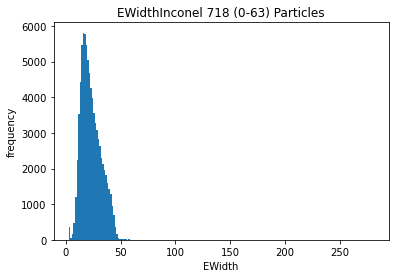

4
5


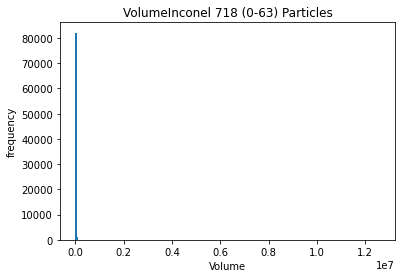

4
5


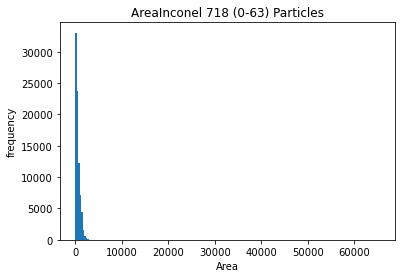

4
5


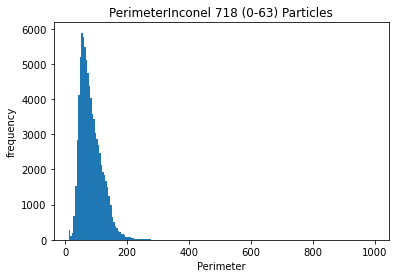

4
5


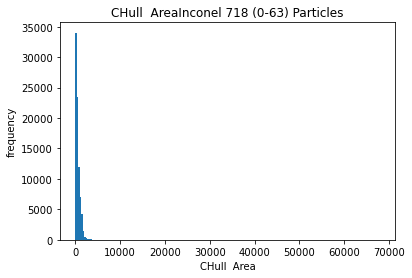

4
5


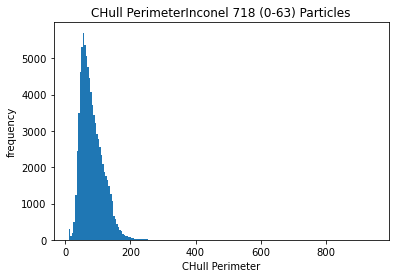

4
5


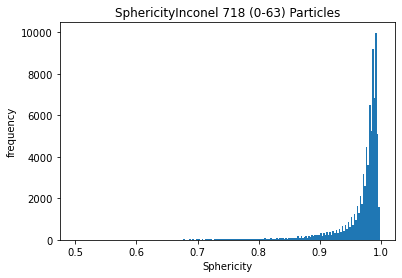

4
5


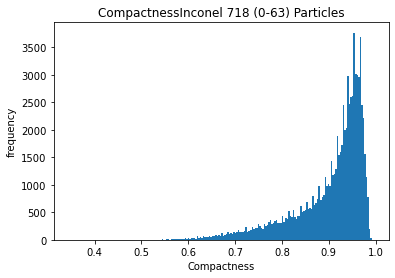

4
5


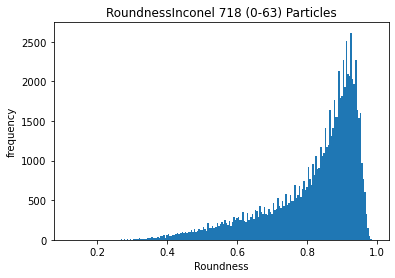

4
5


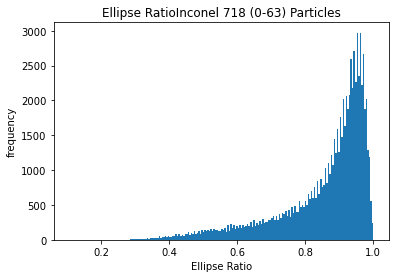

4
5


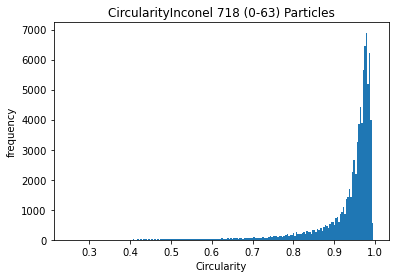

4
5


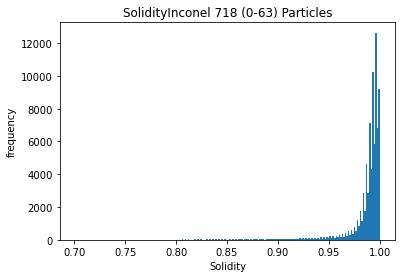

4
5


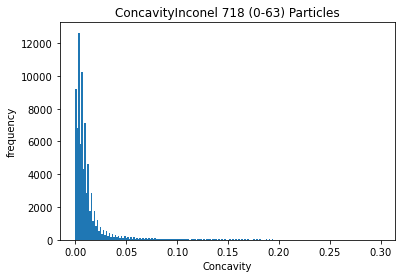

4
5


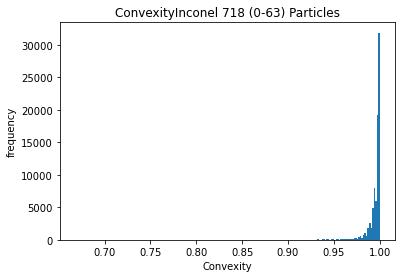

4
5


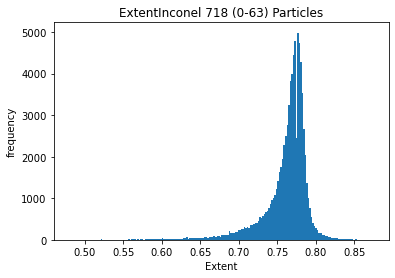

4
5


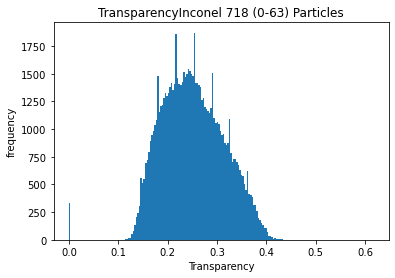

4
5


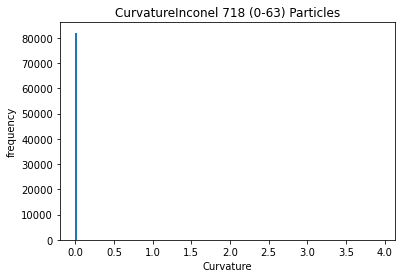

4
5


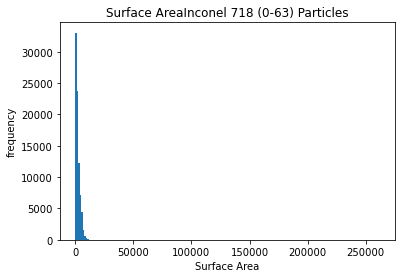

4
5


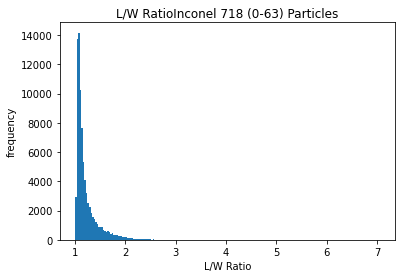

4
5


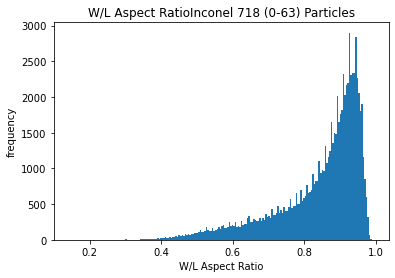

4
5


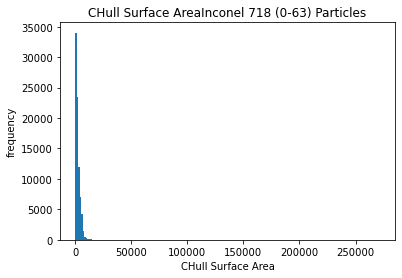

4
5


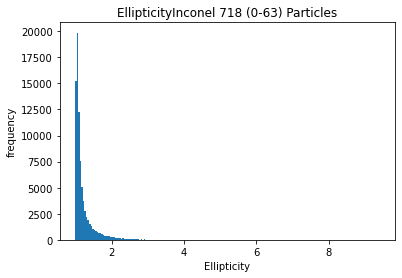

4
5


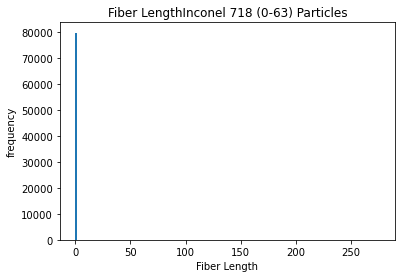

4
5


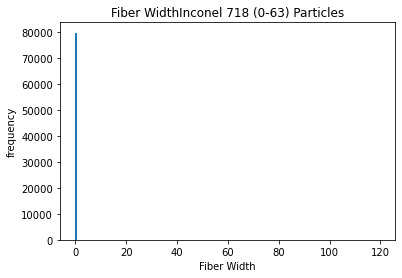

4
5


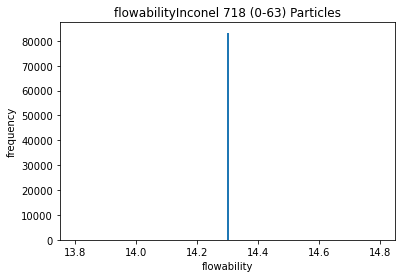

6
NAME:  SS-17-4 (10-45) Particles FLOW:                                    sample_id                       name  \
453270  f28c1c6a-43d5-41cd-bd8b-10df1e639381  SS-17-4 (10-45) Particles   
453271  f28c1c6a-43d5-41cd-bd8b-10df1e639381  SS-17-4 (10-45) Particles   
453272  f28c1c6a-43d5-41cd-bd8b-10df1e639381  SS-17-4 (10-45) Particles   
453273  f28c1c6a-43d5-41cd-bd8b-10df1e639381  SS-17-4 (10-45) Particles   
453274  f28c1c6a-43d5-41cd-bd8b-10df1e639381  SS-17-4 (10-45) Particles   
...                                      ...                        ...   
536524  f28c1c6a-43d5-41cd-bd8b-10df1e639381  SS-17-4 (10-45) Particles   
536525  f28c1c6a-43d5-41cd-bd8b-10df1e639381  SS-17-4 (10-45) Particles   
536526  f28c1c6a-43d5-41cd-bd8b-10df1e639381  SS-17-4 (10-45) Particles   
536527  f28c1c6a-43d5-41cd-bd8b-10df1e639381  SS-17-4 (10-45) Particles   
536528  f28c1c6a-43d5-41cd-bd8b-10df1e639381  SS-17-4 (10-45) Particles   

            Da      Dp  FWidth  FLength  ELength  EWidth  

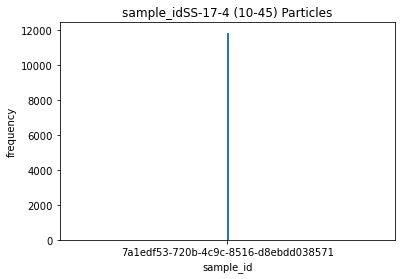

4
5


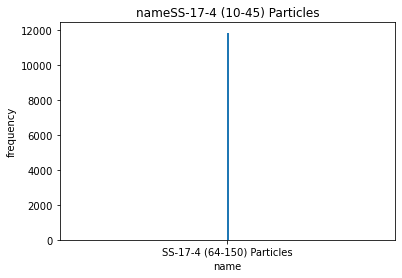

4
5


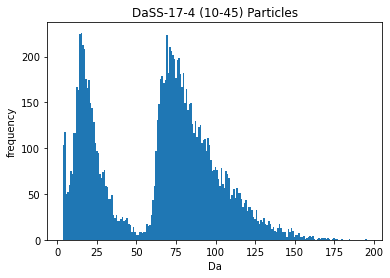

4
5


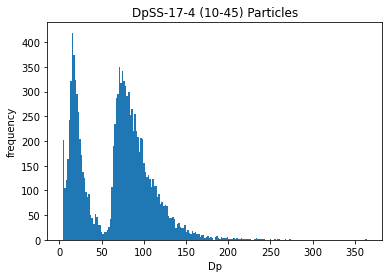

4
5


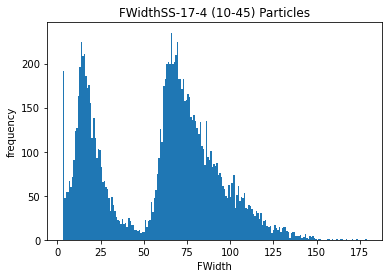

4
5


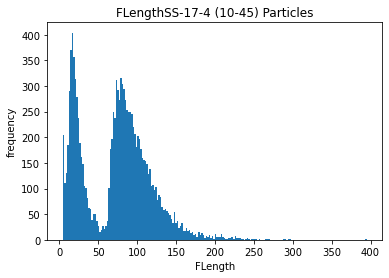

4
5


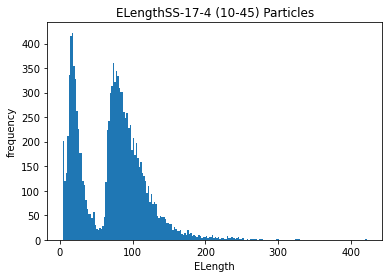

4
5


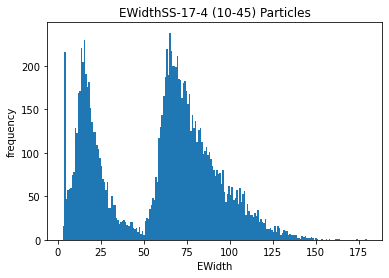

4
5


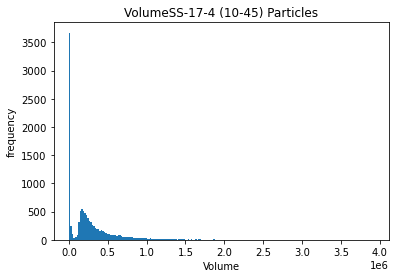

4
5


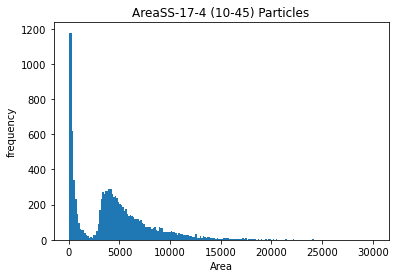

4
5


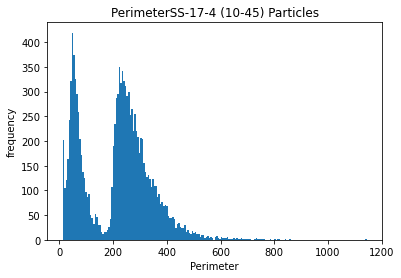

4
5


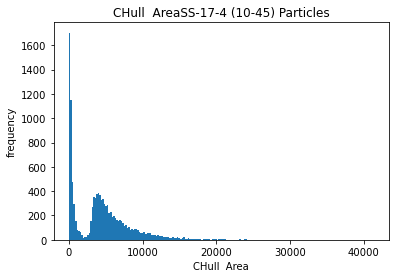

4
5


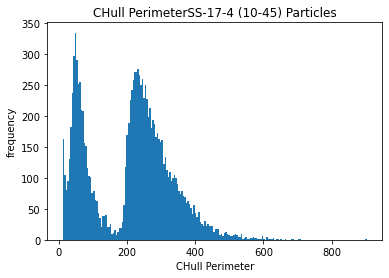

4
5


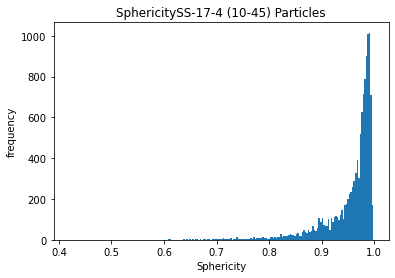

4
5


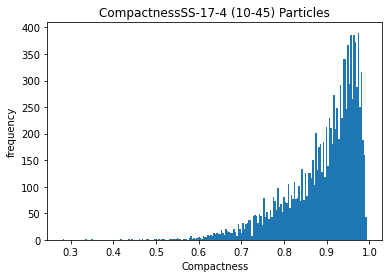

4
5


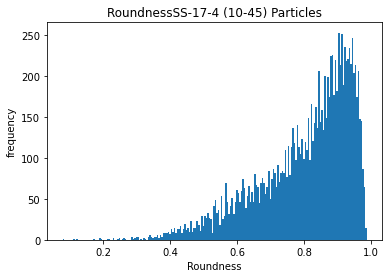

4
5


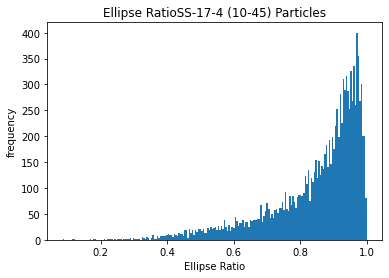

4
5


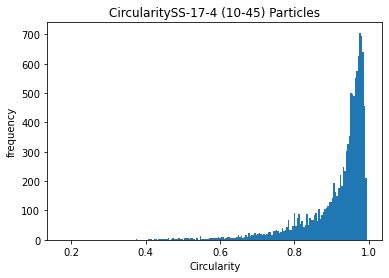

4
5


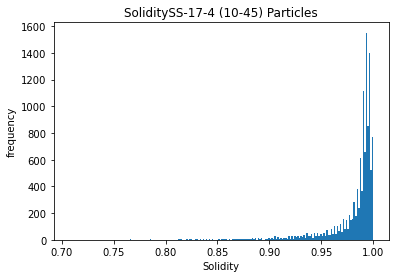

4
5


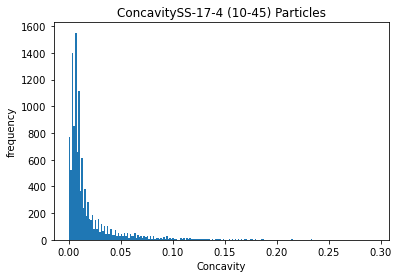

4
5


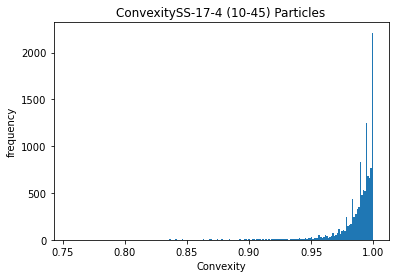

4
5


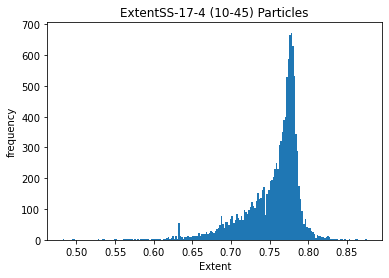

4
5


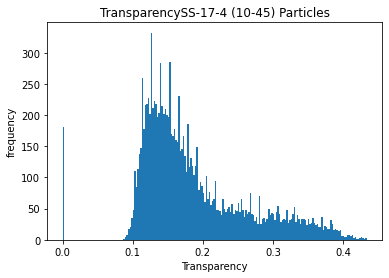

4
5


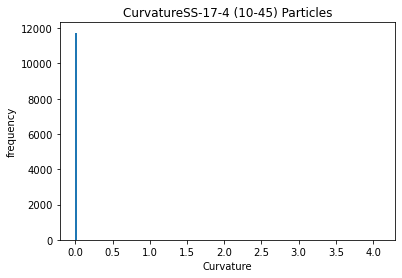

4
5


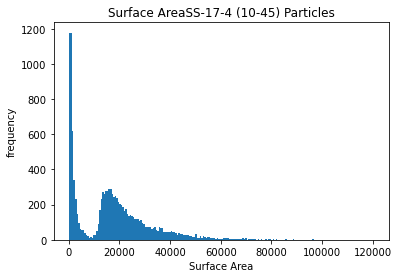

4
5


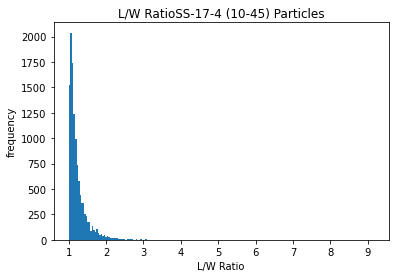

4
5


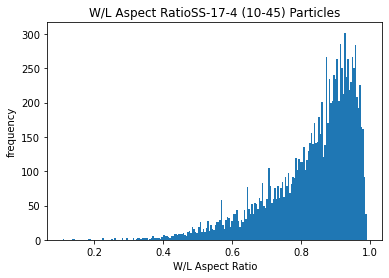

4
5


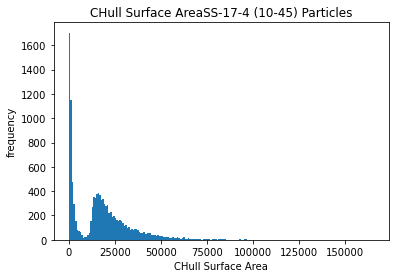

4
5


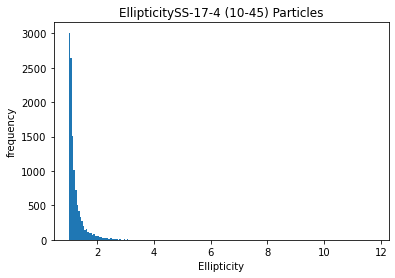

4
5


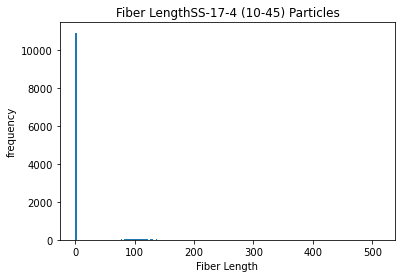

4
5


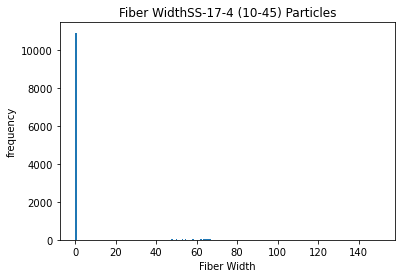

4
5


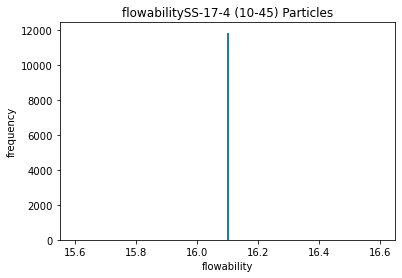

6
NAME:  SS-17-4 (64-150) Particles FLOW:                                    sample_id                        name  \
536529  7a1edf53-720b-4c9c-8516-d8ebdd038571  SS-17-4 (64-150) Particles   
536530  7a1edf53-720b-4c9c-8516-d8ebdd038571  SS-17-4 (64-150) Particles   
536531  7a1edf53-720b-4c9c-8516-d8ebdd038571  SS-17-4 (64-150) Particles   
536532  7a1edf53-720b-4c9c-8516-d8ebdd038571  SS-17-4 (64-150) Particles   
536533  7a1edf53-720b-4c9c-8516-d8ebdd038571  SS-17-4 (64-150) Particles   
...                                      ...                         ...   
548379  7a1edf53-720b-4c9c-8516-d8ebdd038571  SS-17-4 (64-150) Particles   
548380  7a1edf53-720b-4c9c-8516-d8ebdd038571  SS-17-4 (64-150) Particles   
548381  7a1edf53-720b-4c9c-8516-d8ebdd038571  SS-17-4 (64-150) Particles   
548382  7a1edf53-720b-4c9c-8516-d8ebdd038571  SS-17-4 (64-150) Particles   
548383  7a1edf53-720b-4c9c-8516-d8ebdd038571  SS-17-4 (64-150) Particles   

            Da      Dp  FWidth  FLength  ELen

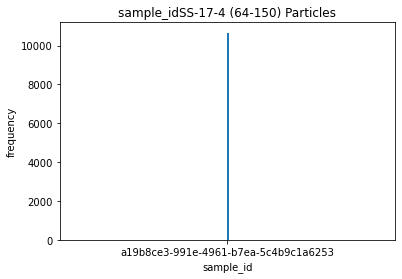

4
5


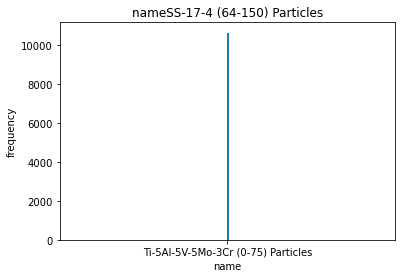

4
5


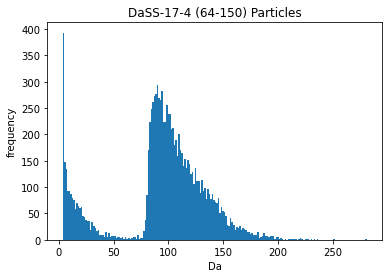

4
5


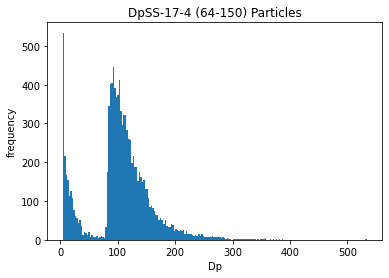

4
5


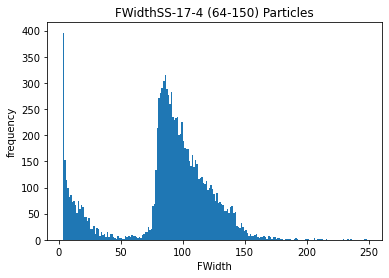

4
5


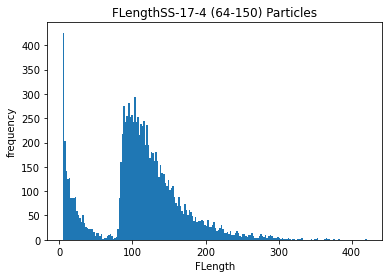

4
5


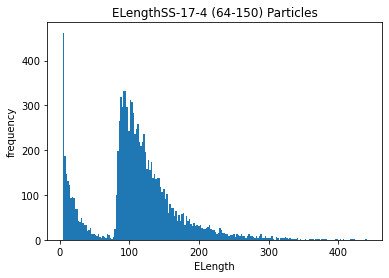

4
5


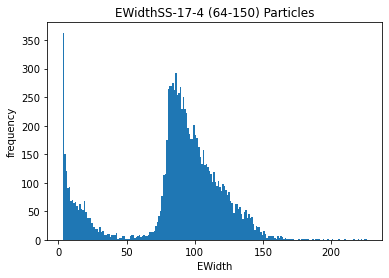

4
5


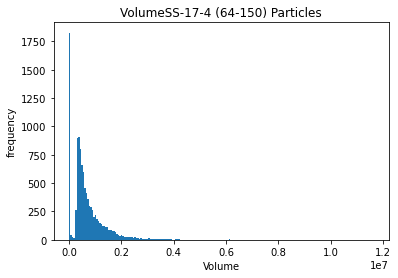

4
5


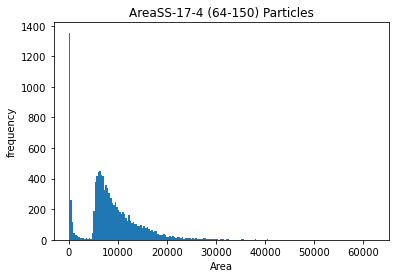

4
5


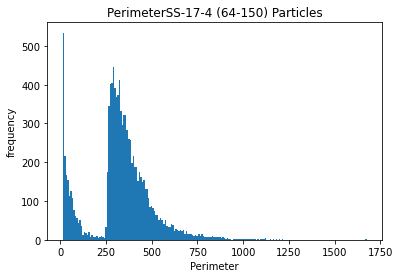

4
5


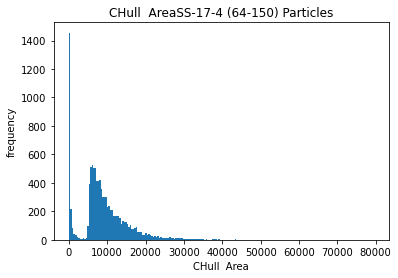

4
5


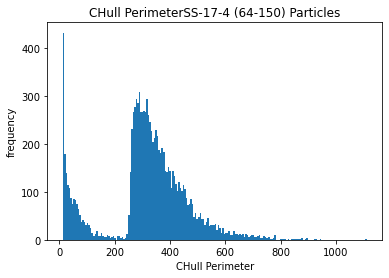

4
5


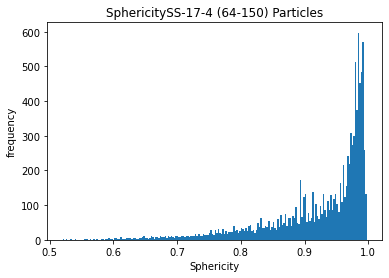

4
5


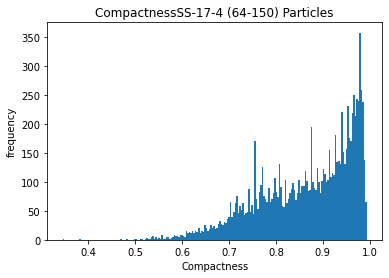

4
5


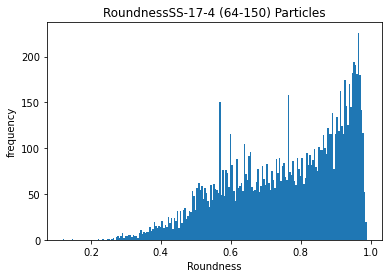

4
5


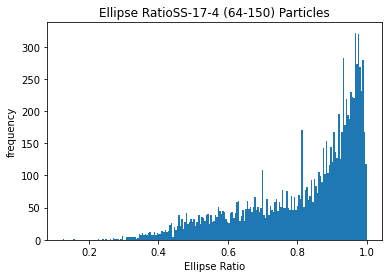

4
5


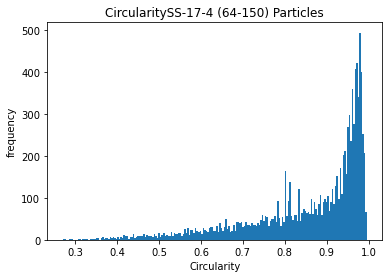

4
5


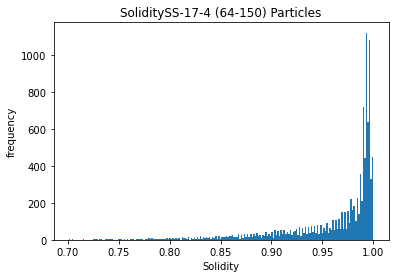

4
5


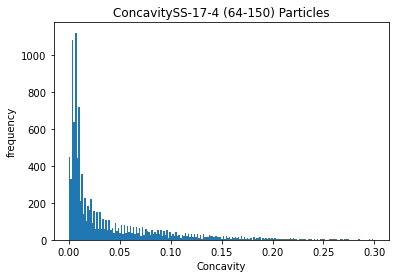

4
5


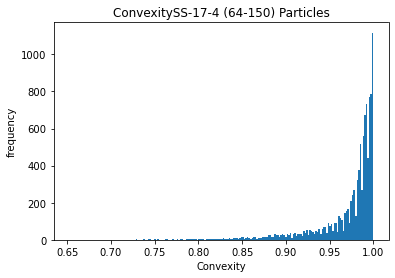

4
5


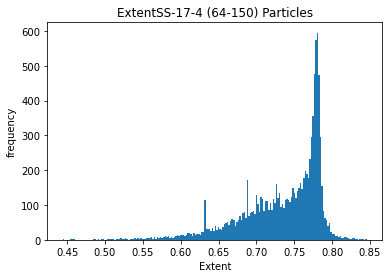

4
5


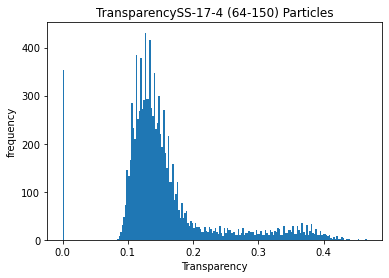

4
5


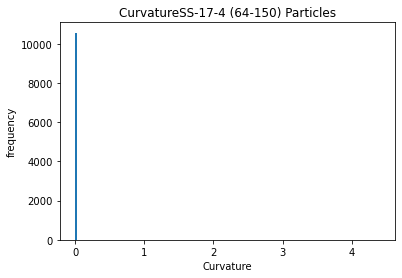

4
5


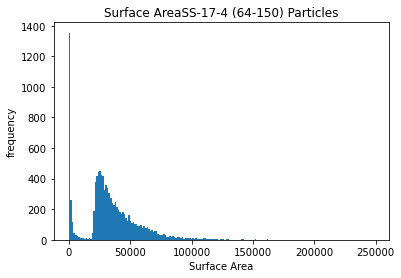

4
5


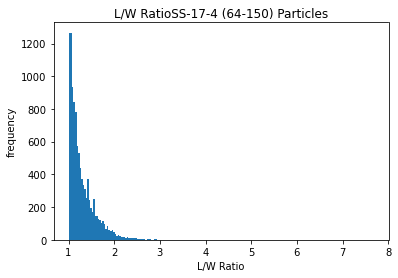

4
5


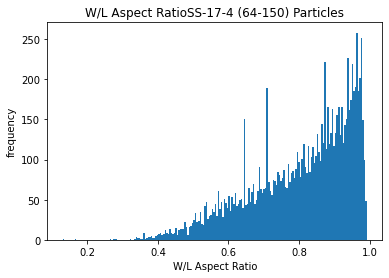

4
5


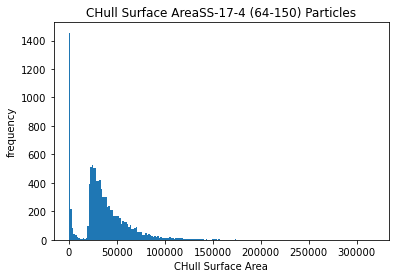

4
5


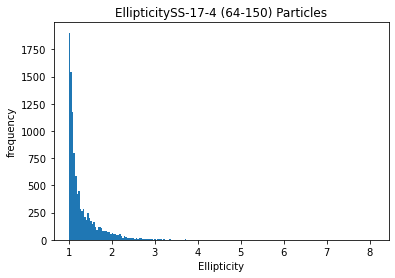

4
5


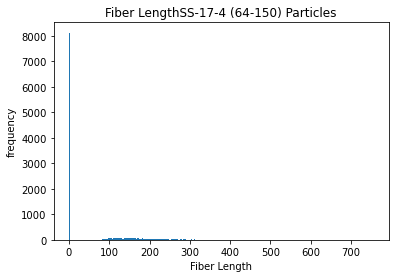

4
5


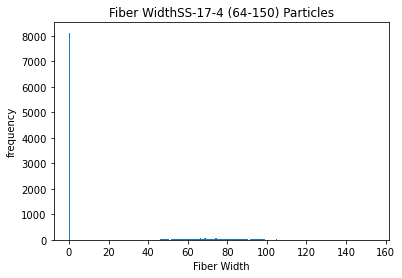

4
5


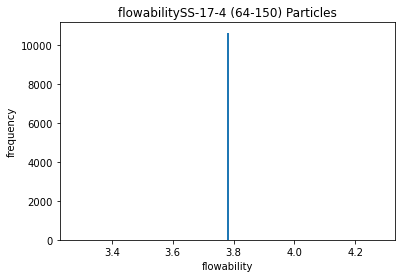

6
NAME:  Ti-5Al-5V-5Mo-3Cr (0-75) Particles FLOW:                                    sample_id  \
548384  a19b8ce3-991e-4961-b7ea-5c4b9c1a6253   
548385  a19b8ce3-991e-4961-b7ea-5c4b9c1a6253   
548386  a19b8ce3-991e-4961-b7ea-5c4b9c1a6253   
548387  a19b8ce3-991e-4961-b7ea-5c4b9c1a6253   
548388  a19b8ce3-991e-4961-b7ea-5c4b9c1a6253   
...                                      ...   
559036  a19b8ce3-991e-4961-b7ea-5c4b9c1a6253   
559037  a19b8ce3-991e-4961-b7ea-5c4b9c1a6253   
559038  a19b8ce3-991e-4961-b7ea-5c4b9c1a6253   
559039  a19b8ce3-991e-4961-b7ea-5c4b9c1a6253   
559040  a19b8ce3-991e-4961-b7ea-5c4b9c1a6253   

                                      name       Da       Dp   FWidth  \
548384  Ti-5Al-5V-5Mo-3Cr (0-75) Particles  126.633  128.768  124.422   
548385  Ti-5Al-5V-5Mo-3Cr (0-75) Particles  102.498  104.457  100.175   
548386  Ti-5Al-5V-5Mo-3Cr (0-75) Particles  101.767  106.182   98.055   
548387  Ti-5Al-5V-5Mo-3Cr (0-75) Particles   85.013   86.920   80.810   
548388  

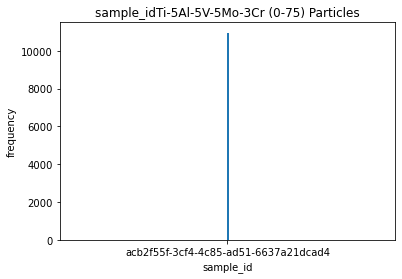

4
5


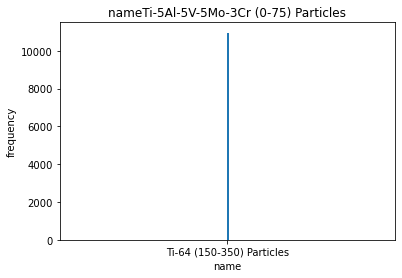

4
5


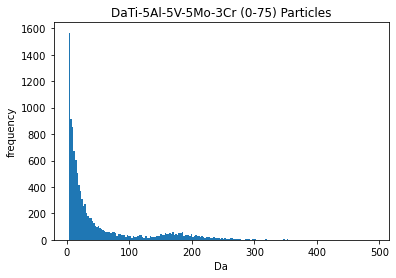

4
5


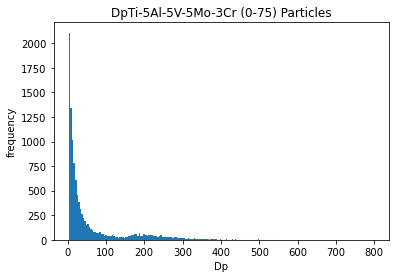

4
5


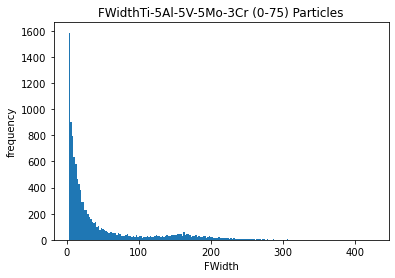

4
5


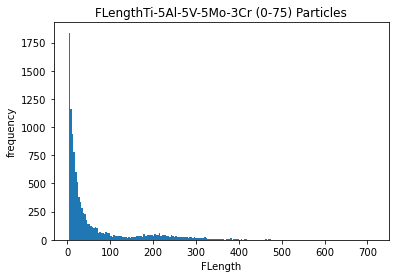

4
5


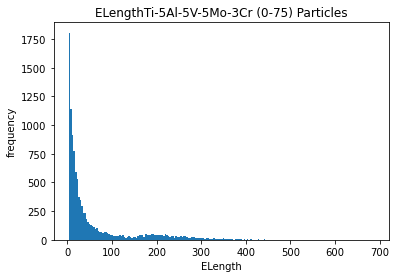

4
5


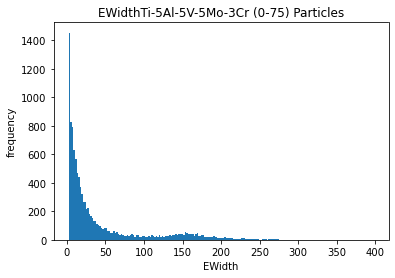

4
5


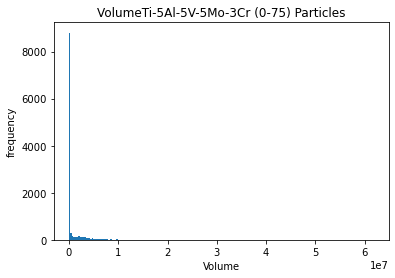

4
5


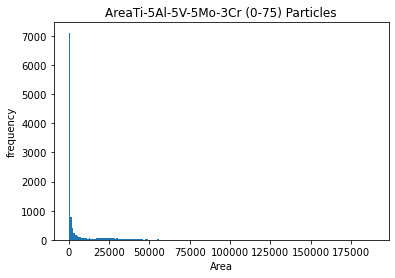

4
5


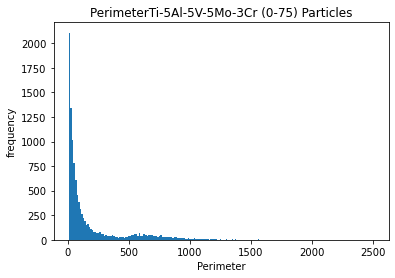

4
5


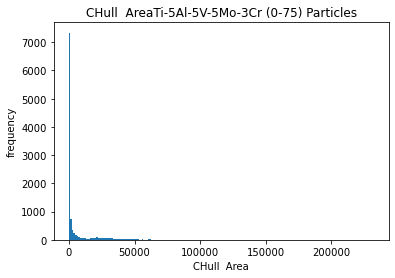

4
5


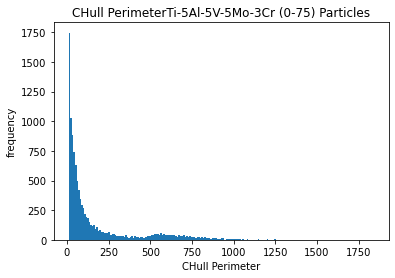

4
5


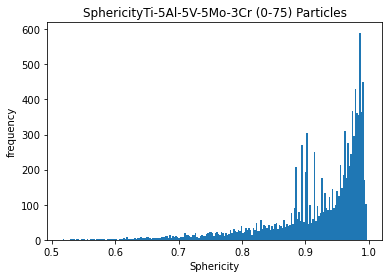

4
5


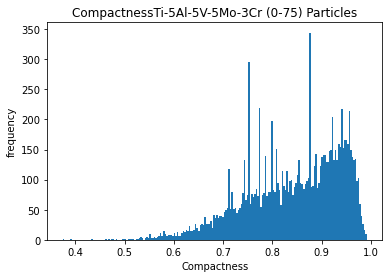

4
5


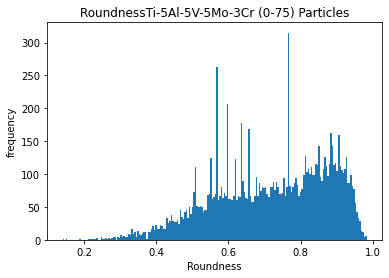

4
5


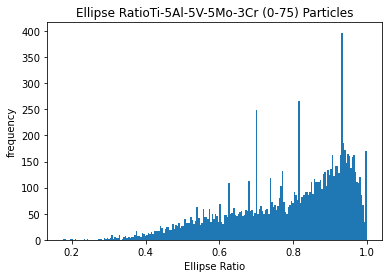

4
5


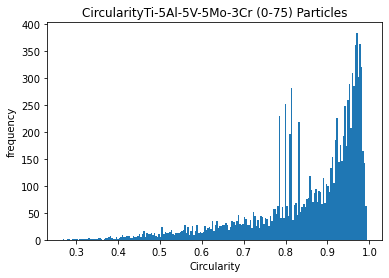

4
5


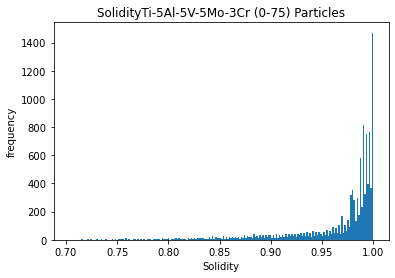

4
5


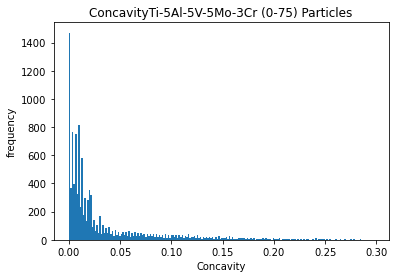

4
5


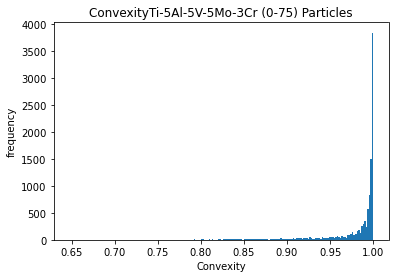

4
5


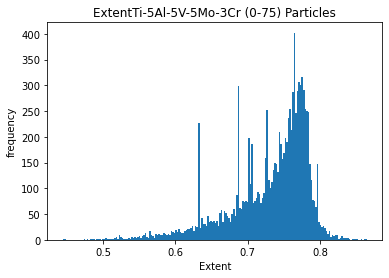

4
5


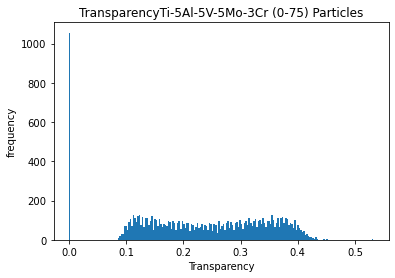

4
5


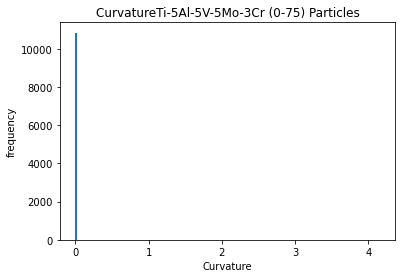

4
5


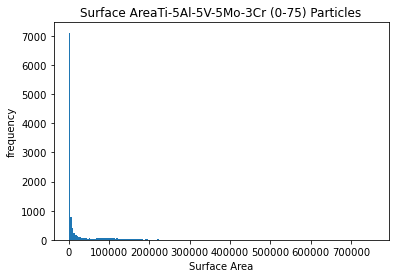

4
5


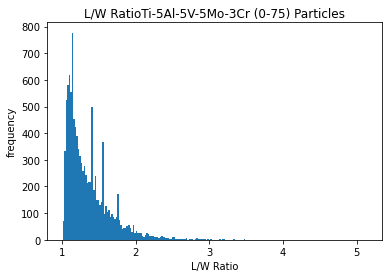

4
5


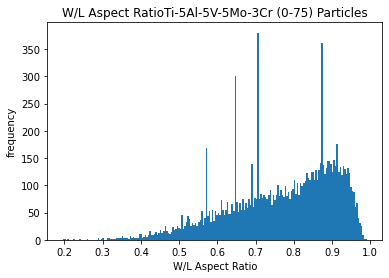

4
5


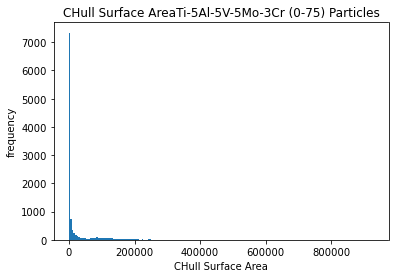

4
5


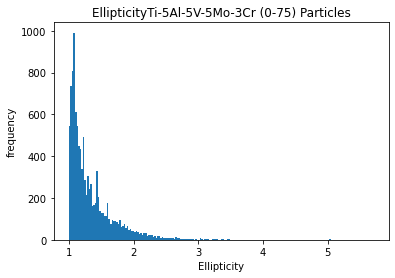

4
5


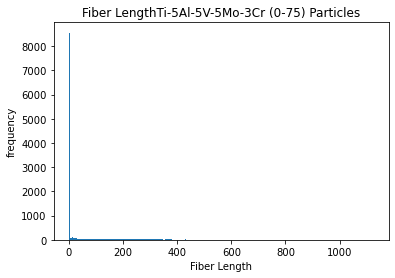

4
5


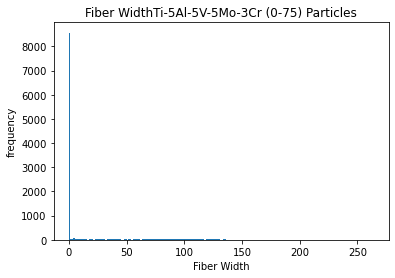

4
5


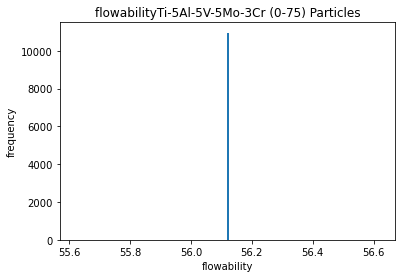

6
NAME:  Ti-64 (150-350) Particles FLOW:                                    sample_id                       name  \
559041  acb2f55f-3cf4-4c85-ad51-6637a21dcad4  Ti-64 (150-350) Particles   
559042  acb2f55f-3cf4-4c85-ad51-6637a21dcad4  Ti-64 (150-350) Particles   
559043  acb2f55f-3cf4-4c85-ad51-6637a21dcad4  Ti-64 (150-350) Particles   
559044  acb2f55f-3cf4-4c85-ad51-6637a21dcad4  Ti-64 (150-350) Particles   
559045  acb2f55f-3cf4-4c85-ad51-6637a21dcad4  Ti-64 (150-350) Particles   
...                                      ...                        ...   
569990  acb2f55f-3cf4-4c85-ad51-6637a21dcad4  Ti-64 (150-350) Particles   
569991  acb2f55f-3cf4-4c85-ad51-6637a21dcad4  Ti-64 (150-350) Particles   
569992  acb2f55f-3cf4-4c85-ad51-6637a21dcad4  Ti-64 (150-350) Particles   
569993  acb2f55f-3cf4-4c85-ad51-6637a21dcad4  Ti-64 (150-350) Particles   
569994  acb2f55f-3cf4-4c85-ad51-6637a21dcad4  Ti-64 (150-350) Particles   

             Da       Dp   FWidth  FLength  ELength   EWid

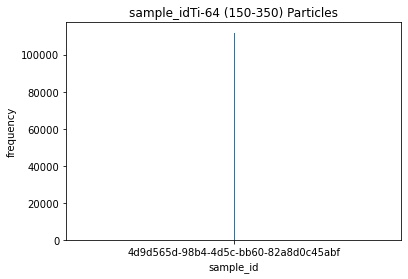

4
5


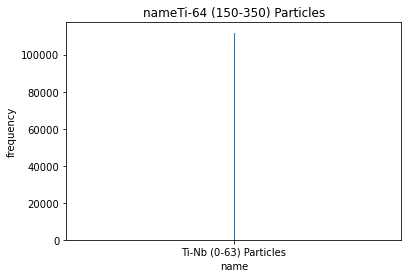

4
5


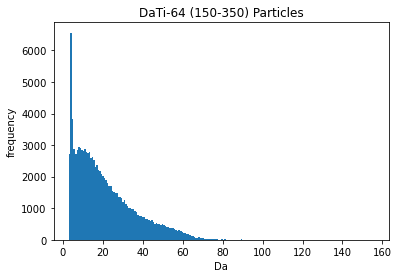

4
5


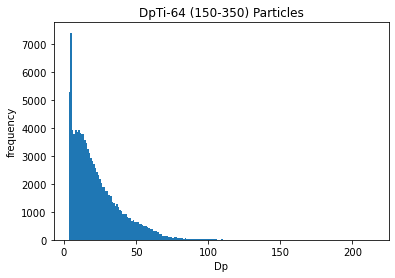

4
5


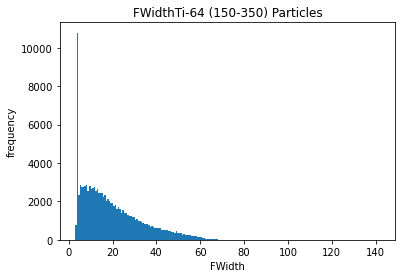

4
5


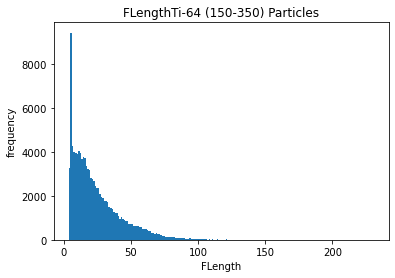

4
5


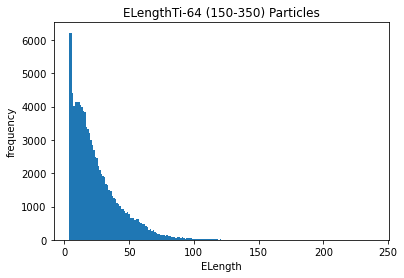

4
5


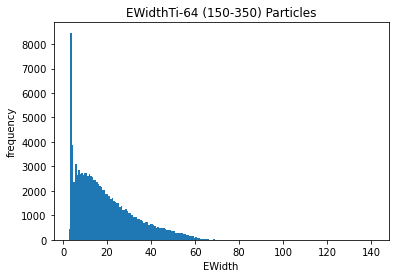

4
5


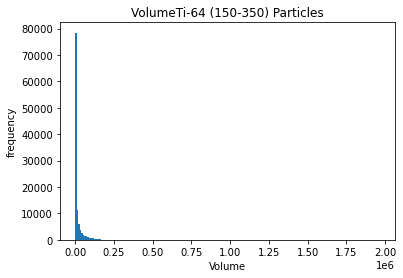

4
5


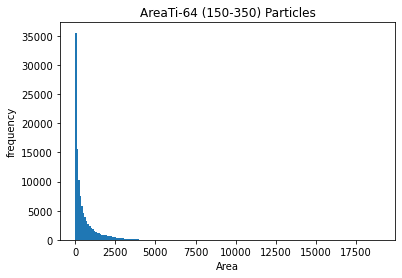

4
5


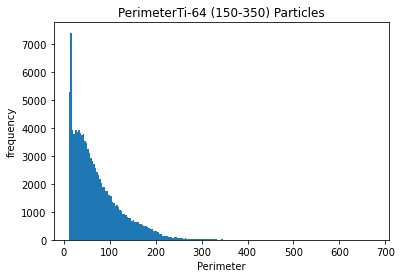

4
5


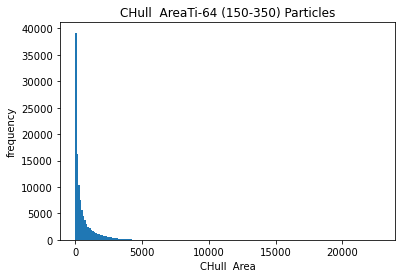

4
5


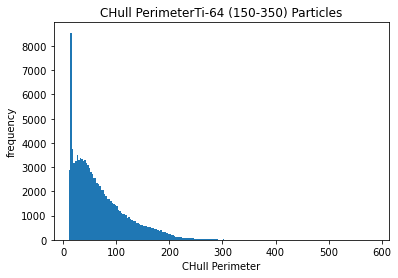

4
5


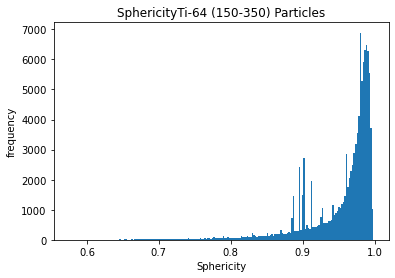

4
5


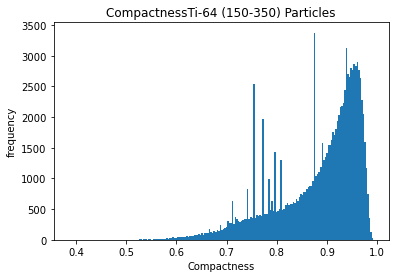

4
5


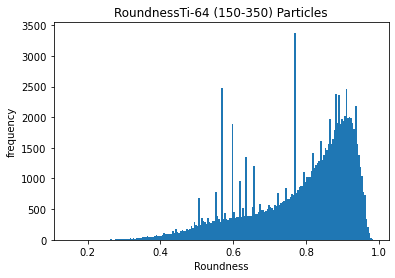

4
5


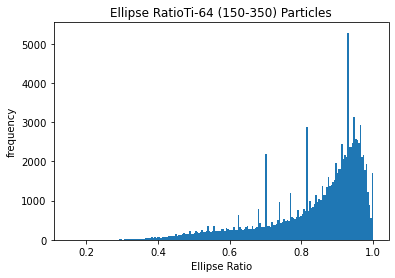

4
5


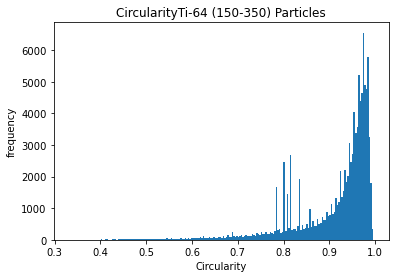

4
5


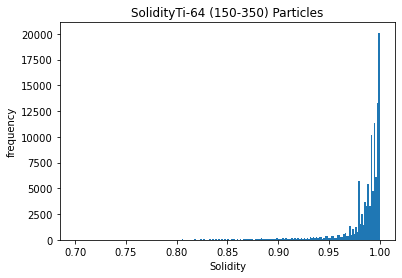

4
5


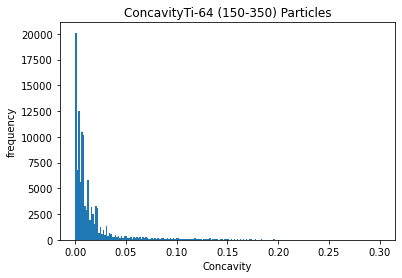

4
5


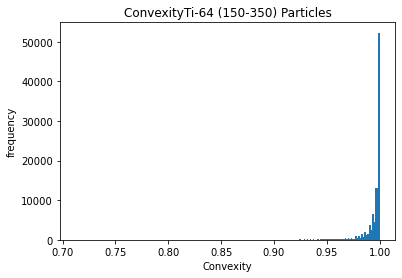

4
5


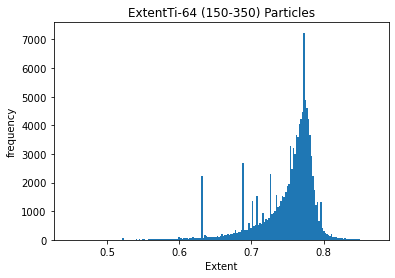

4
5


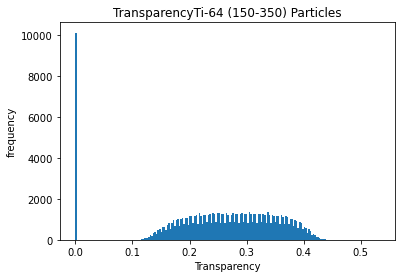

4
5


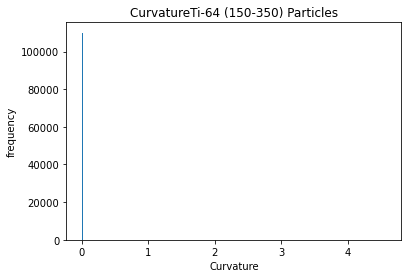

4
5


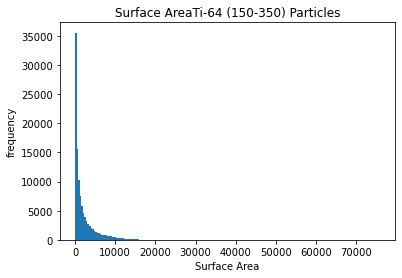

4
5


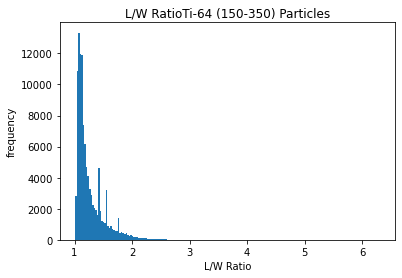

4
5


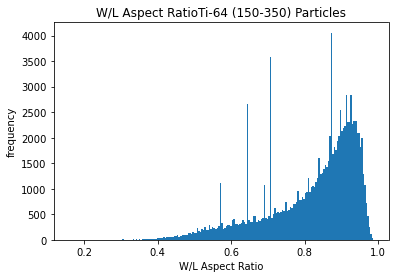

4
5


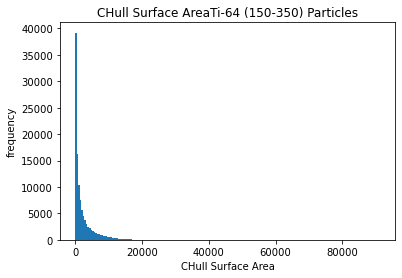

4
5


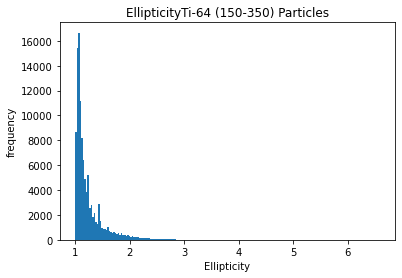

4
5


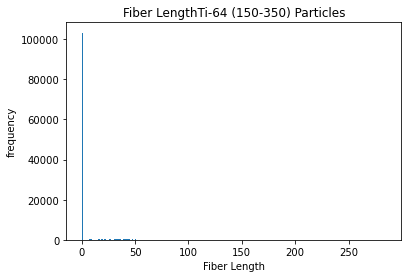

4
5


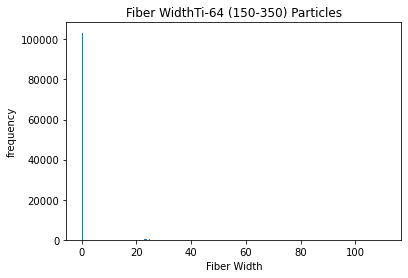

4
5


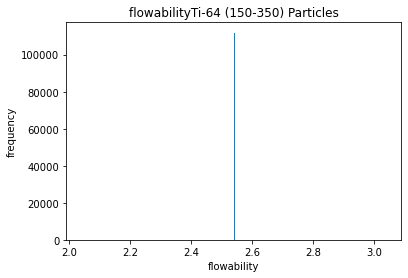

6
NAME:  Ti-Nb (0-63) Particles FLOW:                                    sample_id                    name      Da  \
569995  4d9d565d-98b4-4d5c-bb60-82a8d0c45abf  Ti-Nb (0-63) Particles   4.474   
569996  4d9d565d-98b4-4d5c-bb60-82a8d0c45abf  Ti-Nb (0-63) Particles  46.870   
569997  4d9d565d-98b4-4d5c-bb60-82a8d0c45abf  Ti-Nb (0-63) Particles  61.603   
569998  4d9d565d-98b4-4d5c-bb60-82a8d0c45abf  Ti-Nb (0-63) Particles  27.315   
569999  4d9d565d-98b4-4d5c-bb60-82a8d0c45abf  Ti-Nb (0-63) Particles  17.101   
...                                      ...                     ...     ...   
681823  4d9d565d-98b4-4d5c-bb60-82a8d0c45abf  Ti-Nb (0-63) Particles   9.890   
681824  4d9d565d-98b4-4d5c-bb60-82a8d0c45abf  Ti-Nb (0-63) Particles  20.864   
681825  4d9d565d-98b4-4d5c-bb60-82a8d0c45abf  Ti-Nb (0-63) Particles  14.941   
681826  4d9d565d-98b4-4d5c-bb60-82a8d0c45abf  Ti-Nb (0-63) Particles   7.095   
681827  4d9d565d-98b4-4d5c-bb60-82a8d0c45abf  Ti-Nb (0-63) Particles   5.907   

 

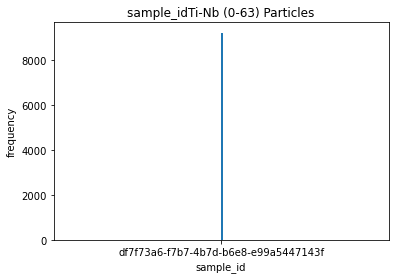

4
5


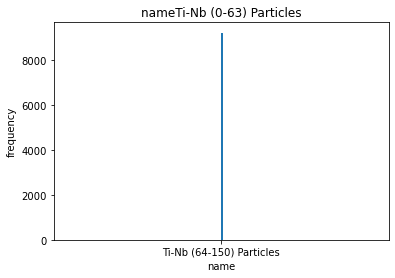

4
5


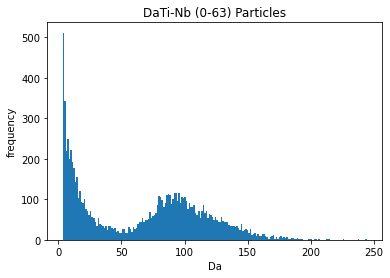

4
5


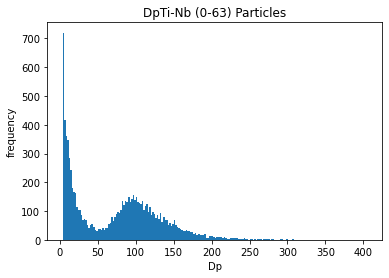

4
5


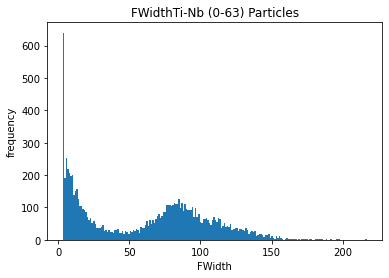

4
5


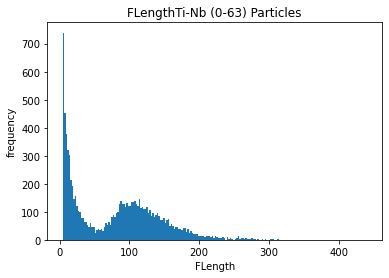

4
5


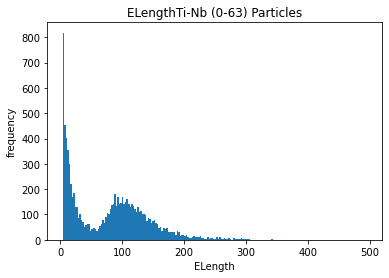

4
5


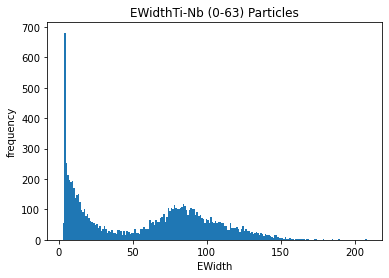

4
5


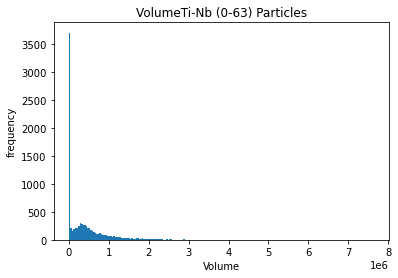

4
5


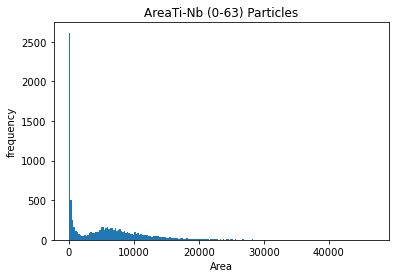

4
5


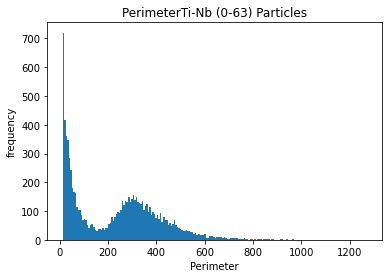

4
5


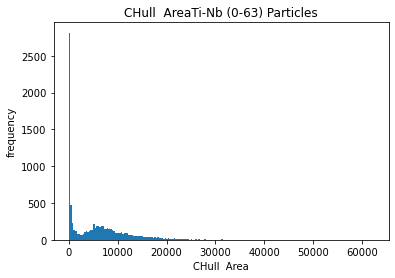

4
5


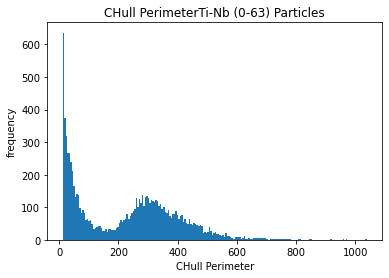

4
5


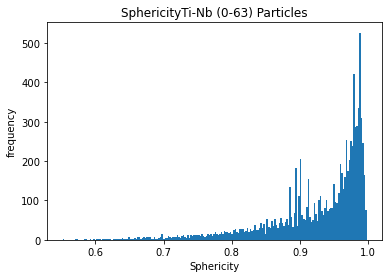

4
5


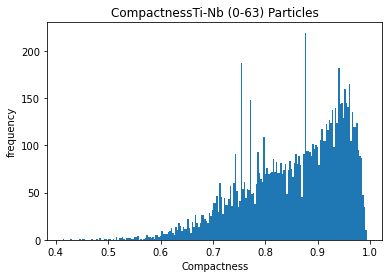

4
5


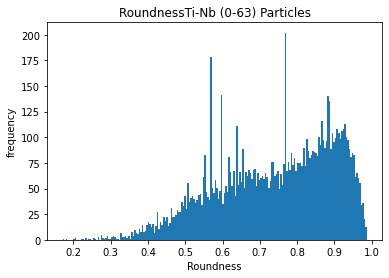

4
5


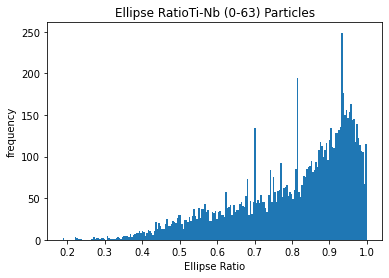

4
5


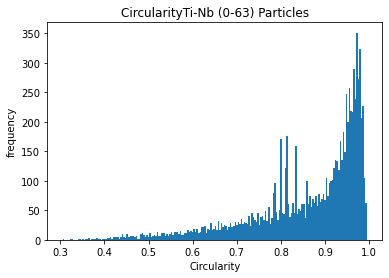

4
5


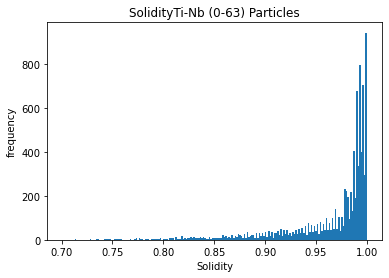

4
5


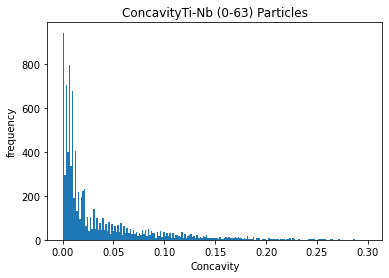

4
5


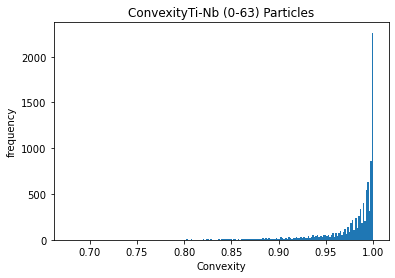

4
5


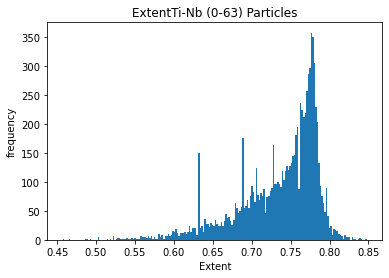

4
5


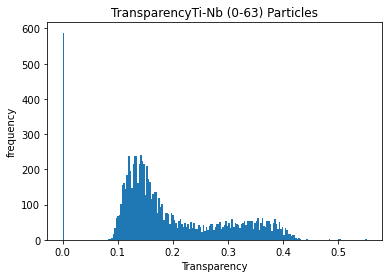

4
5


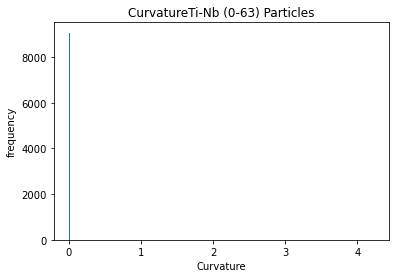

4
5


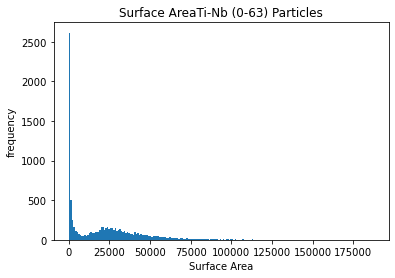

4
5


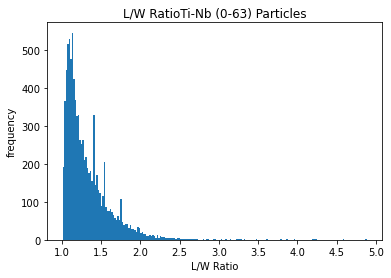

4
5


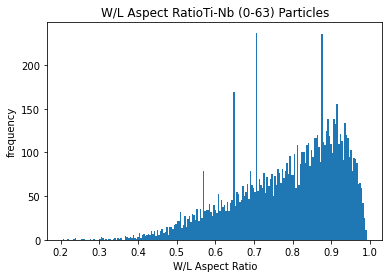

4
5


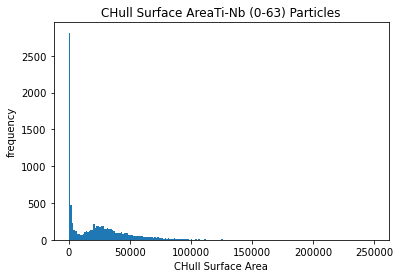

4
5


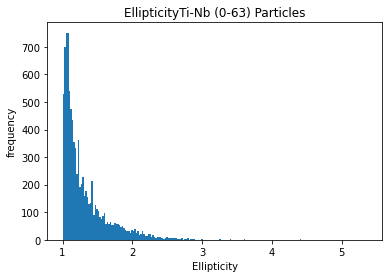

4
5


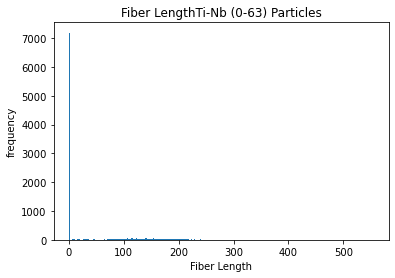

4
5


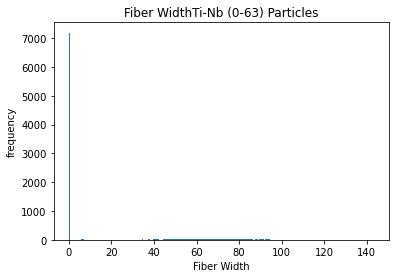

4
5


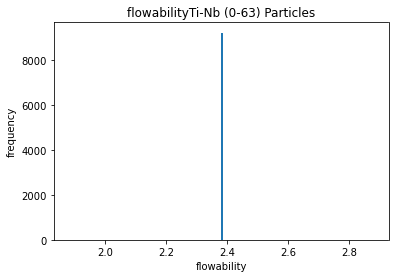

6
NAME:  Ti-Nb (64-150) Particles FLOW:                                    sample_id                      name  \
681828  df7f73a6-f7b7-4b7d-b6e8-e99a5447143f  Ti-Nb (64-150) Particles   
681829  df7f73a6-f7b7-4b7d-b6e8-e99a5447143f  Ti-Nb (64-150) Particles   
681830  df7f73a6-f7b7-4b7d-b6e8-e99a5447143f  Ti-Nb (64-150) Particles   
681831  df7f73a6-f7b7-4b7d-b6e8-e99a5447143f  Ti-Nb (64-150) Particles   
681832  df7f73a6-f7b7-4b7d-b6e8-e99a5447143f  Ti-Nb (64-150) Particles   
...                                      ...                       ...   
691035  df7f73a6-f7b7-4b7d-b6e8-e99a5447143f  Ti-Nb (64-150) Particles   
691036  df7f73a6-f7b7-4b7d-b6e8-e99a5447143f  Ti-Nb (64-150) Particles   
691037  df7f73a6-f7b7-4b7d-b6e8-e99a5447143f  Ti-Nb (64-150) Particles   
691038  df7f73a6-f7b7-4b7d-b6e8-e99a5447143f  Ti-Nb (64-150) Particles   
691039  df7f73a6-f7b7-4b7d-b6e8-e99a5447143f  Ti-Nb (64-150) Particles   

             Da       Dp   FWidth  FLength  ELength   EWidth       Volu

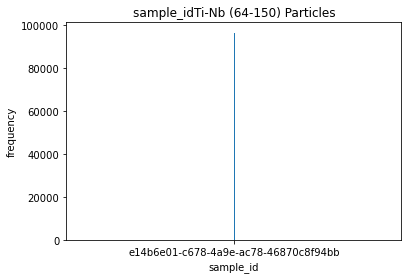

4
5


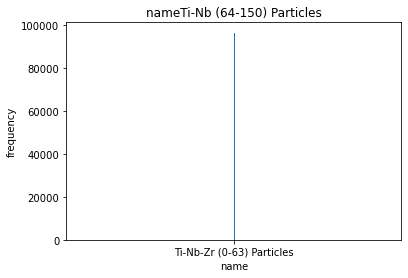

4
5


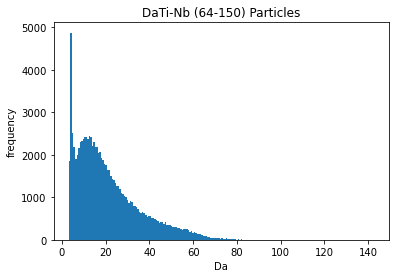

4
5


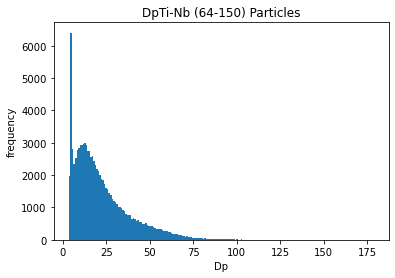

4
5


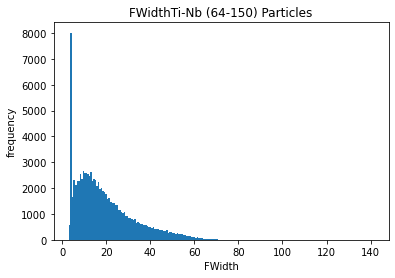

4
5


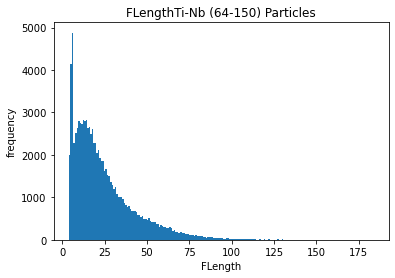

4
5


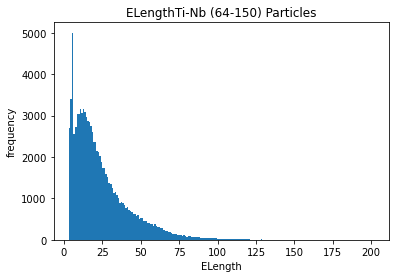

4
5


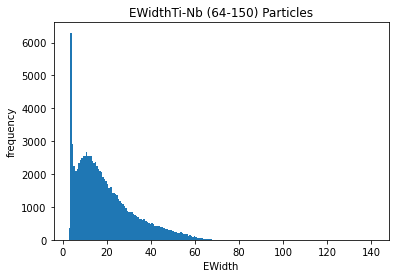

4
5


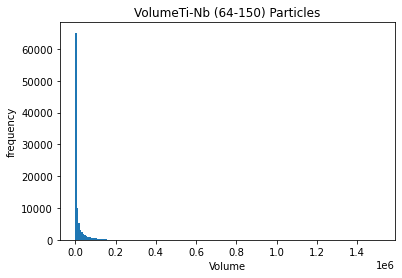

4
5


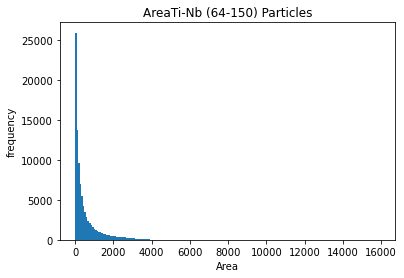

4
5


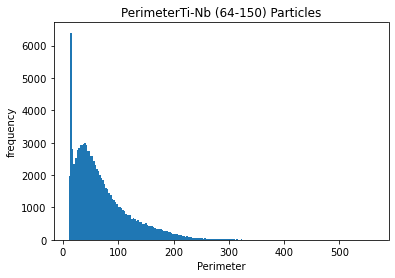

4
5


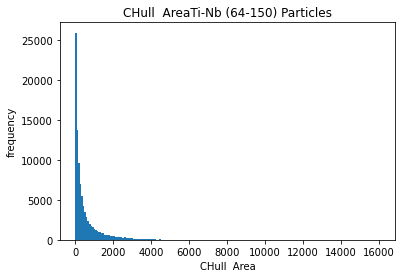

4
5


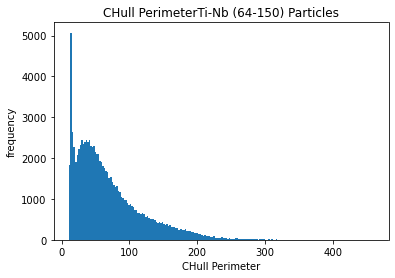

4
5


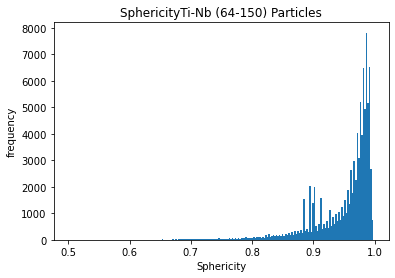

4
5


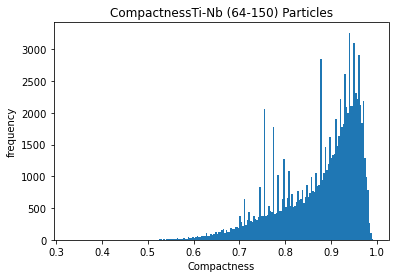

4
5


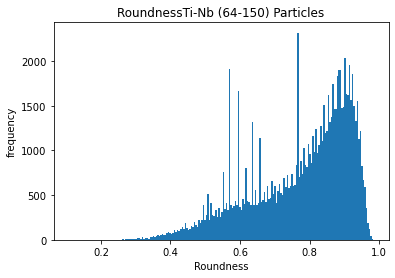

4
5


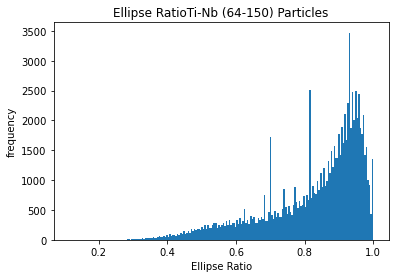

4
5


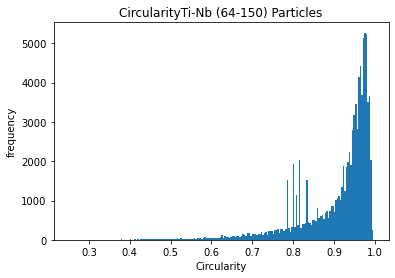

4
5


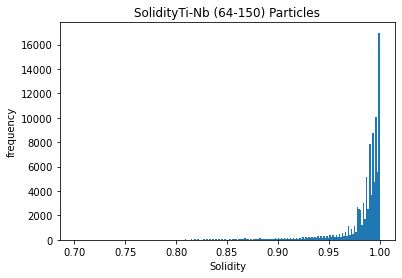

4
5


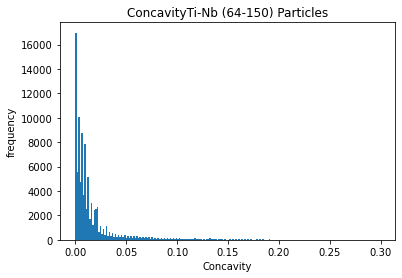

4
5


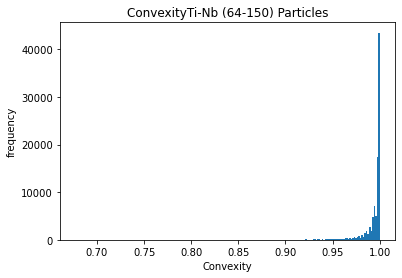

4
5


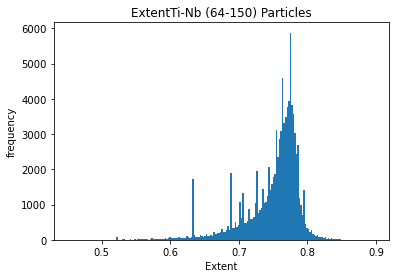

4
5


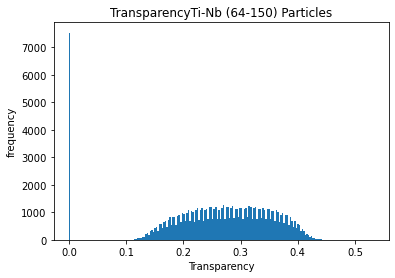

4
5


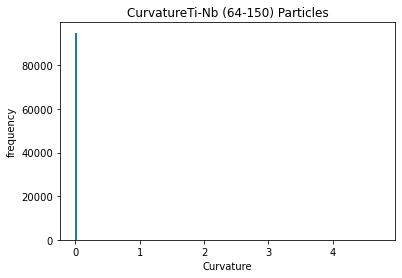

4
5


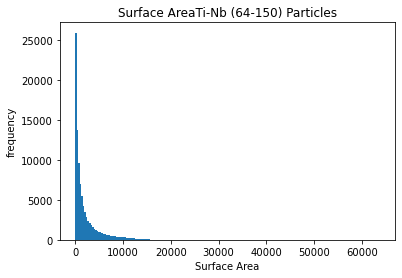

4
5


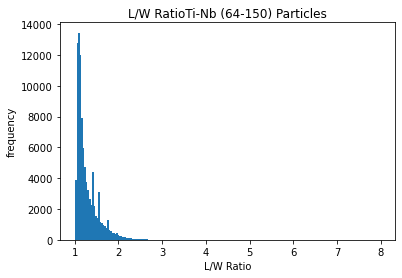

4
5


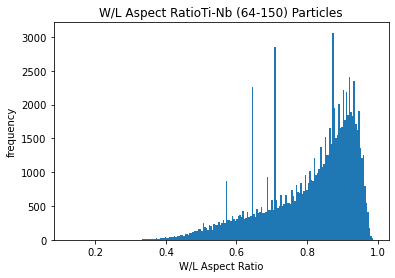

4
5


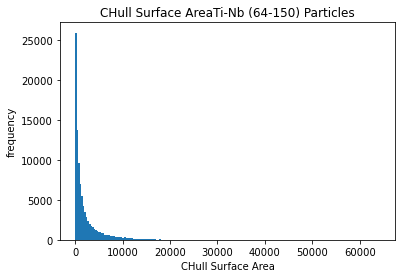

4
5


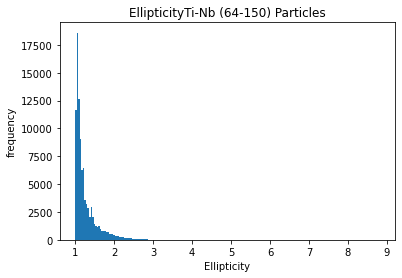

4
5


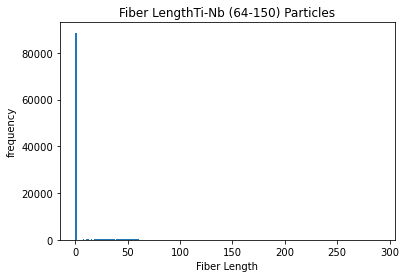

4
5


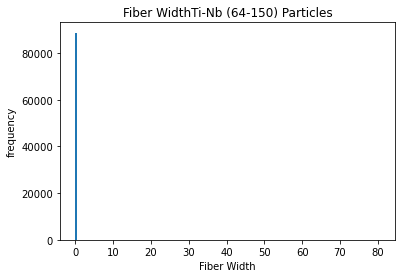

4
5


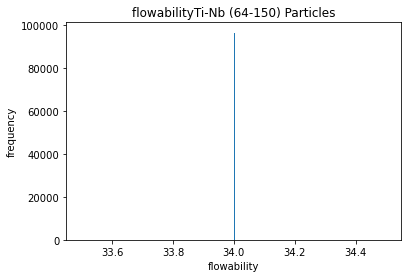

6
NAME:  Ti-Nb-Zr (0-63) Particles FLOW:                                    sample_id                       name  \
691040  e14b6e01-c678-4a9e-ac78-46870c8f94bb  Ti-Nb-Zr (0-63) Particles   
691041  e14b6e01-c678-4a9e-ac78-46870c8f94bb  Ti-Nb-Zr (0-63) Particles   
691042  e14b6e01-c678-4a9e-ac78-46870c8f94bb  Ti-Nb-Zr (0-63) Particles   
691043  e14b6e01-c678-4a9e-ac78-46870c8f94bb  Ti-Nb-Zr (0-63) Particles   
691044  e14b6e01-c678-4a9e-ac78-46870c8f94bb  Ti-Nb-Zr (0-63) Particles   
...                                      ...                        ...   
787520  e14b6e01-c678-4a9e-ac78-46870c8f94bb  Ti-Nb-Zr (0-63) Particles   
787521  e14b6e01-c678-4a9e-ac78-46870c8f94bb  Ti-Nb-Zr (0-63) Particles   
787522  e14b6e01-c678-4a9e-ac78-46870c8f94bb  Ti-Nb-Zr (0-63) Particles   
787523  e14b6e01-c678-4a9e-ac78-46870c8f94bb  Ti-Nb-Zr (0-63) Particles   
787524  e14b6e01-c678-4a9e-ac78-46870c8f94bb  Ti-Nb-Zr (0-63) Particles   

            Da      Dp  FWidth  FLength  ELength  EWidth  

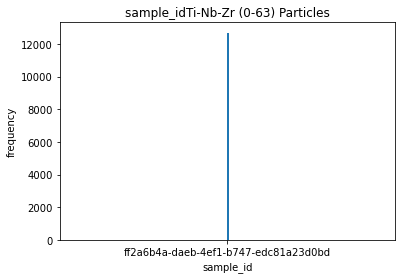

4
5


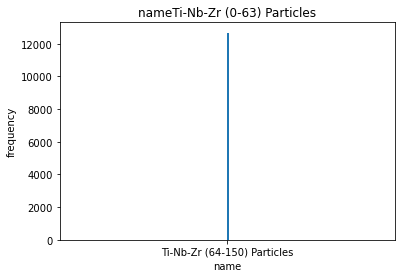

4
5


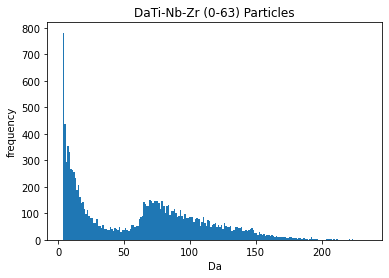

4
5


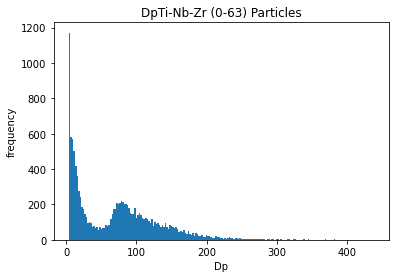

4
5


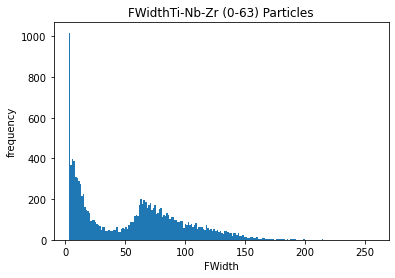

4
5


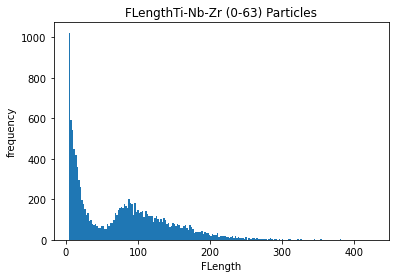

4
5


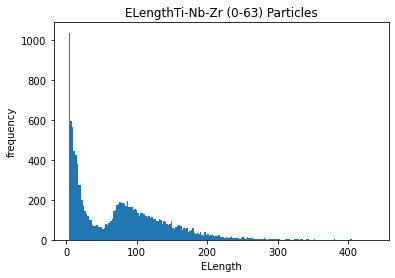

4
5


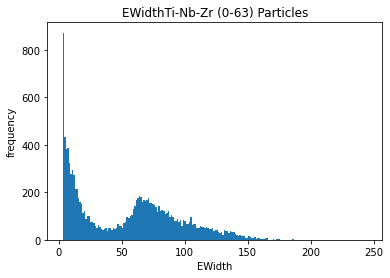

4
5


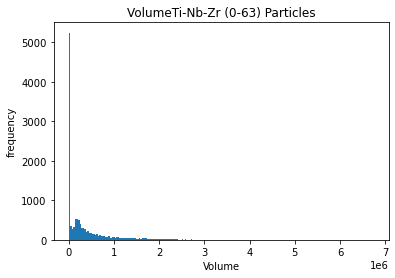

4
5


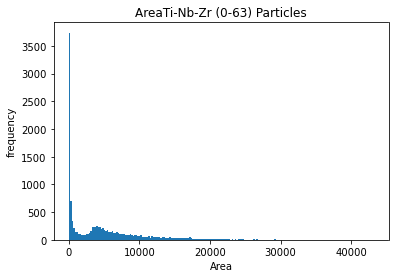

4
5


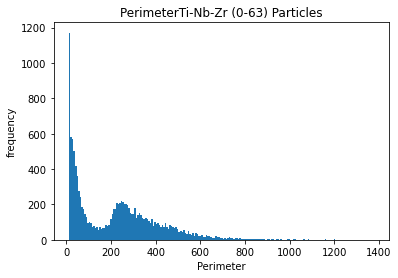

4
5


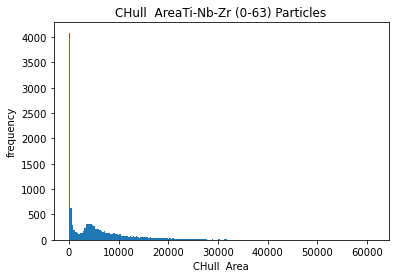

4
5


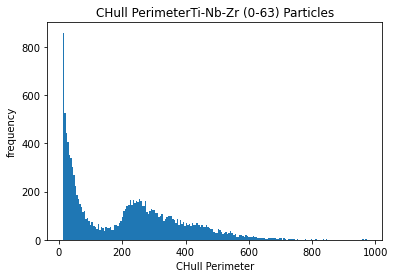

4
5


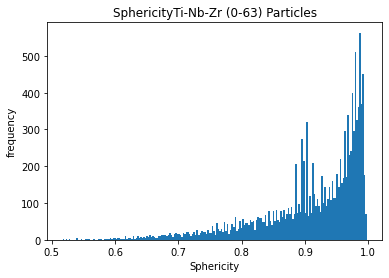

4
5


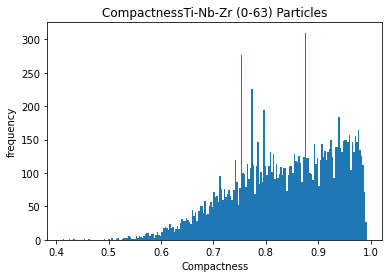

4
5


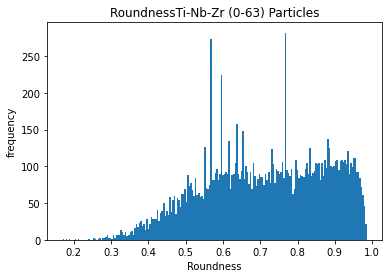

4
5


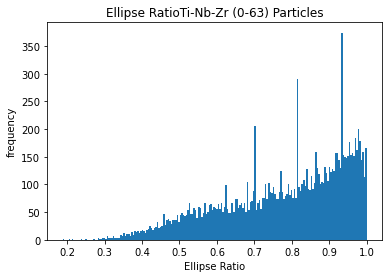

4
5


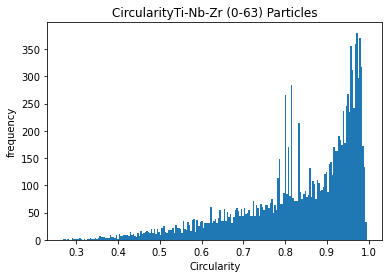

4
5


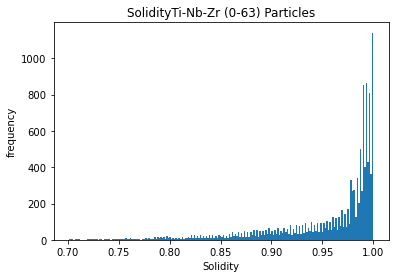

4
5


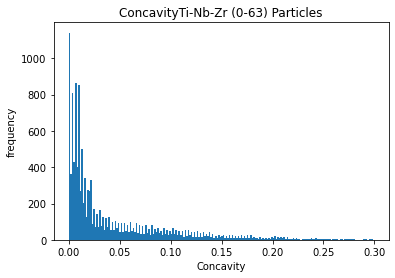

4
5


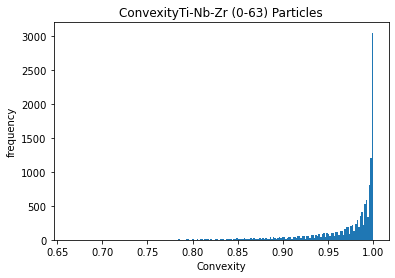

4
5


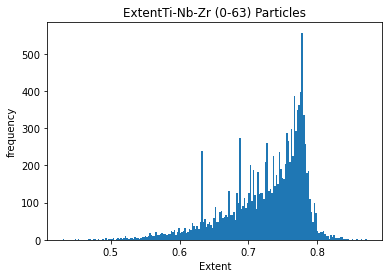

4
5


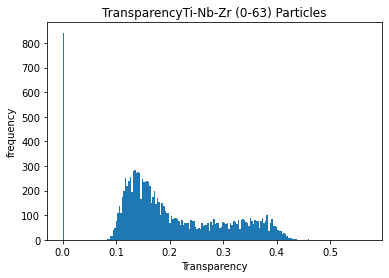

4
5


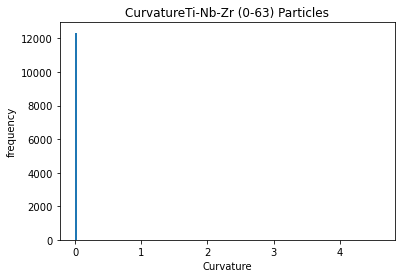

4
5


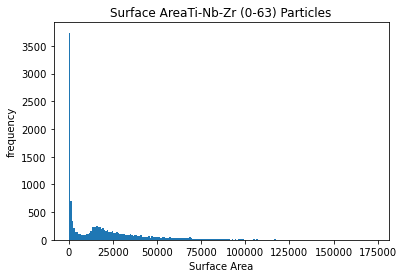

4
5


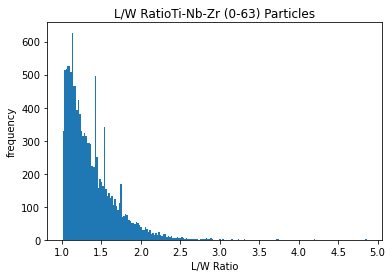

4
5


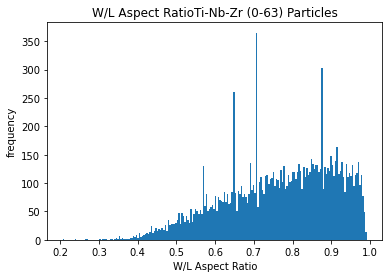

4
5


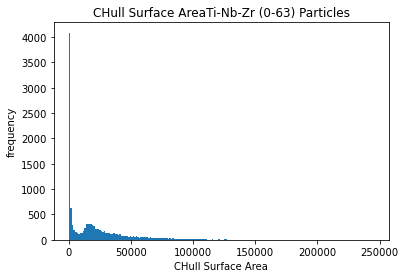

4
5


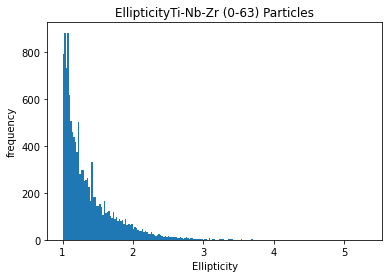

4
5


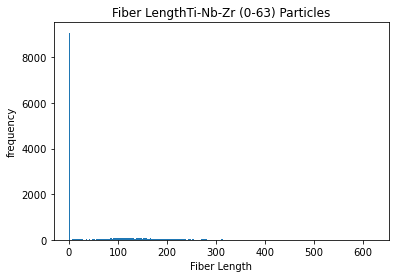

4
5


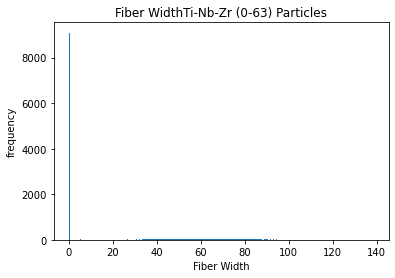

4
5


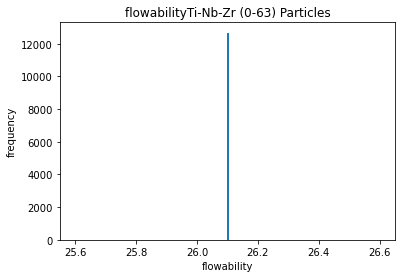

6
NAME:  Ti-Nb-Zr (64-150) Particles FLOW:                                    sample_id                         name  \
787525  ff2a6b4a-daeb-4ef1-b747-edc81a23d0bd  Ti-Nb-Zr (64-150) Particles   
787526  ff2a6b4a-daeb-4ef1-b747-edc81a23d0bd  Ti-Nb-Zr (64-150) Particles   
787527  ff2a6b4a-daeb-4ef1-b747-edc81a23d0bd  Ti-Nb-Zr (64-150) Particles   
787528  ff2a6b4a-daeb-4ef1-b747-edc81a23d0bd  Ti-Nb-Zr (64-150) Particles   
787529  ff2a6b4a-daeb-4ef1-b747-edc81a23d0bd  Ti-Nb-Zr (64-150) Particles   
...                                      ...                          ...   
800198  ff2a6b4a-daeb-4ef1-b747-edc81a23d0bd  Ti-Nb-Zr (64-150) Particles   
800199  ff2a6b4a-daeb-4ef1-b747-edc81a23d0bd  Ti-Nb-Zr (64-150) Particles   
800200  ff2a6b4a-daeb-4ef1-b747-edc81a23d0bd  Ti-Nb-Zr (64-150) Particles   
800201  ff2a6b4a-daeb-4ef1-b747-edc81a23d0bd  Ti-Nb-Zr (64-150) Particles   
800202  ff2a6b4a-daeb-4ef1-b747-edc81a23d0bd  Ti-Nb-Zr (64-150) Particles   

             Da       Dp   FWidt

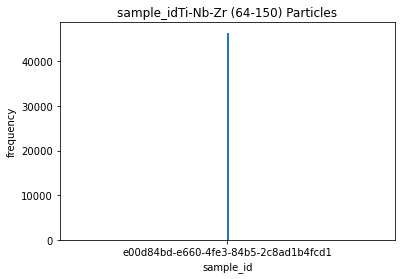

4
5


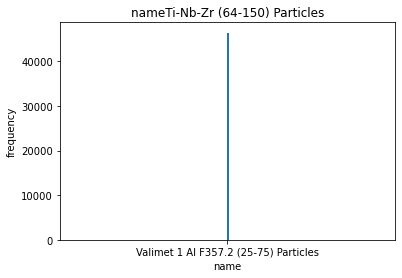

4
5


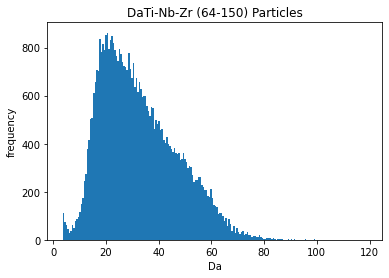

4
5


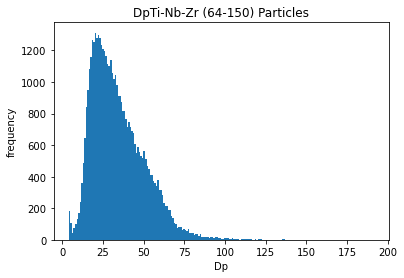

4
5


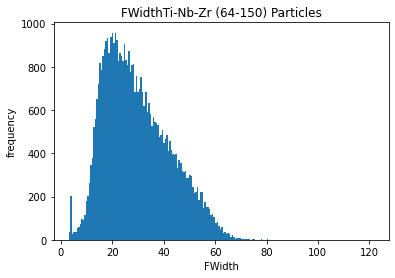

4
5


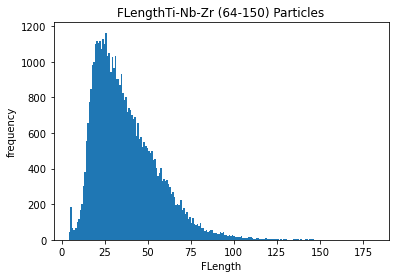

4
5


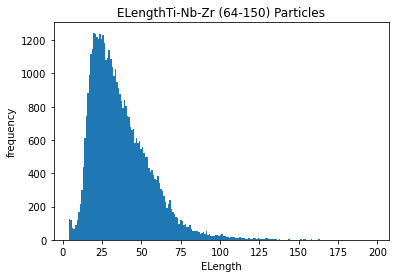

4
5


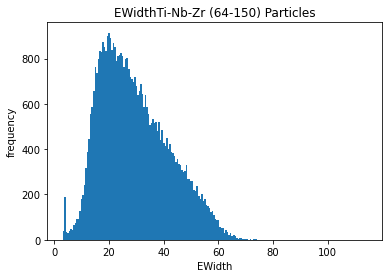

4
5


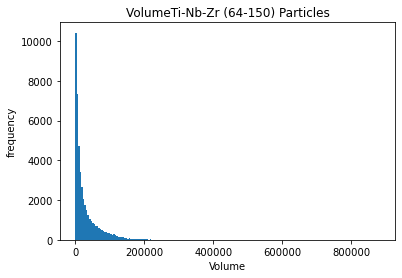

4
5


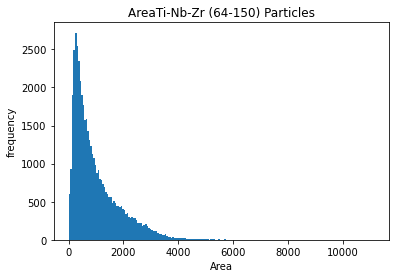

4
5


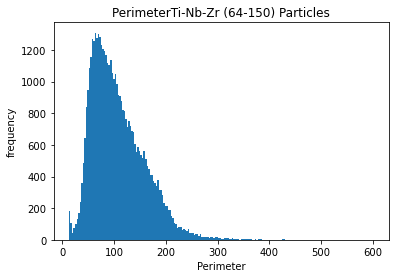

4
5


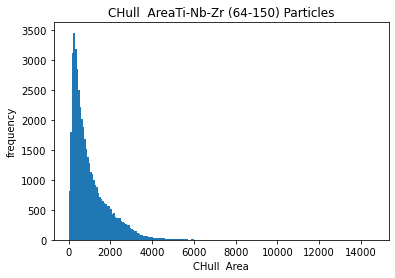

4
5


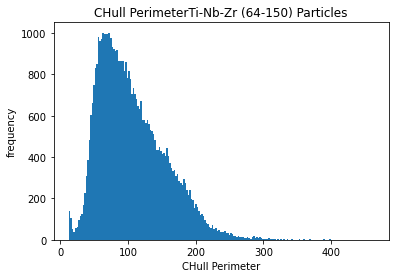

4
5


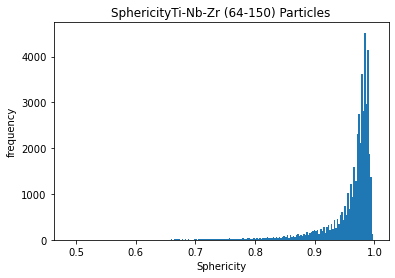

4
5


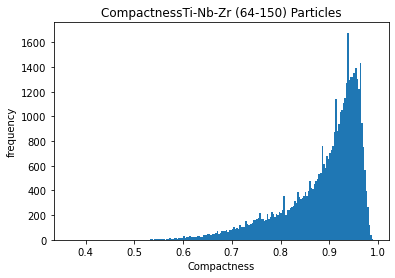

4
5


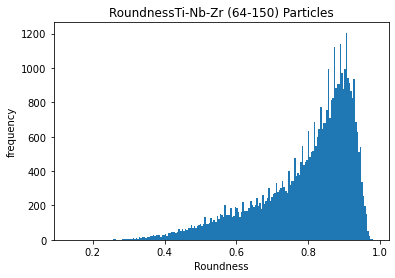

4
5


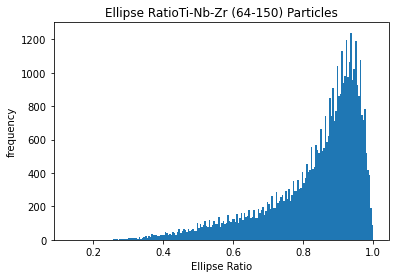

4
5


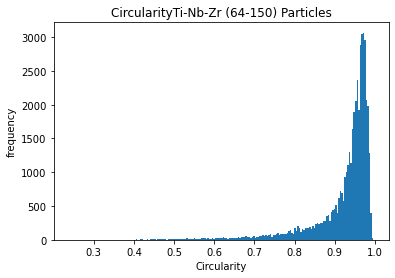

4
5


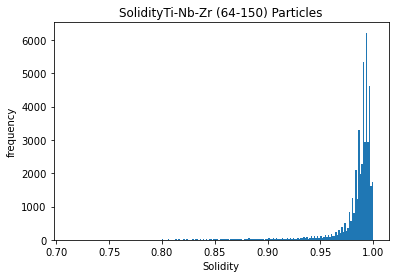

4
5


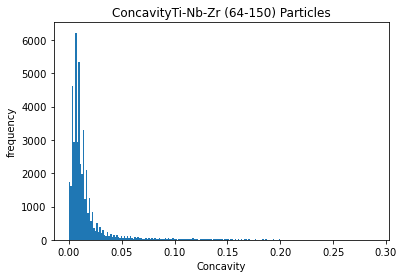

4
5


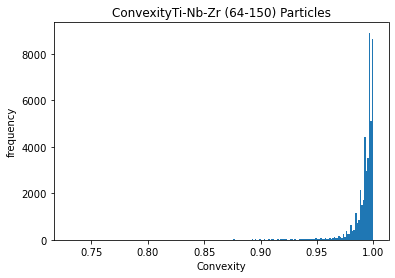

4
5


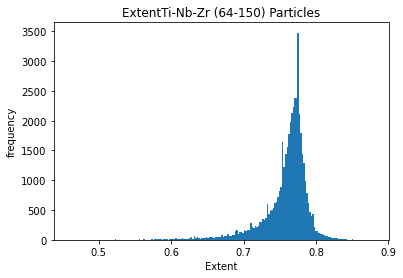

4
5


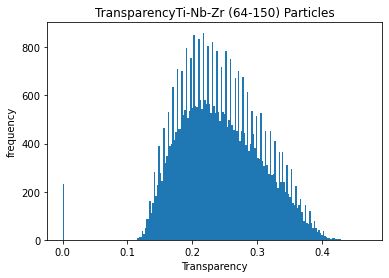

4
5


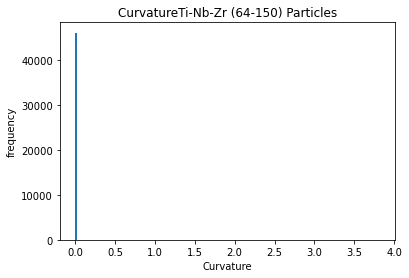

4
5


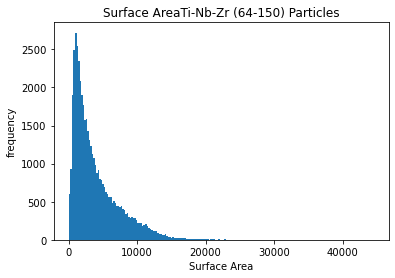

4
5


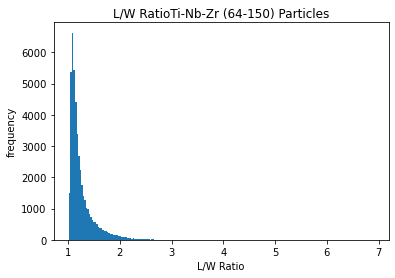

4
5


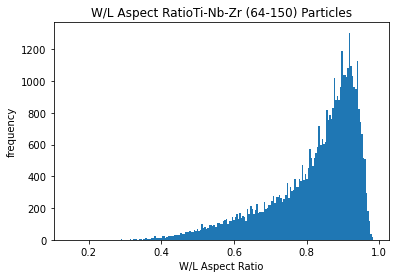

4
5


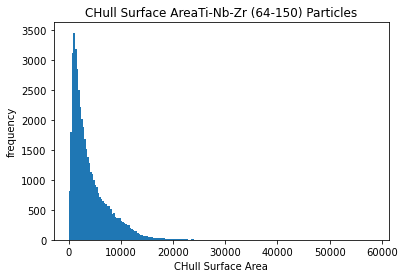

4
5


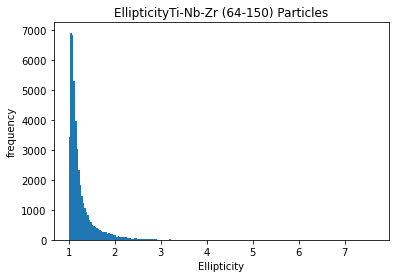

4
5


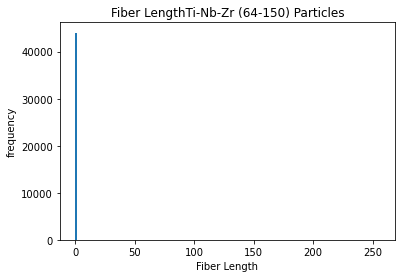

4
5


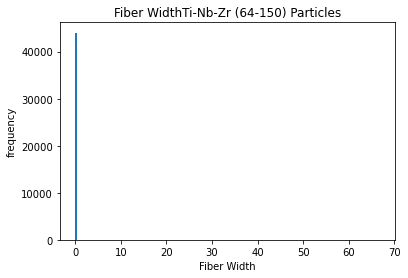

4
5


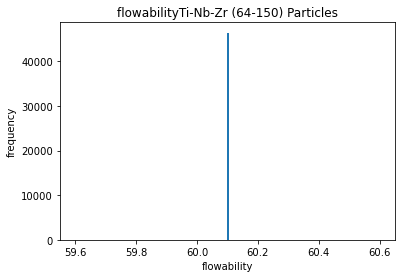

6
NAME:  Valimet 1 Al F357.2 (25-75) Particles FLOW:                                    sample_id  \
800203  e00d84bd-e660-4fe3-84b5-2c8ad1b4fcd1   
800204  e00d84bd-e660-4fe3-84b5-2c8ad1b4fcd1   
800205  e00d84bd-e660-4fe3-84b5-2c8ad1b4fcd1   
800206  e00d84bd-e660-4fe3-84b5-2c8ad1b4fcd1   
800207  e00d84bd-e660-4fe3-84b5-2c8ad1b4fcd1   
...                                      ...   
846626  e00d84bd-e660-4fe3-84b5-2c8ad1b4fcd1   
846627  e00d84bd-e660-4fe3-84b5-2c8ad1b4fcd1   
846628  e00d84bd-e660-4fe3-84b5-2c8ad1b4fcd1   
846629  e00d84bd-e660-4fe3-84b5-2c8ad1b4fcd1   
846630  e00d84bd-e660-4fe3-84b5-2c8ad1b4fcd1   

                                         name       Da       Dp   FWidth  \
800203  Valimet 1 Al F357.2 (25-75) Particles  118.977  191.161  121.556   
800204  Valimet 1 Al F357.2 (25-75) Particles  100.375  157.049  117.076   
800205  Valimet 1 Al F357.2 (25-75) Particles   99.184  153.905  106.128   
800206  Valimet 1 Al F357.2 (25-75) Particles   90.631  137.162   

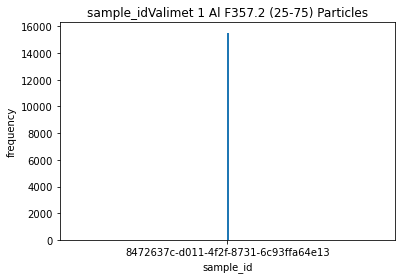

4
5


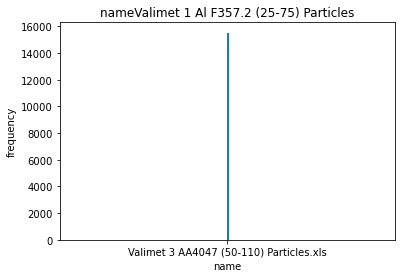

4
5


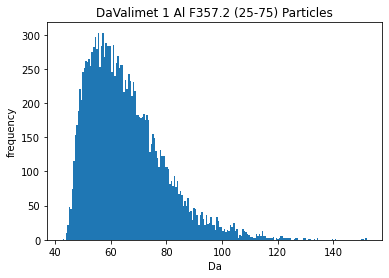

4
5


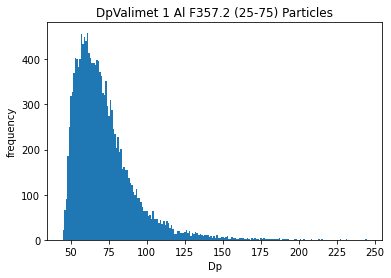

4
5


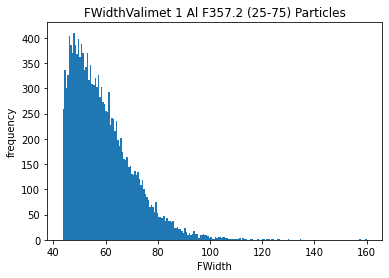

4
5


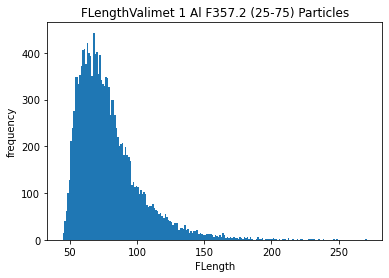

4
5


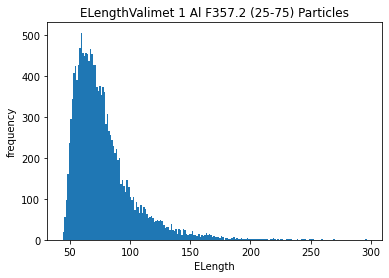

4
5


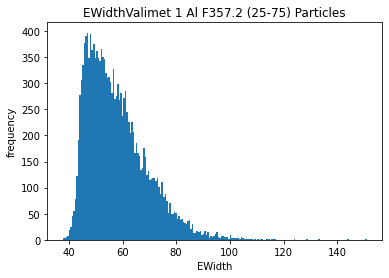

4
5


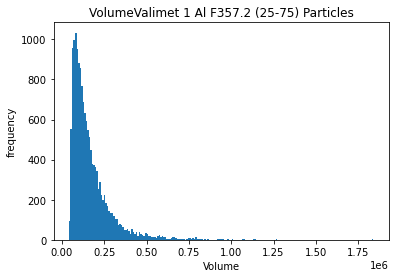

4
5


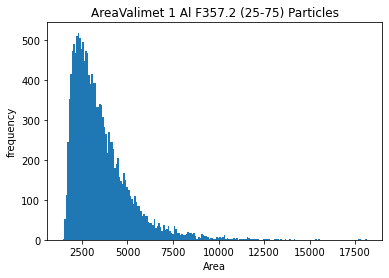

4
5


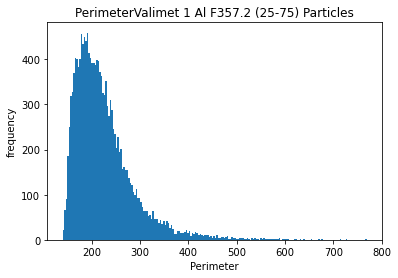

4
5


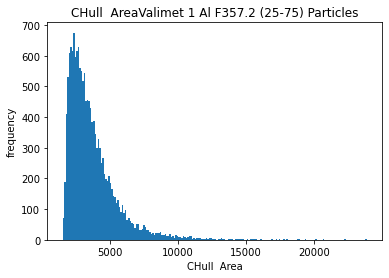

4
5


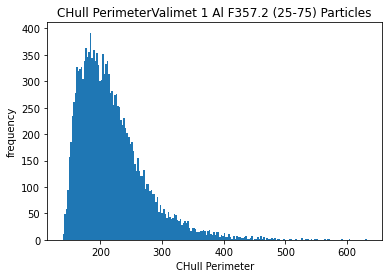

4
5


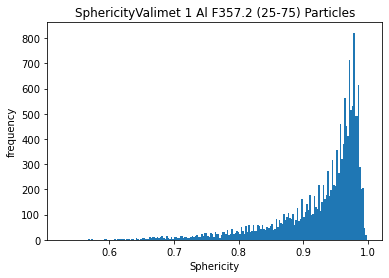

4
5


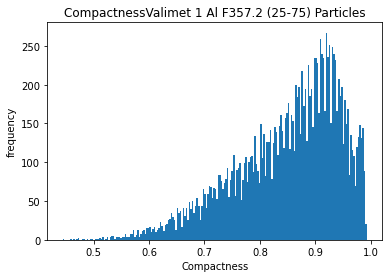

4
5


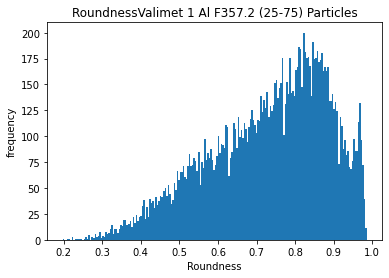

4
5


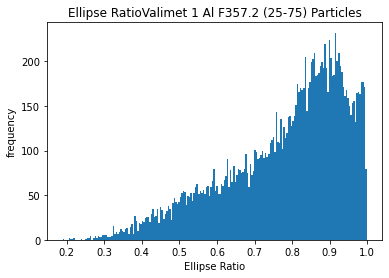

4
5


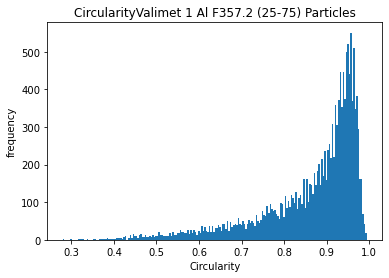

4
5


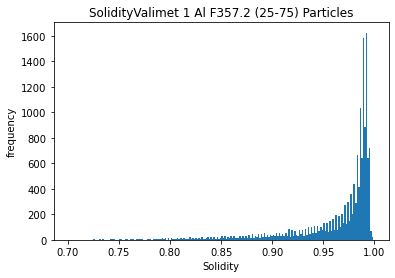

4
5


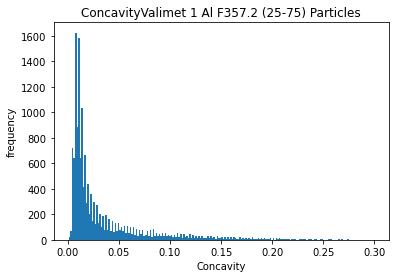

4
5


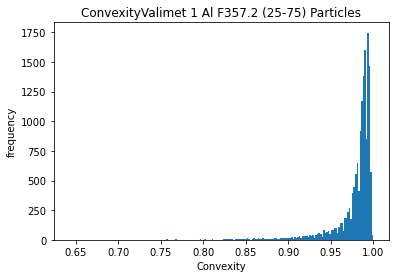

4
5


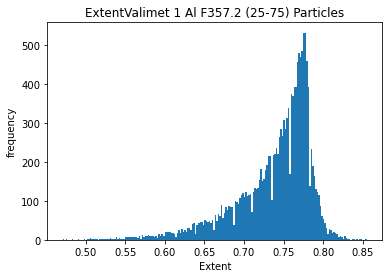

4
5


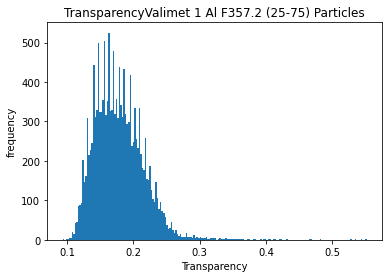

4
5


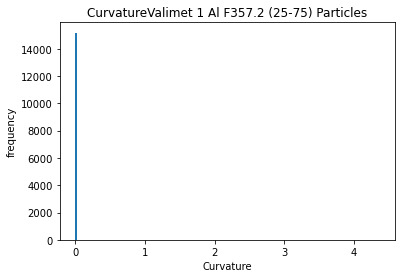

4
5


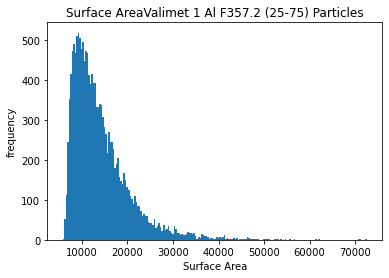

4
5


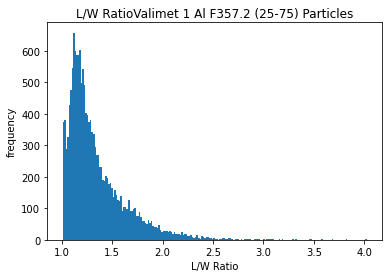

4
5


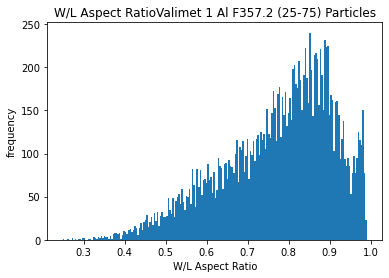

4
5


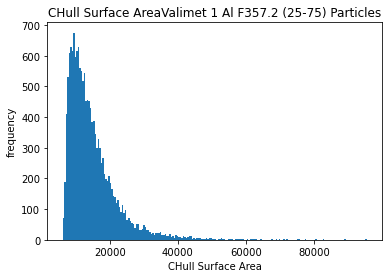

4
5


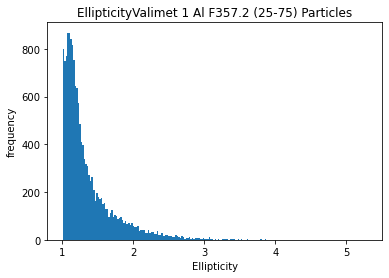

4
5


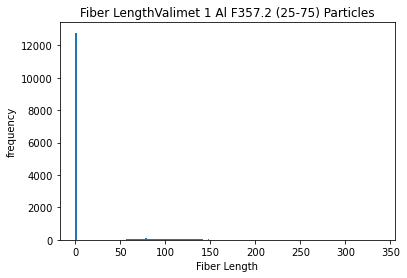

4
5


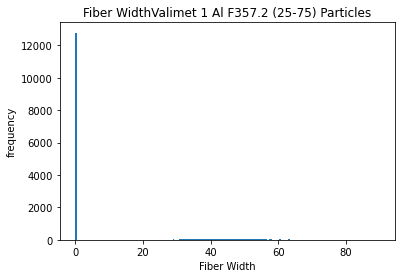

4
5


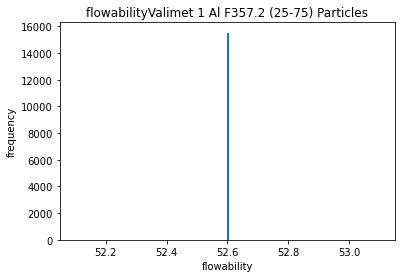

6
NAME:  Valimet 3 AA4047 (50-110) Particles.xls FLOW:                                    sample_id  \
846631  8472637c-d011-4f2f-8731-6c93ffa64e13   
846632  8472637c-d011-4f2f-8731-6c93ffa64e13   
846633  8472637c-d011-4f2f-8731-6c93ffa64e13   
846634  8472637c-d011-4f2f-8731-6c93ffa64e13   
846635  8472637c-d011-4f2f-8731-6c93ffa64e13   
...                                      ...   
862146  8472637c-d011-4f2f-8731-6c93ffa64e13   
862147  8472637c-d011-4f2f-8731-6c93ffa64e13   
862148  8472637c-d011-4f2f-8731-6c93ffa64e13   
862149  8472637c-d011-4f2f-8731-6c93ffa64e13   
862150  8472637c-d011-4f2f-8731-6c93ffa64e13   

                                           name       Da       Dp   FWidth  \
846631  Valimet 3 AA4047 (50-110) Particles.xls  152.021  226.929  160.097   
846632  Valimet 3 AA4047 (50-110) Particles.xls  150.489  231.353  157.453   
846633  Valimet 3 AA4047 (50-110) Particles.xls  121.063  215.052  134.683   
846634  Valimet 3 AA4047 (50-110) Particles.xls  114.805

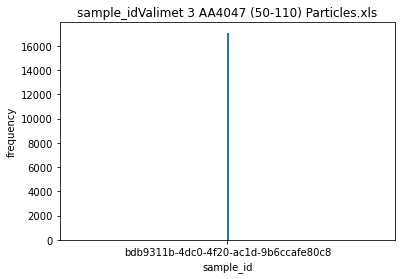

4
5


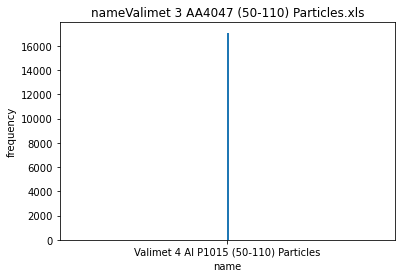

4
5


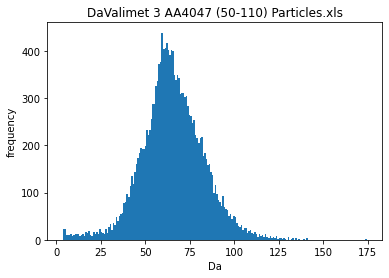

4
5


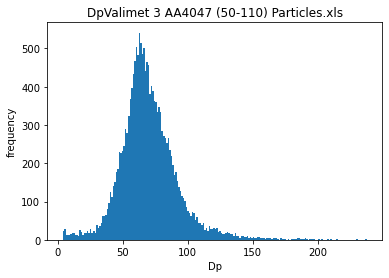

4
5


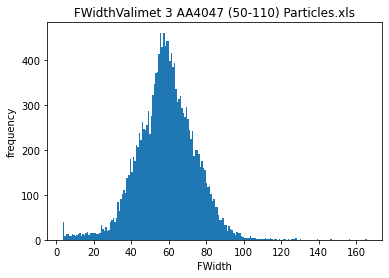

4
5


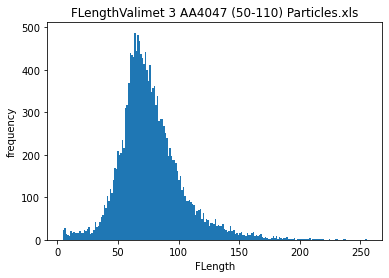

4
5


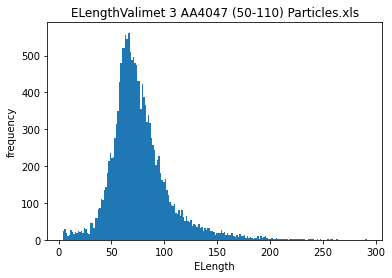

4
5


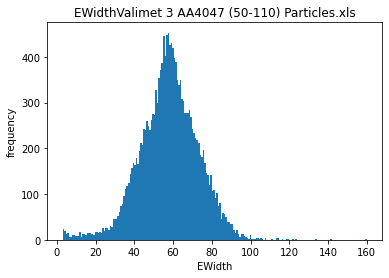

4
5


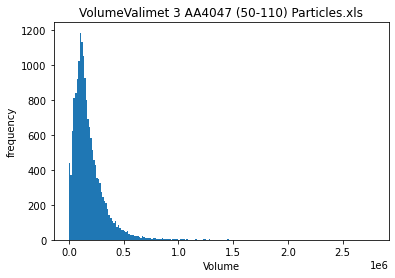

4
5


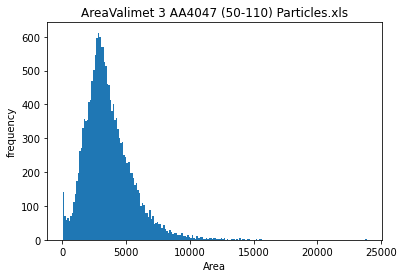

4
5


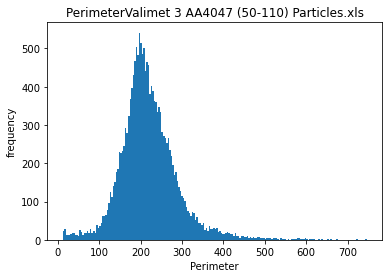

4
5


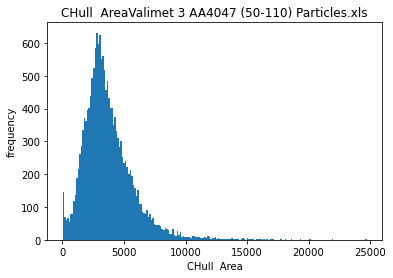

4
5


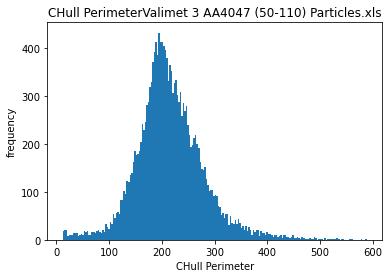

4
5


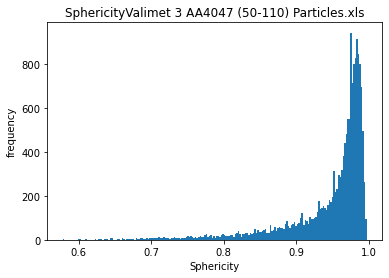

4
5


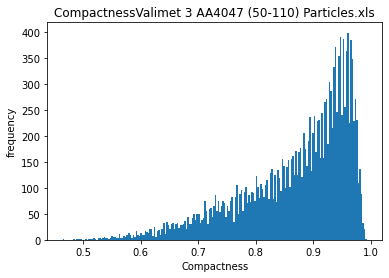

4
5


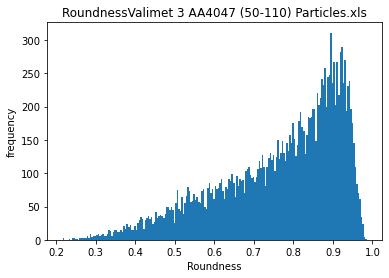

4
5


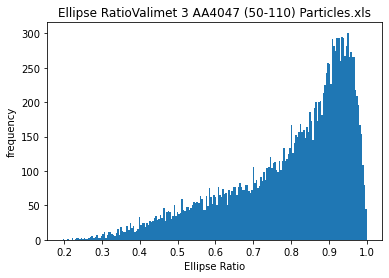

4
5


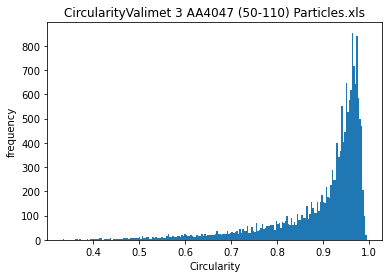

4
5


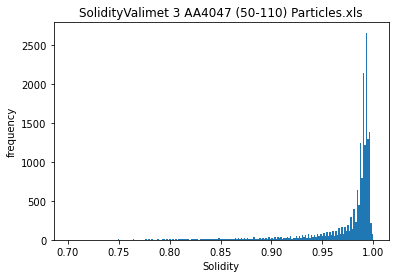

4
5


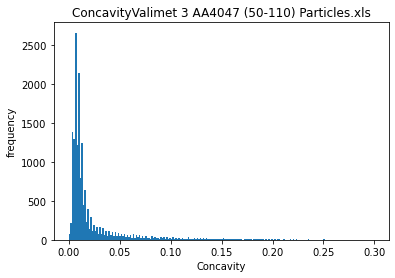

4
5


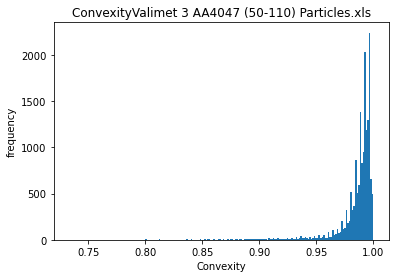

4
5


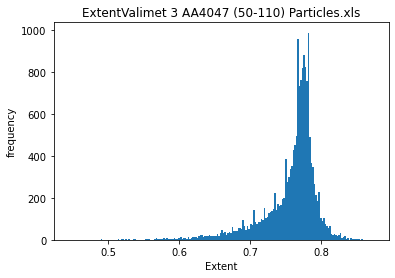

4
5


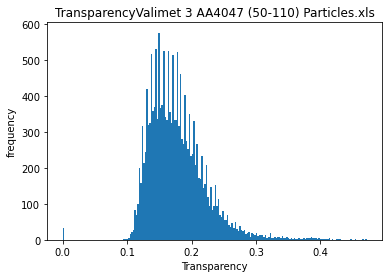

4
5


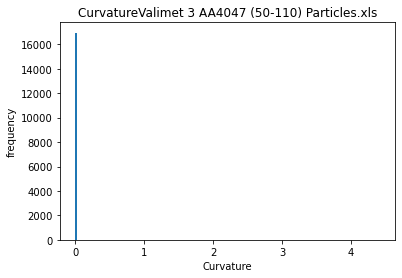

4
5


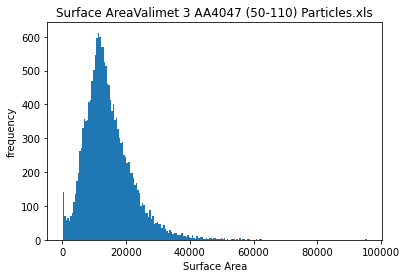

4
5


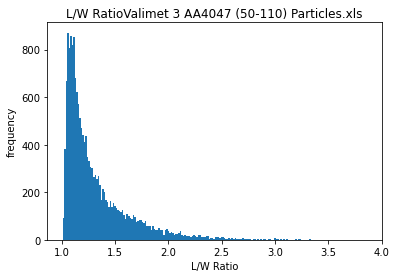

4
5


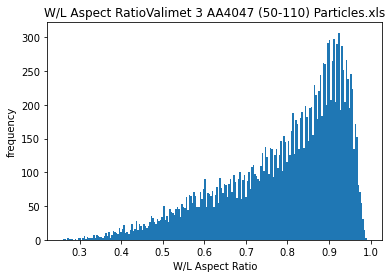

4
5


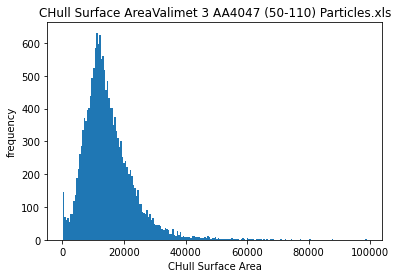

4
5


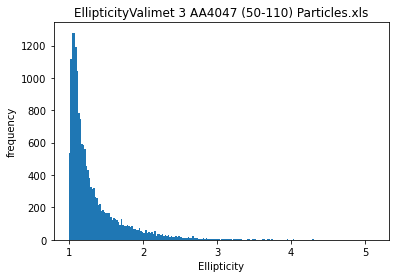

4
5


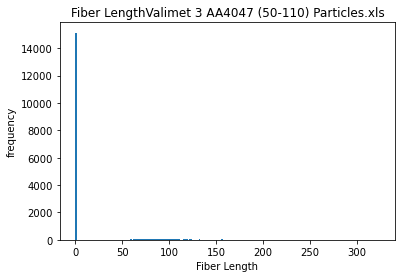

4
5


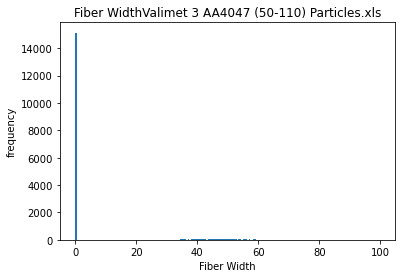

4
5


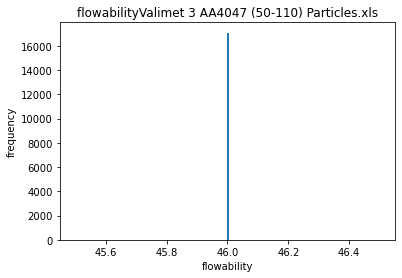

6
NAME:  Valimet 4 Al P1015 (50-110) Particles FLOW:                                    sample_id  \
862151  bdb9311b-4dc0-4f20-ac1d-9b6ccafe80c8   
862152  bdb9311b-4dc0-4f20-ac1d-9b6ccafe80c8   
862153  bdb9311b-4dc0-4f20-ac1d-9b6ccafe80c8   
862154  bdb9311b-4dc0-4f20-ac1d-9b6ccafe80c8   
862155  bdb9311b-4dc0-4f20-ac1d-9b6ccafe80c8   
...                                      ...   
879237  bdb9311b-4dc0-4f20-ac1d-9b6ccafe80c8   
879238  bdb9311b-4dc0-4f20-ac1d-9b6ccafe80c8   
879239  bdb9311b-4dc0-4f20-ac1d-9b6ccafe80c8   
879240  bdb9311b-4dc0-4f20-ac1d-9b6ccafe80c8   
879241  bdb9311b-4dc0-4f20-ac1d-9b6ccafe80c8   

                                         name       Da       Dp   FWidth  \
862151  Valimet 4 Al P1015 (50-110) Particles  174.433  194.483  165.729   
862152  Valimet 4 Al P1015 (50-110) Particles  140.739  197.372  156.512   
862153  Valimet 4 Al P1015 (50-110) Particles  139.255  229.631  146.502   
862154  Valimet 4 Al P1015 (50-110) Particles  133.279  207.274  1

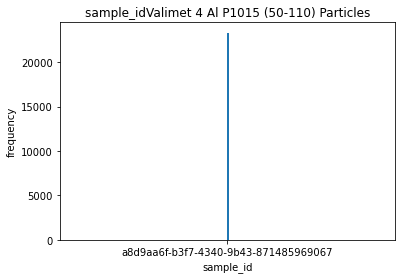

4
5


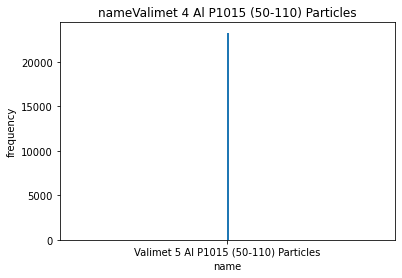

4
5


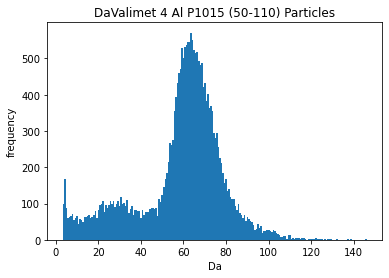

4
5


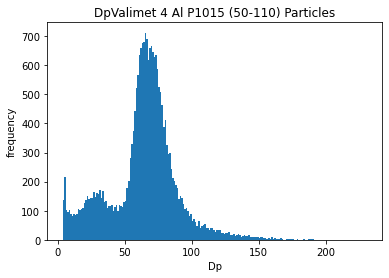

4
5


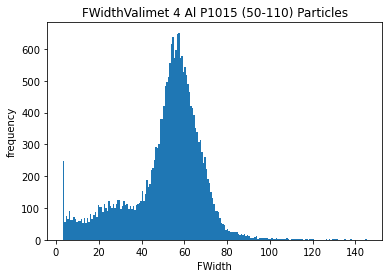

4
5


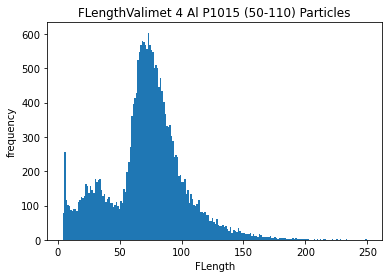

4
5


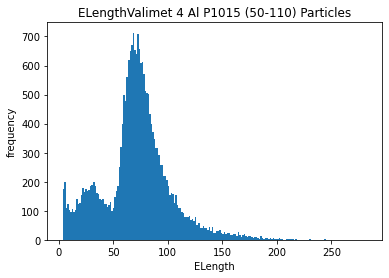

4
5


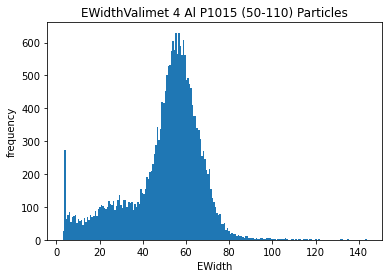

4
5


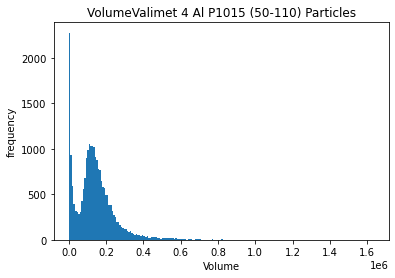

4
5


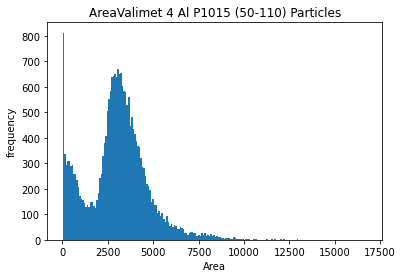

4
5


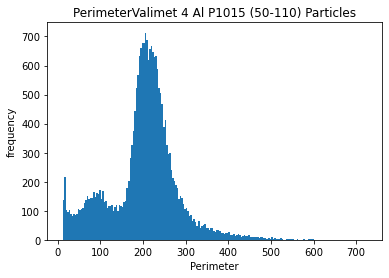

4
5


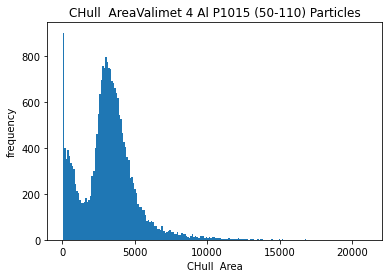

4
5


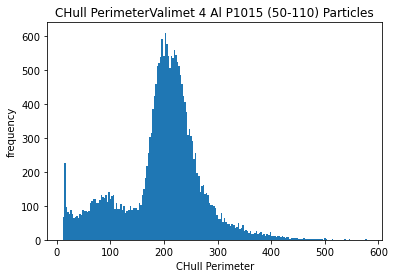

4
5


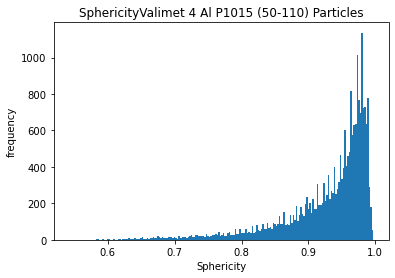

4
5


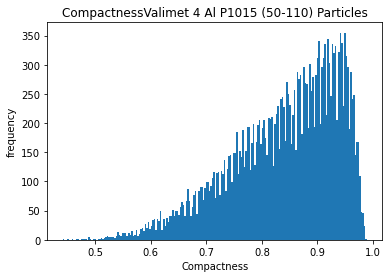

4
5


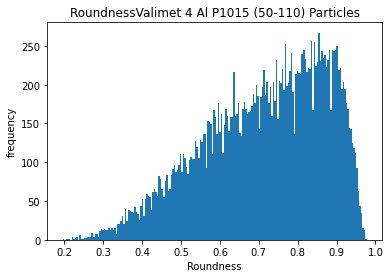

4
5


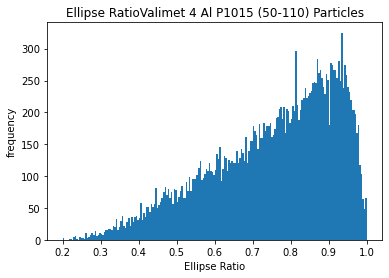

4
5


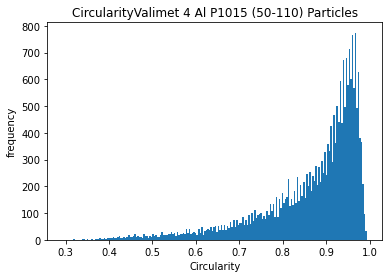

4
5


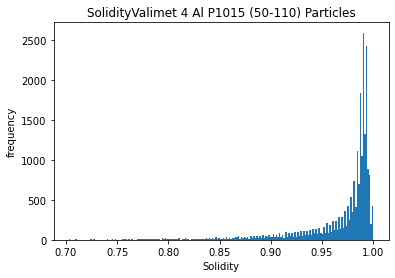

4
5


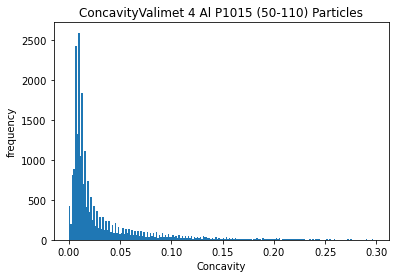

4
5


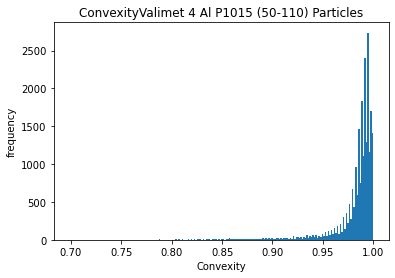

4
5


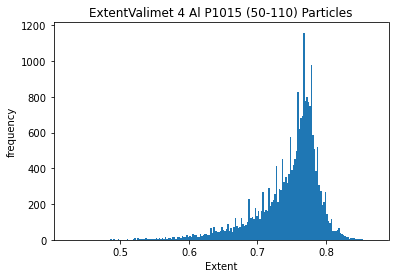

4
5


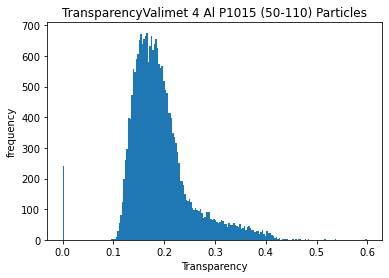

4
5


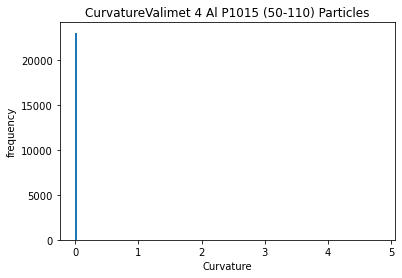

4
5


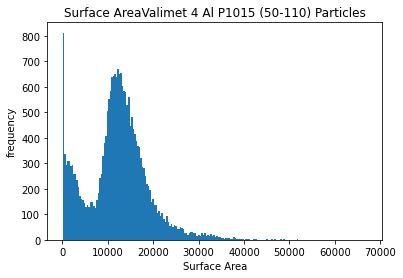

4
5


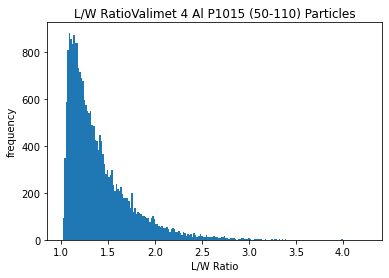

4
5


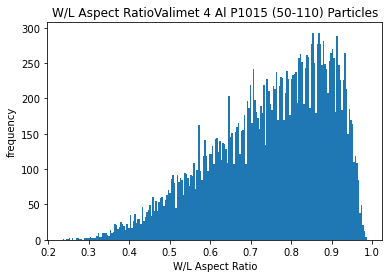

4
5


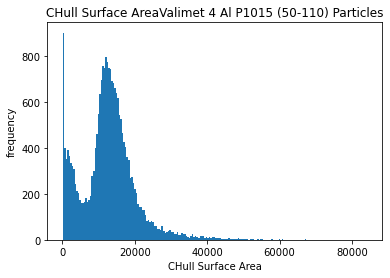

4
5


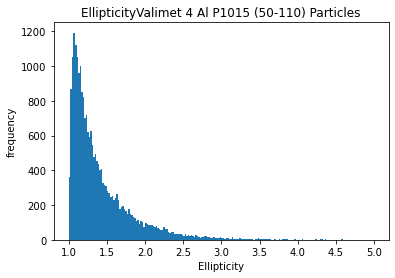

4
5


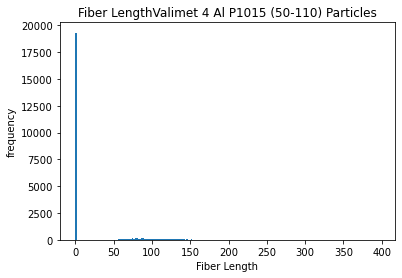

4
5


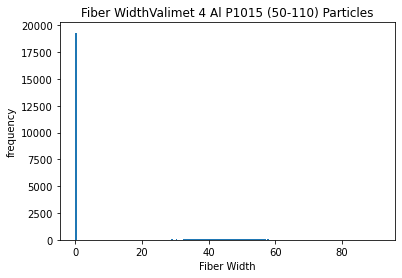

4
5


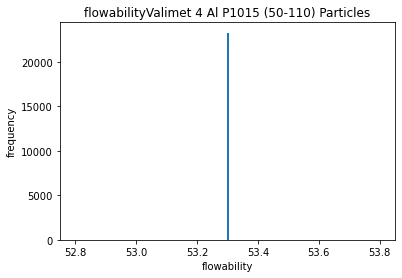

6
NAME:  Valimet 5 Al P1015 (50-110) Particles FLOW:                                    sample_id  \
879242  a8d9aa6f-b3f7-4340-9b43-871485969067   
879243  a8d9aa6f-b3f7-4340-9b43-871485969067   
879244  a8d9aa6f-b3f7-4340-9b43-871485969067   
879245  a8d9aa6f-b3f7-4340-9b43-871485969067   
879246  a8d9aa6f-b3f7-4340-9b43-871485969067   
...                                      ...   
902528  a8d9aa6f-b3f7-4340-9b43-871485969067   
902529  a8d9aa6f-b3f7-4340-9b43-871485969067   
902530  a8d9aa6f-b3f7-4340-9b43-871485969067   
902531  a8d9aa6f-b3f7-4340-9b43-871485969067   
902532  a8d9aa6f-b3f7-4340-9b43-871485969067   

                                         name       Da       Dp   FWidth  \
879242  Valimet 5 Al P1015 (50-110) Particles  123.599  219.784  145.365   
879243  Valimet 5 Al P1015 (50-110) Particles  128.637  210.357  137.854   
879244  Valimet 5 Al P1015 (50-110) Particles  137.239  139.608  135.198   
879245  Valimet 5 Al P1015 (50-110) Particles  124.143  216.908  1

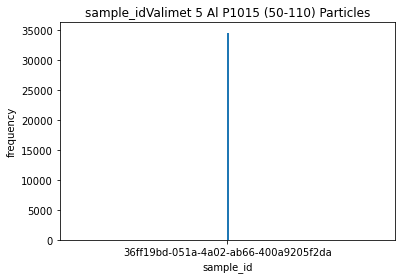

4
5


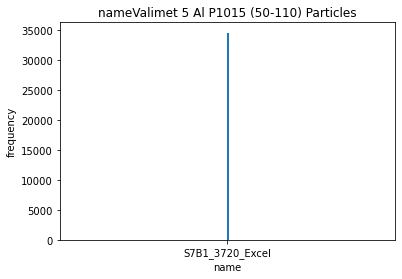

4
5


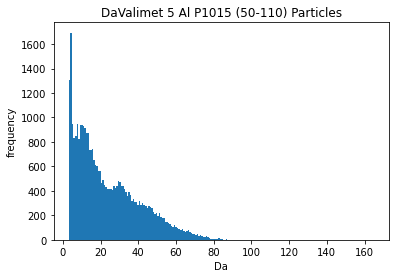

4
5


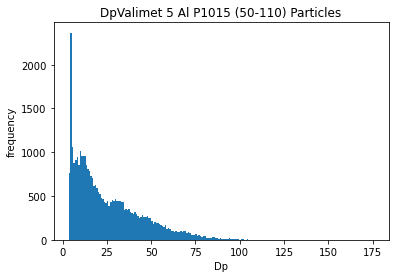

4
5


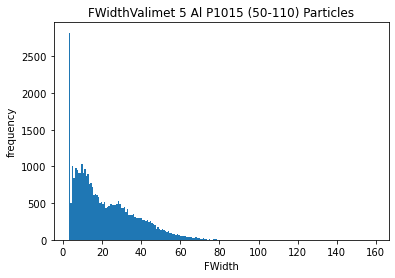

4
5


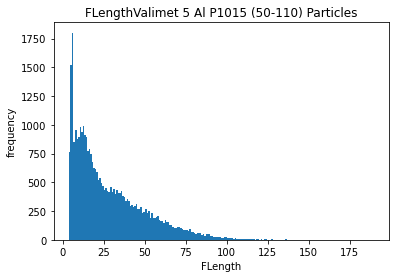

4
5


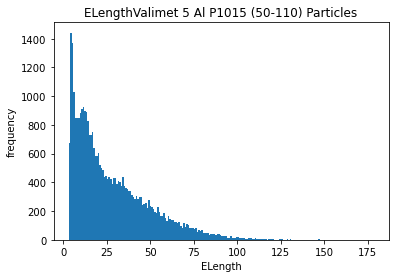

4
5


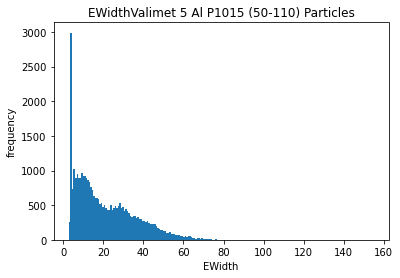

4
5


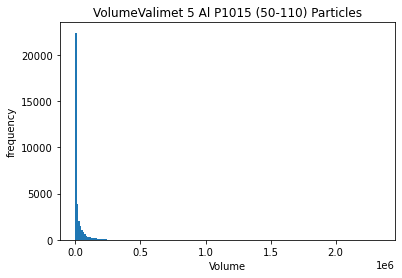

4
5


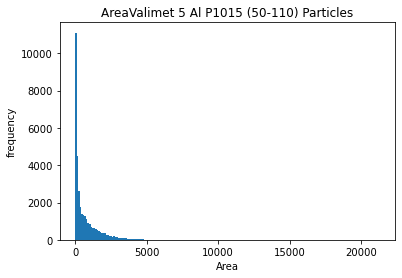

4
5


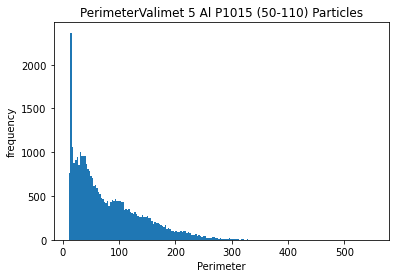

4
5


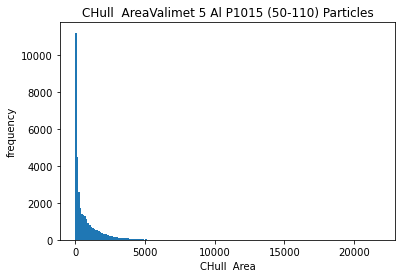

4
5


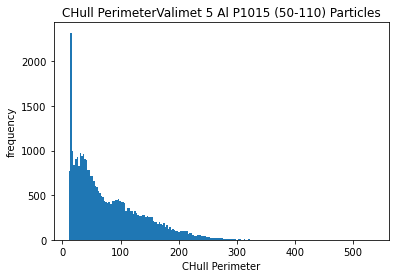

4
5


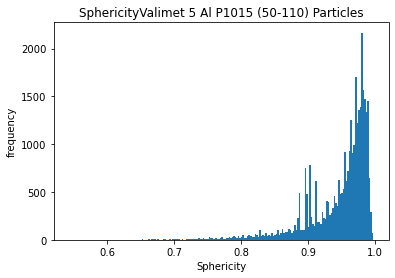

4
5


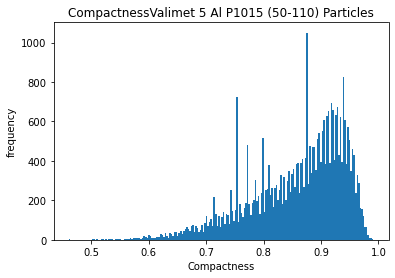

4
5


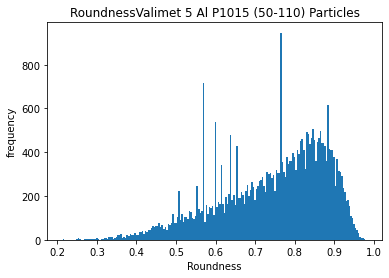

4
5


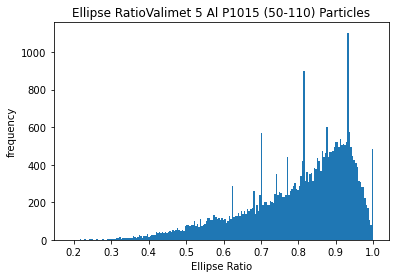

4
5


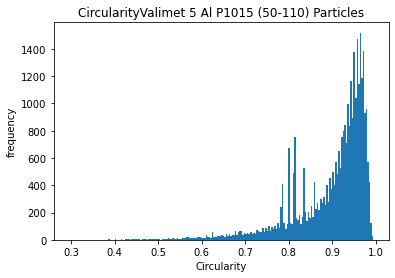

4
5


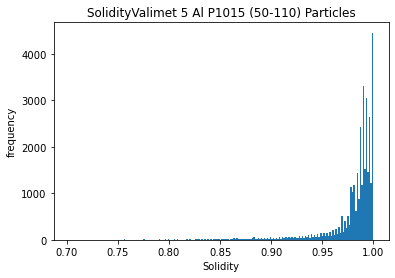

4
5


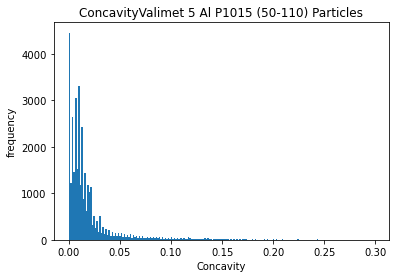

4
5


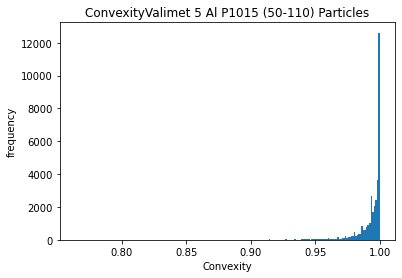

4
5


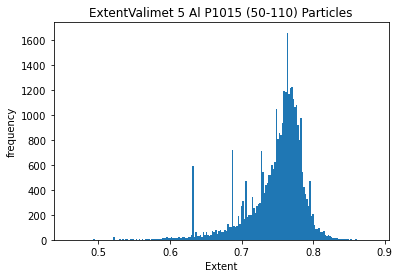

4
5


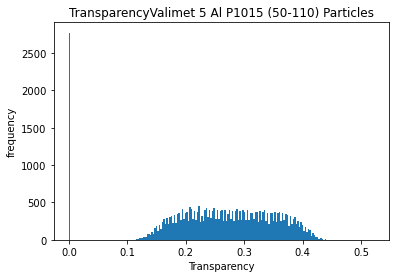

4
5


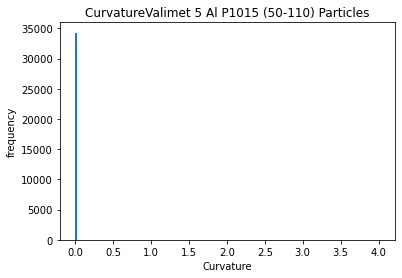

4
5


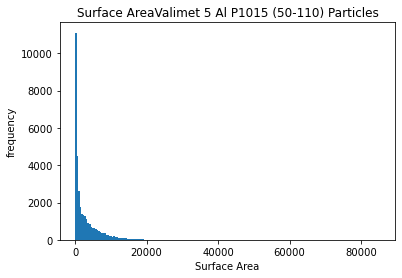

4
5


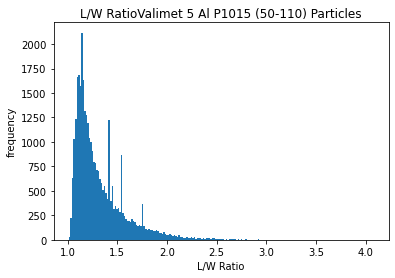

4
5


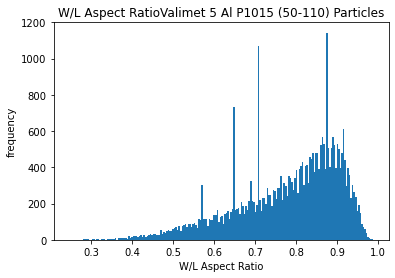

4
5


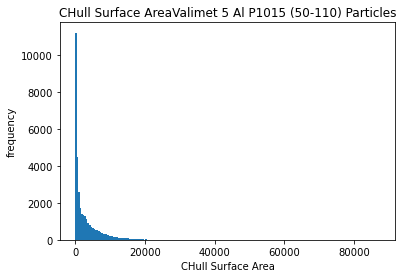

4
5


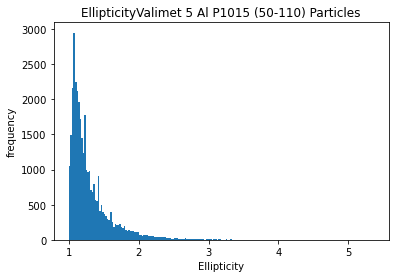

4
5


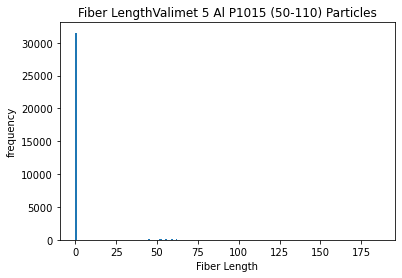

4
5


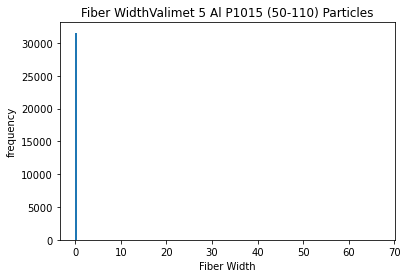

4
5


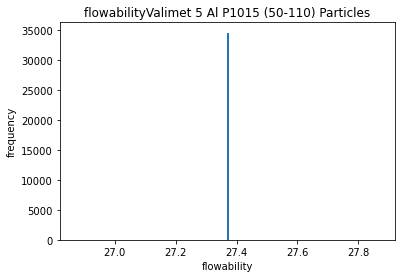

6
NAME:  S7B1_3720_Excel FLOW:                                    sample_id             name       Da  \
902533  36ff19bd-051a-4a02-ab66-400a9205f2da  S7B1_3720_Excel  164.658   
902534  36ff19bd-051a-4a02-ab66-400a9205f2da  S7B1_3720_Excel  149.085   
902535  36ff19bd-051a-4a02-ab66-400a9205f2da  S7B1_3720_Excel  117.771   
902536  36ff19bd-051a-4a02-ab66-400a9205f2da  S7B1_3720_Excel  108.682   
902537  36ff19bd-051a-4a02-ab66-400a9205f2da  S7B1_3720_Excel  107.610   
...                                      ...              ...      ...   
937136  36ff19bd-051a-4a02-ab66-400a9205f2da  S7B1_3720_Excel    3.201   
937137  36ff19bd-051a-4a02-ab66-400a9205f2da  S7B1_3720_Excel    4.786   
937138  36ff19bd-051a-4a02-ab66-400a9205f2da  S7B1_3720_Excel    4.055   
937139  36ff19bd-051a-4a02-ab66-400a9205f2da  S7B1_3720_Excel    4.168   
937140  36ff19bd-051a-4a02-ab66-400a9205f2da  S7B1_3720_Excel    4.137   

             Dp   FWidth  FLength  ELength   EWidth       Volume       Area  \
9

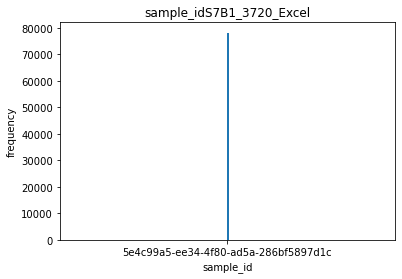

4
5


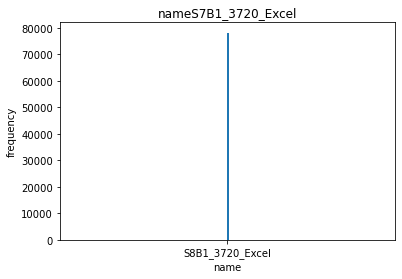

4
5


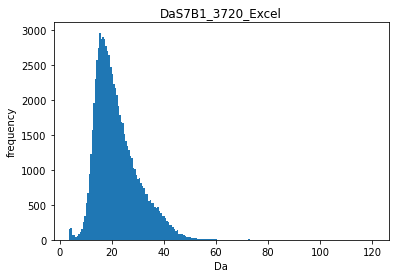

4
5


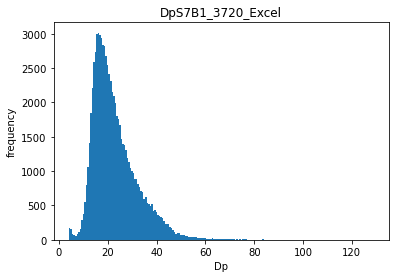

4
5


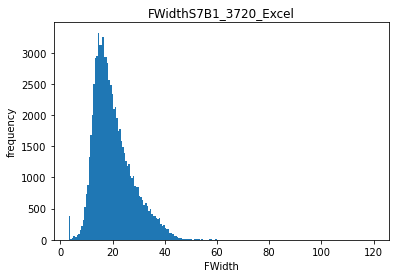

4
5


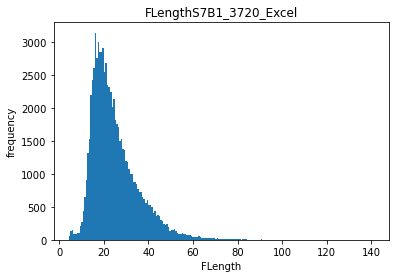

4
5


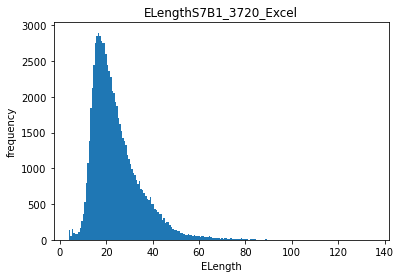

4
5


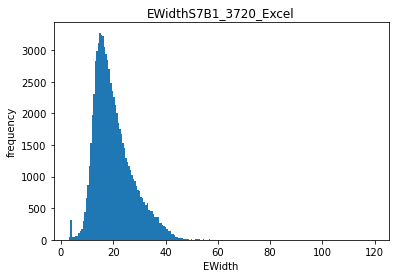

4
5


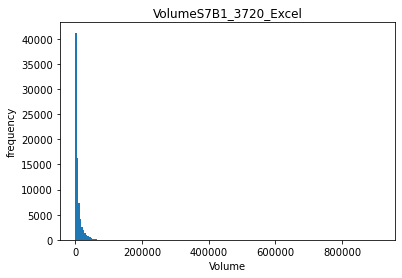

4
5


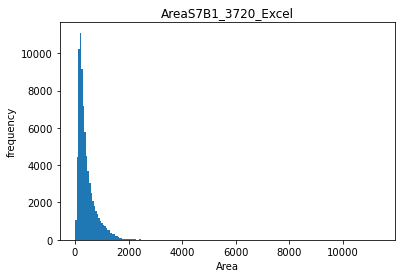

4
5


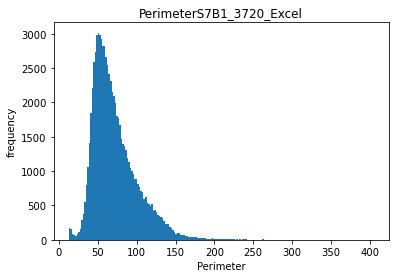

4
5


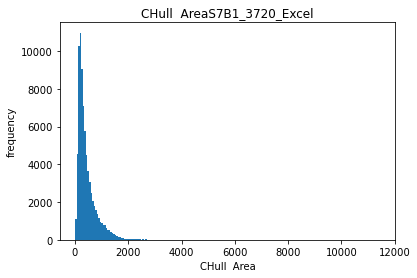

4
5


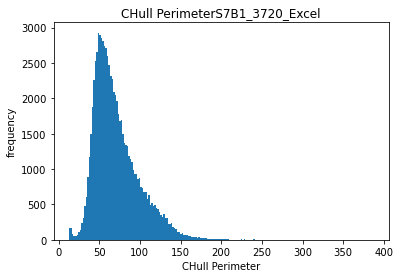

4
5


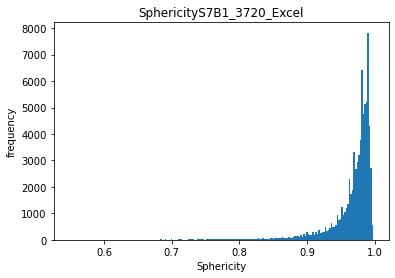

4
5


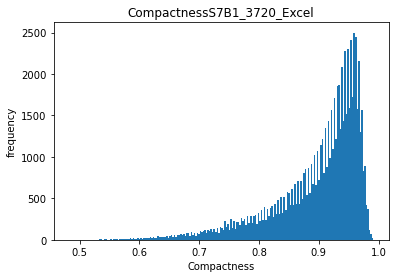

4
5


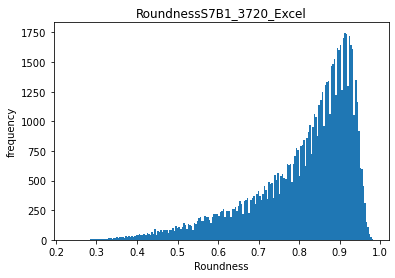

4
5


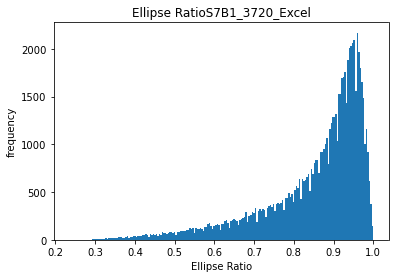

4
5


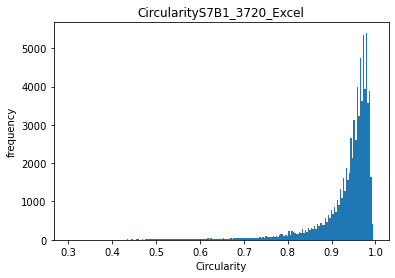

4
5


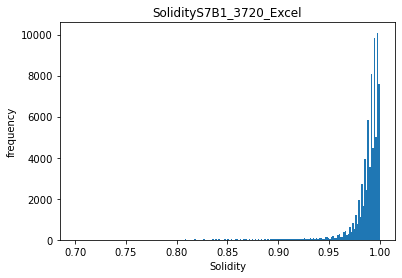

4
5


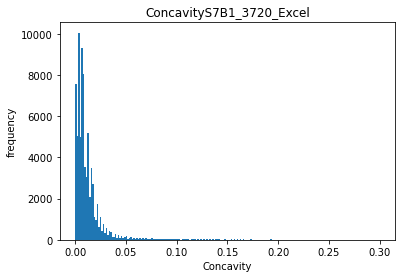

4
5


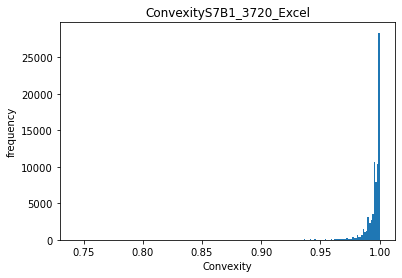

4
5


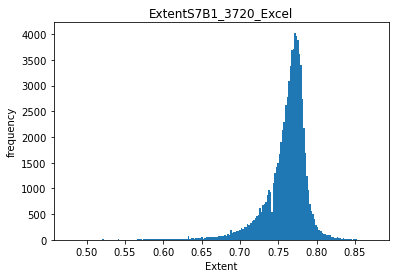

4
5


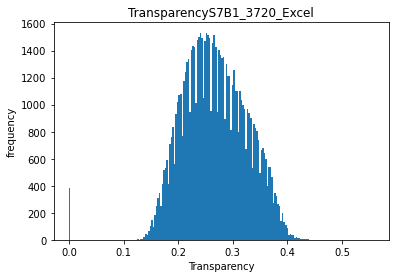

4
5


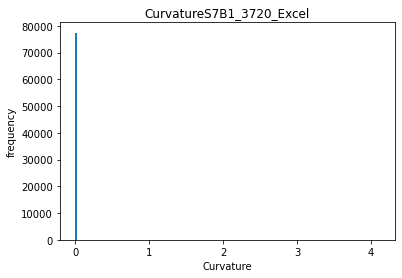

4
5


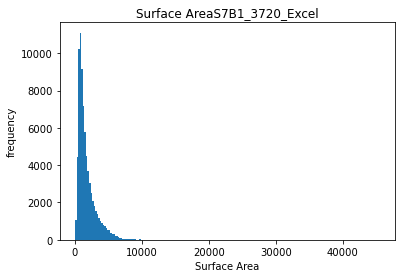

4
5


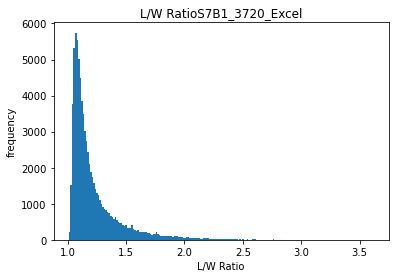

4
5


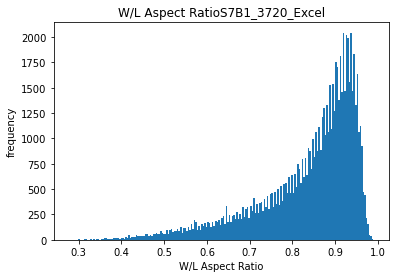

4
5


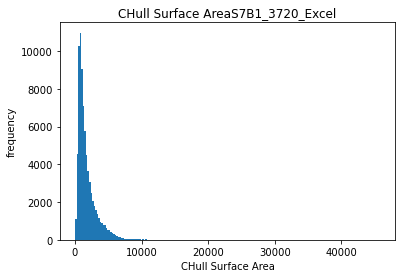

4
5


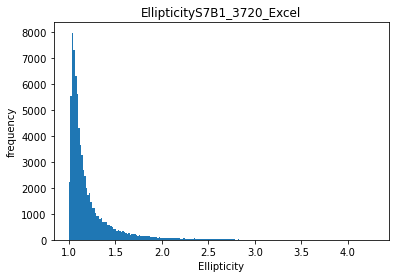

4
5


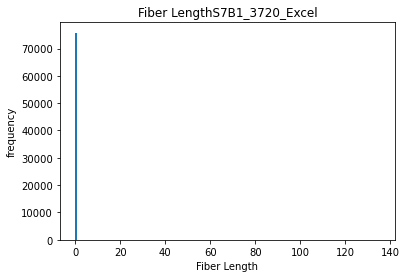

4
5


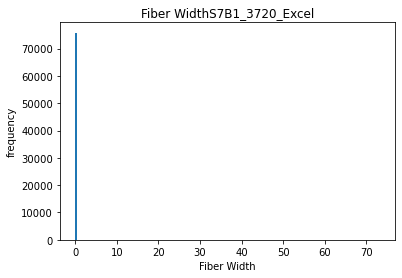

4
5


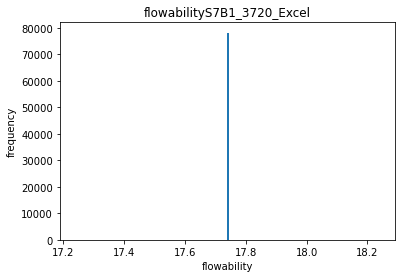

6
NAME:  S8B1_3720_Excel FLOW:                                     sample_id             name       Da  \
937141   5e4c99a5-ee34-4f80-ad5a-286bf5897d1c  S8B1_3720_Excel  120.332   
937142   5e4c99a5-ee34-4f80-ad5a-286bf5897d1c  S8B1_3720_Excel  113.990   
937143   5e4c99a5-ee34-4f80-ad5a-286bf5897d1c  S8B1_3720_Excel  116.450   
937144   5e4c99a5-ee34-4f80-ad5a-286bf5897d1c  S8B1_3720_Excel  105.541   
937145   5e4c99a5-ee34-4f80-ad5a-286bf5897d1c  S8B1_3720_Excel  105.101   
...                                       ...              ...      ...   
1015282  5e4c99a5-ee34-4f80-ad5a-286bf5897d1c  S8B1_3720_Excel    3.821   
1015283  5e4c99a5-ee34-4f80-ad5a-286bf5897d1c  S8B1_3720_Excel    3.519   
1015284  5e4c99a5-ee34-4f80-ad5a-286bf5897d1c  S8B1_3720_Excel    4.062   
1015285  5e4c99a5-ee34-4f80-ad5a-286bf5897d1c  S8B1_3720_Excel    4.133   
1015286  5e4c99a5-ee34-4f80-ad5a-286bf5897d1c  S8B1_3720_Excel    3.824   

              Dp   FWidth  FLength  ELength   EWidth      Volume    

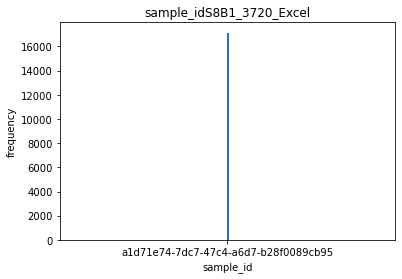

4
5


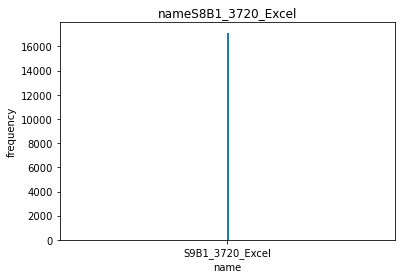

4
5


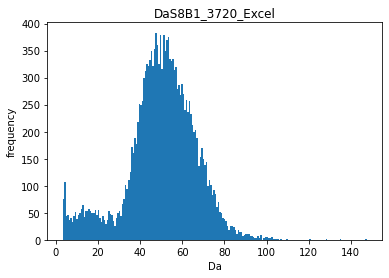

4
5


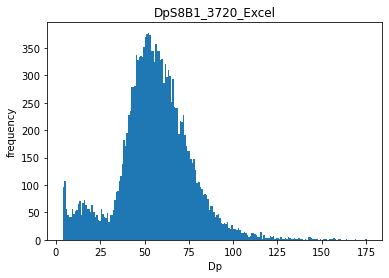

4
5


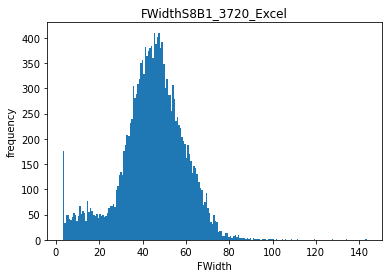

4
5


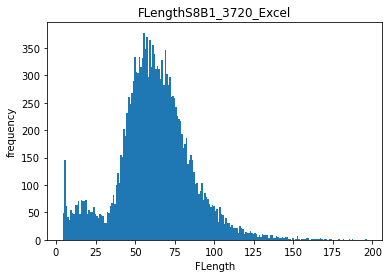

4
5


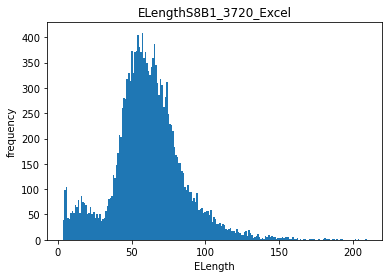

4
5


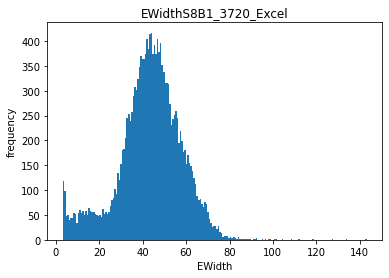

4
5


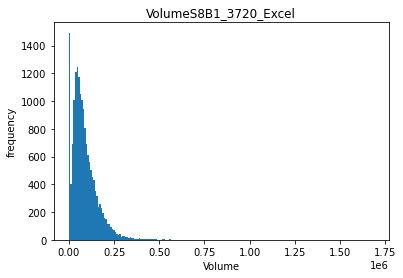

4
5


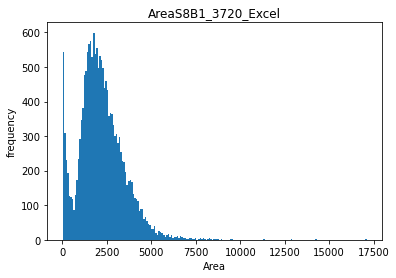

4
5


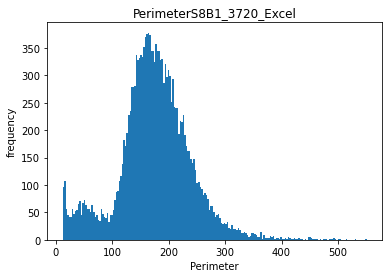

4
5


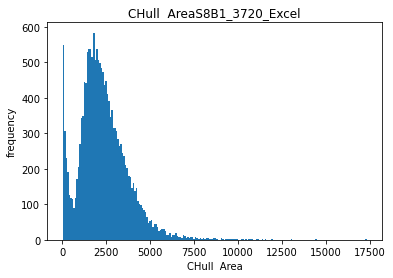

4
5


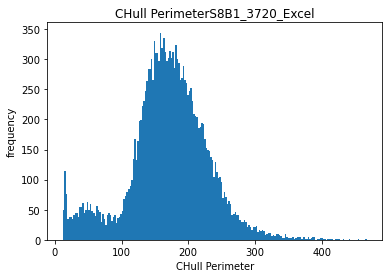

4
5


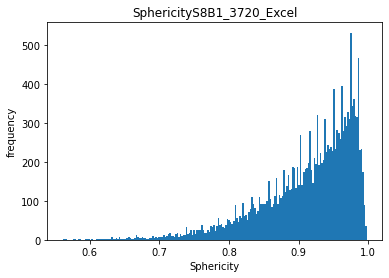

4
5


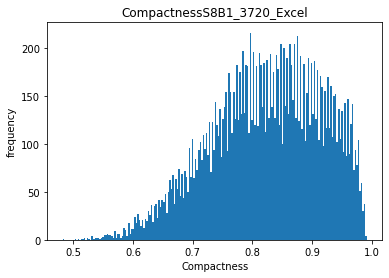

4
5


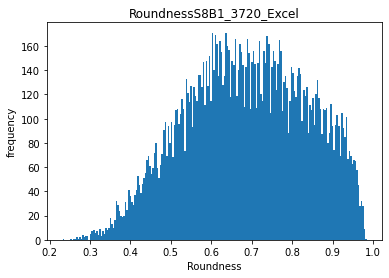

4
5


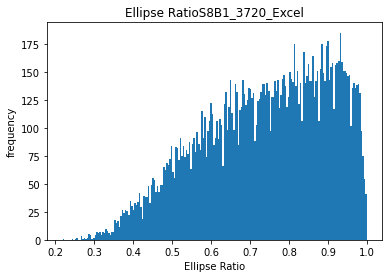

4
5


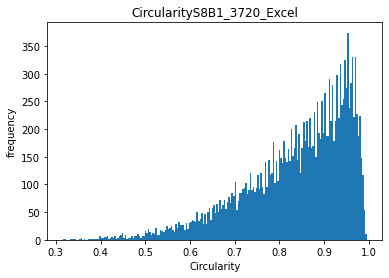

4
5


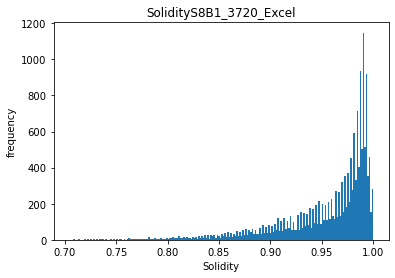

4
5


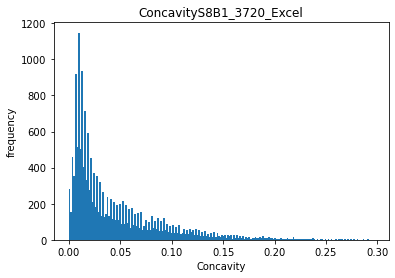

4
5


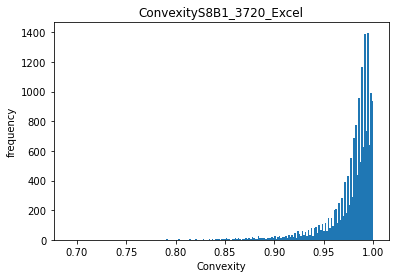

4
5


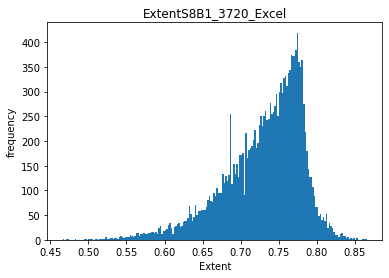

4
5


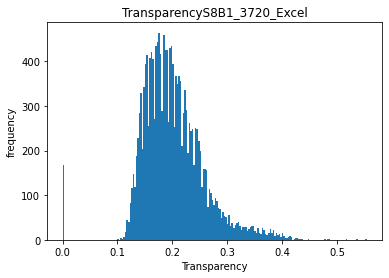

4
5


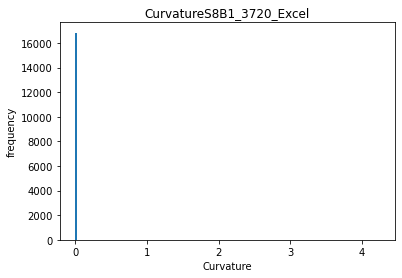

4
5


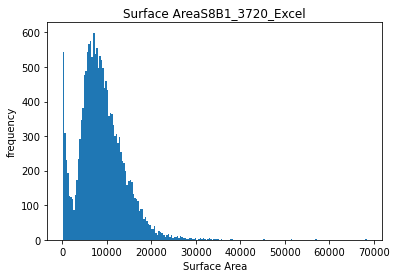

4
5


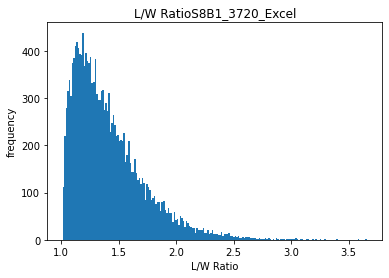

4
5


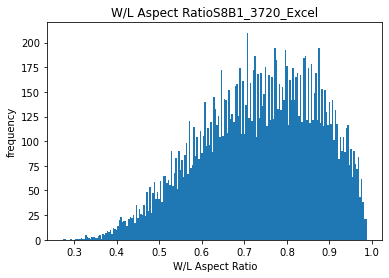

4
5


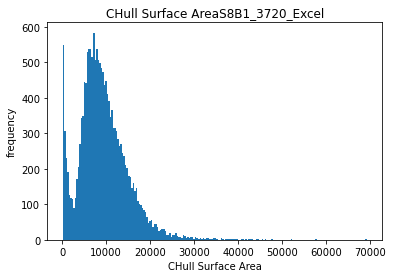

4
5


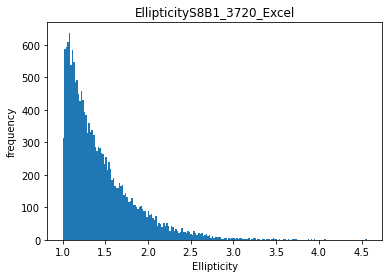

4
5


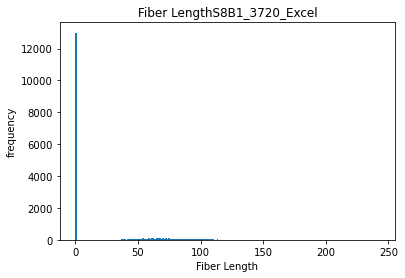

4
5


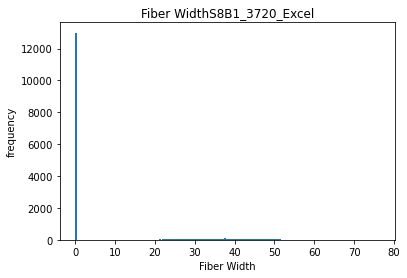

4
5


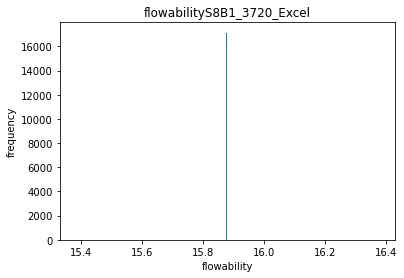

6
NAME:  S9B1_3720_Excel FLOW:                                     sample_id             name       Da  \
1015287  a1d71e74-7dc7-47c4-a6d7-b28f0089cb95  S9B1_3720_Excel  147.613   
1015288  a1d71e74-7dc7-47c4-a6d7-b28f0089cb95  S9B1_3720_Excel  134.822   
1015289  a1d71e74-7dc7-47c4-a6d7-b28f0089cb95  S9B1_3720_Excel  128.200   
1015290  a1d71e74-7dc7-47c4-a6d7-b28f0089cb95  S9B1_3720_Excel  120.234   
1015291  a1d71e74-7dc7-47c4-a6d7-b28f0089cb95  S9B1_3720_Excel   99.092   
...                                       ...              ...      ...   
1032411  a1d71e74-7dc7-47c4-a6d7-b28f0089cb95  S9B1_3720_Excel    4.547   
1032412  a1d71e74-7dc7-47c4-a6d7-b28f0089cb95  S9B1_3720_Excel    3.760   
1032413  a1d71e74-7dc7-47c4-a6d7-b28f0089cb95  S9B1_3720_Excel    3.760   
1032414  a1d71e74-7dc7-47c4-a6d7-b28f0089cb95  S9B1_3720_Excel    3.558   
1032415  a1d71e74-7dc7-47c4-a6d7-b28f0089cb95  S9B1_3720_Excel    3.270   

              Dp   FWidth  FLength  ELength   EWidth       Volume   

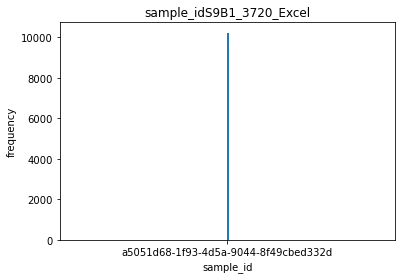

4
5


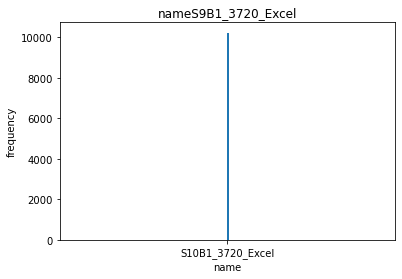

4
5


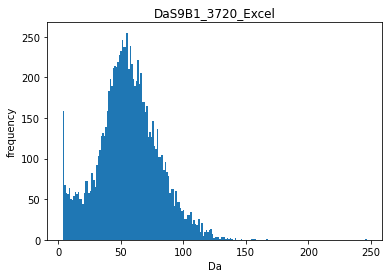

4
5


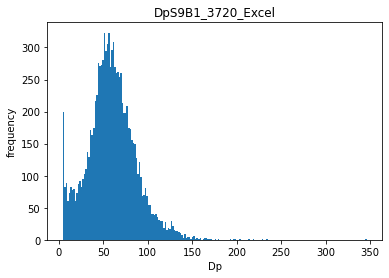

4
5


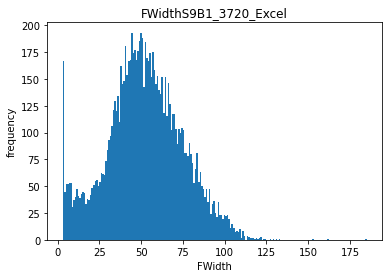

4
5


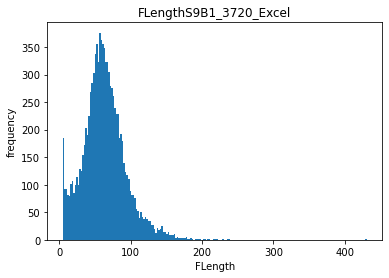

4
5


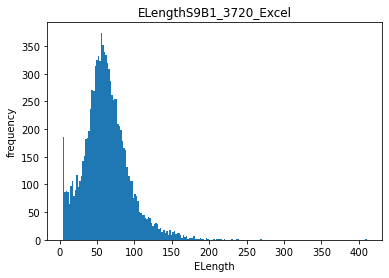

4
5


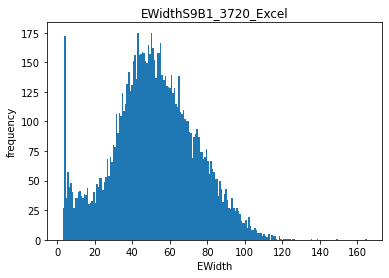

4
5


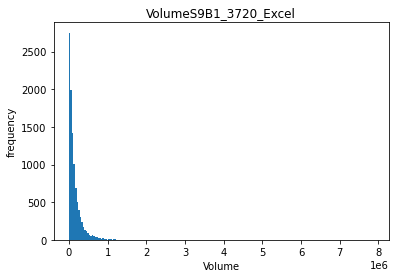

4
5


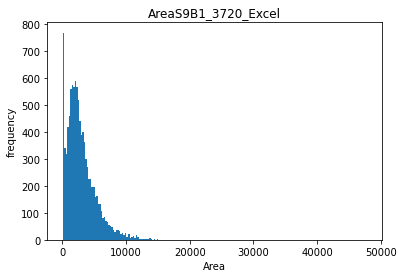

4
5


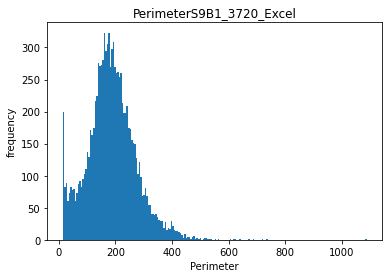

4
5


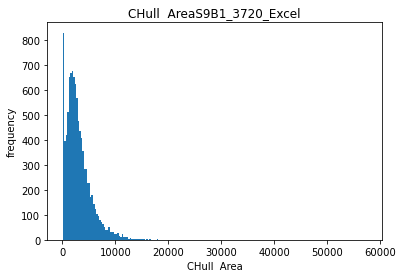

4
5


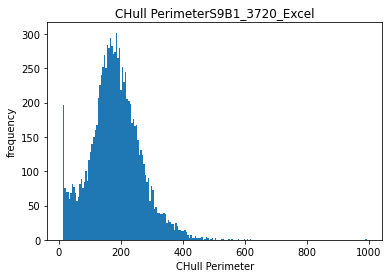

4
5


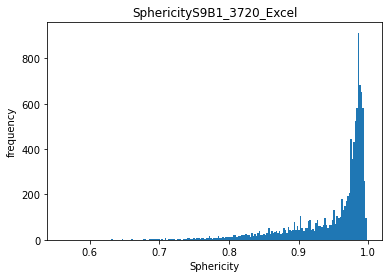

4
5


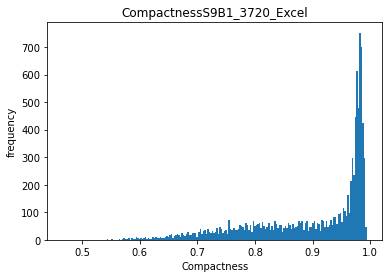

4
5


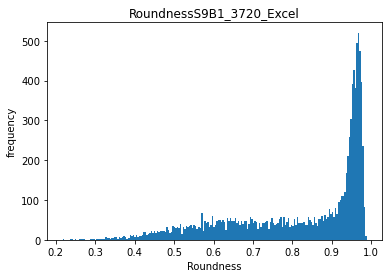

4
5


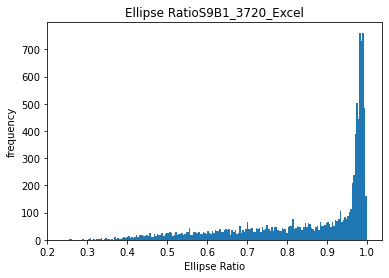

4
5


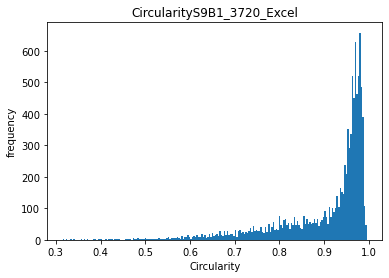

4
5


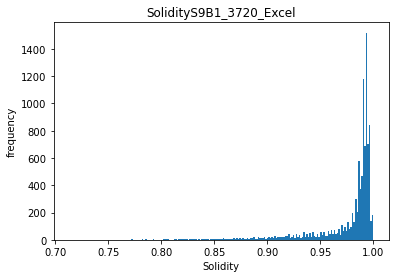

4
5


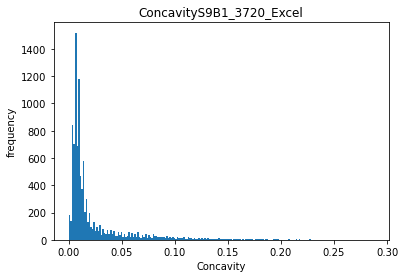

4
5


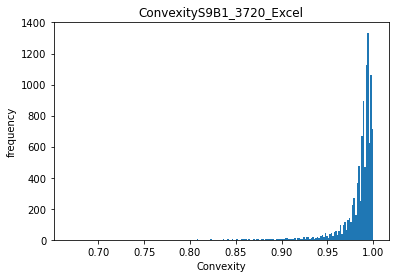

4
5


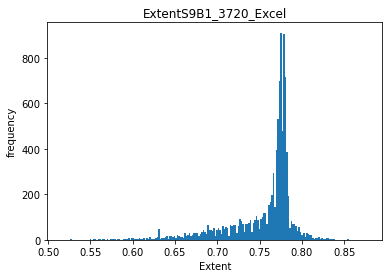

4
5


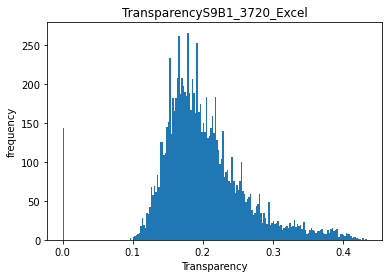

4
5


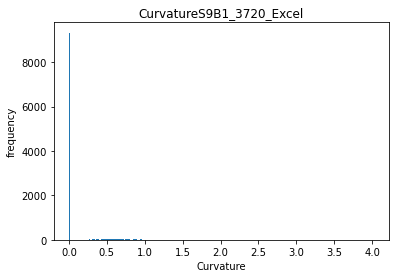

4
5


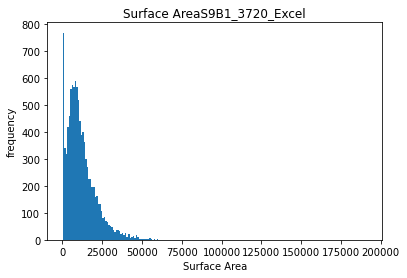

4
5


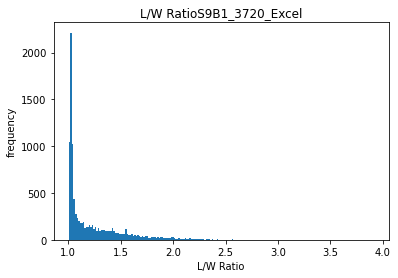

4
5


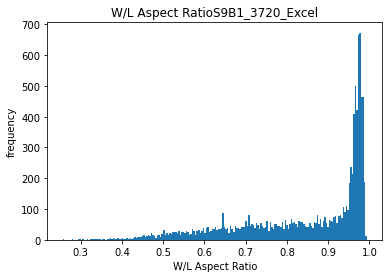

4
5


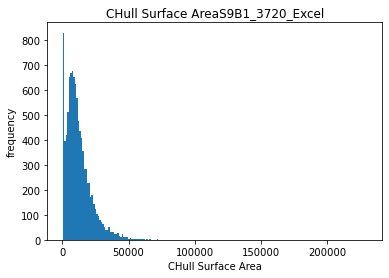

4
5


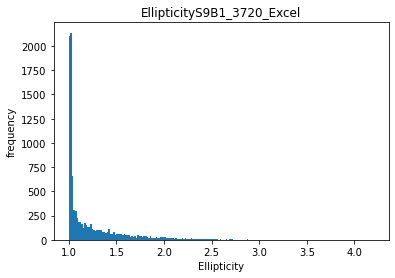

4
5


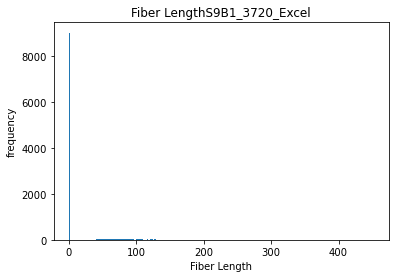

4
5


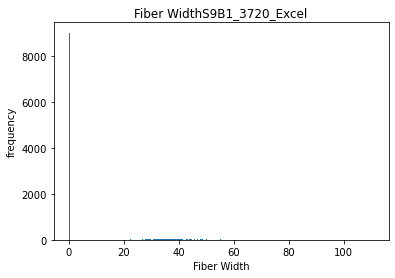

4
5


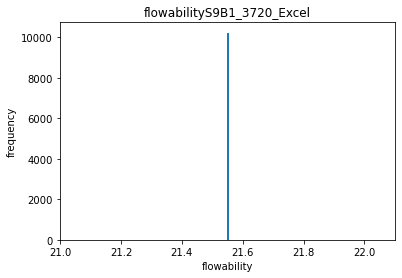

6
NAME:  S10B1_3720_Excel FLOW:                                     sample_id              name       Da  \
1032416  a5051d68-1f93-4d5a-9044-8f49cbed332d  S10B1_3720_Excel  246.739   
1032417  a5051d68-1f93-4d5a-9044-8f49cbed332d  S10B1_3720_Excel  156.827   
1032418  a5051d68-1f93-4d5a-9044-8f49cbed332d  S10B1_3720_Excel  167.576   
1032419  a5051d68-1f93-4d5a-9044-8f49cbed332d  S10B1_3720_Excel  134.172   
1032420  a5051d68-1f93-4d5a-9044-8f49cbed332d  S10B1_3720_Excel  132.789   
...                                       ...               ...      ...   
1042640  a5051d68-1f93-4d5a-9044-8f49cbed332d  S10B1_3720_Excel    3.987   
1042641  a5051d68-1f93-4d5a-9044-8f49cbed332d  S10B1_3720_Excel    4.675   
1042642  a5051d68-1f93-4d5a-9044-8f49cbed332d  S10B1_3720_Excel    3.708   
1042643  a5051d68-1f93-4d5a-9044-8f49cbed332d  S10B1_3720_Excel    5.168   
1042644  a5051d68-1f93-4d5a-9044-8f49cbed332d  S10B1_3720_Excel    4.299   

              Dp   FWidth  FLength  ELength   EWidth   

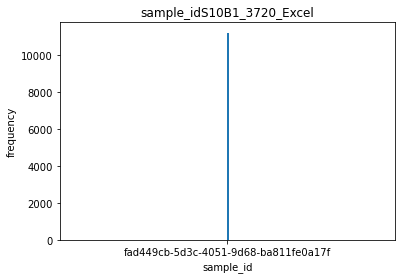

4
5


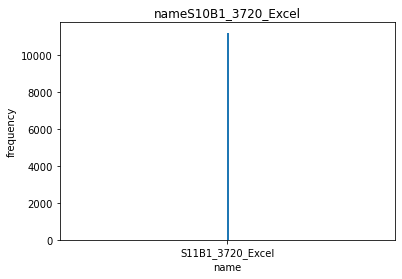

4
5


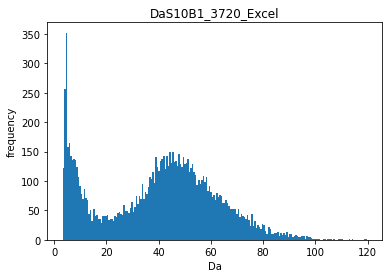

4
5


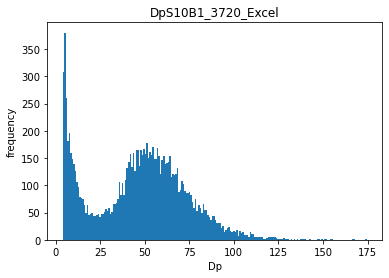

4
5


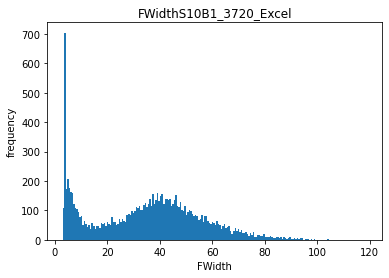

4
5


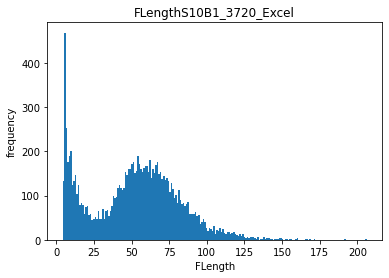

4
5


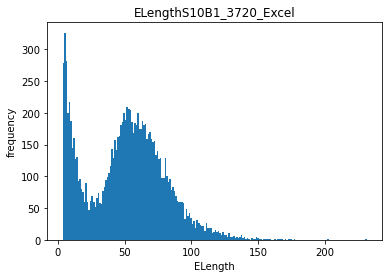

4
5


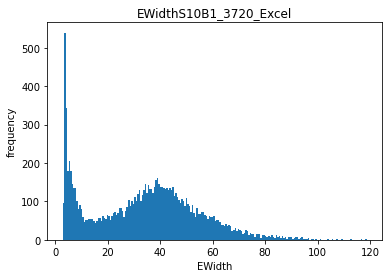

4
5


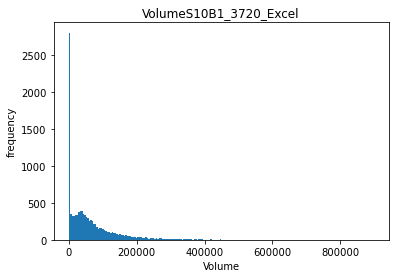

4
5


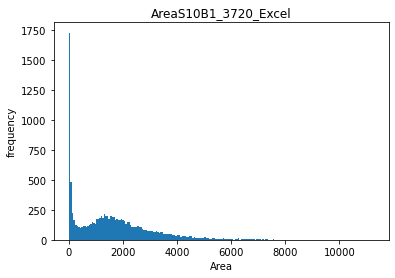

4
5


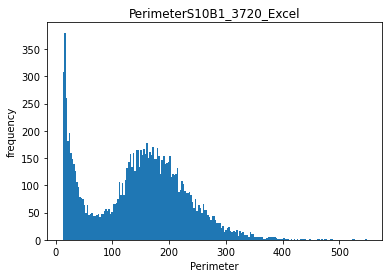

4
5


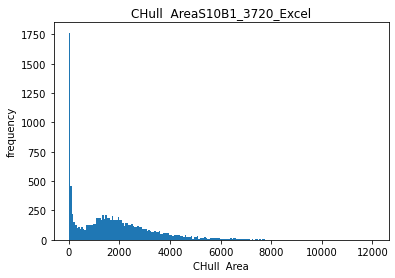

4
5


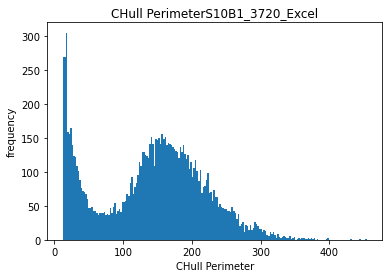

4
5


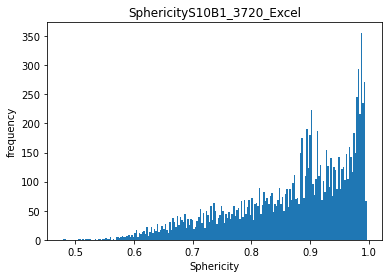

4
5


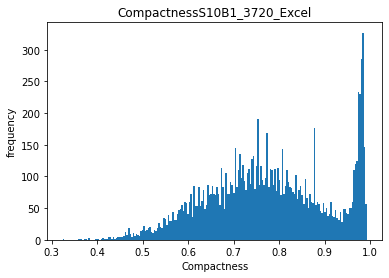

4
5


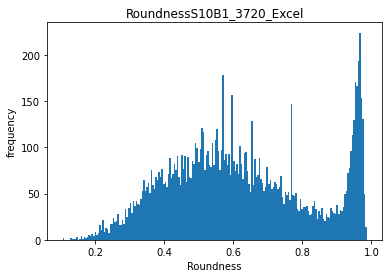

4
5


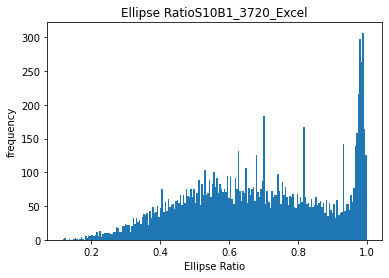

4
5


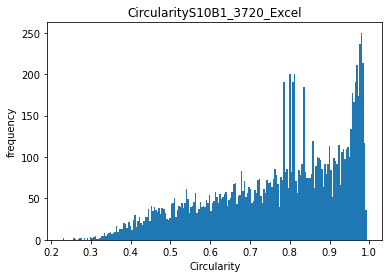

4
5


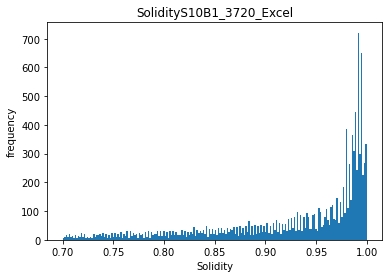

4
5


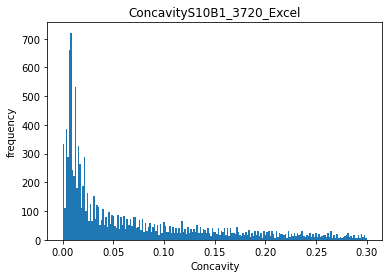

4
5


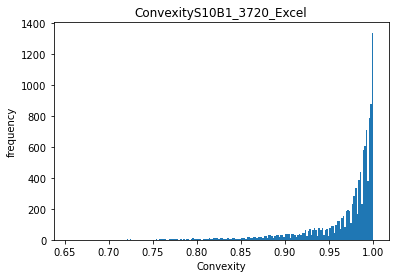

4
5


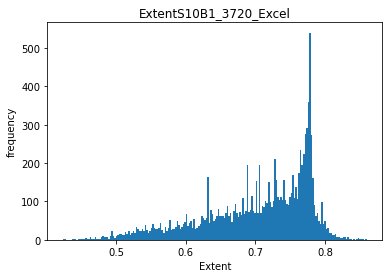

4
5


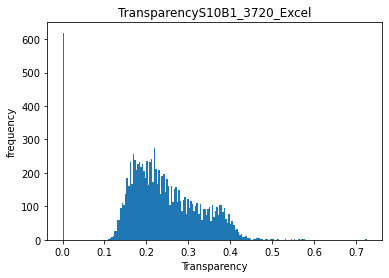

4
5


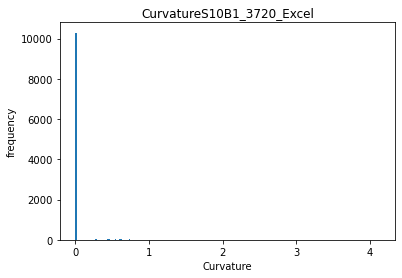

4
5


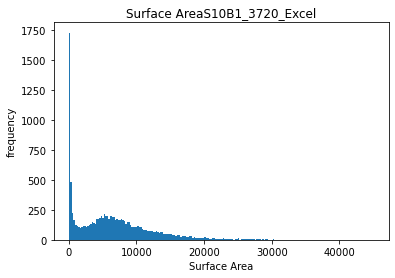

4
5


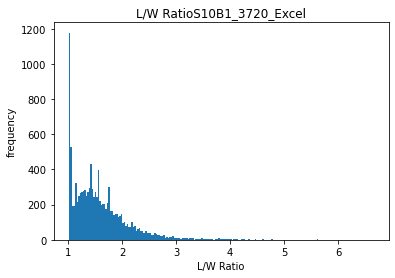

4
5


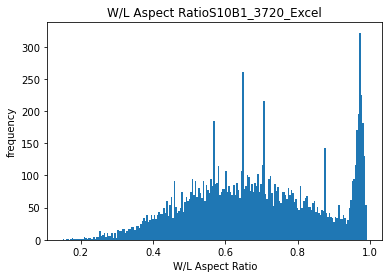

4
5


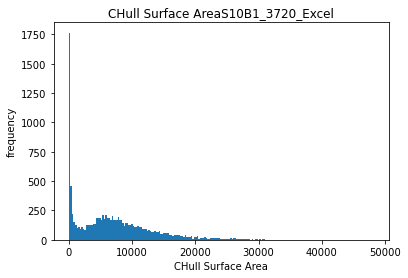

4
5


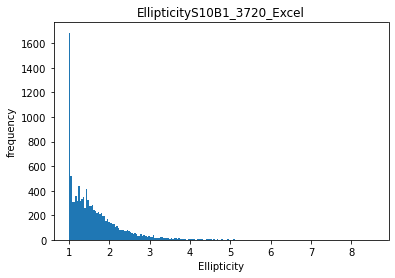

4
5


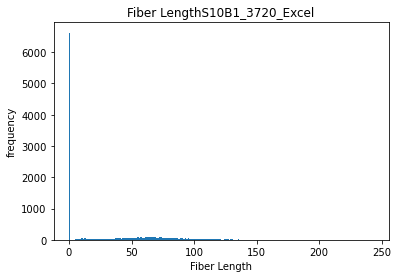

4
5


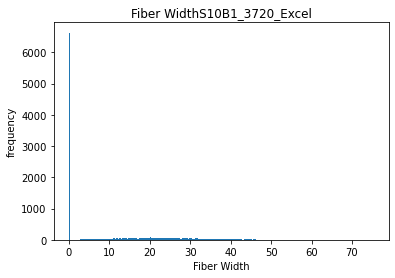

4
5


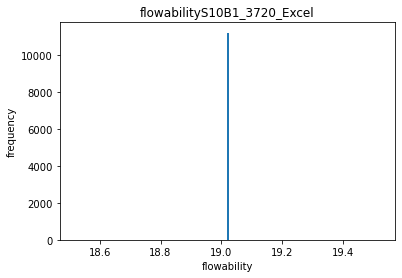

6
NAME:  S11B1_3720_Excel FLOW:                                     sample_id              name       Da  \
1042645  fad449cb-5d3c-4051-9d68-ba811fe0a17f  S11B1_3720_Excel  119.677   
1042646  fad449cb-5d3c-4051-9d68-ba811fe0a17f  S11B1_3720_Excel  118.932   
1042647  fad449cb-5d3c-4051-9d68-ba811fe0a17f  S11B1_3720_Excel  114.027   
1042648  fad449cb-5d3c-4051-9d68-ba811fe0a17f  S11B1_3720_Excel  109.910   
1042649  fad449cb-5d3c-4051-9d68-ba811fe0a17f  S11B1_3720_Excel  108.748   
...                                       ...               ...      ...   
1053858  fad449cb-5d3c-4051-9d68-ba811fe0a17f  S11B1_3720_Excel    4.229   
1053859  fad449cb-5d3c-4051-9d68-ba811fe0a17f  S11B1_3720_Excel    3.983   
1053860  fad449cb-5d3c-4051-9d68-ba811fe0a17f  S11B1_3720_Excel    3.757   
1053861  fad449cb-5d3c-4051-9d68-ba811fe0a17f  S11B1_3720_Excel    4.471   
1053862  fad449cb-5d3c-4051-9d68-ba811fe0a17f  S11B1_3720_Excel    3.846   

              Dp   FWidth  FLength  ELength   EWidth   

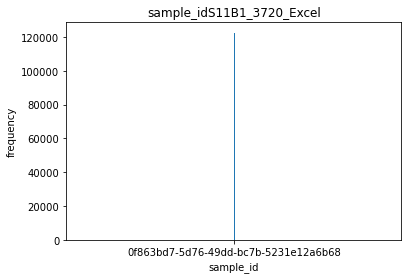

4
5


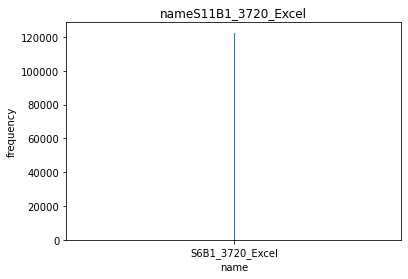

4
5


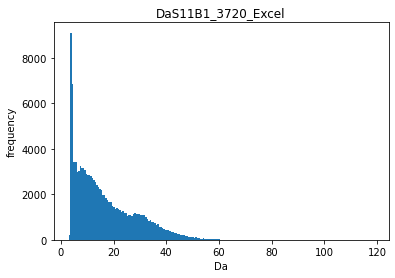

4
5


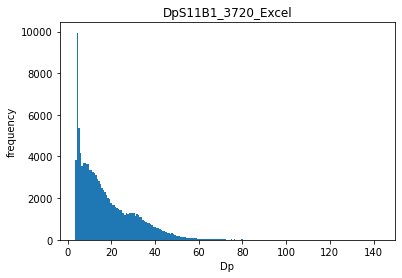

4
5


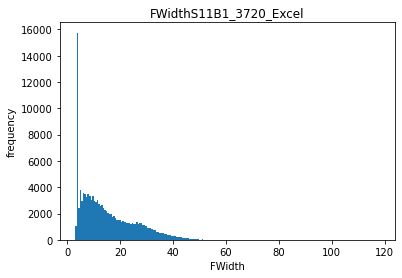

4
5


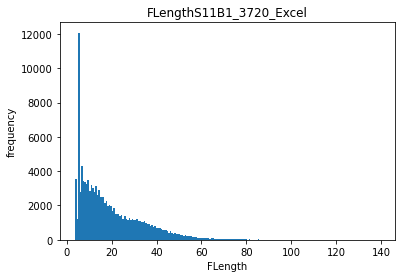

4
5


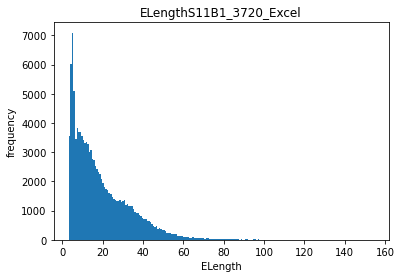

4
5


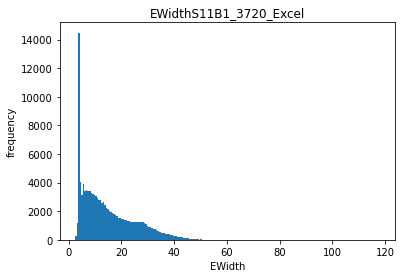

4
5


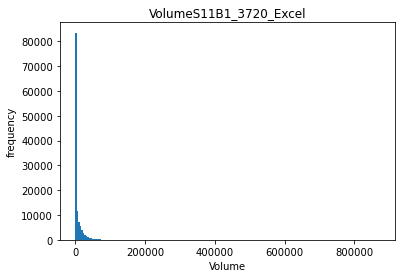

4
5


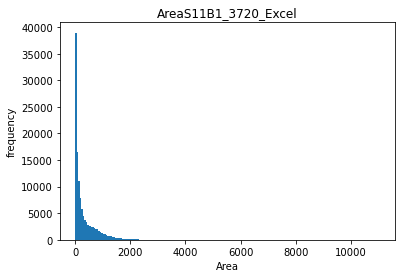

4
5


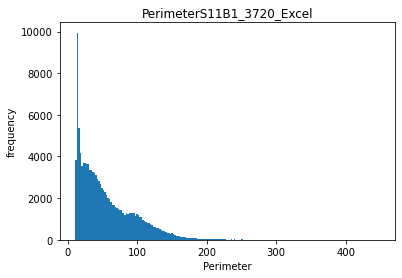

4
5


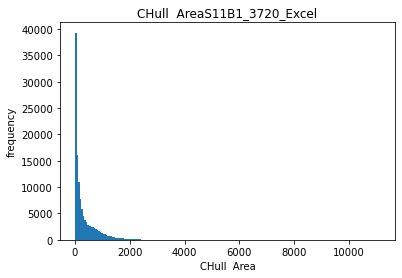

4
5


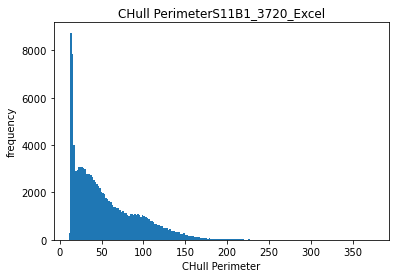

4
5


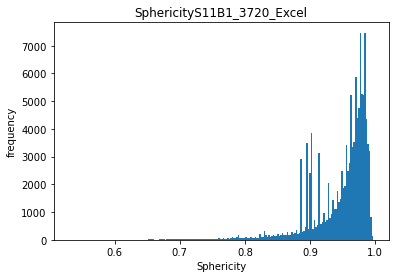

4
5


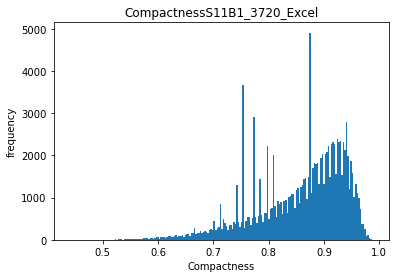

4
5


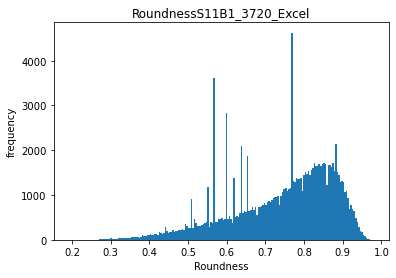

4
5


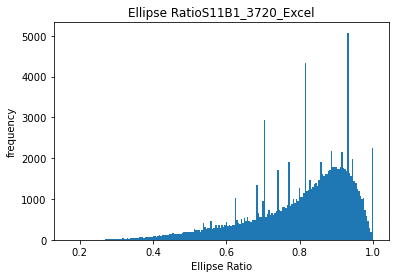

4
5


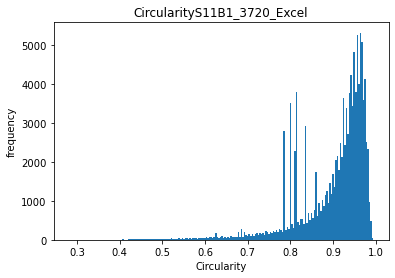

4
5


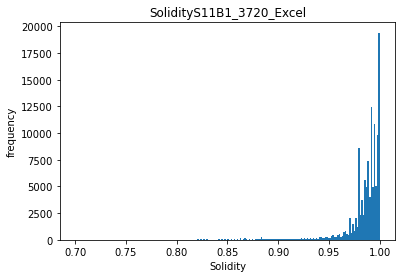

4
5


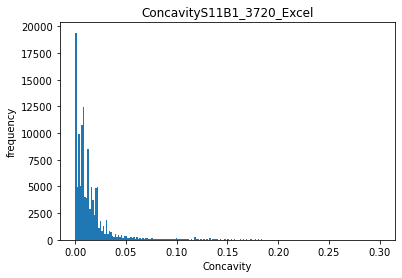

4
5


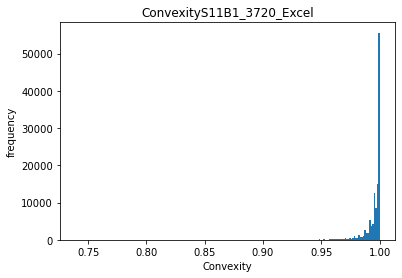

4
5


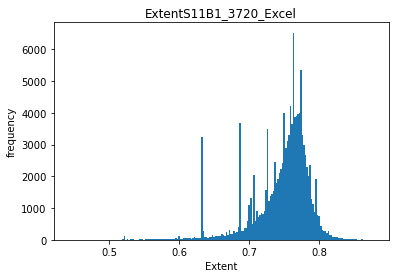

4
5


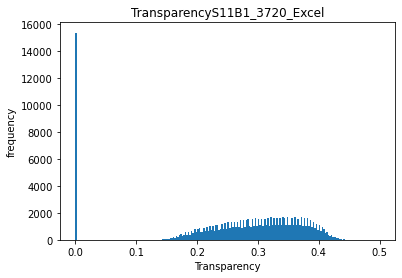

4
5


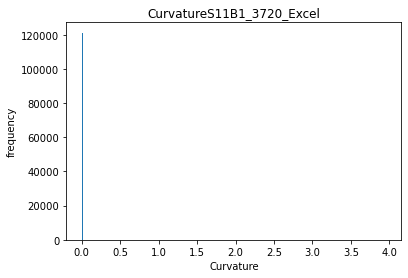

4
5


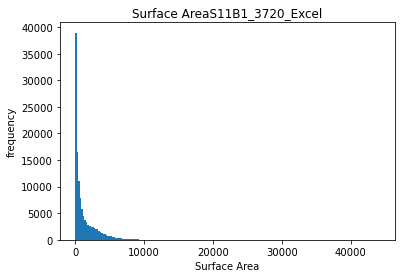

4
5


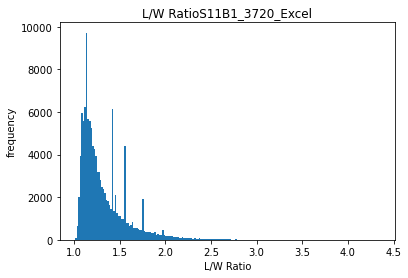

4
5


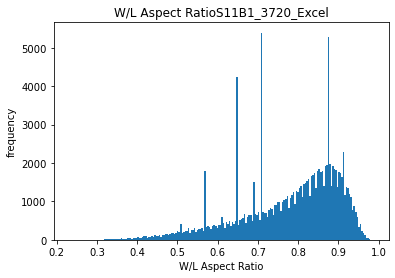

4
5


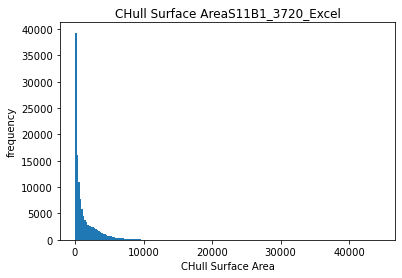

4
5


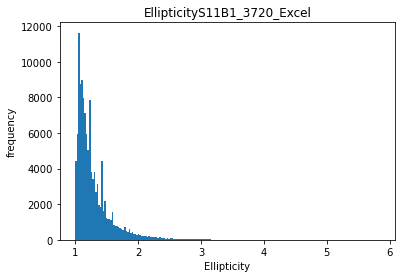

4
5


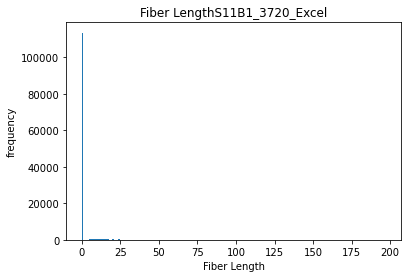

4
5


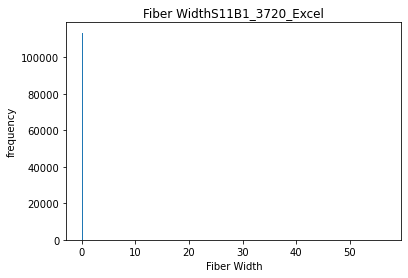

4
5


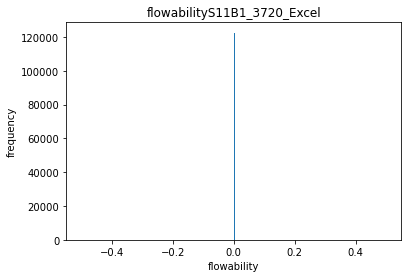

6
NAME:  S6B1_3720_Excel FLOW:                                     sample_id             name       Da  \
1053863  0f863bd7-5d76-49dd-bc7b-5231e12a6b68  S6B1_3720_Excel  118.574   
1053864  0f863bd7-5d76-49dd-bc7b-5231e12a6b68  S6B1_3720_Excel  107.707   
1053865  0f863bd7-5d76-49dd-bc7b-5231e12a6b68  S6B1_3720_Excel  103.976   
1053866  0f863bd7-5d76-49dd-bc7b-5231e12a6b68  S6B1_3720_Excel   96.755   
1053867  0f863bd7-5d76-49dd-bc7b-5231e12a6b68  S6B1_3720_Excel   98.163   
...                                       ...              ...      ...   
1176310  0f863bd7-5d76-49dd-bc7b-5231e12a6b68  S6B1_3720_Excel    3.617   
1176311  0f863bd7-5d76-49dd-bc7b-5231e12a6b68  S6B1_3720_Excel    3.504   
1176312  0f863bd7-5d76-49dd-bc7b-5231e12a6b68  S6B1_3720_Excel    3.891   
1176313  0f863bd7-5d76-49dd-bc7b-5231e12a6b68  S6B1_3720_Excel    3.368   
1176314  0f863bd7-5d76-49dd-bc7b-5231e12a6b68  S6B1_3720_Excel    3.333   

              Dp   FWidth  FLength  ELength   EWidth      Volume    

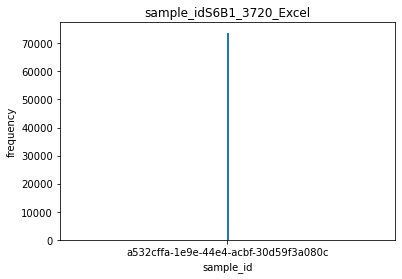

4
5


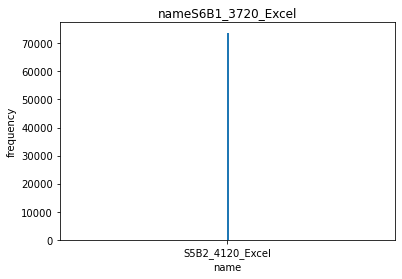

4
5


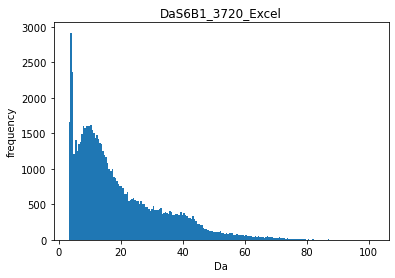

4
5


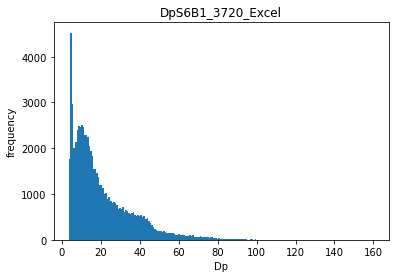

4
5


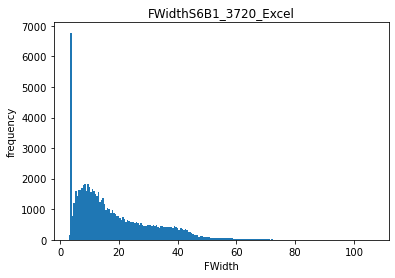

4
5


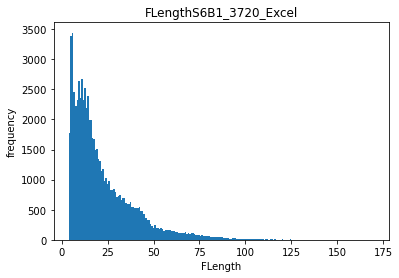

4
5


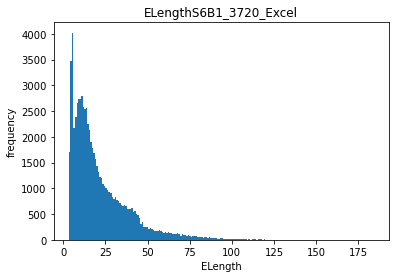

4
5


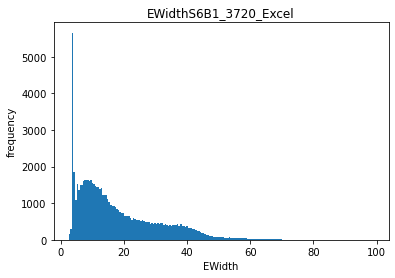

4
5


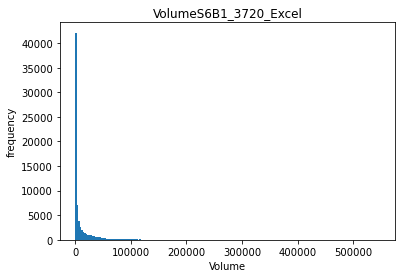

4
5


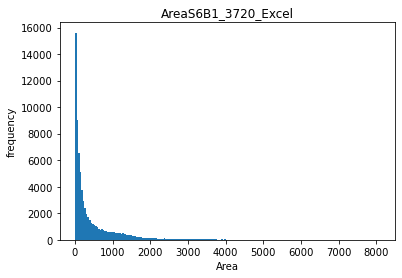

4
5


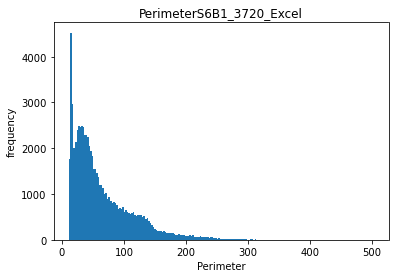

4
5


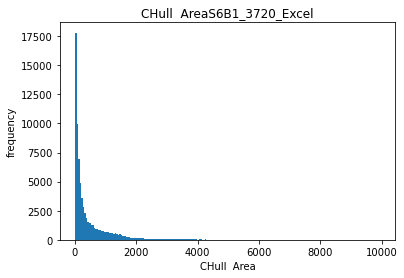

4
5


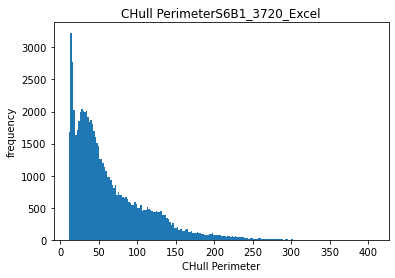

4
5


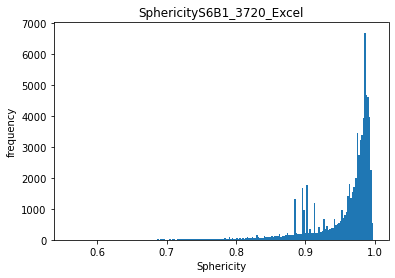

4
5


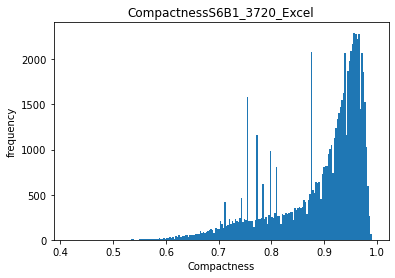

4
5


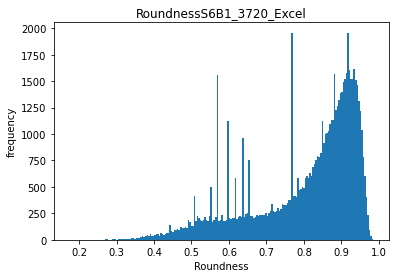

4
5


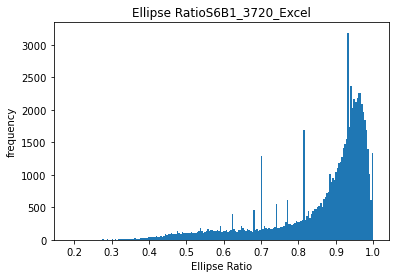

4
5


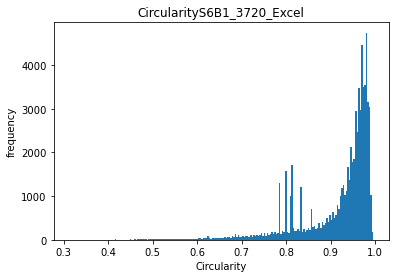

4
5


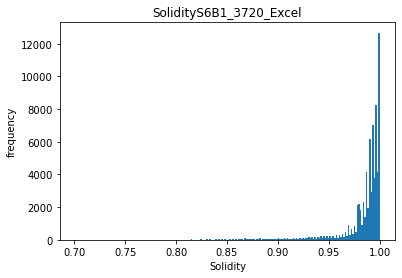

4
5


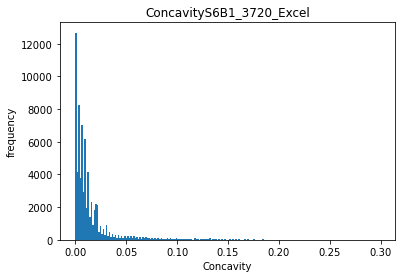

4
5


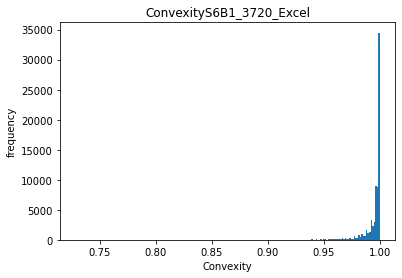

4
5


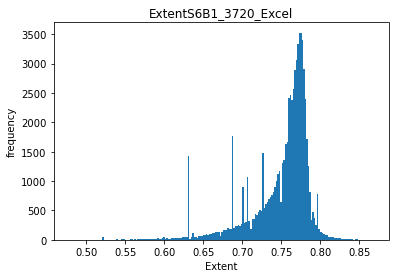

4
5


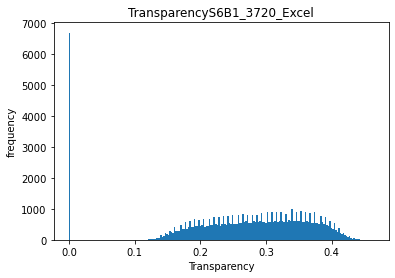

4
5


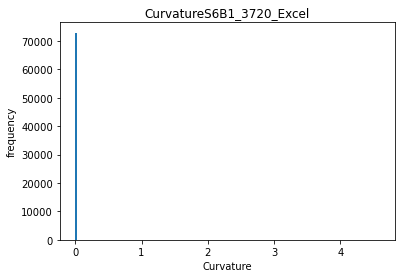

4
5


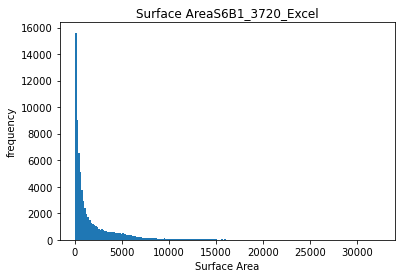

4
5


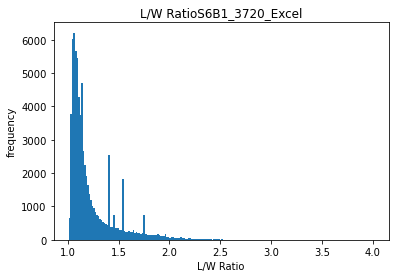

4
5


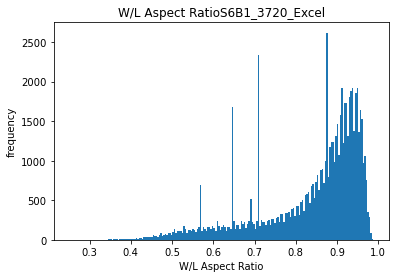

4
5


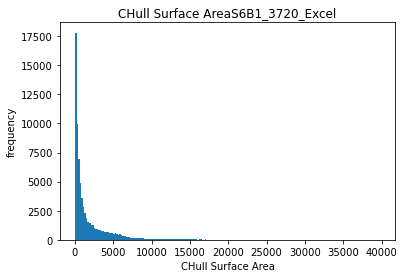

4
5


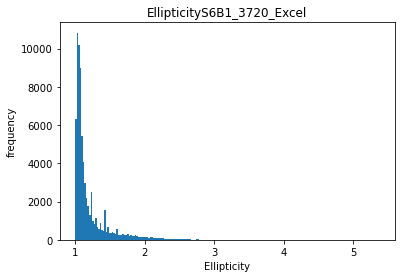

4
5


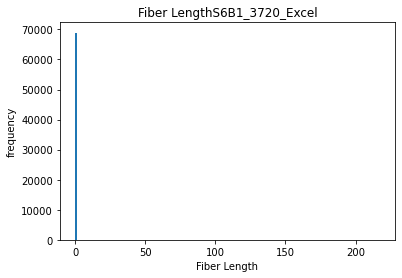

4
5


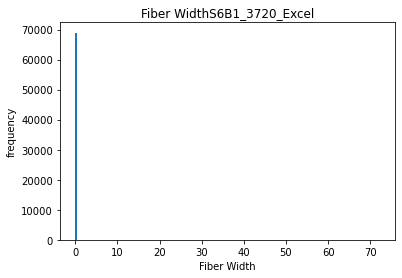

4
5


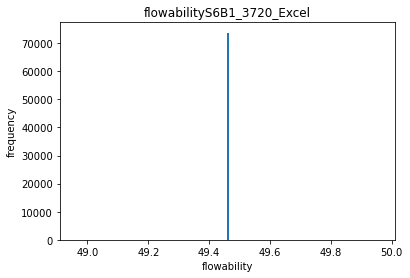

6
NAME:  S5B2_4120_Excel FLOW:                                     sample_id             name       Da  \
1176315  a532cffa-1e9e-44e4-acbf-30d59f3a080c  S5B2_4120_Excel  101.509   
1176316  a532cffa-1e9e-44e4-acbf-30d59f3a080c  S5B2_4120_Excel   94.763   
1176317  a532cffa-1e9e-44e4-acbf-30d59f3a080c  S5B2_4120_Excel   98.423   
1176318  a532cffa-1e9e-44e4-acbf-30d59f3a080c  S5B2_4120_Excel   94.128   
1176319  a532cffa-1e9e-44e4-acbf-30d59f3a080c  S5B2_4120_Excel   88.523   
...                                       ...              ...      ...   
1250037  a532cffa-1e9e-44e4-acbf-30d59f3a080c  S5B2_4120_Excel    3.491   
1250038  a532cffa-1e9e-44e4-acbf-30d59f3a080c  S5B2_4120_Excel    3.457   
1250039  a532cffa-1e9e-44e4-acbf-30d59f3a080c  S5B2_4120_Excel    3.371   
1250040  a532cffa-1e9e-44e4-acbf-30d59f3a080c  S5B2_4120_Excel    3.290   
1250041  a532cffa-1e9e-44e4-acbf-30d59f3a080c  S5B2_4120_Excel    3.497   

              Dp   FWidth  FLength  ELength  EWidth      Volume     

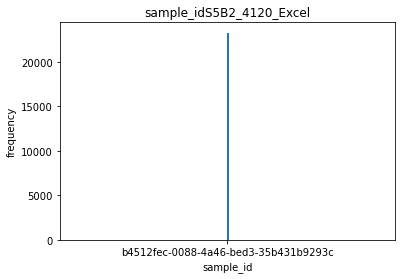

4
5


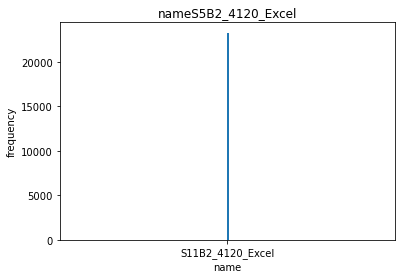

4
5


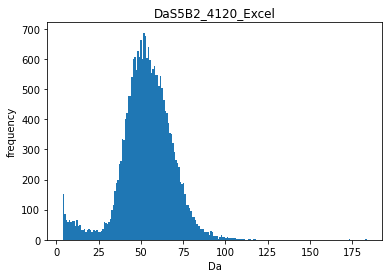

4
5


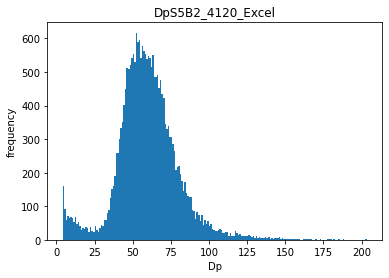

4
5


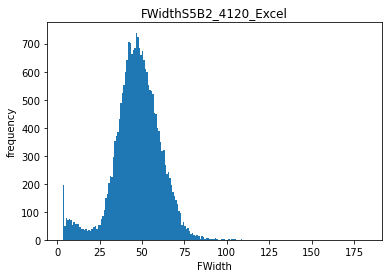

4
5


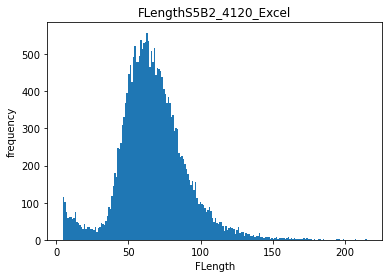

4
5


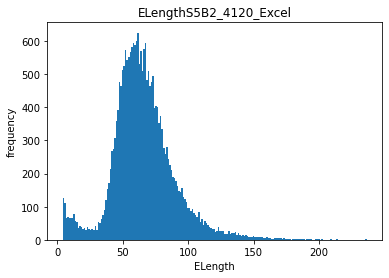

4
5


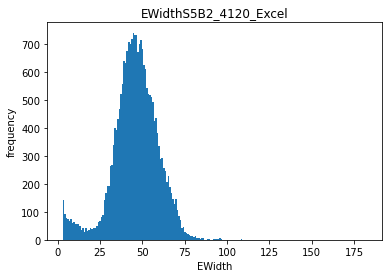

4
5


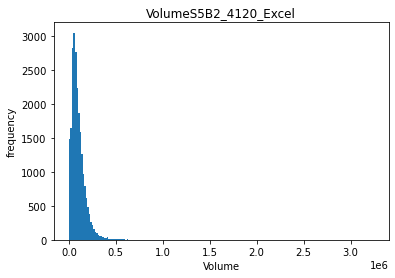

4
5


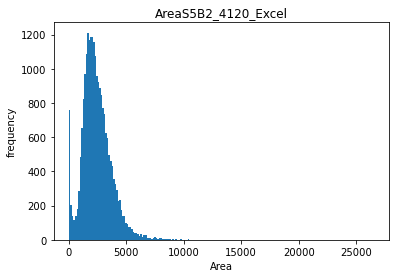

4
5


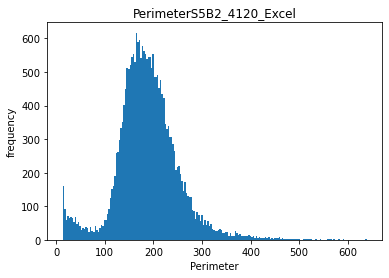

4
5


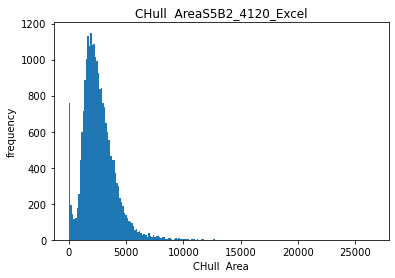

4
5


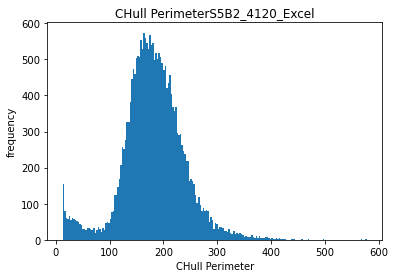

4
5


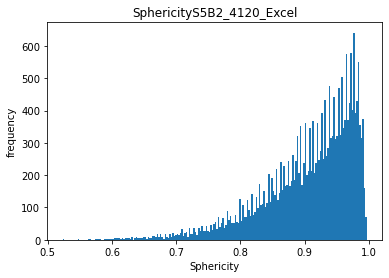

4
5


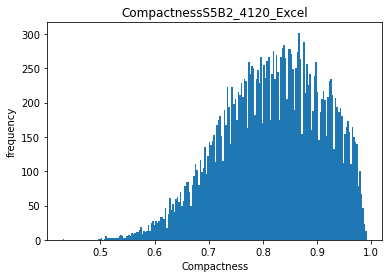

4
5


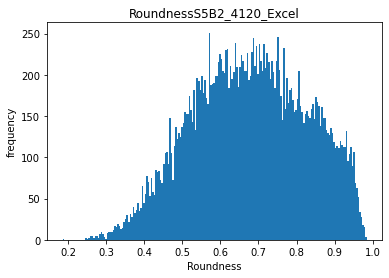

4
5


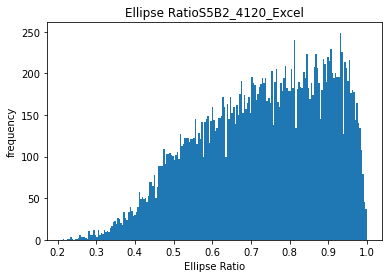

4
5


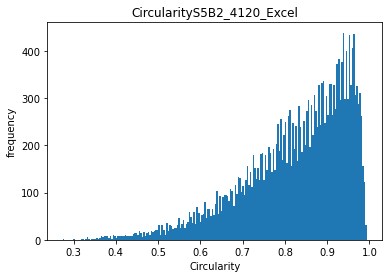

4
5


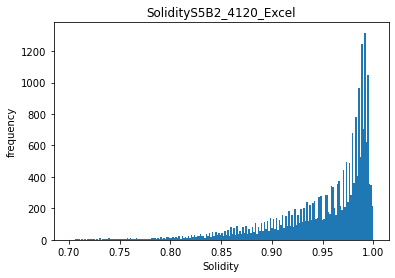

4
5


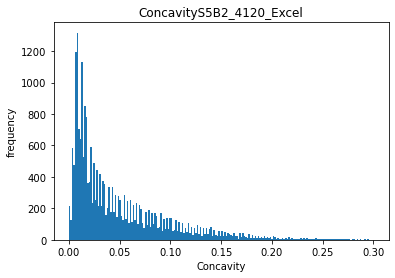

4
5


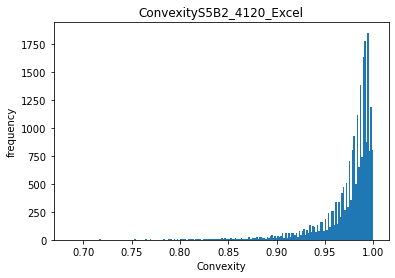

4
5


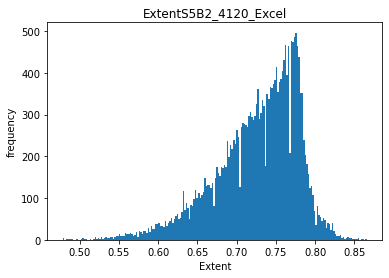

4
5


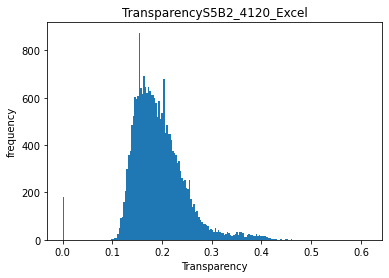

4
5


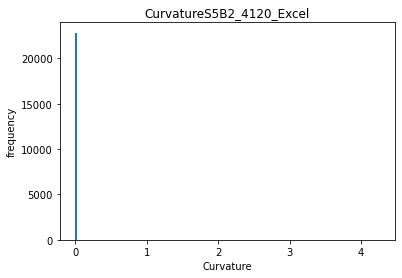

4
5


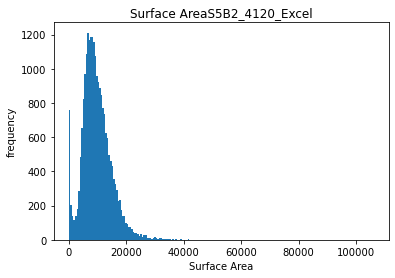

4
5


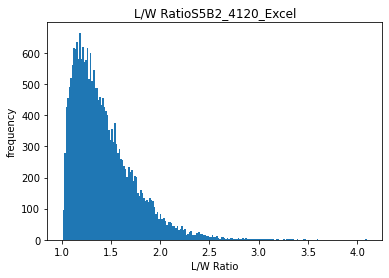

4
5


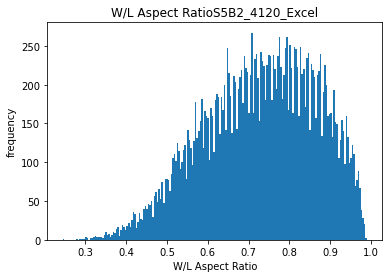

4
5


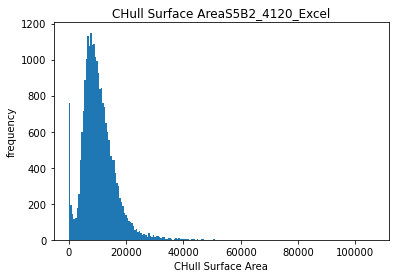

4
5


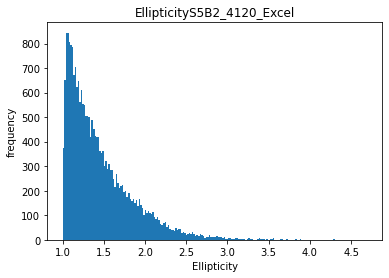

4
5


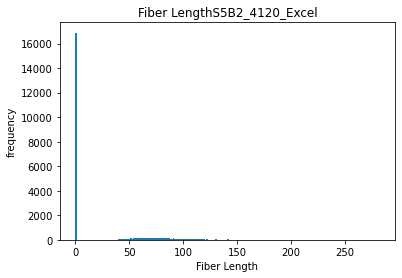

4
5


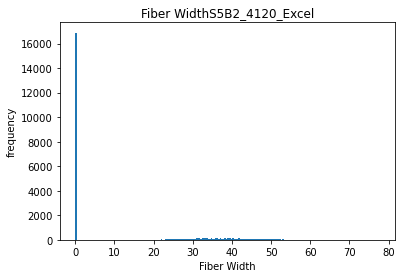

4
5


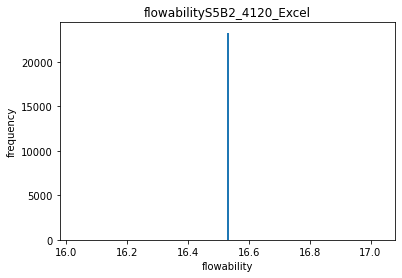

6
NAME:  S11B2_4120_Excel FLOW:                                     sample_id              name       Da  \
1250042  b4512fec-0088-4a46-bed3-35b431b9293c  S11B2_4120_Excel  183.613   
1250043  b4512fec-0088-4a46-bed3-35b431b9293c  S11B2_4120_Excel  173.515   
1250044  b4512fec-0088-4a46-bed3-35b431b9293c  S11B2_4120_Excel  102.579   
1250045  b4512fec-0088-4a46-bed3-35b431b9293c  S11B2_4120_Excel   95.641   
1250046  b4512fec-0088-4a46-bed3-35b431b9293c  S11B2_4120_Excel   97.311   
...                                       ...               ...      ...   
1273315  b4512fec-0088-4a46-bed3-35b431b9293c  S11B2_4120_Excel    5.534   
1273316  b4512fec-0088-4a46-bed3-35b431b9293c  S11B2_4120_Excel    3.949   
1273317  b4512fec-0088-4a46-bed3-35b431b9293c  S11B2_4120_Excel    3.955   
1273318  b4512fec-0088-4a46-bed3-35b431b9293c  S11B2_4120_Excel    4.565   
1273319  b4512fec-0088-4a46-bed3-35b431b9293c  S11B2_4120_Excel    3.970   

              Dp   FWidth  FLength  ELength   EWidth   

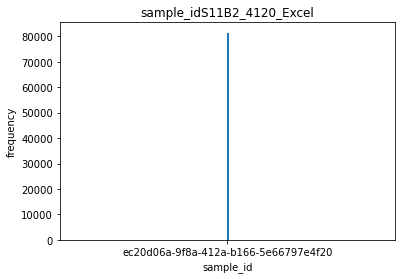

4
5


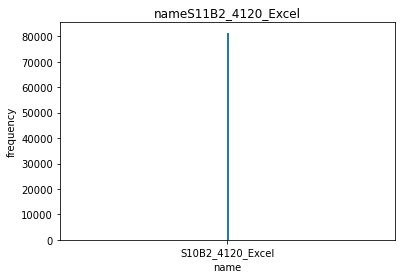

4
5


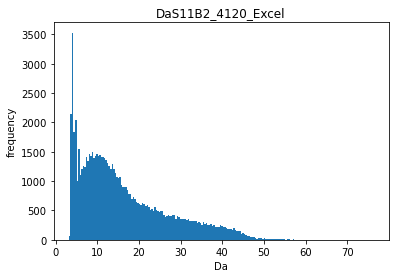

4
5


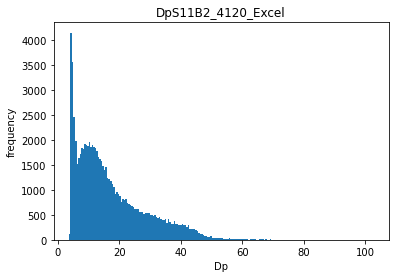

4
5


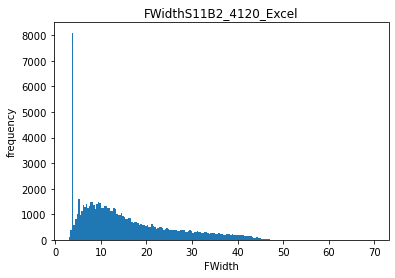

4
5


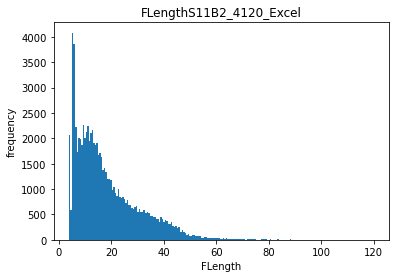

4
5


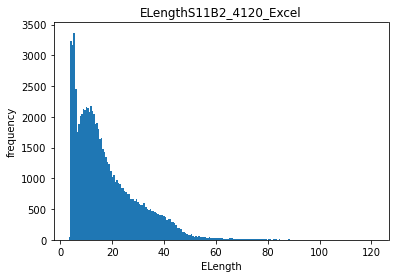

4
5


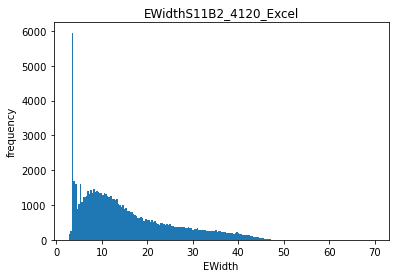

4
5


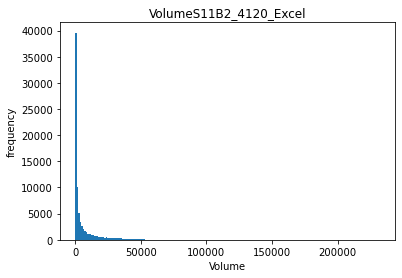

4
5


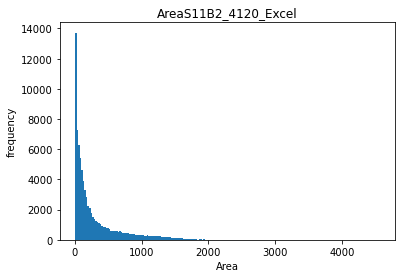

4
5


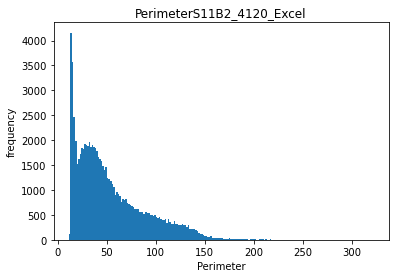

4
5


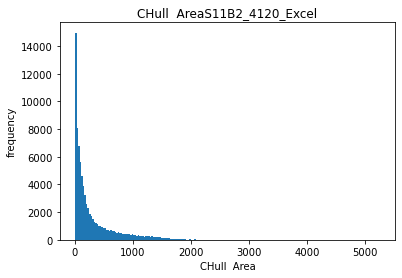

4
5


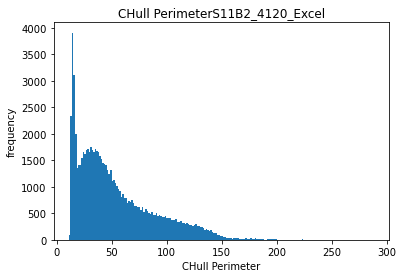

4
5


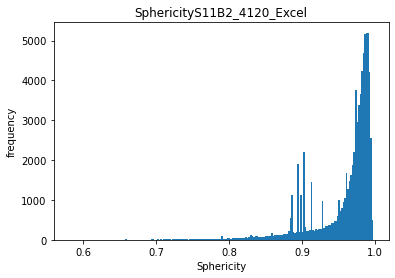

4
5


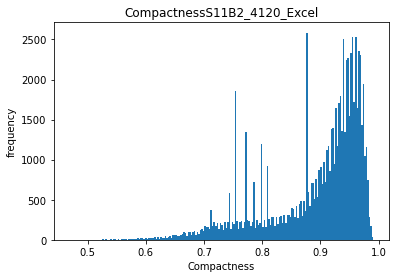

4
5


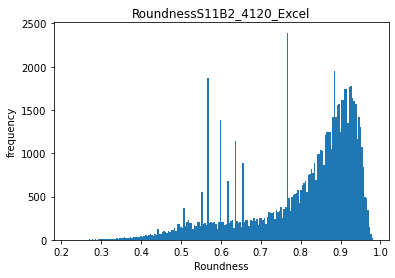

4
5


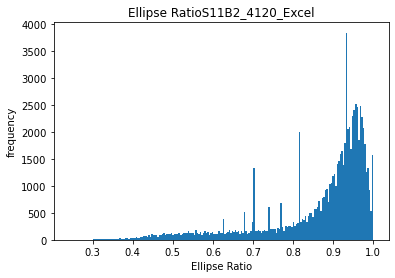

4
5


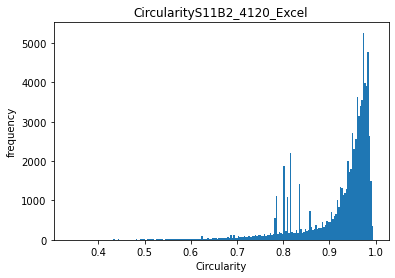

4
5


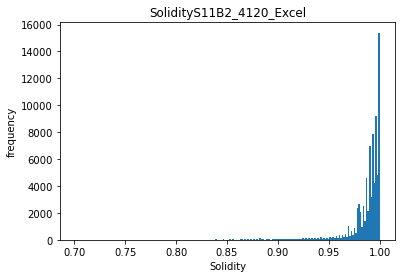

4
5


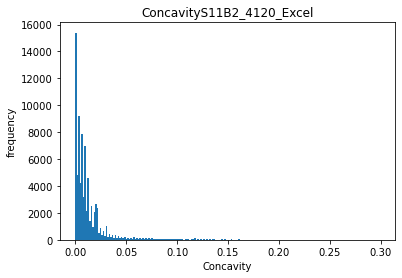

4
5


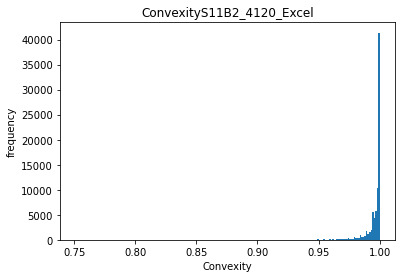

4
5


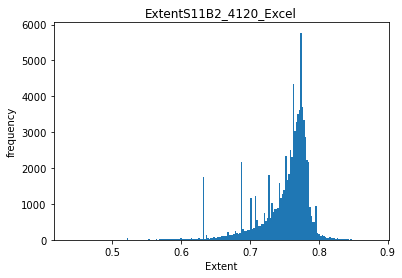

4
5


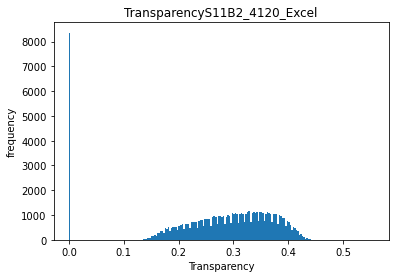

4
5


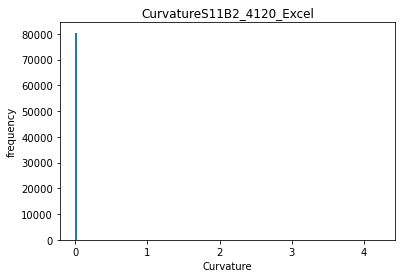

4
5


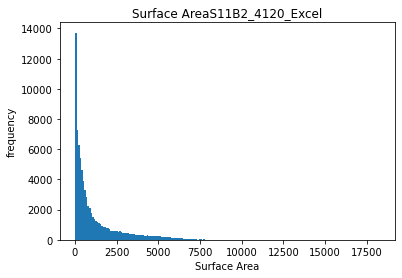

4
5


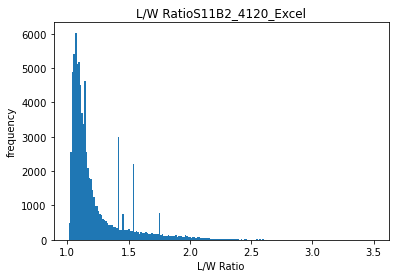

4
5


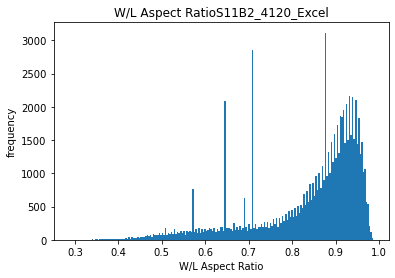

4
5


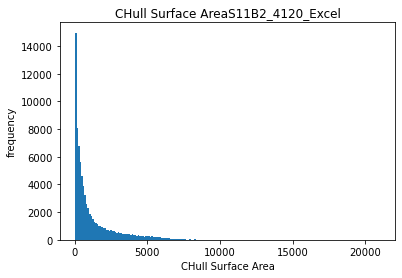

4
5


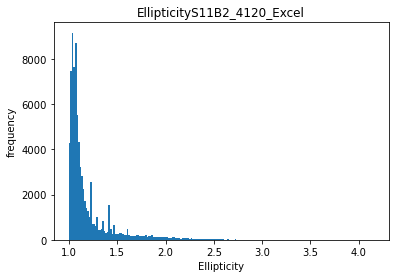

4
5


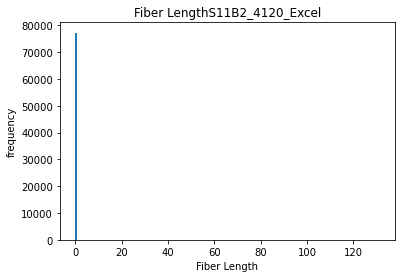

4
5


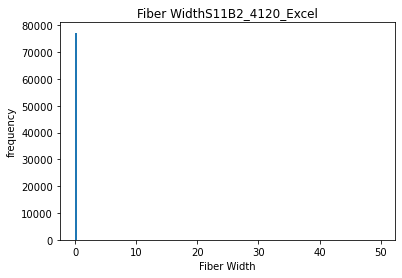

4
5


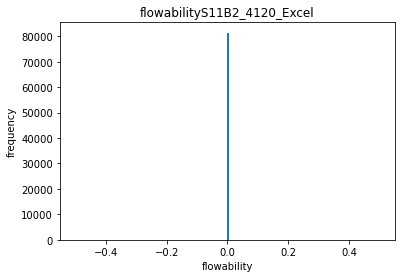

6
NAME:  S10B2_4120_Excel FLOW:                                     sample_id              name      Da  \
1273320  ec20d06a-9f8a-412a-b166-5e66797e4f20  S10B2_4120_Excel  71.090   
1273321  ec20d06a-9f8a-412a-b166-5e66797e4f20  S10B2_4120_Excel  69.310   
1273322  ec20d06a-9f8a-412a-b166-5e66797e4f20  S10B2_4120_Excel  62.334   
1273323  ec20d06a-9f8a-412a-b166-5e66797e4f20  S10B2_4120_Excel  68.133   
1273324  ec20d06a-9f8a-412a-b166-5e66797e4f20  S10B2_4120_Excel  76.237   
...                                       ...               ...     ...   
1354704  ec20d06a-9f8a-412a-b166-5e66797e4f20  S10B2_4120_Excel   3.610   
1354705  ec20d06a-9f8a-412a-b166-5e66797e4f20  S10B2_4120_Excel   3.579   
1354706  ec20d06a-9f8a-412a-b166-5e66797e4f20  S10B2_4120_Excel   3.413   
1354707  ec20d06a-9f8a-412a-b166-5e66797e4f20  S10B2_4120_Excel   3.618   
1354708  ec20d06a-9f8a-412a-b166-5e66797e4f20  S10B2_4120_Excel   4.195   

             Dp  FWidth  FLength  ELength  EWidth      Volume      

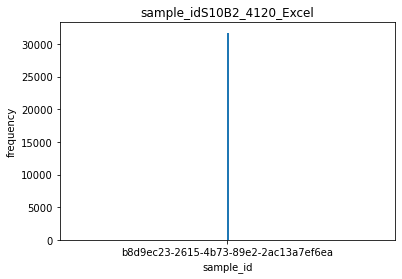

4
5


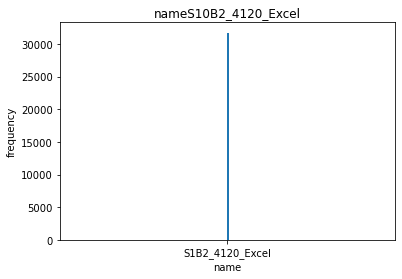

4
5


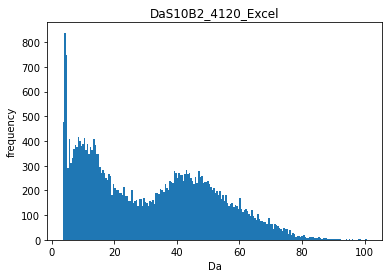

4
5


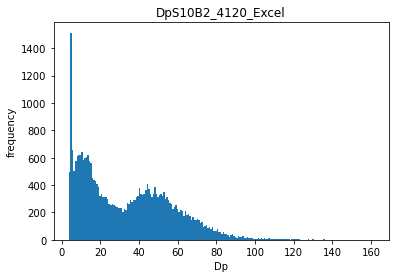

4
5


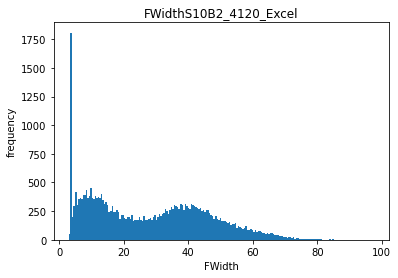

4
5


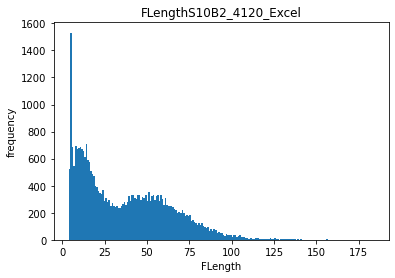

4
5


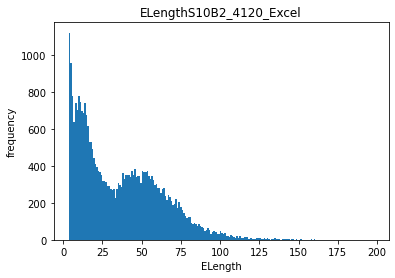

4
5


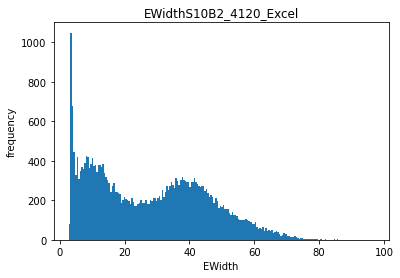

4
5


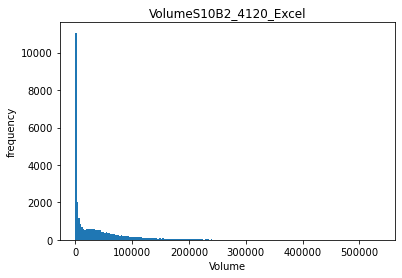

4
5


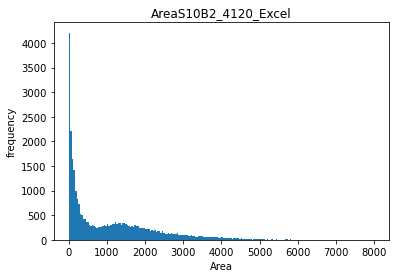

4
5


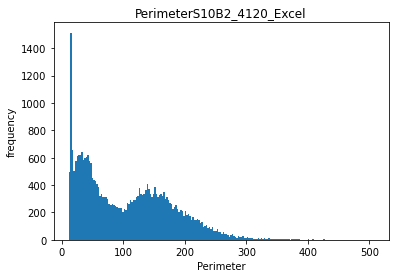

4
5


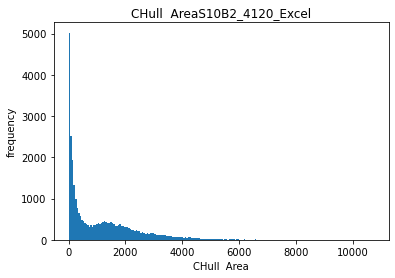

4
5


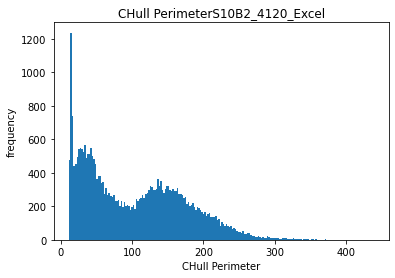

4
5


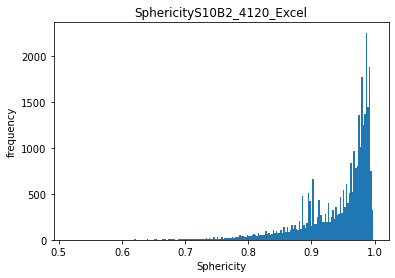

4
5


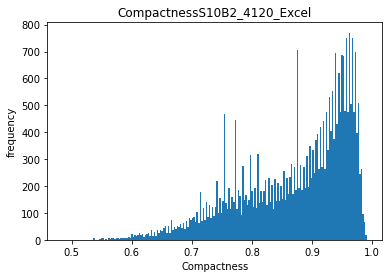

4
5


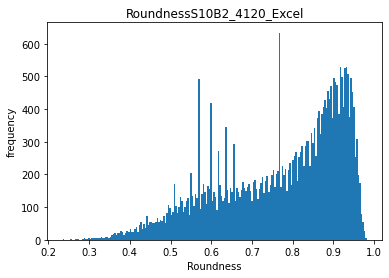

4
5


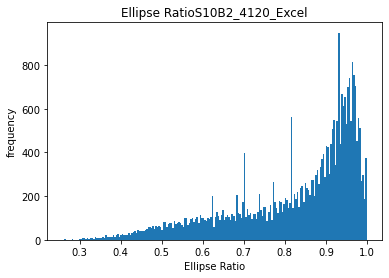

4
5


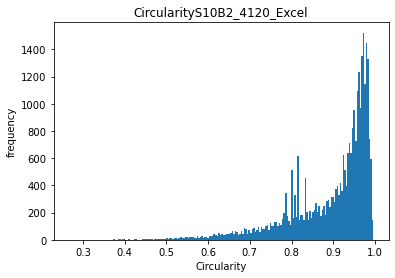

4
5


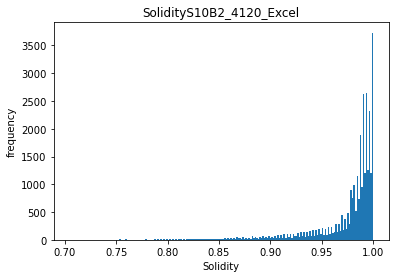

4
5


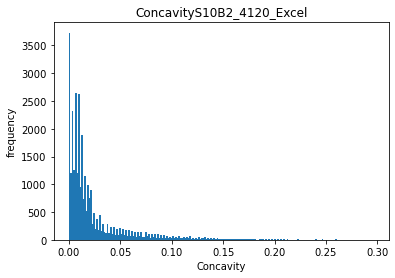

4
5


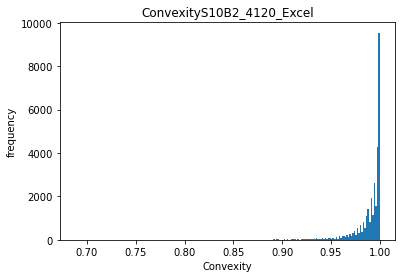

4
5


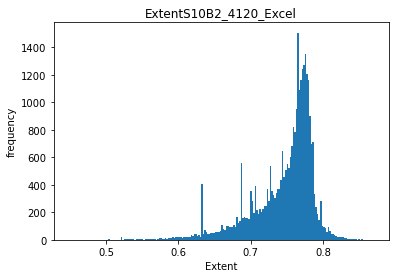

4
5


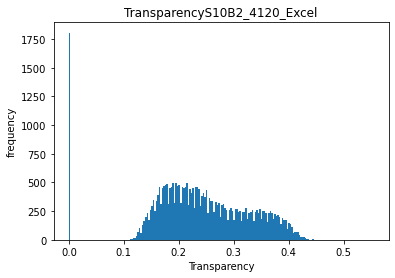

4
5


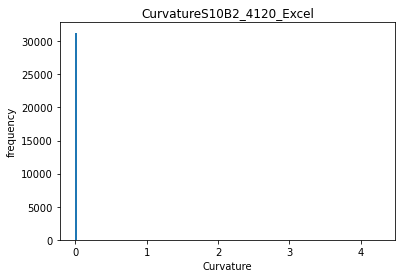

4
5


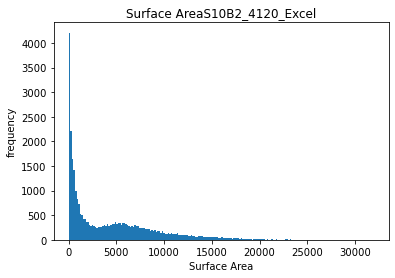

4
5


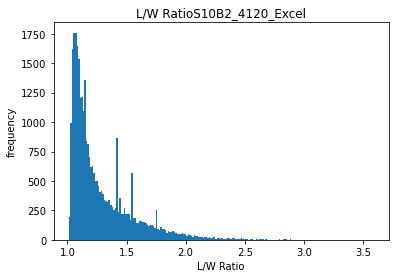

4
5


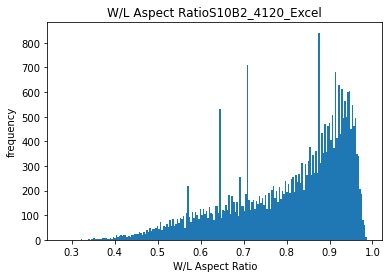

4
5


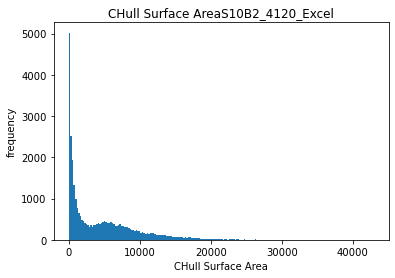

4
5


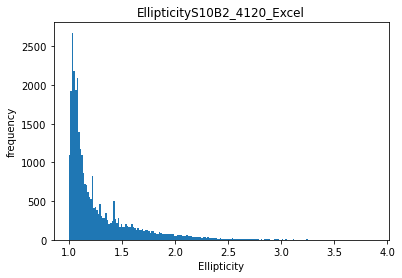

4
5


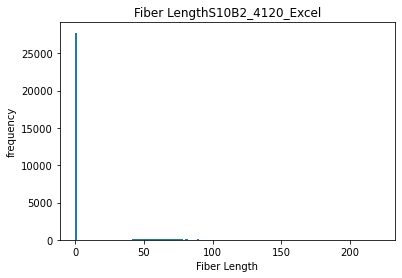

4
5


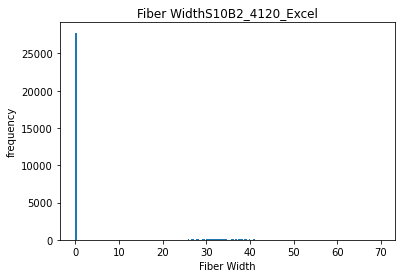

4
5


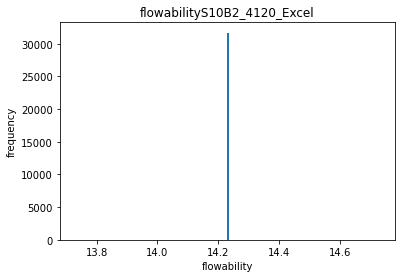

6
NAME:  S1B2_4120_Excel FLOW:                                     sample_id             name      Da  \
1354709  b8d9ec23-2615-4b73-89e2-2ac13a7ef6ea  S1B2_4120_Excel  99.649   
1354710  b8d9ec23-2615-4b73-89e2-2ac13a7ef6ea  S1B2_4120_Excel  98.485   
1354711  b8d9ec23-2615-4b73-89e2-2ac13a7ef6ea  S1B2_4120_Excel  92.089   
1354712  b8d9ec23-2615-4b73-89e2-2ac13a7ef6ea  S1B2_4120_Excel  87.683   
1354713  b8d9ec23-2615-4b73-89e2-2ac13a7ef6ea  S1B2_4120_Excel  90.634   
...                                       ...              ...     ...   
1386394  b8d9ec23-2615-4b73-89e2-2ac13a7ef6ea  S1B2_4120_Excel   3.648   
1386395  b8d9ec23-2615-4b73-89e2-2ac13a7ef6ea  S1B2_4120_Excel   3.517   
1386396  b8d9ec23-2615-4b73-89e2-2ac13a7ef6ea  S1B2_4120_Excel   3.777   
1386397  b8d9ec23-2615-4b73-89e2-2ac13a7ef6ea  S1B2_4120_Excel   3.840   
1386398  b8d9ec23-2615-4b73-89e2-2ac13a7ef6ea  S1B2_4120_Excel   3.476   

              Dp  FWidth  FLength  ELength  EWidth      Volume      Area  ...  \

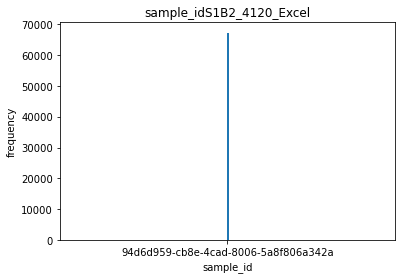

4
5


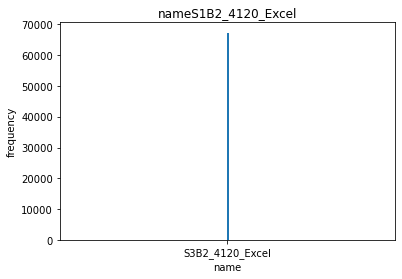

4
5


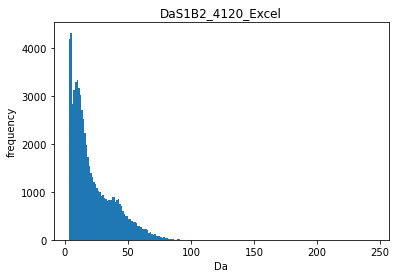

4
5


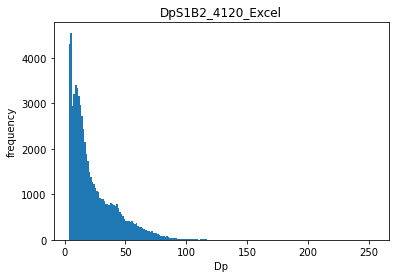

4
5


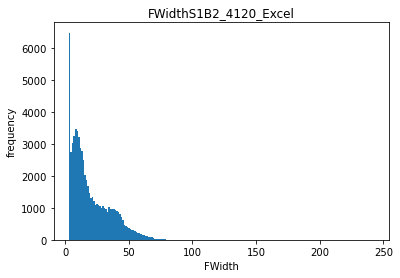

4
5


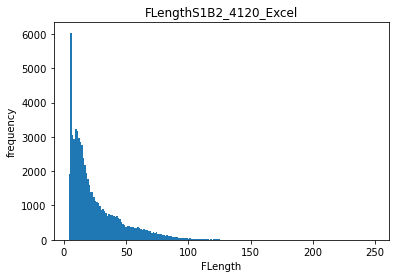

4
5


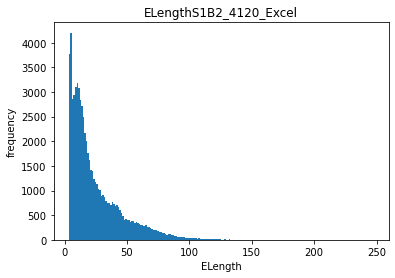

4
5


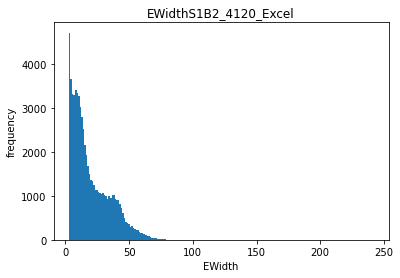

4
5


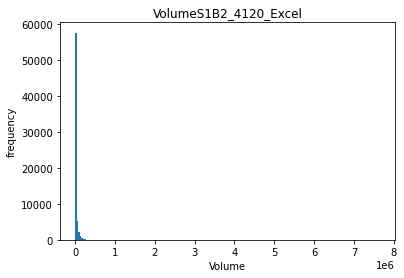

4
5


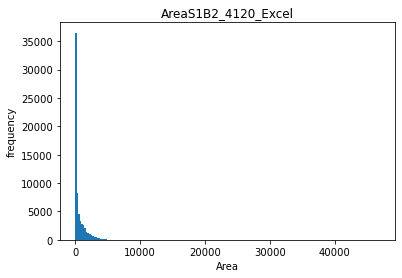

4
5


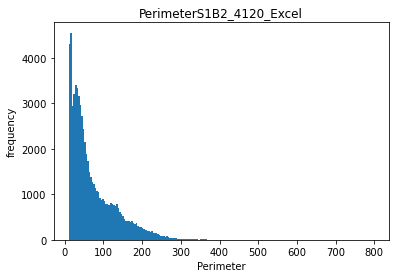

4
5


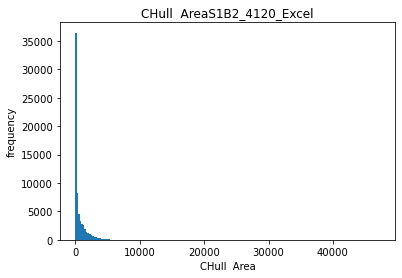

4
5


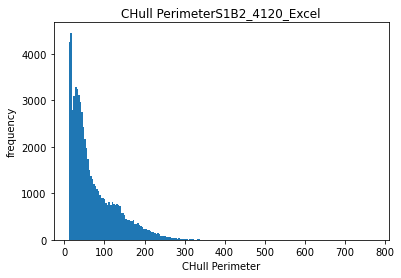

4
5


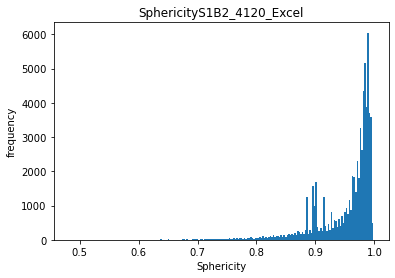

4
5


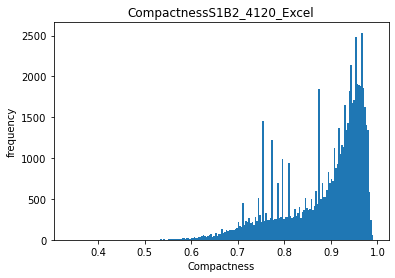

4
5


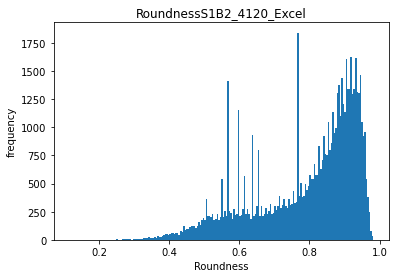

4
5


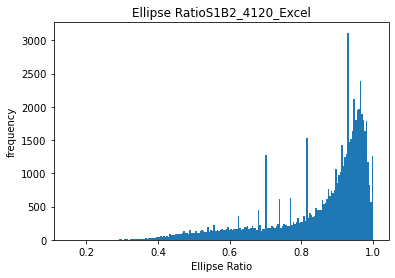

4
5


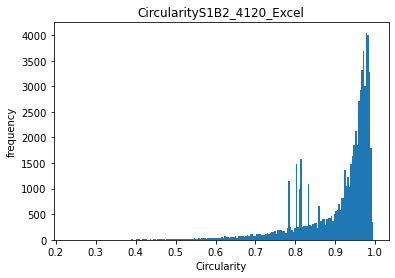

4
5


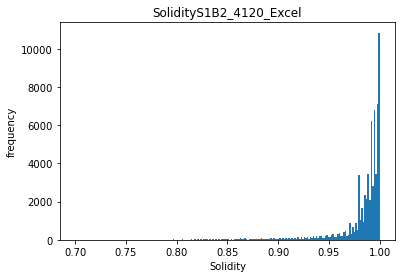

4
5


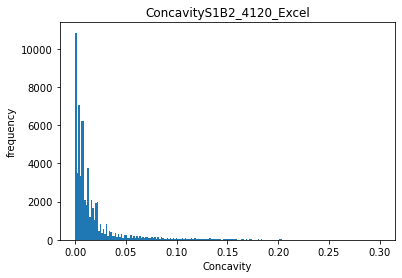

4
5


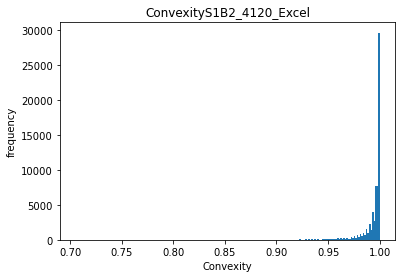

4
5


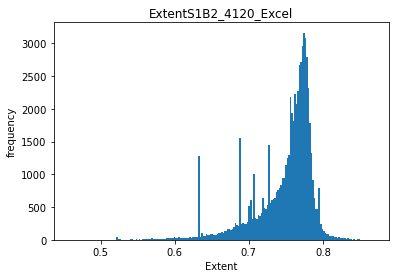

4
5


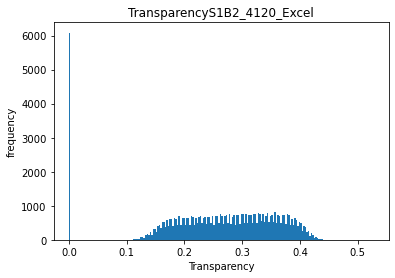

4
5


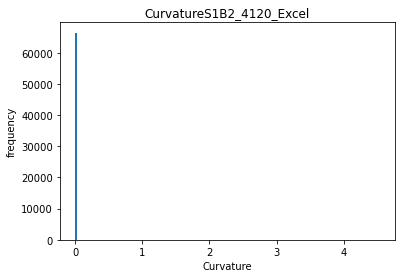

4
5


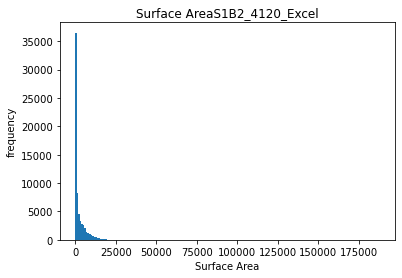

4
5


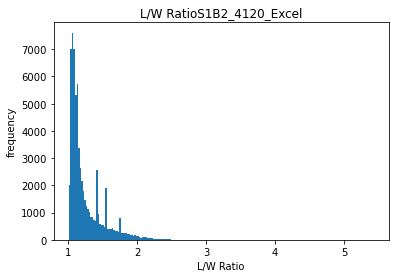

4
5


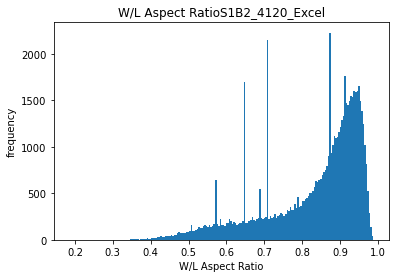

4
5


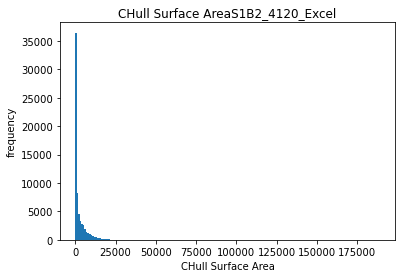

4
5


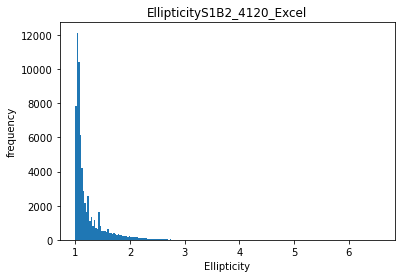

4
5


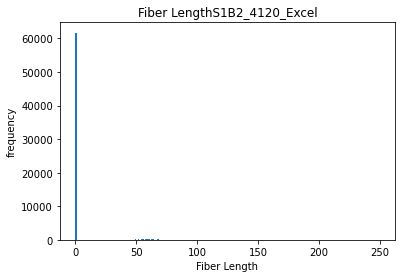

4
5


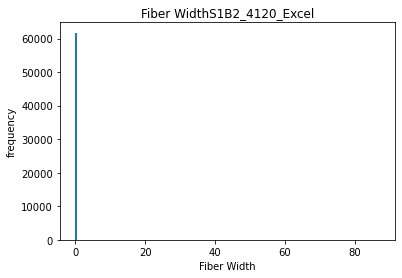

4
5


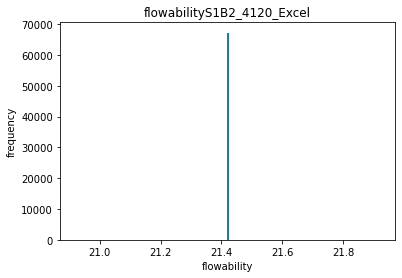

6
NAME:  S3B2_4120_Excel FLOW:                                     sample_id             name       Da  \
1386399  94d6d959-cb8e-4cad-8006-5a8f806a342a  S3B2_4120_Excel  244.440   
1386400  94d6d959-cb8e-4cad-8006-5a8f806a342a  S3B2_4120_Excel  194.071   
1386401  94d6d959-cb8e-4cad-8006-5a8f806a342a  S3B2_4120_Excel  182.943   
1386402  94d6d959-cb8e-4cad-8006-5a8f806a342a  S3B2_4120_Excel  161.192   
1386403  94d6d959-cb8e-4cad-8006-5a8f806a342a  S3B2_4120_Excel  159.245   
...                                       ...              ...      ...   
1453660  94d6d959-cb8e-4cad-8006-5a8f806a342a  S3B2_4120_Excel    4.062   
1453661  94d6d959-cb8e-4cad-8006-5a8f806a342a  S3B2_4120_Excel    4.117   
1453662  94d6d959-cb8e-4cad-8006-5a8f806a342a  S3B2_4120_Excel    3.238   
1453663  94d6d959-cb8e-4cad-8006-5a8f806a342a  S3B2_4120_Excel    3.699   
1453664  94d6d959-cb8e-4cad-8006-5a8f806a342a  S3B2_4120_Excel    4.474   

              Dp   FWidth  FLength  ELength   EWidth       Volume   

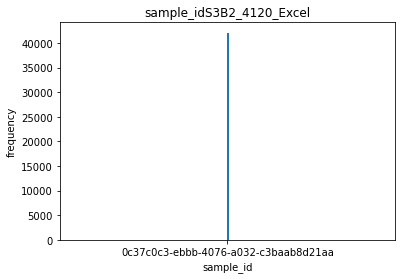

4
5


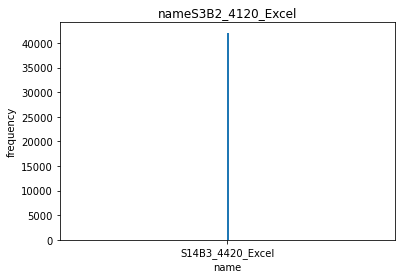

4
5


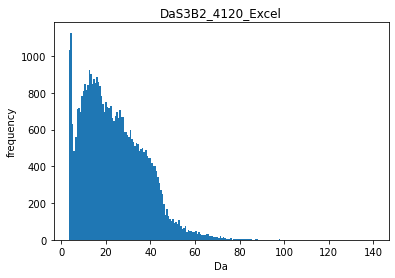

4
5


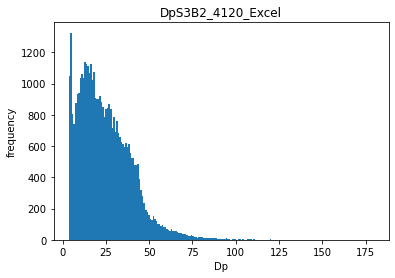

4
5


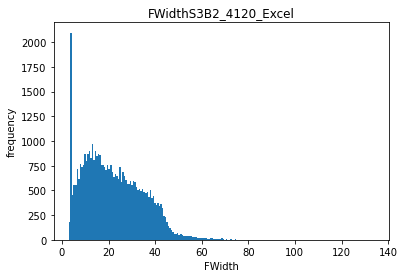

4
5


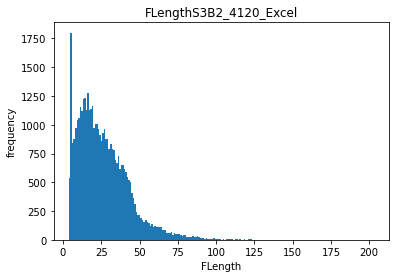

4
5


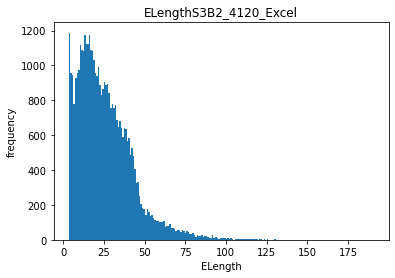

4
5


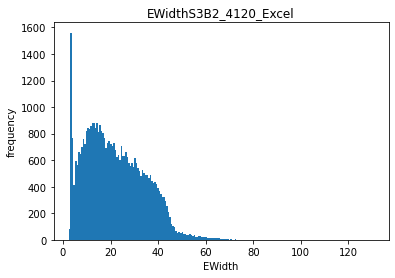

4
5


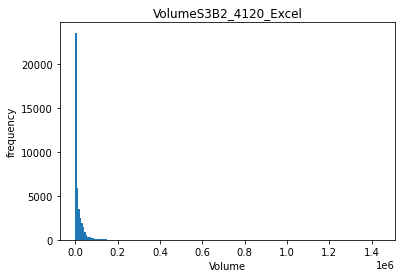

4
5


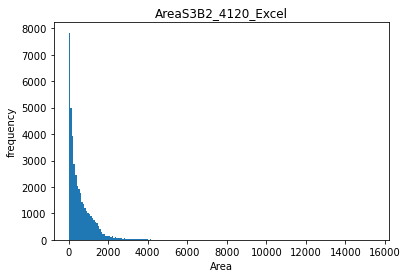

4
5


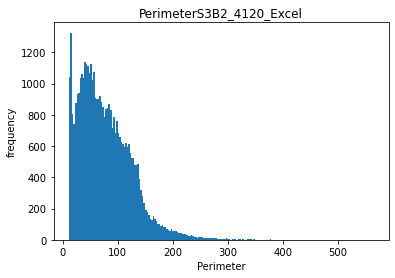

4
5


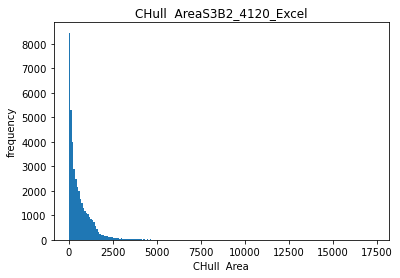

4
5


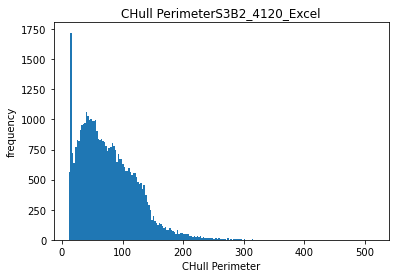

4
5


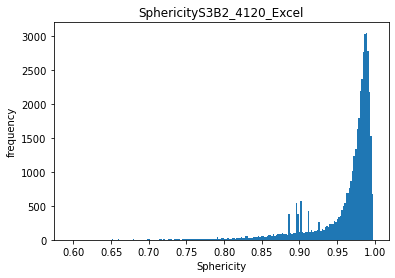

4
5


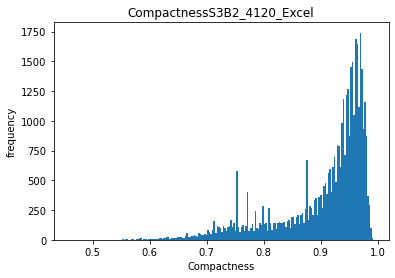

4
5


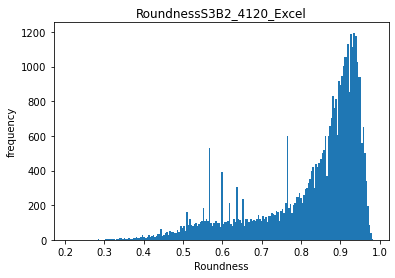

4
5


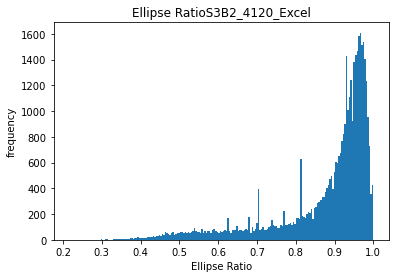

4
5


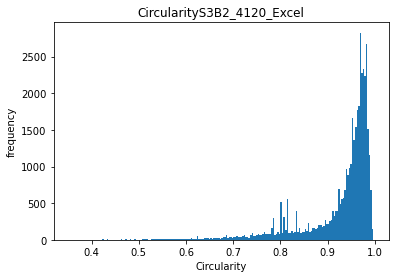

4
5


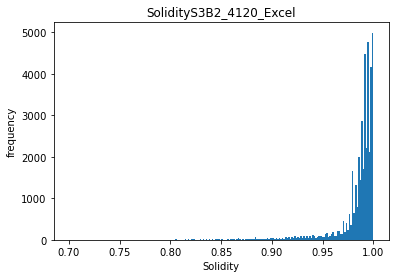

4
5


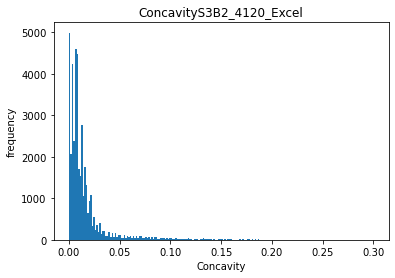

4
5


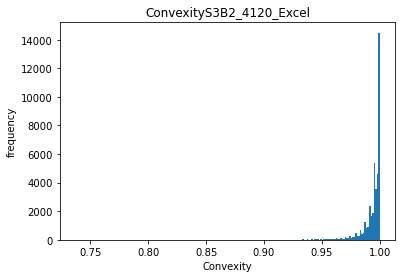

4
5


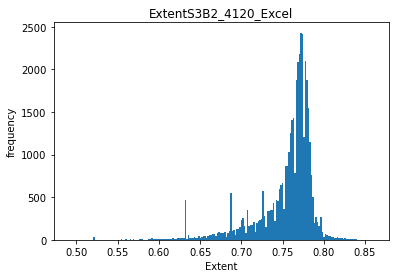

4
5


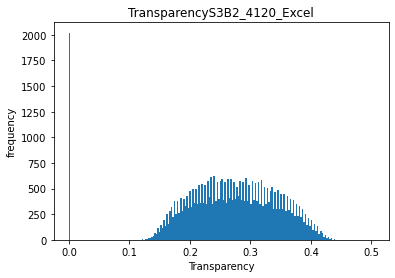

4
5


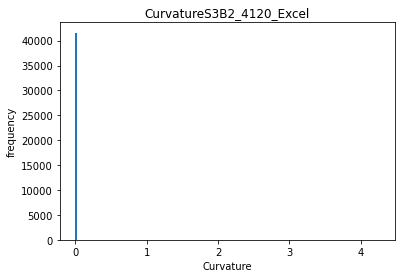

4
5


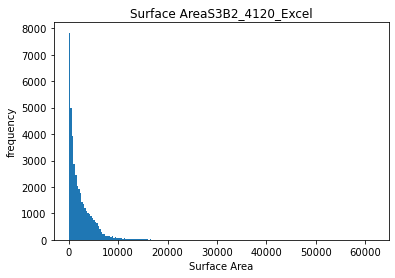

4
5


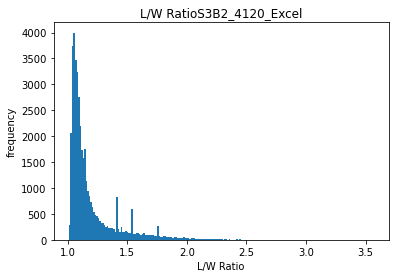

4
5


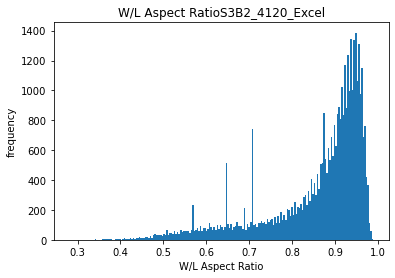

4
5


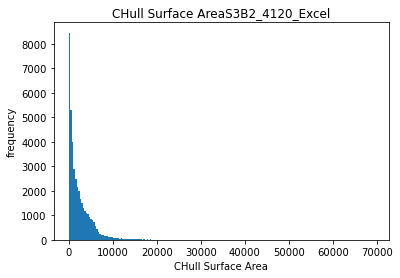

4
5


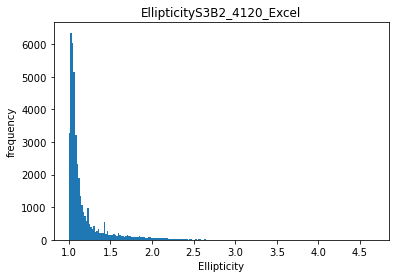

4
5


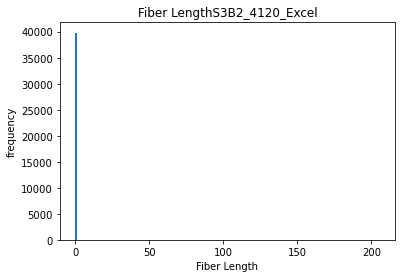

4
5


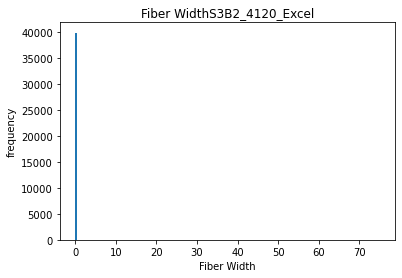

4
5


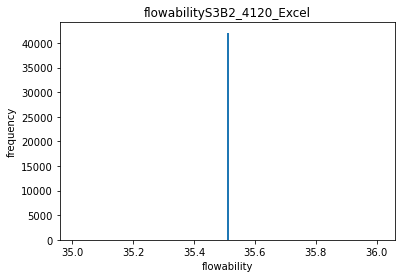

6
NAME:  S14B3_4420_Excel FLOW:                                     sample_id              name       Da  \
1453665  0c37c0c3-ebbb-4076-a032-c3baab8d21aa  S14B3_4420_Excel  138.341   
1453666  0c37c0c3-ebbb-4076-a032-c3baab8d21aa  S14B3_4420_Excel  140.054   
1453667  0c37c0c3-ebbb-4076-a032-c3baab8d21aa  S14B3_4420_Excel  123.743   
1453668  0c37c0c3-ebbb-4076-a032-c3baab8d21aa  S14B3_4420_Excel  120.241   
1453669  0c37c0c3-ebbb-4076-a032-c3baab8d21aa  S14B3_4420_Excel  108.983   
...                                       ...               ...      ...   
1495744  0c37c0c3-ebbb-4076-a032-c3baab8d21aa  S14B3_4420_Excel    3.591   
1495745  0c37c0c3-ebbb-4076-a032-c3baab8d21aa  S14B3_4420_Excel    3.708   
1495746  0c37c0c3-ebbb-4076-a032-c3baab8d21aa  S14B3_4420_Excel    3.472   
1495747  0c37c0c3-ebbb-4076-a032-c3baab8d21aa  S14B3_4420_Excel    3.395   
1495748  0c37c0c3-ebbb-4076-a032-c3baab8d21aa  S14B3_4420_Excel    3.646   

              Dp   FWidth  FLength  ELength   EWidth   

In [17]:
sample_ids = data['sample_id'].unique()
print(1)
for sample_id in sample_ids:
    print(2)
    powder = data[data.sample_id == sample_id]
    print(3)
#     for x in powder_df_list:
    for i in powder:
#         powder.plot(kind='hist', x=i, y=None, label=i, bins=100)
        print(4)
        plt.hist(powder[i], bins=200, range=None, density=False, weights=None, cumulative=False, bottom=None, histtype='bar', align='mid', orientation='vertical', rwidth=None, log=False, color=None, label=None, stacked=False, data=None)
        print(5)
        plt.title(i + name)
        plt.ylabel("frequency")
        plt.xlabel(i)
        plt.show()
        plt.close()
    print(6)
    name = data[data.sample_id == sample_id].iloc[0][data.columns[1]]
    number_of_particles = len(data[data.sample_id == sample_id])
    print("NAME: ", name, "FLOW:", powder, "ID:", sample_id)

In [72]:
print(sample_ids.shape[0])
print(data.shape[1])

30
32


1
2
3
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
6
NAME:  HC Starck C103H (10-45) Particles FLOW:                                   sample_id  \
0      125833a9-89a2-41bd-ab49-cff7c1600ce1   
1      125833a9-89a2-41bd-ab49-cff7c1600ce1   
2      125833a9-89a2-41bd-ab49-cff7c1600ce1   
3      125833a9-89a2-41bd-ab49-cff7c1600ce1   
4      125833a9-89a2-41bd-ab49-cff7c1600ce1   
...                                     ...   
84471  125833a9-89a2-41bd-ab49-cff7c1600ce1   
84472  125833a9-89a2-41bd-ab49-cff7c1600ce1   
84473  125833a9-89a2-41bd-ab49-cff7c1600ce1   
84474  125833a9-89a2-41bd-ab49-cff7c1600ce1   
84475  125833a9-89a2-41bd-ab49-cff7c1600ce1   

                                    name       Da       Dp   FWidth  FLength  \
0      HC Starck C103H (10-45) Particles  130.420  137.901  127.571  144.732   
1      HC Starck C103H (10-45) Particles  121.500  122.698  120.017  123.997   
2      HC St

3
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
6
NAME:  HC Starck C103N 2nd (10-45) Particles FLOW:                                    sample_id  \
240087  b92d4987-436a-469e-9e78-67e4e2d00648   
240088  b92d4987-436a-469e-9e78-67e4e2d00648   
240089  b92d4987-436a-469e-9e78-67e4e2d00648   
240090  b92d4987-436a-469e-9e78-67e4e2d00648   
240091  b92d4987-436a-469e-9e78-67e4e2d00648   
...                                      ...   
351989  b92d4987-436a-469e-9e78-67e4e2d00648   
351990  b92d4987-436a-469e-9e78-67e4e2d00648   
351991  b92d4987-436a-469e-9e78-67e4e2d00648   
351992  b92d4987-436a-469e-9e78-67e4e2d00648   
351993  b92d4987-436a-469e-9e78-67e4e2d00648   

                                         name      Da       Dp  FWidth  \
240087  HC Starck C103N 2nd (10-45) Particles  76.024   78.593  75.317   
240088  HC Starck C103N 2nd (10-45) Particles  96.014  105.267  71.290   
240089  HC Starck 

3
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
6
NAME:  I-718 (63-150) Particles FLOW:                                    sample_id                      name  \
370973  c1adc55e-0821-4408-b379-2d51b8e5c9ef  I-718 (63-150) Particles   
370974  c1adc55e-0821-4408-b379-2d51b8e5c9ef  I-718 (63-150) Particles   
370975  c1adc55e-0821-4408-b379-2d51b8e5c9ef  I-718 (63-150) Particles   
370976  c1adc55e-0821-4408-b379-2d51b8e5c9ef  I-718 (63-150) Particles   
370977  c1adc55e-0821-4408-b379-2d51b8e5c9ef  I-718 (63-150) Particles   
...                                      ...                       ...   
382500  c1adc55e-0821-4408-b379-2d51b8e5c9ef  I-718 (63-150) Particles   
382501  c1adc55e-0821-4408-b379-2d51b8e5c9ef  I-718 (63-150) Particles   
382502  c1adc55e-0821-4408-b379-2d51b8e5c9ef  I-718 (63-150) Particles   
382503  c1adc55e-0821-4408-b379-2d51b8e5c9ef  I-718 (63-150) Particles   
382504  c1adc55e

5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
6
NAME:  SS-17-4 (10-45) Particles FLOW:                                    sample_id                       name  \
453270  f28c1c6a-43d5-41cd-bd8b-10df1e639381  SS-17-4 (10-45) Particles   
453271  f28c1c6a-43d5-41cd-bd8b-10df1e639381  SS-17-4 (10-45) Particles   
453272  f28c1c6a-43d5-41cd-bd8b-10df1e639381  SS-17-4 (10-45) Particles   
453273  f28c1c6a-43d5-41cd-bd8b-10df1e639381  SS-17-4 (10-45) Particles   
453274  f28c1c6a-43d5-41cd-bd8b-10df1e639381  SS-17-4 (10-45) Particles   
...                                      ...                        ...   
536524  f28c1c6a-43d5-41cd-bd8b-10df1e639381  SS-17-4 (10-45) Particles   
536525  f28c1c6a-43d5-41cd-bd8b-10df1e639381  SS-17-4 (10-45) Particles   
536526  f28c1c6a-43d5-41cd-bd8b-10df1e639381  SS-17-4 (10-45) Particles   
536527  f28c1c6a-43d5-41cd-bd8b-10df1e639381  SS-17-4 (10-45) Particles   
536528  

3
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
6
NAME:  Ti-5Al-5V-5Mo-3Cr (0-75) Particles FLOW:                                    sample_id  \
548384  a19b8ce3-991e-4961-b7ea-5c4b9c1a6253   
548385  a19b8ce3-991e-4961-b7ea-5c4b9c1a6253   
548386  a19b8ce3-991e-4961-b7ea-5c4b9c1a6253   
548387  a19b8ce3-991e-4961-b7ea-5c4b9c1a6253   
548388  a19b8ce3-991e-4961-b7ea-5c4b9c1a6253   
...                                      ...   
559036  a19b8ce3-991e-4961-b7ea-5c4b9c1a6253   
559037  a19b8ce3-991e-4961-b7ea-5c4b9c1a6253   
559038  a19b8ce3-991e-4961-b7ea-5c4b9c1a6253   
559039  a19b8ce3-991e-4961-b7ea-5c4b9c1a6253   
559040  a19b8ce3-991e-4961-b7ea-5c4b9c1a6253   

                                      name       Da       Dp   FWidth  \
548384  Ti-5Al-5V-5Mo-3Cr (0-75) Particles  126.633  128.768  124.422   
548385  Ti-5Al-5V-5Mo-3Cr (0-75) Particles  102.498  104.457  100.175   
548386  Ti-5Al-5V-5Mo-3C

3
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
6
NAME:  Ti-Nb (0-63) Particles FLOW:                                    sample_id                    name      Da  \
569995  4d9d565d-98b4-4d5c-bb60-82a8d0c45abf  Ti-Nb (0-63) Particles   4.474   
569996  4d9d565d-98b4-4d5c-bb60-82a8d0c45abf  Ti-Nb (0-63) Particles  46.870   
569997  4d9d565d-98b4-4d5c-bb60-82a8d0c45abf  Ti-Nb (0-63) Particles  61.603   
569998  4d9d565d-98b4-4d5c-bb60-82a8d0c45abf  Ti-Nb (0-63) Particles  27.315   
569999  4d9d565d-98b4-4d5c-bb60-82a8d0c45abf  Ti-Nb (0-63) Particles  17.101   
...                                      ...                     ...     ...   
681823  4d9d565d-98b4-4d5c-bb60-82a8d0c45abf  Ti-Nb (0-63) Particles   9.890   
681824  4d9d565d-98b4-4d5c-bb60-82a8d0c45abf  Ti-Nb (0-63) Particles  20.864   
681825  4d9d565d-98b4-4d5c-bb60-82a8d0c45abf  Ti-Nb (0-63) Particles  14.941   
681826  4d9d565d-98b4-4d5c-bb60-

5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
6
NAME:  Ti-Nb-Zr (0-63) Particles FLOW:                                    sample_id                       name  \
691040  e14b6e01-c678-4a9e-ac78-46870c8f94bb  Ti-Nb-Zr (0-63) Particles   
691041  e14b6e01-c678-4a9e-ac78-46870c8f94bb  Ti-Nb-Zr (0-63) Particles   
691042  e14b6e01-c678-4a9e-ac78-46870c8f94bb  Ti-Nb-Zr (0-63) Particles   
691043  e14b6e01-c678-4a9e-ac78-46870c8f94bb  Ti-Nb-Zr (0-63) Particles   
691044  e14b6e01-c678-4a9e-ac78-46870c8f94bb  Ti-Nb-Zr (0-63) Particles   
...                                      ...                        ...   
787520  e14b6e01-c678-4a9e-ac78-46870c8f94bb  Ti-Nb-Zr (0-63) Particles   
787521  e14b6e01-c678-4a9e-ac78-46870c8f94bb  Ti-Nb-Zr (0-63) Particles   
787522  e14b6e01-c678-4a9e-ac78-46870c8f94bb  Ti-Nb-Zr (0-63) Particles   
787523  e14b6e01-c678-4a9e-ac78-46870c8f94bb  Ti-Nb-Zr (0-63) Particles   
787524  

3
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
6
NAME:  Valimet 1 Al F357.2 (25-75) Particles FLOW:                                    sample_id  \
800203  e00d84bd-e660-4fe3-84b5-2c8ad1b4fcd1   
800204  e00d84bd-e660-4fe3-84b5-2c8ad1b4fcd1   
800205  e00d84bd-e660-4fe3-84b5-2c8ad1b4fcd1   
800206  e00d84bd-e660-4fe3-84b5-2c8ad1b4fcd1   
800207  e00d84bd-e660-4fe3-84b5-2c8ad1b4fcd1   
...                                      ...   
846626  e00d84bd-e660-4fe3-84b5-2c8ad1b4fcd1   
846627  e00d84bd-e660-4fe3-84b5-2c8ad1b4fcd1   
846628  e00d84bd-e660-4fe3-84b5-2c8ad1b4fcd1   
846629  e00d84bd-e660-4fe3-84b5-2c8ad1b4fcd1   
846630  e00d84bd-e660-4fe3-84b5-2c8ad1b4fcd1   

                                         name       Da       Dp   FWidth  \
800203  Valimet 1 Al F357.2 (25-75) Particles  118.977  191.161  121.556   
800204  Valimet 1 Al F357.2 (25-75) Particles  100.375  157.049  117.076   
800205  Vali

3
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
6
NAME:  Valimet 4 Al P1015 (50-110) Particles FLOW:                                    sample_id  \
862151  bdb9311b-4dc0-4f20-ac1d-9b6ccafe80c8   
862152  bdb9311b-4dc0-4f20-ac1d-9b6ccafe80c8   
862153  bdb9311b-4dc0-4f20-ac1d-9b6ccafe80c8   
862154  bdb9311b-4dc0-4f20-ac1d-9b6ccafe80c8   
862155  bdb9311b-4dc0-4f20-ac1d-9b6ccafe80c8   
...                                      ...   
879237  bdb9311b-4dc0-4f20-ac1d-9b6ccafe80c8   
879238  bdb9311b-4dc0-4f20-ac1d-9b6ccafe80c8   
879239  bdb9311b-4dc0-4f20-ac1d-9b6ccafe80c8   
879240  bdb9311b-4dc0-4f20-ac1d-9b6ccafe80c8   
879241  bdb9311b-4dc0-4f20-ac1d-9b6ccafe80c8   

                                         name       Da       Dp   FWidth  \
862151  Valimet 4 Al P1015 (50-110) Particles  174.433  194.483  165.729   
862152  Valimet 4 Al P1015 (50-110) Particles  140.739  197.372  156.512   
862153  Vali

3
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
6
NAME:  S7B1_3720_Excel FLOW:                                    sample_id             name       Da  \
902533  36ff19bd-051a-4a02-ab66-400a9205f2da  S7B1_3720_Excel  164.658   
902534  36ff19bd-051a-4a02-ab66-400a9205f2da  S7B1_3720_Excel  149.085   
902535  36ff19bd-051a-4a02-ab66-400a9205f2da  S7B1_3720_Excel  117.771   
902536  36ff19bd-051a-4a02-ab66-400a9205f2da  S7B1_3720_Excel  108.682   
902537  36ff19bd-051a-4a02-ab66-400a9205f2da  S7B1_3720_Excel  107.610   
...                                      ...              ...      ...   
937136  36ff19bd-051a-4a02-ab66-400a9205f2da  S7B1_3720_Excel    3.201   
937137  36ff19bd-051a-4a02-ab66-400a9205f2da  S7B1_3720_Excel    4.786   
937138  36ff19bd-051a-4a02-ab66-400a9205f2da  S7B1_3720_Excel    4.055   
937139  36ff19bd-051a-4a02-ab66-400a9205f2da  S7B1_3720_Excel    4.168   
937140  36ff19bd-051a-4a0

3
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
6
NAME:  S9B1_3720_Excel FLOW:                                     sample_id             name       Da  \
1015287  a1d71e74-7dc7-47c4-a6d7-b28f0089cb95  S9B1_3720_Excel  147.613   
1015288  a1d71e74-7dc7-47c4-a6d7-b28f0089cb95  S9B1_3720_Excel  134.822   
1015289  a1d71e74-7dc7-47c4-a6d7-b28f0089cb95  S9B1_3720_Excel  128.200   
1015290  a1d71e74-7dc7-47c4-a6d7-b28f0089cb95  S9B1_3720_Excel  120.234   
1015291  a1d71e74-7dc7-47c4-a6d7-b28f0089cb95  S9B1_3720_Excel   99.092   
...                                       ...              ...      ...   
1032411  a1d71e74-7dc7-47c4-a6d7-b28f0089cb95  S9B1_3720_Excel    4.547   
1032412  a1d71e74-7dc7-47c4-a6d7-b28f0089cb95  S9B1_3720_Excel    3.760   
1032413  a1d71e74-7dc7-47c4-a6d7-b28f0089cb95  S9B1_3720_Excel    3.760   
1032414  a1d71e74-7dc7-47c4-a6d7-b28f0089cb95  S9B1_3720_Excel    3.558   
1032415  a1d71

3
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
6
NAME:  S11B1_3720_Excel FLOW:                                     sample_id              name       Da  \
1042645  fad449cb-5d3c-4051-9d68-ba811fe0a17f  S11B1_3720_Excel  119.677   
1042646  fad449cb-5d3c-4051-9d68-ba811fe0a17f  S11B1_3720_Excel  118.932   
1042647  fad449cb-5d3c-4051-9d68-ba811fe0a17f  S11B1_3720_Excel  114.027   
1042648  fad449cb-5d3c-4051-9d68-ba811fe0a17f  S11B1_3720_Excel  109.910   
1042649  fad449cb-5d3c-4051-9d68-ba811fe0a17f  S11B1_3720_Excel  108.748   
...                                       ...               ...      ...   
1053858  fad449cb-5d3c-4051-9d68-ba811fe0a17f  S11B1_3720_Excel    4.229   
1053859  fad449cb-5d3c-4051-9d68-ba811fe0a17f  S11B1_3720_Excel    3.983   
1053860  fad449cb-5d3c-4051-9d68-ba811fe0a17f  S11B1_3720_Excel    3.757   
1053861  fad449cb-5d3c-4051-9d68-ba811fe0a17f  S11B1_3720_Excel    4.471   
10

3
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
6
NAME:  S5B2_4120_Excel FLOW:                                     sample_id             name       Da  \
1176315  a532cffa-1e9e-44e4-acbf-30d59f3a080c  S5B2_4120_Excel  101.509   
1176316  a532cffa-1e9e-44e4-acbf-30d59f3a080c  S5B2_4120_Excel   94.763   
1176317  a532cffa-1e9e-44e4-acbf-30d59f3a080c  S5B2_4120_Excel   98.423   
1176318  a532cffa-1e9e-44e4-acbf-30d59f3a080c  S5B2_4120_Excel   94.128   
1176319  a532cffa-1e9e-44e4-acbf-30d59f3a080c  S5B2_4120_Excel   88.523   
...                                       ...              ...      ...   
1250037  a532cffa-1e9e-44e4-acbf-30d59f3a080c  S5B2_4120_Excel    3.491   
1250038  a532cffa-1e9e-44e4-acbf-30d59f3a080c  S5B2_4120_Excel    3.457   
1250039  a532cffa-1e9e-44e4-acbf-30d59f3a080c  S5B2_4120_Excel    3.371   
1250040  a532cffa-1e9e-44e4-acbf-30d59f3a080c  S5B2_4120_Excel    3.290   
1250041  a532c

5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
6
NAME:  S10B2_4120_Excel FLOW:                                     sample_id              name      Da  \
1273320  ec20d06a-9f8a-412a-b166-5e66797e4f20  S10B2_4120_Excel  71.090   
1273321  ec20d06a-9f8a-412a-b166-5e66797e4f20  S10B2_4120_Excel  69.310   
1273322  ec20d06a-9f8a-412a-b166-5e66797e4f20  S10B2_4120_Excel  62.334   
1273323  ec20d06a-9f8a-412a-b166-5e66797e4f20  S10B2_4120_Excel  68.133   
1273324  ec20d06a-9f8a-412a-b166-5e66797e4f20  S10B2_4120_Excel  76.237   
...                                       ...               ...     ...   
1354704  ec20d06a-9f8a-412a-b166-5e66797e4f20  S10B2_4120_Excel   3.610   
1354705  ec20d06a-9f8a-412a-b166-5e66797e4f20  S10B2_4120_Excel   3.579   
1354706  ec20d06a-9f8a-412a-b166-5e66797e4f20  S10B2_4120_Excel   3.413   
1354707  ec20d06a-9f8a-412a-b166-5e66797e4f20  S10B2_4120_Excel   3.618   
1354708  ec20d06a

5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
6
NAME:  S3B2_4120_Excel FLOW:                                     sample_id             name       Da  \
1386399  94d6d959-cb8e-4cad-8006-5a8f806a342a  S3B2_4120_Excel  244.440   
1386400  94d6d959-cb8e-4cad-8006-5a8f806a342a  S3B2_4120_Excel  194.071   
1386401  94d6d959-cb8e-4cad-8006-5a8f806a342a  S3B2_4120_Excel  182.943   
1386402  94d6d959-cb8e-4cad-8006-5a8f806a342a  S3B2_4120_Excel  161.192   
1386403  94d6d959-cb8e-4cad-8006-5a8f806a342a  S3B2_4120_Excel  159.245   
...                                       ...              ...      ...   
1453660  94d6d959-cb8e-4cad-8006-5a8f806a342a  S3B2_4120_Excel    4.062   
1453661  94d6d959-cb8e-4cad-8006-5a8f806a342a  S3B2_4120_Excel    4.117   
1453662  94d6d959-cb8e-4cad-8006-5a8f806a342a  S3B2_4120_Excel    3.238   
1453663  94d6d959-cb8e-4cad-8006-5a8f806a342a  S3B2_4120_Excel    3.699   
1453664  94d6d959-

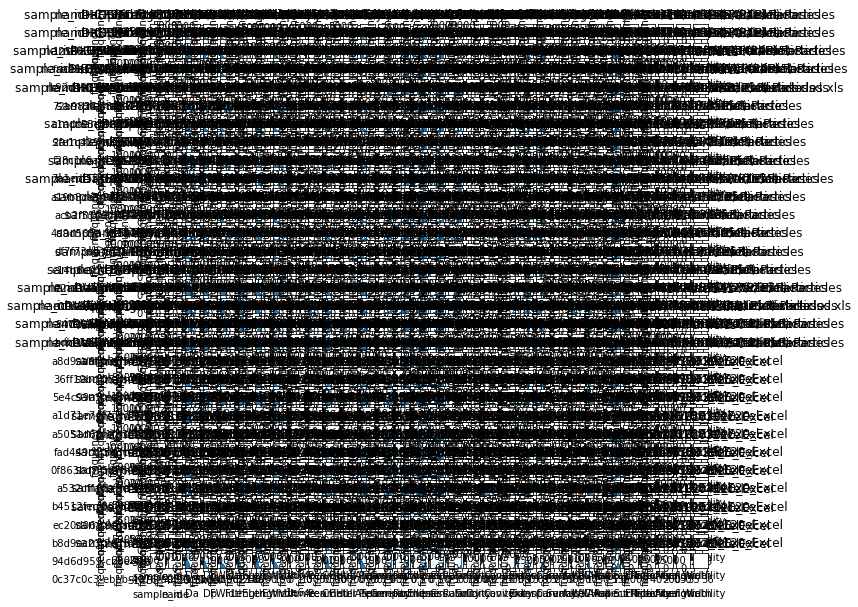

In [70]:
sample_ids = data['sample_id'].unique()
print(1)
fig, axes = plt.subplots(sample_ids.shape[0], data.shape[1], figsize=(10, 10))


axes_x = 0
axes_y = 0

for sample_id in sample_ids:
    print(2)
    powder = data[data.sample_id == sample_id]
    
#     for axes_1d in axes:
#         for ax in axes_1d:
#             ax.hist(np.random.uniform(0, 1, 100))
#             ax.set_title("Hi There")
    
    print(3)
#     for x in powder_df_list:
    for i in powder:
#         powder.plot(kind='hist', x=i, y=None, label=i, bins=100)
        print(4)
#         plt.hist(powder[i], bins=200, range=None, density=False, weights=None, cumulative=False, bottom=None, histtype='bar', align='mid', orientation='vertical', rwidth=None, log=False, color=None, label=None, stacked=False, data=None)
        axes[axes_x][axes_y].hist(powder[i], bins=200, range=None, density=False, weights=None, cumulative=False, bottom=None, histtype='bar', align='mid', orientation='vertical', rwidth=None, log=False, color=None, label=None, stacked=False, data=None)
        print(5)
        axes[axes_x][axes_y].set_title(i + name)
        axes[axes_x][axes_y].set_ylabel("frequency")
        axes[axes_x][axes_y].set_xlabel(i)
#         axes[axes_x][axes_y].show()
        axes_y = axes_y + 1
    print(6)
    name = data[data.sample_id == sample_id].iloc[0][data.columns[1]]
    number_of_particles = len(data[data.sample_id == sample_id])
    print("NAME: ", name, "FLOW:", powder, "ID:", sample_id)
    axes_x = axes_x + 1
    axes_y = 0
    
plt.show()

In [1]:
sample_ids = data['sample_id'].unique()
print(1)
fig, axes = plt.subplots(sample_ids.shape[0], data.shape[1], figsize=(100, 100))


axes_x = 0
axes_y = 0

for sample_id in sample_ids:
    print(2)
    powder = data[data.sample_id == sample_id]
    
#     for axes_1d in axes:
#         for ax in axes_1d:
#             ax.hist(np.random.uniform(0, 1, 100))
#             ax.set_title("Hi There")
    
    print(3)
#     for x in powder_df_list:
    for i in powder:
#         powder.plot(kind='hist', x=i, y=None, label=i, bins=100)
        print(4)
#         plt.hist(powder[i], bins=200, range=None, density=False, weights=None, cumulative=False, bottom=None, histtype='bar', align='mid', orientation='vertical', rwidth=None, log=False, color=None, label=None, stacked=False, data=None)
        axes[axes_x][axes_y].hist(powder[i], bins=200, range=None, density=False, weights=None, cumulative=False, bottom=None, histtype='bar', align='mid', orientation='vertical', rwidth=None, log=False, color=None, label=None, stacked=False, data=None)
        print(5)
#         axes[axes_x][axes_y].set_title(i + name)
#         axes[axes_x][axes_y].set_ylabel("frequency")
#         axes[axes_x][axes_y].set_xlabel(i)
#         axes[axes_x][axes_y].show()
        axes_y = axes_y + 1
    print(6)
    name = data[data.sample_id == sample_id].iloc[0][data.columns[1]]
    number_of_particles = len(data[data.sample_id == sample_id])
    print("NAME: ", name, "FLOW:", powder, "ID:", sample_id)
    axes_x = axes_x + 1
    axes_y = 0
    
plt.savefig("BigPlots3.png")
plt.show()

NameError: name 'data' is not defined

1
2
3
4
5


TypeError: 'AxesSubplot' object is not subscriptable

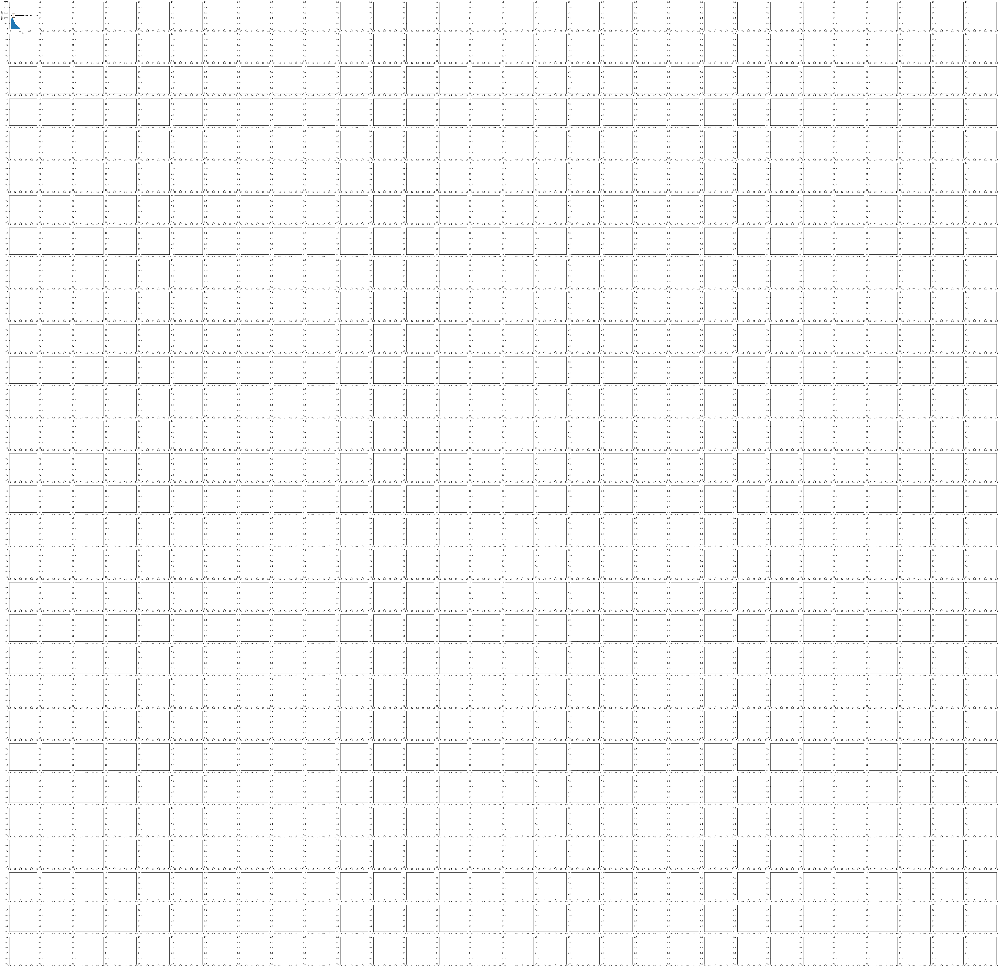

In [27]:
sample_ids = data['sample_id'].unique()
print(1)
fig, axes = plt.subplots(sample_ids.shape[0], data.shape[1] - 2, figsize=(100, 100))

no_outliers = data.copy()

no_outliers = no_outliers.drop(columns="sample_id")
no_outliers = no_outliers.drop(columns="name")

axes_x = 0
axes_y = 0

for sample_id in sample_ids:
    print(2)
    powder = data[data.sample_id == sample_id]
    
#     for axes_1d in axes:
#         for ax in axes_1d:
#             ax.hist(np.random.uniform(0, 1, 100))
#             ax.set_title("Hi There")

    powder = powder.drop(columns="sample_id")
    powder = powder.drop(columns="name")
    
    print(3)
#     for x in powder_df_list:
    for i in powder:
#         powder.plot(kind='hist', x=i, y=None, label=i, bins=100)
        print(4)
#         plt.hist(powder[i], bins=200, range=None, density=False, weights=None, cumulative=False, bottom=None, histtype='bar', align='mid', orientation='vertical', rwidth=None, log=False, color=None, label=None, stacked=False, data=None)
        axes[axes_x][axes_y].hist(powder[i], bins=200, range=None, density=False, weights=None, cumulative=False, bottom=None, histtype='bar', align='mid', orientation='vertical', rwidth=None, log=False, color=None, label=None, stacked=False, data=None)
#         axes[axes_x][axes_y].set_title(i + sample_id)
        axes[axes_x][axes_y].set_ylabel("frequency")
        axes[axes_x][axes_y].set_xlabel(i)
        print(5)
        caps = axes['caps']
        ax2 = axes[axes_x][axes_y].twinx()
#         ax2.boxplot(powder[i], vert=False, positions=axes[axes_x][axes_y].get_ylim())
        ax2.boxplot(powder[i], vert=False,)
        print([item.get_xdata()[0] for item in ax2['whiskers']])
        axes[axes_x][axes_y].axvline(x=np.median(powder[i]), c="green")
        axes[axes_x][axes_y].axvline(x=np.mean(powder[i]), c="purple")
#         axes[axes_x][axes_y].axvline(x=[item.get_ydata()[0] for item in ax2['whiskers']], c="red")
#         axes[axes_x][axes_y].axvline(x=[item.get_ydata()[1] for item in ax2['whiskers']], c="red")
#         ax2.set_ylim(axes[axes_x][axes_y].get_ylim())
        
#         axes[axes_x][axes_y].set_xticklabels(labels, rotation='horizontal')
#         
#         axes[axes_x][axes_y].show()
        axes_y = axes_y + 1
    print(6)
    name = data[data.sample_id == sample_id].iloc[0][data.columns[1]]
    number_of_particles = len(data[data.sample_id == sample_id])
    print("NAME: ", name, "FLOW:", powder, "ID:", sample_id)
    axes_x = axes_x + 1
    axes_y = 0
#     plt.show()
    
plt.savefig("BigPlots3.png")
plt.show()



In [25]:

no_zeroes = data.copy()

no_zeroes = no_zeroes.drop(columns="sample_id")
no_zeroes = no_zeroes.drop(columns="name")

for x in no_zeroes:
    print(x)
#     no_zeroes[x] = no_zeroes[x][ != 0]
    no_zeroes[x] = no_zeroes[x][no_zeroes[x] != 0]


print(no_zeroes)

Da
Dp
FWidth
FLength
ELength
EWidth
Volume
Area
Perimeter
CHull  Area
CHull Perimeter
Sphericity
Compactness
Roundness
Ellipse Ratio
Circularity
Solidity
Concavity
Convexity
Extent
Transparency
Curvature
Surface Area
L/W Ratio
W/L Aspect Ratio
CHull Surface Area
Ellipticity
Fiber Length
Fiber Width
flowability
              Da       Dp   FWidth  FLength  ELength   EWidth       Volume  \
0        130.420  137.901  127.571  144.732  135.160  126.204  1161540.824   
1        121.500  122.698  120.017  123.997  122.892  120.132   939140.686   
2        106.932  107.965  106.426  108.136  107.196  106.665   640206.991   
3         94.485  107.182   90.805  115.103  101.993   89.698   441665.721   
4         84.929   86.578   84.724   86.326   84.960   84.894   320754.683   
...          ...      ...      ...      ...      ...      ...          ...   
1495744    3.591    3.794    3.095    4.204    3.996    3.041       24.241   
1495745    3.708    3.989    3.051    4.512    4.140    3.094   

In [ ]:
no_outliers = data.copy()

no_outliers = no_outliers.drop(columns="sample_id")
no_outliers = no_outliers.drop(columns="name")

for x in no_outliers:
    print(x)
#     no_zeroes[x] = no_zeroes[x][ != 0]
    no_outliers[x] = no_outliers[x][no_outliers[x] != 0]


print(no_zeroes)

1
2
3
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
6
NAME:  HC Starck C103H (10-45) Particles FLOW:             Da       Dp   FWidth  FLength  ELength   EWidth       Volume  \
0      130.420  137.901  127.571  144.732  135.160  126.204  1161540.824   
1      121.500  122.698  120.017  123.997  122.892  120.132   939140.686   
2      106.932  107.965  106.426  108.136  107.196  106.665   640206.991   
3       94.485  107.182   90.805  115.103  101.993   89.698   441665.721   
4       84.929   86.578   84.724   86.326   84.960   84.894   320754.683   
...        ...      ...      ...      ...      ...      ...          ...   
84471    4.026    4.654    3.051    6.039    5.632    2.808       34.166   
84472    3.755    4.011    3.046    4.723    4.289    3.037       27.716   
84473    3.742    4.033    3.042    4.524    4.250    3.061       27.432   
84474    3.367    3.603    3.035    4.281    3.757    2.816      

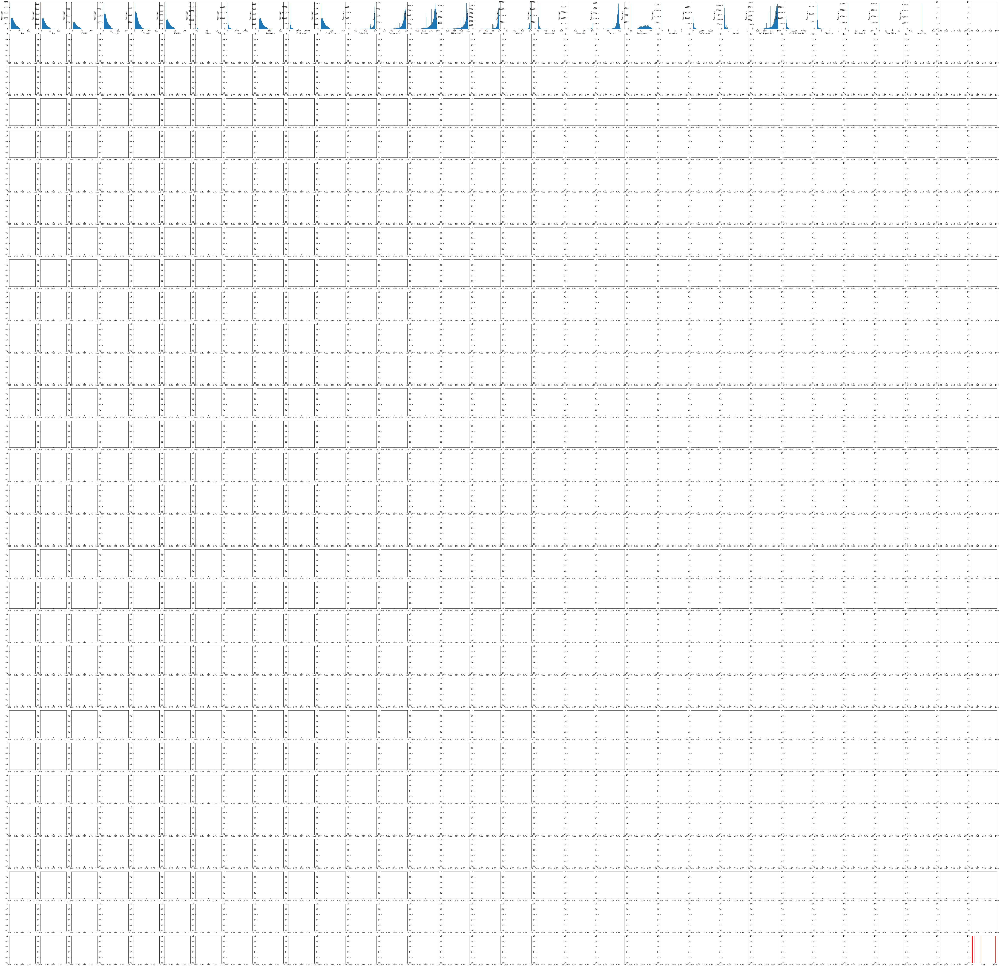

2
3
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
6
NAME:  HC Starck C103N 1st (10-45) Particles FLOW:              Da       Dp   FWidth  FLength  ELength   EWidth       Volume  \
84476   128.392  130.293  127.701  131.216  129.375  127.430  1108189.386   
84477   122.435  150.288  111.881  150.342  151.809  106.745   960979.730   
84478   112.177  115.172  110.179  118.251  113.856  110.678   739115.681   
84479   109.367  110.863  107.858  111.805  110.728  108.023   684944.895   
84480   105.683  106.484  105.238  106.615  106.198  105.163   618035.288   
...         ...      ...      ...      ...      ...      ...          ...   
240082    3.878    4.213    3.031    5.066    4.977    2.938       30.542   
240083    3.318    3.542    3.030    4.177    3.670    2.794       19.124   
240084    3.510    3.734    3.023    4.388    3.869    2.929       22.644   
240085    3.795    4.119    3.009    4.806    4.395  

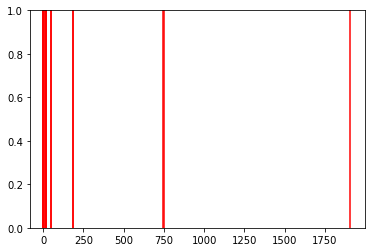

2
3
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
6
NAME:  HC Starck C103N 2nd (10-45) Particles FLOW:             Da       Dp  FWidth  FLength  ELength  EWidth      Volume  \
240087  76.024   78.593  75.317   77.576   76.774  75.276  230065.213   
240088  96.014  105.267  71.290  126.462  127.036  73.971  463452.306   
240089  70.646   71.665  70.222   72.004   71.392  69.895  184610.176   
240090  70.496   71.777  69.815   71.977   71.373  69.622  183437.242   
240091  69.369   70.656  68.604   71.277   70.226  68.537  174780.744   
...        ...      ...     ...      ...      ...     ...         ...   
351989   3.543    3.756   3.010    4.183    3.934   3.017      23.281   
351990   4.113    4.691   3.006    6.127    5.488   2.992      36.440   
351991   3.423    3.670   3.005    4.356    3.896   2.813      21.007   
351992   3.646    3.916   3.004    4.419    4.183   2.961      25.377   
351993   3.288    3.

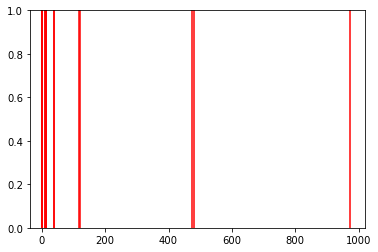

2
3
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
6
NAME:  HC Starck TaH (170-230) Particles.xls FLOW:              Da       Dp   FWidth  FLength  ELength   EWidth       Volume  \
351994  188.907  333.079  182.512  276.895  276.325  178.746  3529750.361   
351995  159.403  197.046  161.794  203.014  185.883  150.478  2120746.675   
351996  149.113  248.620  160.737  208.037  220.397  147.672  1735974.407   
351997  152.836  230.407  160.034  216.561  206.997  137.799  1869299.418   
351998  150.231  233.295  159.472  196.728  189.008  153.525  1775335.473   
...         ...      ...      ...      ...      ...      ...          ...   
370968    3.408    3.615    3.045    4.062    3.661    2.900       20.730   
370969    3.458    3.681    3.028    4.136    3.775    2.903       21.643   
370970    4.498    5.653    3.014    7.744    7.197    2.803       47.642   
370971    3.276    3.511    3.007    3.975    3.596  

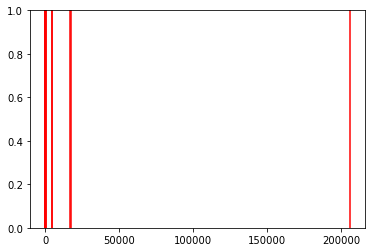

2
3
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
6
NAME:  I-718 (63-150) Particles FLOW:              Da       Dp   FWidth  FLength  ELength   EWidth       Volume  \
370973  202.759  274.572  180.906  274.168  287.516  170.328  4364571.521   
370974  199.458  257.770  139.780  307.086  317.704  133.494  4154848.222   
370975  199.429  300.902  209.586  293.715  302.534  177.321  4153028.917   
370976  191.063  332.558  179.083  314.211  332.310  158.486  3651980.181   
370977  187.263  253.572  155.507  272.097  285.883  143.219  3438365.522   
...         ...      ...      ...      ...      ...      ...          ...   
382500    3.742    4.148    3.740    4.272    3.939    3.674       27.432   
382501    3.531    3.895    3.168    4.738    4.058    3.019       23.052   
382502    3.519    4.455    3.524    5.286    4.687    3.042       22.817   
382503    3.519    4.455    3.524    5.286    4.687    3.042      

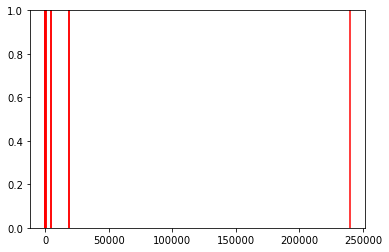

2
3
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
6
NAME:  Inconel 718 (0-63) Particles FLOW:             Da      Dp  FWidth  FLength  ELength  EWidth     Volume      Area  \
382505  51.542  52.259  49.748   55.672   53.492  49.747  71695.797  2086.507   
382506  42.473  43.259  40.860   45.282   43.704  41.451  40118.599  1416.842   
382507   4.219   4.762   3.740    5.286    4.289   4.289     39.324    13.981   
382508  21.403  21.739  20.247   22.982   22.477  20.415   5133.639   359.783   
382509  27.122  28.706  24.122   33.462   32.521  23.064  10445.898   577.725   
...        ...     ...     ...      ...      ...     ...        ...       ...   
453265  19.670  20.364  18.848   22.287   21.195  18.452   3984.877   303.879   
453266  31.423  32.213  30.712   32.923   32.115  30.726  16245.752   775.504   
453267  20.605  21.258  20.047   21.539   21.209  20.014   4580.678   333.460   
453268   6.839   6.967

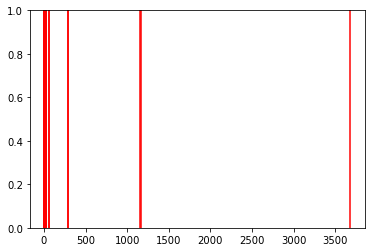

2
3
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
6
NAME:  SS-17-4 (10-45) Particles FLOW:             Da      Dp  FWidth  FLength  ELength  EWidth     Volume      Area  \
453270  25.912  26.493  25.446   27.077   26.507  25.410   9109.202   527.324   
453271  22.525  22.896  20.681   25.070   24.669  20.565   5984.334   398.506   
453272  31.910  35.223  23.923   40.647   43.439  24.200  17012.942   799.731   
453273  19.595  19.927  18.738   20.914   20.374  18.807   3939.573   301.571   
453274  43.259  44.355  40.100   48.623   47.118  39.817  42387.946  1469.780   
...        ...     ...     ...      ...      ...     ...        ...       ...   
536524  16.249  16.875  14.500   18.827   18.712  14.147   2246.230   207.361   
536525  12.376  15.009   8.769   19.987   19.783   7.976    992.588   120.301   
536526  38.958  41.121  32.874   45.830   45.938  33.101  30958.448  1192.002   
536527  34.897  35.291  3

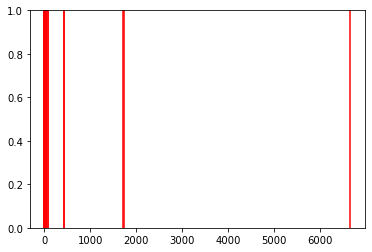

2
3
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
6
NAME:  SS-17-4 (64-150) Particles FLOW:             Da      Dp  FWidth  FLength  ELength  EWidth      Volume  \
536529  37.004  37.166  35.861   38.846   38.260  35.785   26529.685   
536530  93.169  99.637  79.615  110.822  106.885  82.860  423462.296   
536531  18.887  20.948  13.352   26.563   26.930  13.260    3527.449   
536532  77.761  78.787  71.991   85.304   84.099  71.898  246195.463   
536533  15.587  15.868  14.932   16.623   15.991  15.152    1982.945   
...        ...     ...     ...      ...      ...     ...         ...   
548379  19.007  20.281  17.236   22.562   22.209  16.513    3595.126   
548380  20.363  20.515  19.831   20.988   20.715  19.963    4420.797   
548381   5.399   5.673   4.486    6.764    6.344   4.435      82.401   
548382  71.121  73.045  64.954   79.173   77.085  65.848  188363.945   
548383  61.255  63.072  59.899   63.908   

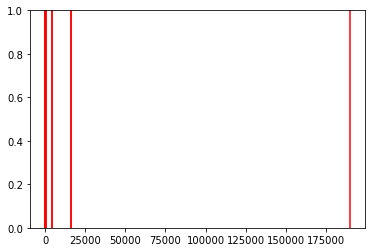

2
3
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
6
NAME:  Ti-5Al-5V-5Mo-3Cr (0-75) Particles FLOW:              Da       Dp   FWidth  FLength  ELength   EWidth       Volume  \
548384  126.633  128.768  124.422  129.537  128.830  124.475  1063257.800   
548385  102.498  104.457  100.175  105.921  105.048  100.010   563828.105   
548386  101.767  106.182   98.055  116.727  107.911   96.650   551840.263   
548387   85.013   86.920   80.810   88.920   88.438   81.879   321707.503   
548388   88.635   89.212   86.172   91.828   91.067   86.280   364595.469   
...         ...      ...      ...      ...      ...      ...          ...   
559036   78.138   91.709   77.753  100.704   87.358   74.682   249792.305   
559037  102.605  104.905  101.463  106.198  104.001  101.282   565586.571   
559038  122.170  167.346  107.640  177.606  172.722   94.872   954747.006   
559039  101.348  117.932   95.720  120.592  112.244   94

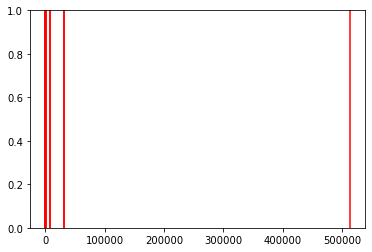

2
3
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
6
NAME:  Ti-64 (150-350) Particles FLOW:              Da       Dp   FWidth  FLength  ELength   EWidth        Volume  \
559041  490.355  786.231  425.448  713.479  685.486  390.170  6.173490e+07   
559042  425.877  797.075  415.398  628.047  560.802  397.203  4.044363e+07   
559043  401.262  581.275  306.555  561.422  608.366  300.852  3.382846e+07   
559044  382.705  660.986  416.273  571.205  549.548  368.267  2.934883e+07   
559045  380.547  587.030  355.171  573.932  568.994  316.166  2.885515e+07   
...         ...      ...      ...      ...      ...      ...           ...   
569990    3.519    4.455    3.524    5.286    4.687    3.042  2.281700e+01   
569991    3.519    4.455    3.524    5.286    4.687    3.042  2.281700e+01   
569992    3.519    4.455    3.524    5.286    4.687    3.042  2.281700e+01   
569993    3.501    3.852    3.196    4.660    3.986    

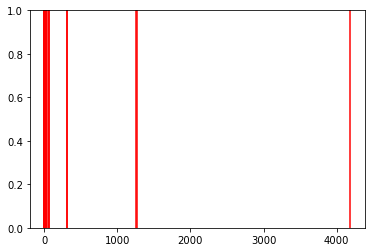

2
3
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
6
NAME:  Ti-Nb (0-63) Particles FLOW:             Da      Dp  FWidth  FLength  ELength  EWidth      Volume  \
569995   4.474   4.900   3.740    5.785    5.352   3.757      46.893   
569996  46.870  47.654  45.639   50.323   48.710  45.176   53911.553   
569997  61.603  79.140  54.603   93.266   89.975  49.989  122407.881   
569998  27.315  28.380  24.419   32.494   31.660  23.781   10670.964   
569999  17.101  17.283  16.478   18.454   17.916  16.264    2618.508   
...        ...     ...     ...      ...      ...     ...         ...   
681823   9.890  10.032   9.682   10.264    9.971   9.698     506.500   
681824  20.864  21.598  20.724   21.780   21.338  20.373    4755.140   
681825  14.941  15.721  12.620   17.893   17.998  12.375    1746.327   
681826   7.095   7.258   6.716    7.698    7.385   6.664     187.034   
681827   5.907   6.284   5.849    6.621    6.0

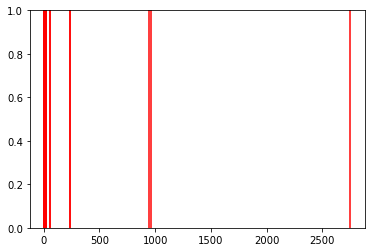

2
3
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
6
NAME:  Ti-Nb (64-150) Particles FLOW:              Da       Dp   FWidth  FLength  ELength   EWidth       Volume  \
681828  122.037  125.748  111.793  139.717  135.153  110.913   951645.830   
681829    7.079    7.207    6.617    7.607    7.382    6.685      185.725   
681830   88.159   88.924   87.305   89.239   88.588   87.730   358754.727   
681831   17.507   18.310   14.178   21.617   21.282   14.400     2809.612   
681832    7.037    7.382    6.540    8.244    7.761    6.285      182.435   
...         ...      ...      ...      ...      ...      ...          ...   
691035  116.171  118.141  112.149  123.173  120.581  112.036   820903.612   
691036   80.003   83.345   75.693   89.489   84.336   76.553   268111.543   
691037  157.071  172.288  135.061  189.799  188.754  131.563  2029012.618   
691038  141.106  145.365  137.395  148.754  143.118  139.594  1471

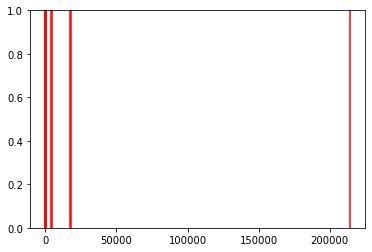

2
3
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
6
NAME:  Ti-Nb-Zr (0-63) Particles FLOW:             Da      Dp  FWidth  FLength  ELength  EWidth     Volume      Area  \
691040  14.990  15.545  13.970   16.646   16.422  13.701   1763.746   176.488   
691041  20.465  20.911  17.941   23.601   23.431  17.845   4487.612   328.928   
691042  25.039  25.266  24.623   25.726   25.292  24.749   8219.614   492.408   
691043  53.955  54.318  52.844   55.800   55.143  52.774  82241.345  2286.393   
691044  51.303  55.484  44.949   62.794   63.918  42.607  70701.140  2067.165   
...        ...     ...     ...      ...      ...     ...        ...       ...   
787520  30.676  34.342  23.518   41.250   42.367  22.598  15114.282   739.065   
787521  20.665  26.602  18.889   30.543   29.239  17.877   4620.926   335.411   
787522  24.756  25.341  23.138   28.219   27.223  22.610   7943.941   481.336   
787523   7.232   7.357   

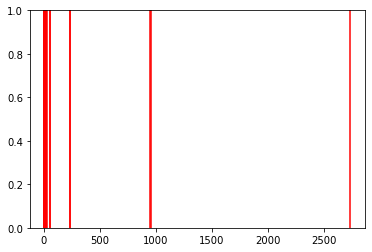

2
3
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
6
NAME:  Ti-Nb-Zr (64-150) Particles FLOW:              Da       Dp   FWidth  FLength  ELength   EWidth      Volume  \
787525  117.793  154.602   92.860  171.563  167.247   90.831  855761.933   
787526    6.858    7.000    6.484    7.284    7.068    6.511     168.862   
787527   24.683   25.577   21.914   29.049   28.638   21.468    7873.601   
787528   19.910   20.867   16.372   24.304   24.433   16.189    4132.217   
787529   81.636   90.097   77.749   96.428   87.565   79.705  284870.609   
...         ...      ...      ...      ...      ...      ...         ...   
800198    7.861    7.993    7.630    8.366    7.911    7.669     254.349   
800199   67.607   69.938   65.161   75.085   72.145   63.557  161801.548   
800200  122.993  171.732   99.265  201.305  196.161   86.875  974190.543   
800201   18.240   19.488   14.958   22.957   23.085   14.594    3177.218 

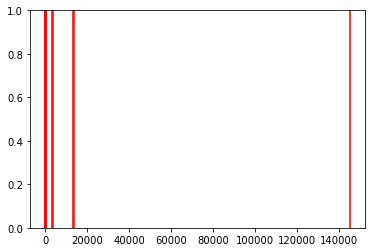

2
3
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
6
NAME:  Valimet 1 Al F357.2 (25-75) Particles FLOW:              Da       Dp   FWidth  FLength  ELength   EWidth      Volume  \
800203  118.977  191.161  121.556  166.726  169.779  114.336  881845.843   
800204  100.375  157.049  117.076  132.190  134.786  109.224  529506.374   
800205   99.184  153.905  106.128  133.009  129.799  107.913  510885.370   
800206   90.631  137.162   97.062  120.391  124.866   95.486  389792.087   
800207   91.529  118.461   94.545  114.992  119.312   82.185  401488.527   
...         ...      ...      ...      ...      ...      ...         ...   
846626    4.538    5.119    3.434    6.634    6.215    3.212      48.945   
846627    3.862    4.094    3.392    4.718    4.290    3.249      30.153   
846628    4.821    5.461    3.299    6.929    6.784    3.274      58.687   
846629    3.934    4.220    3.137    4.838    4.675    3.131   

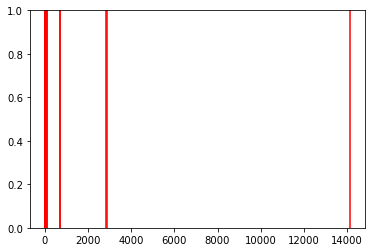

2
3
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
6
NAME:  Valimet 3 AA4047 (50-110) Particles.xls FLOW:              Da       Dp   FWidth  FLength  ELength   EWidth       Volume  \
846631  152.021  226.929  160.097  221.866  213.774  151.079  1839546.218   
846632  150.489  231.353  157.453  200.019  203.861  144.192  1784472.853   
846633  121.063  215.052  134.683  160.677  145.830  133.365   929027.057   
846634  114.805  186.456  130.307  158.068  144.065  128.788   792288.081   
846635  134.284  212.901  126.738  209.224  208.982  114.309  1267858.821   
...         ...      ...      ...      ...      ...      ...          ...   
862146   49.545   52.025   43.495   57.291   55.510   44.881    63678.779   
862147   45.491   46.227   43.492   48.881   47.568   43.546    49290.691   
862148   44.212   45.398   43.491   46.516   45.135   43.384    45248.540   
862149   51.535   53.219   43.490   60.433   60.124

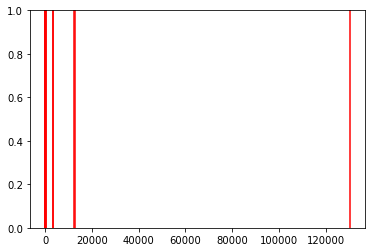

2
3
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
4
5
6


In [ ]:
sample_ids = data['sample_id'].unique()
print(1)
fig, axes = plt.subplots(sample_ids.shape[0], data.shape[1], figsize=(100, 100))


axes_x = 0
axes_y = 0

for sample_id in sample_ids:
    print(2)
    powder = data[data.sample_id == sample_id]
    
#     for axes_1d in axes:
#         for ax in axes_1d:
#             ax.hist(np.random.uniform(0, 1, 100))
#             ax.set_title("Hi There")

    powder = powder.drop(columns="sample_id")
    powder = powder.drop(columns="name")
    
    print(3)
#     for x in powder_df_list:
    for i in powder:
#         powder.plot(kind='hist', x=i, y=None, label=i, bins=100)
        print(4)
#         plt.hist(powder[i], bins=200, range=None, density=False, weights=None, cumulative=False, bottom=None, histtype='bar', align='mid', orientation='vertical', rwidth=None, log=False, color=None, label=None, stacked=False, data=None)
        axes[axes_x][axes_y].hist(powder[i], bins=200, range=None, density=False, weights=None, cumulative=False, bottom=None, histtype='bar', align='mid', orientation='vertical', rwidth=None, log=False, color=None, label=None, stacked=False, data=None)
#         axes[axes_x][axes_y].set_title(i + sample_id)
        axes[axes_x][axes_y].set_ylabel("frequency")
        axes[axes_x][axes_y].set_xlabel(i)
        print(5)
#         ax2 = axes[axes_x][axes_y].twinx()
#         ax2.boxplot(powder[i], vert=False, positions=axes[axes_x][axes_y].get_ylim())
#         ax2.boxplot(powder[i], vert=False,)
        plt.axvline(x=np.median(powder[i]), label="median", c="red")
#         ax2.set_ylim(axes[axes_x][axes_y].get_ylim())
        
#         axes[axes_x][axes_y].set_xticklabels(labels, rotation='horizontal')
#         
#         axes[axes_x][axes_y].show()
        axes_y = axes_y + 1
    print(6)
    name = data[data.sample_id == sample_id].iloc[0][data.columns[1]]
    number_of_particles = len(data[data.sample_id == sample_id])
    print("NAME: ", name, "FLOW:", powder, "ID:", sample_id)
    axes_x = axes_x + 1
    axes_y = 0
    plt.show()
    
plt.savefig("BigPlots3.png")
plt.show()

In [21]:
data

,sample_id,name,Da,Dp,FWidth,FLength,ELength,EWidth,Volume,Area,...,Transparency,Curvature,Surface Area,L/W Ratio,W/L Aspect Ratio,CHull Surface Area,Ellipticity,Fiber Length,Fiber Width,flowability
0,125833a9-89a2-41bd-ab49-cff7c1600ce1,HC Starck C103H (10-45) Particles,130.420,137.901,127.571,144.732,135.160,126.204,1161540.824,13359.199,...,0.156,0.0,53436.797,1.135,0.881,54531.951,1.071,0.0,0.0,0.00
1,125833a9-89a2-41bd-ab49-cff7c1600ce1,HC Starck C103H (10-45) Particles,121.500,122.698,120.017,123.997,122.892,120.132,939140.686,11594.301,...,0.148,0.0,46377.204,1.033,0.968,46577.919,1.023,0.0,0.0,0.00
2,125833a9-89a2-41bd-ab49-cff7c1600ce1,HC Starck C103H (10-45) Particles,106.932,107.965,106.426,108.136,107.196,106.665,640206.991,8980.581,...,0.157,0.0,35922.322,1.016,0.984,36065.966,1.005,0.0,0.0,0.00
3,125833a9-89a2-41bd-ab49-cff7c1600ce1,HC Starck C103H (10-45) Particles,94.485,107.182,90.805,115.103,101.993,89.698,441665.721,7011.645,...,0.218,0.0,28046.582,1.268,0.789,29928.731,1.137,0.0,0.0,0.00
4,125833a9-89a2-41bd-ab49-cff7c1600ce1,HC Starck C103H (10-45) Particles,84.929,86.578,84.724,86.326,84.960,84.894,320754.683,5665.081,...,0.171,0.0,22660.324,1.019,0.981,22849.100,1.001,0.0,0.0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495744,0c37c0c3-ebbb-4076-a032-c3baab8d21aa,S14B3_4420_Excel,3.591,3.794,3.095,4.204,3.996,3.041,24.241,10.127,...,0.395,0.0,40.506,1.358,0.736,40.506,1.314,0.0,0.0,35.51
1495745,0c37c0c3-ebbb-4076-a032-c3baab8d21aa,S14B3_4420_Excel,3.708,3.989,3.051,4.512,4.140,3.094,26.697,10.799,...,0.412,0.0,43.197,1.479,0.676,43.402,1.338,0.0,0.0,35.51
1495746,0c37c0c3-ebbb-4076-a032-c3baab8d21aa,S14B3_4420_Excel,3.472,3.709,3.048,4.077,3.692,3.026,21.910,9.466,...,0.439,0.0,37.866,1.337,0.748,37.866,1.220,0.0,0.0,35.51
1495747,0c37c0c3-ebbb-4076-a032-c3baab8d21aa,S14B3_4420_Excel,3.395,3.712,3.048,4.615,4.007,2.803,20.498,9.055,...,0.418,0.0,36.221,1.514,0.661,36.221,1.430,0.0,0.0,35.51


In [11]:
import random
r = lambda: random.randint(0,255)
print('#%02X%02X%02X' % (r(),r(),r()))

#930173


In [48]:
powder = {}

count = -1;

powder_df_list = []

for x in range (data.shape[0]):
    
    particle = data["sample_id"][x]
    
    if powder != particle:
        powder = particle
        count = count + 1;
        powder_df_list.append(data.iloc[[x]])
    else:
        powder_df_list[count].append(data.iloc[[x]])

In [49]:
print(type(powder_df_list))
print(type(powder_df_list[0]))

<class 'list'>
<class 'pandas.core.frame.DataFrame'>


In [53]:
powder_df_list

[                              sample_id                               name  \
 0  125833a9-89a2-41bd-ab49-cff7c1600ce1  HC Starck C103H (10-45) Particles   
 
        Da       Dp   FWidth  FLength  ELength   EWidth       Volume  \
 0  130.42  137.901  127.571  144.732   135.16  126.204  1161540.824   
 
         Area  ...  Transparency  Curvature  Surface Area  L/W Ratio  \
 0  13359.199  ...         0.156        0.0     53436.797      1.135   
 
    W/L Aspect Ratio  CHull Surface Area  Ellipticity  Fiber Length  \
 0             0.881           54531.951        1.071           0.0   
 
    Fiber Width  flowability  
 0          0.0          0.0  
 
 [1 rows x 32 columns],
                                   sample_id  \
 84476  faa13c82-0847-4652-aefd-d08862f38250   
 
                                         name       Da       Dp   FWidth  \
 84476  HC Starck C103N 1st (10-45) Particles  128.392  130.293  127.701   
 
        FLength  ELength  EWidth       Volume       Area  ...  T

In [51]:
for x in powder_df_list:
    for i in x:
        sID = x["sample_id"][i]
        x.plot(kind='hist', x=i, y=None, label=i + sID, bins=100)

KeyError: 'sample_id'

C:\Users\eadel\anaconda3\lib\site-packages\pandas\plotting\_matplotlib\core.py:337: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


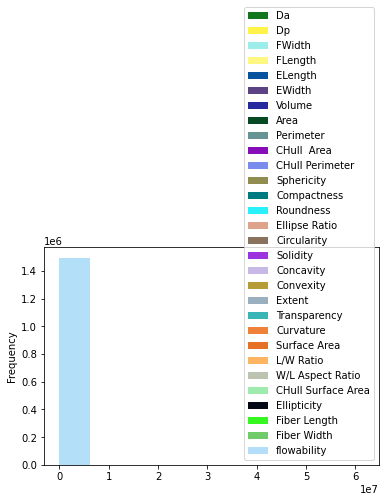

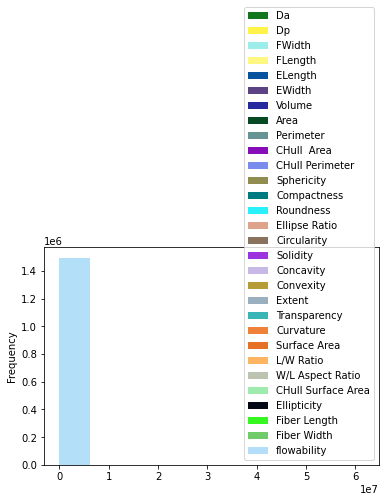

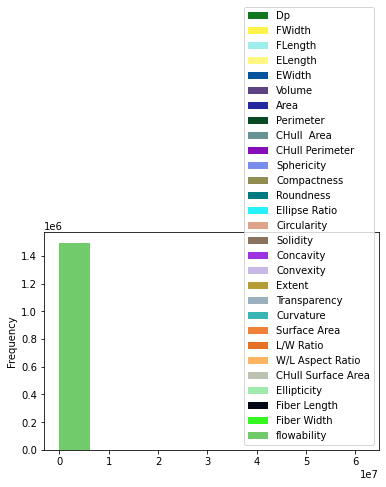

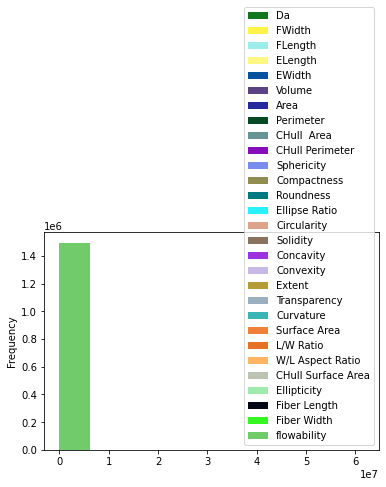

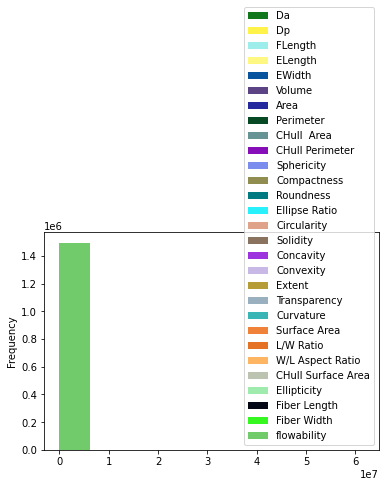

...

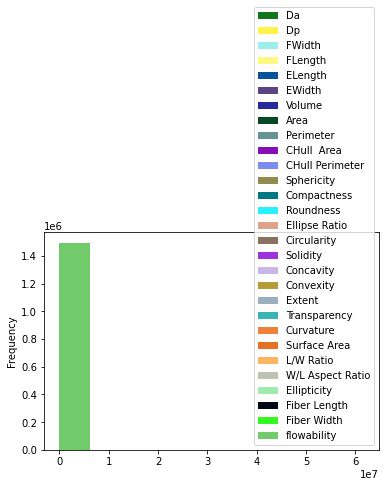

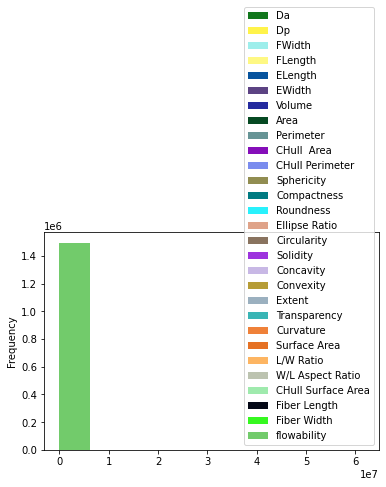

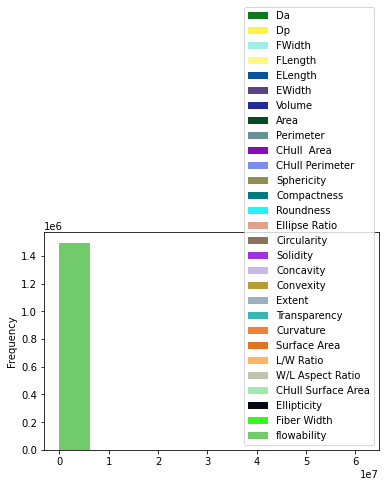

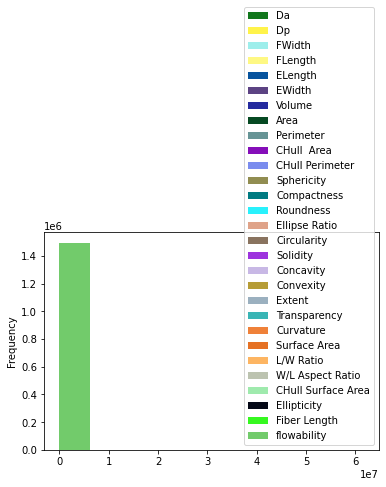

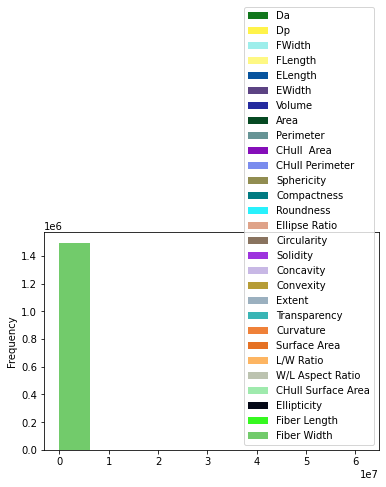

In [23]:
colors = cd.ColorDict()

color_list = []

powder = {}


for x in range (data.shape[0]):
    
    particle = data["sample_id"][x]
    
    if powder != particle:
        r = lambda: random.randint(0,255)
        color = '#%02X%02X%02X' % (r(),r(),r())
    
    color_list.append(color)
    
for x in data:
#     print(x)
#     print(data[x])
    data.plot(kind='hist', x=x, y=None, label=x, color=color_list)

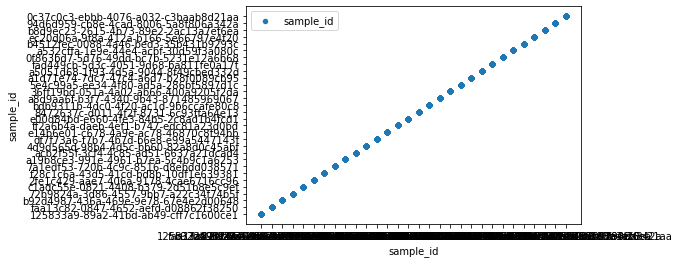

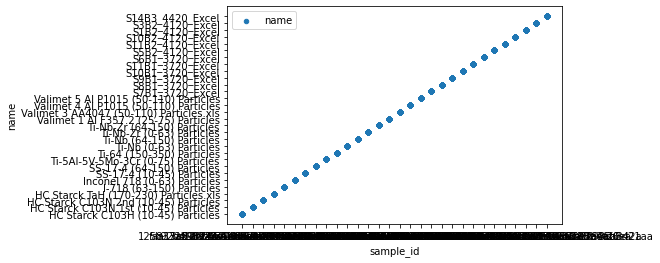

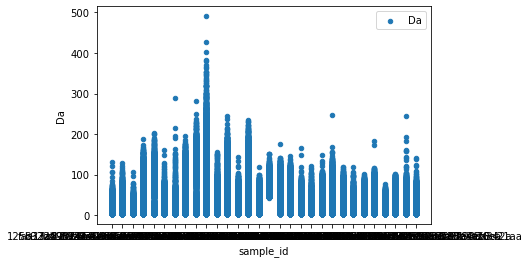

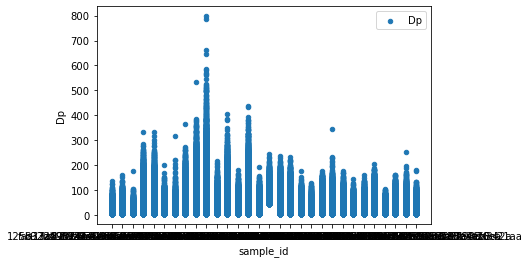

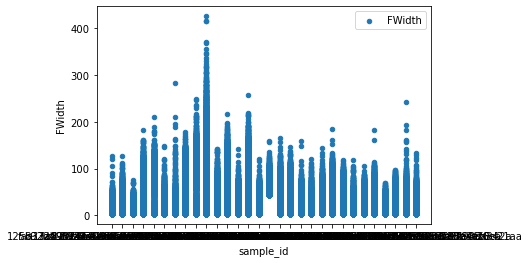

...

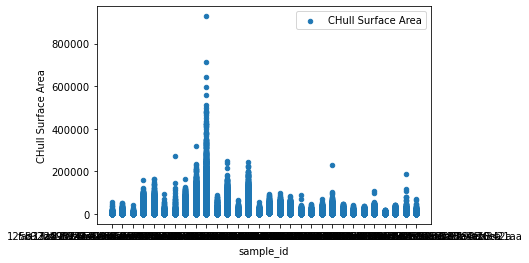

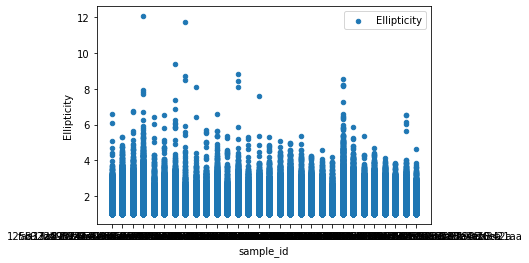

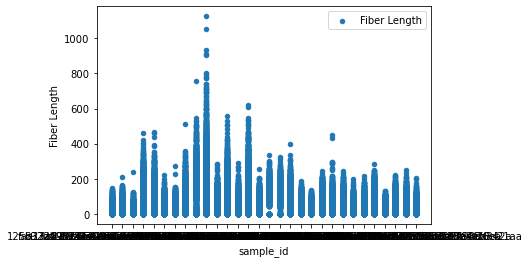

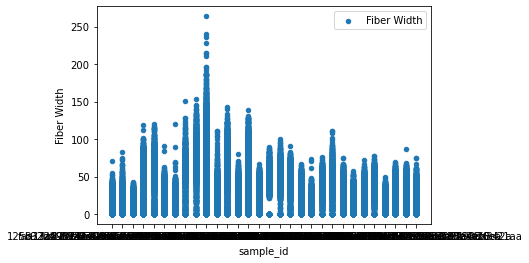

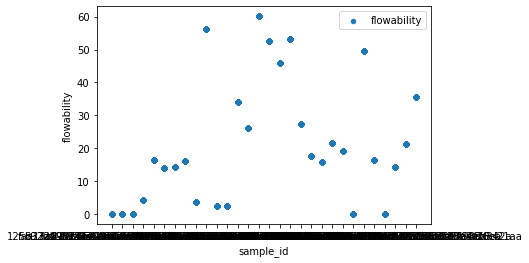

In [46]:
colors = cd.ColorDict()

color_list = []
# powder = data[sample_id][0]
# for x in range(data.length):
# #     print(x)
#     particle = data[sample.id][x]
#     if particle != powder:
#         powder = particle.copy()

#     r = lambda: random.randint(0,255)
#     color_list.append('#%02X%02X%02X' % (r(),r(),r()))


# for x in range(len(data.index)):
# #     print(x)
#     r = lambda: random.randint(0,255)
#     color_list.append('#%02X%02X%02X' % (r(),r(),r()))


for x in data:
#     print(x)
#     print(data[x])
    data.plot(kind='scatter', x="sample_id", y=x, label=x)

In [12]:
sns.pairplot(data, hue=None, hue_order=None, palette=None, vars=None, x_vars=None, y_vars=None, kind='scatter', diag_kind='auto', markers=None, height=2.5, aspect=1, corner=False, dropna=False, plot_kws=None, diag_kws=None, grid_kws=None, size=None)

Error in callback <function flush_figures at 0x000001EFAAFC2CA0> (for post_execute):


KeyboardInterrupt: 

In [1]:
# colors = np.where(data.col3 > 300, 'r', 'k')
# plt.scatter(data.col1, data.col2, s=120, c=colors)
# OR (with pandas 0.13 and up)
data.plot(kind='scatter', x='col1', y='col2', s=120, c=color_list)

NameError: name 'data' is not defined